In [1]:
import time
import os
import math
import cv2
import numpy as np
import pandas as pd
import pyautogui as pa
import shutil
import imageio
from PIL import Image, ImageDraw
import random
from scipy.stats import norm, kstest, sem, ttest_ind, linregress, ttest_ind_from_stats, ttest_1samp
from statsmodels.stats.anova import anova_lm
from statsmodels.formula.api import ols
import statsmodels.api as sm

from lib.analysis.trace_metrics import TraceMetrics
from lib.analysis.false_discovery_control import false_discovery_control
from lib.auto_GUI.auto_PhotoZ import AutoPhotoZ
from lib.analysis.laminar_dist import *
from lib.file.TIF import *
from lib.analysis.align import ImageAlign
from lib.utilities import *
from lib.file.ROI_writer import ROIFileWriter
from lib.file.ROI_reader import ROIFileReader
from lib.analysis.barrel_roi import Barrel_ROI_Creator
from lib.analysis.cell_roi import RandomROISample, OverlapCounterROI

In [2]:
# load trace files from the following directory
data_dir = "C:/Users/jjudge3/Desktop/Data/mm_full_pipeline_targets/current_NBQX_theta/10-23-24/"
nbqx_export_summary = data_dir + "export_summary_backup.csv"

output_fig_dir = 'P:/John/crossing-paper/input/'
camera_program = 4
um_per_px = 6.0 #um

In [3]:
# load CSV of all L4 and L2/3 crossing with NBQX blockade (array only CSV)
crossing_data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
crossing_data = pd.read_csv(crossing_data_dir + 'export_summary_crossing_PPR_array_only.csv')

def read_array_file(filename): 
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=None,
                                 names=['Index',  'Values'])
    return np.array(data_arr['Values']).reshape((80, 80))

def read_dat_trace_file(filename):
    data_arr = pd.read_csv(filename,
                                 sep='\t',
                                 header=0)  # change me to traces?
    data_arr = data_arr.apply(pd.to_numeric, errors='coerce')
    return data_arr

crossing_data

,Layer,drug,Date,Slice,Location,Recording,amp_array,ROI file,snr_array
0,L4,ACSF,12/9/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,NBQX,12/9/2024,2,3,3,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,ACSF,10/29/2024,1,1,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,10/29/2024,1,2,1,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L2/3,ACSF,10/23/2024,1,2,3,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L2/3,NBQX,10/23/2024,1,2,4,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/mm_full_pipeline...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L2/3,ACSF,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
7,L2/3,NBQX,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
8,L2/3,ACSF,7/1/2024,3,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
9,L2/3,NBQX,7/1/2024,3,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...


In [4]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df

nbqx_export_sagittal = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/sagittal_L4_NBQX/' + "export_summary_backup.csv"
hw_lat_sagittal_df = pd.read_csv(nbqx_export_sagittal)
hw_lat_sagittal_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,amp_array,snr_array,Rostral/Caudal,Layer,drug
0,1,2.101260,66.64650,51.0524,5.84029,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
1,2,1.138650,30.75740,51.7941,8.86817,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF
2,1,1.863310,47.13760,51.6354,7.20305,63.780875,33.171206,27.688716,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
3,2,0.446560,9.51275,52.0617,18.19140,182.778555,57.975089,52.832740,1_rois,1/15/2025,1,4,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,NBQX
4,1,22.877600,55.88170,52.6757,12.79720,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
5,2,4.549810,13.30700,54.6543,20.84750,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,ACSF
6,1,17.931500,49.08750,52.5286,9.55607,24.000000,60.593750,37.625000,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,NBQX
7,2,1.360260,5.49498,54.6159,6.92785,115.256236,34.826211,47.700855,2_rois,1/15/2025,2,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral,L4,NBQX
8,1,48.319700,53.74320,49.8735,8.69107,43.266615,55.612069,49.232759,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home,L4,ACSF
9,2,7.034680,37.30910,53.1874,21.11320,201.603571,36.433333,14.062963,3_rois,1/15/2025,3,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal,L4,ACSF


In [5]:

hw_lat_df['Section'] = 'Coronal'
hw_lat_sagittal_df['Section'] = 'Sagittal'

# merge the two hw_lat dataframes
hw_lat_df = pd.concat([hw_lat_df, hw_lat_sagittal_df], ignore_index=True)
hw_lat_df

,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,...,Slice,Location,Recording,Medial/Lateral,trace,Section,Stim_Distance,amp_array,snr_array,Rostral/Caudal
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,...,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,...,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,...,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,...,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,Coronal,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,L4,NBQX,2,1.760250,8.24925,52.0891,8.36272,54.714286,45.108466,1_rois,...,1,4,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,180.000000,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Caudal
100,L4,ACSF,1,23.183700,82.01480,52.2659,21.09000,58.769737,10.532895,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home
101,L4,ACSF,2,7.614200,15.49940,52.6995,NaN,46.979900,37.638191,2_rois,...,2,2,12,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,113.841996,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Rostral
102,L4,NBQX,1,11.954700,22.43890,51.6497,15.57760,58.769737,10.532895,2_rois,...,2,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Sagittal,42.426407,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/sag...,Home


In [6]:
# read in hw/lat/amp data
data_dir = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/'
hw_lat_data = data_dir + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6
hw_lat_df


,Layer,drug,ROI,amp,snr,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,Medial/Lateral,trace
0,L4,ACSF,1,1.208980,44.28930,1.1323,8.08166,50.551020,51.918367,1_rois,11/6/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
1,L4,ACSF,2,0.330953,6.90515,3.4924,26.12920,66.867374,28.713528,1_rois,11/6/2024,1,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
2,L4,NBQX,1,1.774300,75.77820,1.2188,4.78006,50.551020,51.918367,1_rois,11/6/2024,1,1,2,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
3,L4,NBQX,2,0.325975,7.08423,2.3590,5.69864,66.867374,28.713528,1_rois,11/6/2024,1,1,2,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
4,L4,ACSF,1,1.488840,68.13480,1.6920,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
5,L4,ACSF,2,0.983708,39.26490,4.9494,12.78330,29.060606,33.034091,1_rois,12/9/2024,1,1,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
6,L4,NBQX,1,0.000000,0.00000,NaN,6.25805,55.466877,41.141956,1_rois,12/9/2024,1,3,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
7,L4,NBQX,2,0.053680,1.00786,5.2739,2.54030,29.060606,33.034091,1_rois,12/9/2024,1,3,1,Medial,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
8,L4,ACSF,1,14.255900,56.77760,1.5938,8.15259,40.464912,49.561404,2_rois,12/9/2024,2,1,1,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...
9,L4,ACSF,2,3.041910,23.21550,2.3892,15.21730,51.851974,29.101974,2_rois,12/9/2024,2,1,1,Lateral,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...


c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


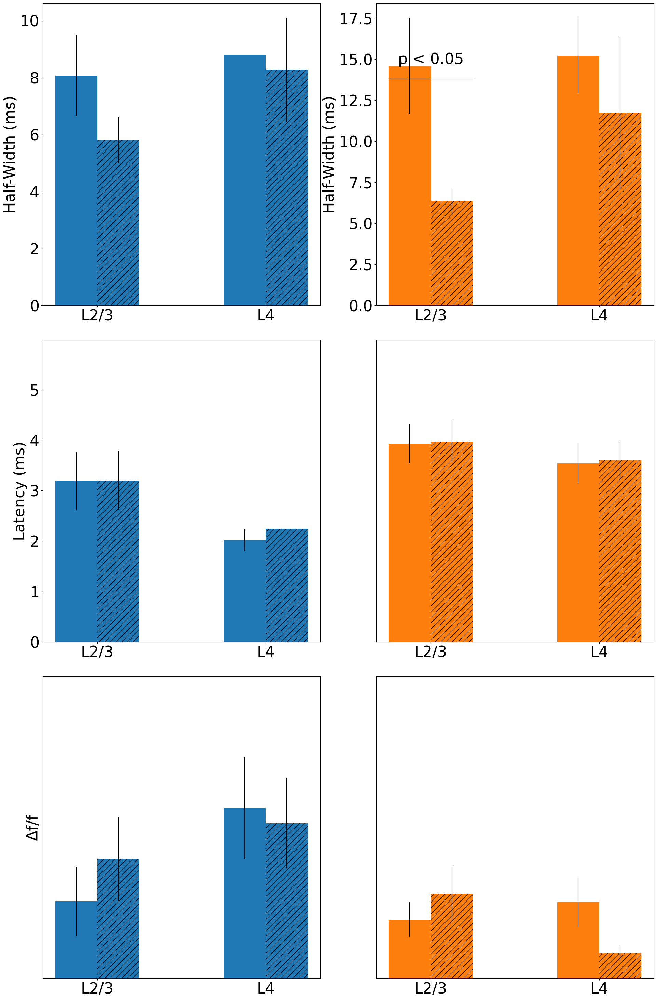

In [7]:
# plot the data, comparing L2/3 to L4 and ACSF to NBQX and home (ROI == 1) to neighbor (ROI > 1)

# font size
plt.rcParams.update({'font.size': 32})

fig, ax = plt.subplots(3, 2, figsize=(20, 30))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']

handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        
        hatch = '//' if d == 'NBQX' else None
        for roi in [1, 2]:
            col = 'tab:blue' if roi == 1 else 'tab:orange'
            roi_df = hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == d) & (hw_lat_df['ROI'] == roi)]
            l = ax[0][roi-1].bar([i + j/4-.125], np.mean(roi_df['halfwidth']), yerr=sem(roi_df['halfwidth']), label=drug, width=.25, color=col, hatch=hatch)
            ax[1][roi-1].bar([i + j/4-.125], np.mean(roi_df['latency']), yerr=sem(roi_df['latency']), label=drug, width=.25, color=col, hatch=hatch)
            ax[2][roi-1].bar([i + j/4-.125], np.mean(roi_df['amp']), yerr=sem(roi_df['amp']), label=drug, width=.25, color=col, hatch=hatch)
            handles.append(l)
        
ax[0][0].set_ylabel('Half-Width (ms)')
ax[1][0].set_ylabel('Latency (ms)')
ax[2][0].set_ylabel('Δf/f')

for i in range(2):
    for j in range(3):
        ax[j][i].set_xticks([0, 1])
        ax[j][i].set_xticklabels(layers)

# autoscale y-axis for each pair of subplots togethere
for i in range(1,3):
    y_max = max(ax[i][0].get_ylim()[1], ax[i][1].get_ylim()[1]) * 1.3
    ax[i][0].set_ylim(0, y_max)
    ax[i][1].set_ylim(0, y_max)
    ax[i][1].set_yticks([])
ax[2][0].set_yticks([])

# significance testing
for i, layer in enumerate(layers):
    for roi in [1, 2]:
        for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
            t_stat, p_val = ttest_ind(hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'ACSF') & (hw_lat_df['ROI'] == roi)][metric],
                                      hw_lat_df[(hw_lat_df['Layer'] == layer) & (hw_lat_df['drug'] == 'NBQX') & (hw_lat_df['ROI'] == roi)][metric])
            if p_val < 0.05:
                ax[j][roi-1].text((i), ax[j][roi-1].get_ylim()[1] * 0.8, 'p < 0.05', ha='center')

                # draw bar between ACSF and NBQX
                ax[j][roi-1].plot([i -.25, i + .25], [ax[j][roi-1].get_ylim()[1] * 0.75, ax[j][roi-1].get_ylim()[1] * 0.75], color='black')
            #else:
            #    ax[j][roi-1].text((i + .125), ax[j][roi-1].get_ylim()[1] * 0.8, str(p_val)[:5], ha='center')

handles = [handles[1], handles[3]]
#ax[0][1].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
ax[0][1].set_ylabel('Half-Width (ms)')
#ax[0][0].set_title('Home Barrel')
#ax[0][1].set_title('Neighbor Barrel')
plt.tight_layout()
plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp.png')
plt.show()


In [8]:
# load pulse 2 ladder data

# load C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR_ladder_pulse_2\export_summary_pulse_2.csv
ppr_ladder_pulse_2_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/export_summary_pulse_2.csv'
ppr_ladder_pulse_2_df = pd.read_csv(ppr_ladder_pulse_2_csv)
# add Drug and Layer columns to the dataframe
ppr_ladder_pulse_2_df['drug'] = 'ACSF'
ppr_ladder_pulse_2_df['Layer'] = 'L4'

# format date to m/d/yyyy in ppr_ladder_pulse_2_df
try:
    ppr_ladder_pulse_2_df['Date'] = pd.to_datetime(ppr_ladder_pulse_2_df['Date'], format='%m-%d-%Y').dt.strftime('%#m/%#d/%Y')
except ValueError:  # formatted already
    pass

# add new columns Coronal/Sagittal and IPI to the dataframe
ppr_ladder_pulse_2_df['Coronal/Sagittal'] = np.nan
ppr_ladder_pulse_2_df['IPI'] = np.nan
ppr_ladder_pulse_2_df['Is_Pulse_2'] = True

# load C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR_ladder_pulse_2\ppr_catalog_backup.csv
ppr_ladder_pulse_2_catalog_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/ppr_catalog_backup.csv'
ppr_ladder_pulse_2_catalog_df = pd.read_csv(ppr_ladder_pulse_2_catalog_csv)

# use catalog to fill Coronal/Sagittal and IPI columns in ppr_ladder_pulse_2_df
for row in ppr_ladder_pulse_2_catalog_df.iterrows():
    zda_file = row[1]['zda_file'] # format is C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder_pulse_2/PPR_coronal_annotated\01-02-25\converted_zda/01_03_01.zda
    # get the date from the file name
    date = os.path.basename(os.path.dirname(os.path.dirname(zda_file))) # format is 01-02-25
    # format the date to m/d/yyyy
    date = pd.to_datetime(date, format='%m-%d-%y').strftime('%#m/%#d/%Y')
    # get the slice from the file name
    slic_loc_rec = zda_file.split("/")[-1].replace(".zda", "") 
    slic = int(slic_loc_rec.split("_")[0]) 
    loc = int(slic_loc_rec.split("_")[1])
    rec = int(slic_loc_rec.split("_")[2])

    #print(f"Checking {date} {slic} {loc} {rec} in ppr_ladder_pulse_2_df")
    #print(row[1]['Coronal/Sagittal'], row[1]['IPI'])
    #print(ppr_ladder_pulse_2_df['Date'].unique())

    # store Coronal/Sagittal
    ppr_ladder_pulse_2_df.loc[(ppr_ladder_pulse_2_df['Date'] == date) & (ppr_ladder_pulse_2_df['Slice'] == slic) &
                                        (ppr_ladder_pulse_2_df['Location'] == loc) & (ppr_ladder_pulse_2_df['Recording'] == rec), 'Coronal/Sagittal'] = row[1]['Coronal/Sagittal']

    # store IPI
    ppr_ladder_pulse_2_df.loc[(ppr_ladder_pulse_2_df['Date'] == date) & (ppr_ladder_pulse_2_df['Slice'] == slic) &
                                        (ppr_ladder_pulse_2_df['Location'] == loc) & (ppr_ladder_pulse_2_df['Recording'] == rec), 'IPI'] = row[1]['IPI']
              
ppr_ladder_pulse_2_df

,ROI,amp,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2
0,1,0.447418,184.746,6.98220,284.541737,63.000000,54.790698,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
1,2,0.413064,184.684,9.99002,268.663358,60.743902,52.841463,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
2,3,0.393519,184.871,10.25910,266.308092,58.702381,50.702381,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
3,4,0.424824,184.181,17.29830,250.710989,56.588235,48.600000,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
4,5,0.511221,183.866,7.74091,235.304059,54.157303,46.741573,1_rois_output__ladder_ pulse1,2/5/2025,1,3,16,ACSF,L4,Sagittal,80.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7739,21,0.392233,178.747,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7740,22,0.710792,177.487,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7741,23,1.011800,178.461,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True
7742,24,1.046040,178.175,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,3,2,25,ACSF,L4,Sagittal,120.0,True


In [9]:
# velocity analysis 
# read in velocity ladders
ladder_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_ladders.csv'
ladder_df = pd.read_csv(ladder_csv)
ladder_df['latency'] -= 48.6

# fold in some more ladder data from PPR_ladder directory 
ladder_csv_2 = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR_ladder/export_summary_ladder_backup.csv'
ladder_df_2 = pd.read_csv(ladder_csv_2)
ladder_df_2['latency'] -= 48.6  # some of the data is stimulated at a different time point, but deltas are the same

# format m-d-yy to m/d/yyyy in ladder_df_2
#ladder_df_2['Date'] = pd.to_datetime(ladder_df_2['Date'], format='%m-%d-%Y').dt.strftime('%#m/%#d/%Y')

# before merging, remove any rows that are in both dataframes from the second dataframe (match on date/slice alone)
for row in ladder_df_2.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    #print(f"Checking {date} {slic} in ladder_df_2")
    if len(ladder_df[(ladder_df['Date'] == date) & (ladder_df['Slice'] == slic)]) > 0:
        ladder_df_2.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} from ladder_df_2")

# merge the dataframes
ladder_df = pd.concat([ladder_df, ladder_df_2, ppr_ladder_pulse_2_df], ignore_index=True) # , 

# add a new column Dist_from_home_barrel
ladder_df['Dist_from_home_barrel'] = np.nan

# add a new column resides_in_barrel
ladder_df['resides_in_barrel'] = np.nan

# and for velocity
ladder_df['instantaneous_velocity'] = np.nan

ladder_df

Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 2 from ladder_df_2
Removing 12/11/2024 3 from ladder_df_2
Removing 12/11/2024 3 fro

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,Recording,trace,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,25,NaN,ACSF,L4,Sagittal,120.0,True,NaN,NaN,NaN


In [10]:
# also load export_summary_backup_coronal.csv and export_summary_backup_sagittal.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\PPR\
coronal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
coronal_ppr_df_ = pd.read_csv(coronal_ppr_csv)

sagittal_ppr_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_sagittal.csv'
sagittal_ppr_df_ = pd.read_csv(sagittal_ppr_csv)

# merge the two dataframes
ppr_df_for_roi_lookup = pd.concat([coronal_ppr_df_, sagittal_ppr_df_], ignore_index=True)
# split column 'ROI_Set'
ppr_df_for_roi_lookup['ROI file'] =  ppr_df_for_roi_lookup['ROI_Set'].str.split(' ', expand=True)[0]

# file ROI_File should be located in the same directory as the file named in 'trace'
for row in ppr_df_for_roi_lookup.iterrows():
    # get the trace file name
    trace_file = row[1]['trace']
    # get the directory of the trace file
    trace_dir = os.path.dirname(trace_file)
    # get the ROI file name
    roi_file = row[1]['ROI file'] + '.dat'
    # set the ROI file to be in the same directory as the trace file
    ppr_df_for_roi_lookup.at[row[0], 'ROI file'] = os.path.join(trace_dir, roi_file)

# add Drug and Layer columns to the dataframe
ppr_df_for_roi_lookup['drug'] = 'ACSF'
ppr_df_for_roi_lookup['Layer'] = 'L4'

In [11]:
# re-run from here down to fill in the missing velocity data

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
0   ACSF             368.804275          Neighbor                     NaN
1   ACSF             350.406813          Neighbor                     NaN
2   ACSF             332.813666              None                     NaN
3   ACSF             315.415427          Neighbor                     NaN
4   ACSF             297.374375          Neighbor                     NaN
5   ACSF             279.851153          Neighbor                     NaN
6   ACSF             262.228860              None                     NaN
7   ACSF             244.477962              None                     NaN
8   ACSF             227.111196              Home                     NaN
9   ACSF             209.423158              Home                     NaN
10  ACSF             191.869523              Home                     NaN
11  ACSF             174.604558              None                     NaN
12  ACSF             157.098163       

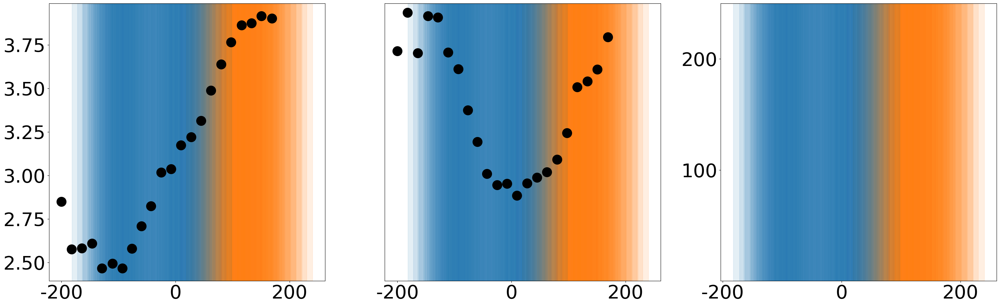

    drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
44  ACSF             432.360313              None                     NaN
45  ACSF             413.968936          Neighbor                     NaN
46  ACSF             396.094787          Neighbor                     NaN
47  ACSF             377.720002          Neighbor                     NaN
48  ACSF             359.836074          Neighbor                     NaN
49  ACSF             342.048598          Neighbor                     NaN
50  ACSF             323.703811          Neighbor                     NaN
51  ACSF             305.783042              None                     NaN
52  ACSF             288.033470          Neighbor                     NaN
53  ACSF             269.651701          Neighbor                     NaN
54  ACSF             251.769816              None                     NaN
55  ACSF             233.970567              None                     NaN
56  ACSF             215.651086       

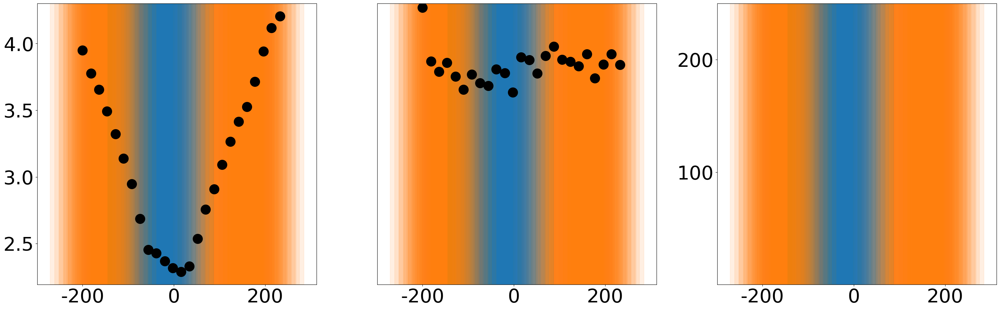

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
94   ACSF             430.110289              Home                     NaN
95   ACSF             412.117602              Home                     NaN
96   ACSF             394.132599              Home                     NaN
97   ACSF             376.118750              Home                     NaN
98   ACSF             358.136633              Home                     NaN
99   ACSF             340.142618              None                     NaN
100  ACSF             322.149272              None                     NaN
101  ACSF             304.164079              None                     NaN
102  ACSF             286.178974          Neighbor                     NaN
103  ACSF             268.287578          Neighbor                     NaN
104  ACSF             250.396800          Neighbor                     NaN
105  ACSF             232.419083          Neighbor                     NaN
106  ACSF             214

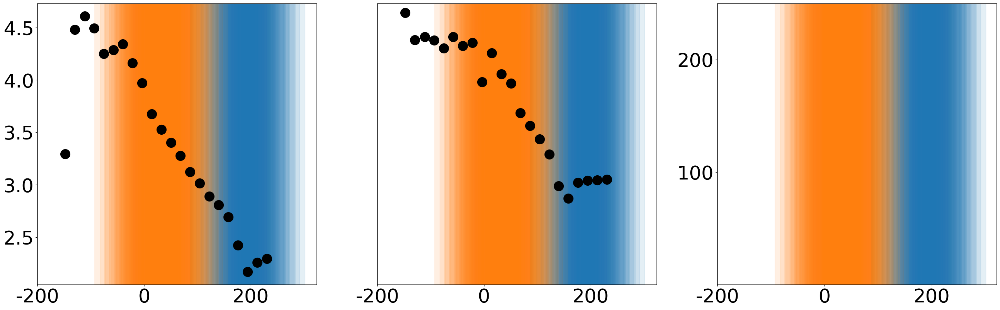

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
144  ACSF             495.611372              None                     NaN
145  ACSF             477.348251              None                     NaN
146  ACSF             459.094541              None                     NaN
147  ACSF             442.211303              None                     NaN
148  ACSF             423.996236              None                     NaN
149  ACSF             405.913844              None                     NaN
150  ACSF             387.603256              None                     NaN
151  ACSF             369.416103              None                     NaN
152  ACSF             352.539156              Home                     NaN
153  ACSF             334.383018              Home                     NaN
154  ACSF             316.369349              Home                     NaN
155  ACSF             299.199465              Home                     NaN
156  ACSF             280

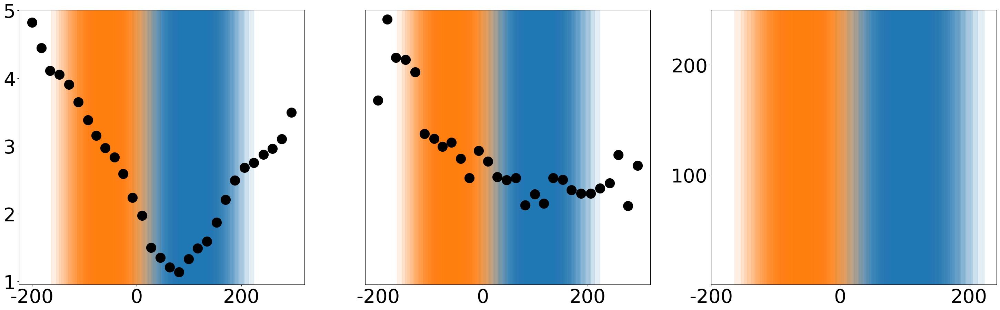

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
202  ACSF             388.536514              None                     NaN
203  ACSF             370.925649              None                     NaN
204  ACSF             352.896740              None                     NaN
205  ACSF             335.150551              None                     NaN
206  ACSF             317.043647              None                     NaN
207  ACSF             299.208894              None                     NaN
208  ACSF             281.280037              None                     NaN
209  ACSF             263.708898              None                     NaN
210  ACSF             245.427163          Neighbor                     NaN
211  ACSF             227.979873              None                     NaN
212  ACSF             209.933183          Neighbor                     NaN
213  ACSF             192.226083          Neighbor                     NaN
214  ACSF             174

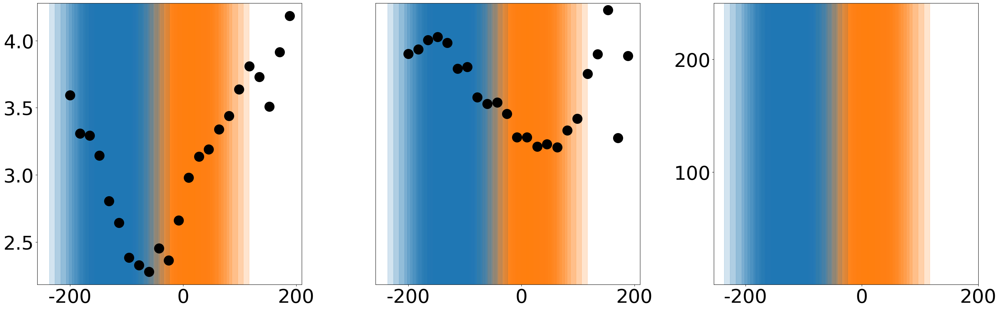

No ROI file found for  11/6/2024 1 1


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
969   ACSF             435.419753          Neighbor                     NaN
970   ACSF             416.837545              None                     NaN
971   ACSF             399.671712          Neighbor                     NaN
972   ACSF             381.233117          Neighbor                     NaN
973   ACSF             363.771948              None                     NaN
974   ACSF             345.832775              None                     NaN
975   ACSF             328.064434              Home                     NaN
976   ACSF             309.857982              Home                     NaN
977   ACSF             292.531014              Home                     NaN
978   ACSF             274.513990              Home                     NaN
979   ACSF             256.875130              Home                     NaN
980   ACSF             238.851466              Home                     NaN
981   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6204  ACSF             435.419753          Neighbor                     NaN
6205  ACSF             416.837545              None                     NaN
6206  ACSF             399.671712          Neighbor                     NaN
6207  ACSF             381.233117          Neighbor                     NaN
6208  ACSF             363.771948              None                     NaN
6209  ACSF             345.832775              None                     NaN
6210  ACSF             328.064434              Home                     NaN
6211  ACSF             309.857982              Home                     NaN
6212  ACSF             292.531014              Home                     NaN
6213  ACSF             274.513990              Home                     NaN
6214  ACSF             256.875130              Home                     NaN
6215  ACSF             238.851466              Home                     NaN
6216  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6229  ACSF             435.419753          Neighbor                     NaN
6230  ACSF             416.837545              None                     NaN
6231  ACSF             399.671712          Neighbor                     NaN
6232  ACSF             381.233117          Neighbor                     NaN
6233  ACSF             363.771948              None                     NaN
6234  ACSF             345.832775              None                     NaN
6235  ACSF             328.064434              Home                     NaN
6236  ACSF             309.857982              Home                     NaN
6237  ACSF             292.531014              Home                     NaN
6238  ACSF             274.513990              Home                     NaN
6239  ACSF             256.875130              Home                     NaN
6240  ACSF             238.851466              Home                     NaN
6241  ACSF  

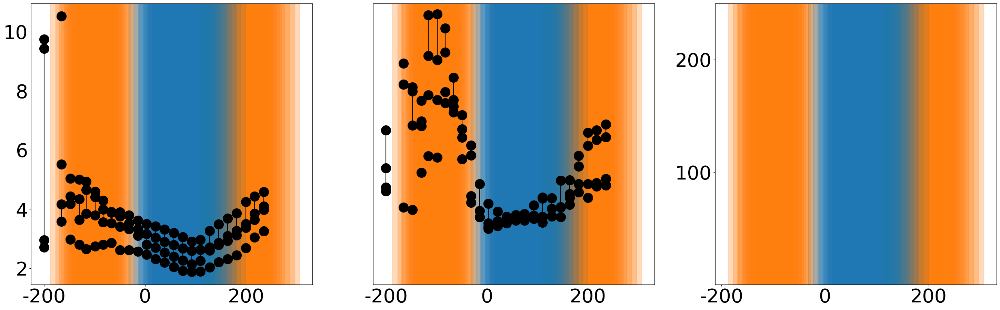

No ROI file found for  12/9/2024 1 1


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
344  ACSF             507.399931              None                     NaN
345  ACSF             490.066690              None                     NaN
346  ACSF             472.504581          Neighbor                     NaN
347  ACSF             454.125955              None                     NaN
348  ACSF             436.810533          Neighbor                     NaN
349  ACSF             418.723494          Neighbor                     NaN
350  ACSF             400.958548          Neighbor                     NaN
351  ACSF             383.330454              None                     NaN
352  ACSF             365.317424              None                     NaN
353  ACSF             347.631371              Home                     NaN
354  ACSF             329.846016              Home                     NaN
355  ACSF             313.479282              Home                     NaN
356  ACSF             294

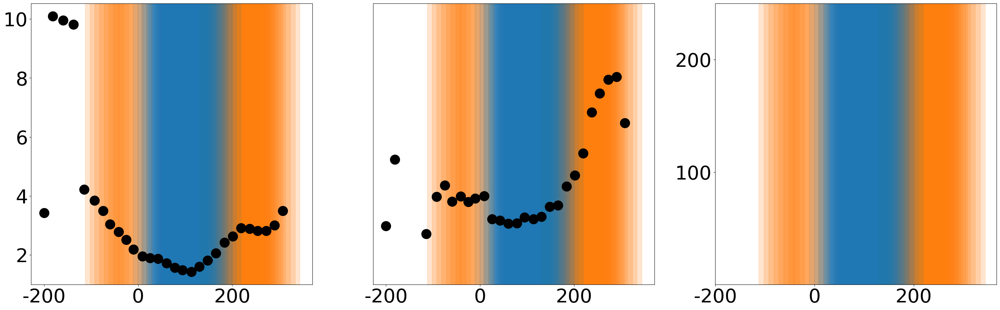

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
402  ACSF             414.010869              None                     NaN
403  ACSF             396.011363              None                     NaN
404  ACSF             378.011905              None                     NaN
405  ACSF             360.012500              None                     NaN
406  ACSF             342.000000              None                     NaN
407  ACSF             324.000000              Home                     NaN
408  ACSF             306.000000              Home                     NaN
409  ACSF             288.000000              None                     NaN
410  ACSF             270.000000              Home                     NaN
411  ACSF             252.000000              None                     NaN
412  ACSF             234.000000              None                     NaN
413  ACSF             216.000000              None                     NaN
414  ACSF             198

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6359  ACSF             413.270890              None                     NaN
6360  ACSF             395.183851              None                     NaN
6361  ACSF             377.200154              None                     NaN
6362  ACSF             359.233339              None                     NaN
6363  ACSF             341.138950              None                     NaN
6364  ACSF             323.305056              Home                     NaN
6365  ACSF             305.322147              Home                     NaN
6366  ACSF             287.387869              Home                     NaN
6367  ACSF             269.353265              Home                     NaN
6368  ACSF             251.403057              Home                     NaN
6369  ACSF             233.460517              None                     NaN
6370  ACSF             215.366124              None                     NaN
6371  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6383  ACSF             413.270890              None                     NaN
6384  ACSF             395.183851              None                     NaN
6385  ACSF             377.200154              None                     NaN
6386  ACSF             359.233339              None                     NaN
6387  ACSF             341.138950              None                     NaN
6388  ACSF             323.305056              Home                     NaN
6389  ACSF             305.322147              Home                     NaN
6390  ACSF             287.387869              Home                     NaN
6391  ACSF             269.353265              Home                     NaN
6392  ACSF             251.403057              Home                     NaN
6393  ACSF             233.460517              None                     NaN
6394  ACSF             215.366124              None                     NaN
6395  ACSF  

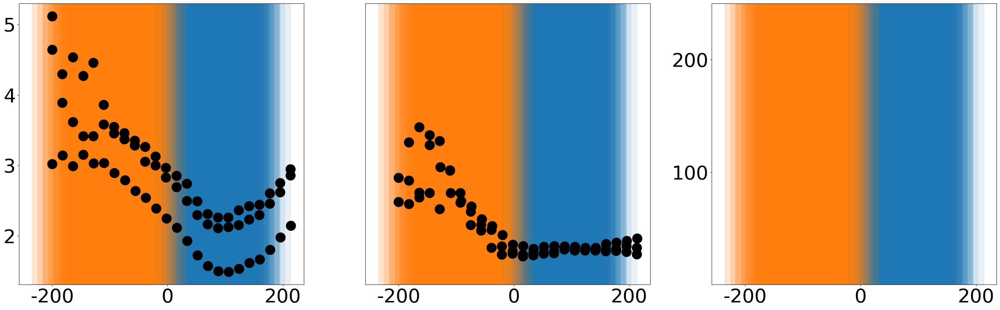

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
450   ACSF             439.344390          Neighbor                     NaN
451   ACSF             421.368074          Neighbor                     NaN
452   ACSF             403.823052          Neighbor                     NaN
453   ACSF             386.363697              None                     NaN
454   ACSF             368.151091              None                     NaN
455   ACSF             349.375918          Neighbor                     NaN
456   ACSF             331.600078              None                     NaN
457   ACSF             314.201020              None                     NaN
458   ACSF             295.805613              None                     NaN
459   ACSF             277.775768              None                     NaN
460   ACSF             259.829003              None                     NaN
461   ACSF             241.824251              Home                     NaN
462   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6432  ACSF             433.822666          Neighbor                     NaN
6433  ACSF             415.771955          Neighbor                     NaN
6434  ACSF             397.306693          Neighbor                     NaN
6435  ACSF             379.156075          Neighbor                     NaN
6436  ACSF             361.996227          Neighbor                     NaN
6437  ACSF             343.921055          Neighbor                     NaN
6438  ACSF             325.660658              None                     NaN
6439  ACSF             307.078624              None                     NaN
6440  ACSF             289.834024              None                     NaN
6441  ACSF             271.659690              None                     NaN
6442  ACSF             253.947250              None                     NaN
6443  ACSF             235.435220              Home                     NaN
6444  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6457  ACSF             433.822666          Neighbor                     NaN
6458  ACSF             415.771955          Neighbor                     NaN
6459  ACSF             397.306693          Neighbor                     NaN
6460  ACSF             379.156075          Neighbor                     NaN
6461  ACSF             361.996227          Neighbor                     NaN
6462  ACSF             343.921055          Neighbor                     NaN
6463  ACSF             325.660658              None                     NaN
6464  ACSF             307.078624              None                     NaN
6465  ACSF             289.834024              None                     NaN
6466  ACSF             271.659690              None                     NaN
6467  ACSF             253.947250              None                     NaN
6468  ACSF             235.435220              Home                     NaN
6469  ACSF  

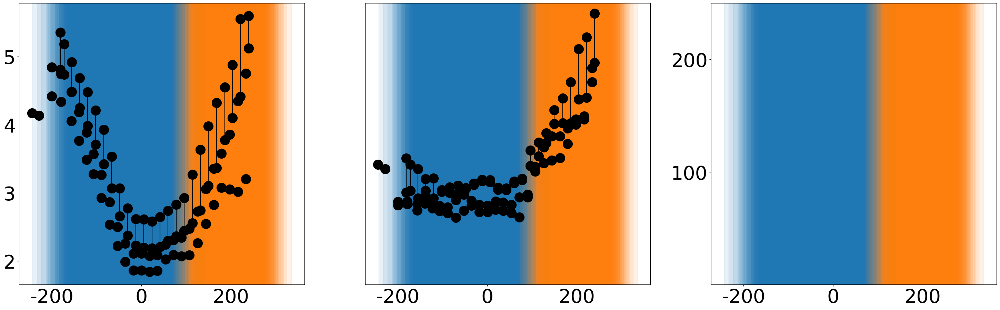

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
994   ACSF             466.927868              Home                     NaN
995   ACSF             448.809027              Home                     NaN
996   ACSF             430.642191              Home                     NaN
997   ACSF             412.866145              Home                     NaN
998   ACSF             394.743427              None                     NaN
999   ACSF             376.569095              Home                     NaN
1000  ACSF             358.610401              Home                     NaN
1001  ACSF             340.828436              Home                     NaN
1002  ACSF             322.751247              Home                     NaN
1003  ACSF             304.971594              None                     NaN
1004  ACSF             287.099697              None                     NaN
1005  ACSF             268.932562              None                     NaN
1006  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6281  ACSF             466.927868              Home                     NaN
6282  ACSF             448.809027              Home                     NaN
6283  ACSF             430.642191              Home                     NaN
6284  ACSF             412.866145              Home                     NaN
6285  ACSF             394.743427              None                     NaN
6286  ACSF             376.569095              Home                     NaN
6287  ACSF             358.610401              Home                     NaN
6288  ACSF             340.828436              Home                     NaN
6289  ACSF             322.751247              Home                     NaN
6290  ACSF             304.971594              None                     NaN
6291  ACSF             287.099697              None                     NaN
6292  ACSF             268.932562              None                     NaN
6293  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6308  ACSF             466.927868              Home                     NaN
6309  ACSF             448.809027              Home                     NaN
6310  ACSF             430.642191              Home                     NaN
6311  ACSF             412.866145              Home                     NaN
6312  ACSF             394.743427              None                     NaN
6313  ACSF             376.569095              Home                     NaN
6314  ACSF             358.610401              Home                     NaN
6315  ACSF             340.828436              Home                     NaN
6316  ACSF             322.751247              Home                     NaN
6317  ACSF             304.971594              None                     NaN
6318  ACSF             287.099697              None                     NaN
6319  ACSF             268.932562              None                     NaN
6320  ACSF  

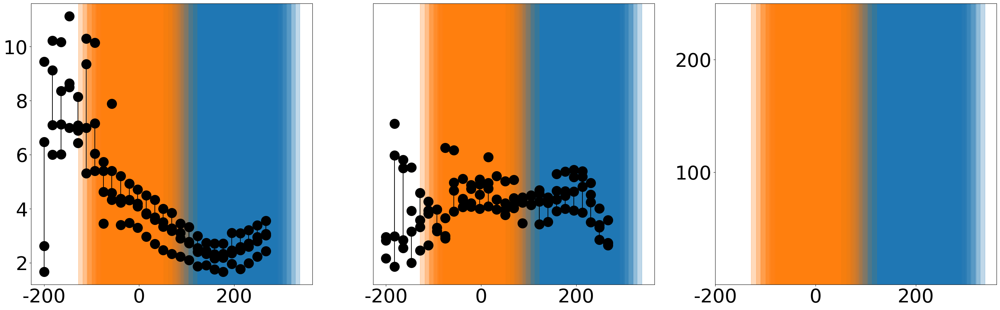

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
504  ACSF             499.134323              None                     NaN
505  ACSF             482.317469              None                     NaN
506  ACSF             463.208018          Neighbor                     NaN
507  ACSF             445.590056          Neighbor                     NaN
508  ACSF             427.249013          Neighbor                     NaN
509  ACSF             410.499026          Neighbor                     NaN
510  ACSF             390.984977          Neighbor                     NaN
511  ACSF             374.543425          Neighbor                     NaN
512  ACSF             355.015250              None                     NaN
513  ACSF             338.973102              None                     NaN
514  ACSF             320.754980              None                     NaN
515  ACSF             303.404332              Home                     NaN
516  ACSF             286

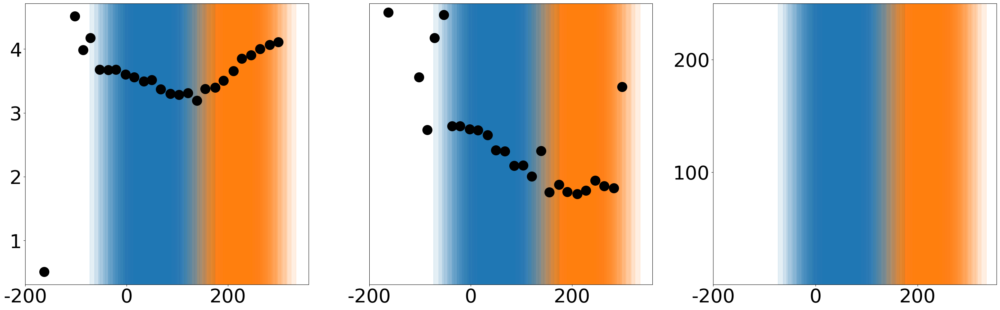

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
560  ACSF             411.098528              None                     NaN
561  ACSF             393.103040              None                     NaN
562  ACSF             375.107984              None                     NaN
563  ACSF             357.012605              None                     NaN
564  ACSF             339.053093              None                     NaN
565  ACSF             321.056070              None                     NaN
566  ACSF             303.059400              None                     NaN
567  ACSF             285.063151              Home                     NaN
568  ACSF             267.067407              None                     NaN
569  ACSF             249.072279              None                     NaN
570  ACSF             231.077909              None                     NaN
571  ACSF             213.000000              Home                     NaN
572  ACSF             195

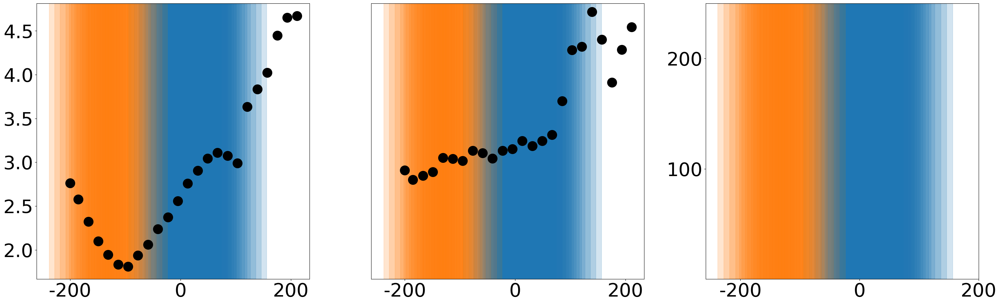

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
608  ACSF             413.649162              None                     NaN
609  ACSF             395.931721              Home                     NaN
610  ACSF             377.947355              Home                     NaN
611  ACSF             360.157774              Home                     NaN
612  ACSF             342.046567              Home                     NaN
613  ACSF             324.284628              Home                     NaN
614  ACSF             306.281455              Home                     NaN
615  ACSF             288.880370              Home                     NaN
616  ACSF             270.897158              None                     NaN
617  ACSF             253.013620              None                     NaN
618  ACSF             235.243773              None                     NaN
619  ACSF             217.582280          Neighbor                     NaN
620  ACSF             199

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6857  ACSF             413.828676              None                     NaN
6858  ACSF             395.819429              None                     NaN
6859  ACSF             378.136170              None                     NaN
6860  ACSF             361.032890              Home                     NaN
6861  ACSF             342.806558              Home                     NaN
6862  ACSF             324.955106              Home                     NaN
6863  ACSF             306.760356              Home                     NaN
6864  ACSF             288.792560              Home                     NaN
6865  ACSF             271.559584              None                     NaN
6866  ACSF             253.806325              None                     NaN
6867  ACSF             236.576586              None                     NaN
6868  ACSF             218.345382              None                     NaN
6869  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6881  ACSF             413.828676              None                     NaN
6882  ACSF             395.819429              None                     NaN
6883  ACSF             378.136170              None                     NaN
6884  ACSF             361.032890              Home                     NaN
6885  ACSF             342.806558              Home                     NaN
6886  ACSF             324.955106              Home                     NaN
6887  ACSF             306.760356              Home                     NaN
6888  ACSF             288.792560              Home                     NaN
6889  ACSF             271.559584              None                     NaN
6890  ACSF             253.806325              None                     NaN
6891  ACSF             236.576586              None                     NaN
6892  ACSF             218.345382              None                     NaN
6893  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6905  ACSF             413.828676              None                     NaN
6906  ACSF             395.819429              None                     NaN
6907  ACSF             378.136170              None                     NaN
6908  ACSF             361.032890              Home                     NaN
6909  ACSF             342.806558              Home                     NaN
6910  ACSF             324.955106              Home                     NaN
6911  ACSF             306.760356              Home                     NaN
6912  ACSF             288.792560              Home                     NaN
6913  ACSF             271.559584              None                     NaN
6914  ACSF             253.806325              None                     NaN
6915  ACSF             236.576586              None                     NaN
6916  ACSF             218.345382              None                     NaN
6917  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6929  ACSF             413.828676              None                     NaN
6930  ACSF             395.819429              None                     NaN
6931  ACSF             378.136170              None                     NaN
6932  ACSF             361.032890              Home                     NaN
6933  ACSF             342.806558              Home                     NaN
6934  ACSF             324.955106              Home                     NaN
6935  ACSF             306.760356              Home                     NaN
6936  ACSF             288.792560              Home                     NaN
6937  ACSF             271.559584              None                     NaN
6938  ACSF             253.806325              None                     NaN
6939  ACSF             236.576586              None                     NaN
6940  ACSF             218.345382              None                     NaN
6941  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6953  ACSF             413.828676              None                     NaN
6954  ACSF             395.819429              None                     NaN
6955  ACSF             378.136170              None                     NaN
6956  ACSF             361.032890              Home                     NaN
6957  ACSF             342.806558              Home                     NaN
6958  ACSF             324.955106              Home                     NaN
6959  ACSF             306.760356              Home                     NaN
6960  ACSF             288.792560              Home                     NaN
6961  ACSF             271.559584              None                     NaN
6962  ACSF             253.806325              None                     NaN
6963  ACSF             236.576586              None                     NaN
6964  ACSF             218.345382              None                     NaN
6965  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6977  ACSF             413.828676              None                     NaN
6978  ACSF             395.819429              None                     NaN
6979  ACSF             378.136170              None                     NaN
6980  ACSF             361.032890              Home                     NaN
6981  ACSF             342.806558              Home                     NaN
6982  ACSF             324.955106              Home                     NaN
6983  ACSF             306.760356              Home                     NaN
6984  ACSF             288.792560              Home                     NaN
6985  ACSF             271.559584              None                     NaN
6986  ACSF             253.806325              None                     NaN
6987  ACSF             236.576586              None                     NaN
6988  ACSF             218.345382              None                     NaN
6989  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7001  ACSF             413.828676              None                     NaN
7002  ACSF             395.819429              None                     NaN
7003  ACSF             378.136170              None                     NaN
7004  ACSF             361.032890              Home                     NaN
7005  ACSF             342.806558              Home                     NaN
7006  ACSF             324.955106              Home                     NaN
7007  ACSF             306.760356              Home                     NaN
7008  ACSF             288.792560              Home                     NaN
7009  ACSF             271.559584              None                     NaN
7010  ACSF             253.806325              None                     NaN
7011  ACSF             236.576586              None                     NaN
7012  ACSF             218.345382              None                     NaN
7013  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7025  ACSF             413.828676              None                     NaN
7026  ACSF             395.819429              None                     NaN
7027  ACSF             378.136170              None                     NaN
7028  ACSF             361.032890              Home                     NaN
7029  ACSF             342.806558              Home                     NaN
7030  ACSF             324.955106              Home                     NaN
7031  ACSF             306.760356              Home                     NaN
7032  ACSF             288.792560              Home                     NaN
7033  ACSF             271.559584              None                     NaN
7034  ACSF             253.806325              None                     NaN
7035  ACSF             236.576586              None                     NaN
7036  ACSF             218.345382              None                     NaN
7037  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7049  ACSF             413.828676              None                     NaN
7050  ACSF             395.819429              None                     NaN
7051  ACSF             378.136170              None                     NaN
7052  ACSF             361.032890              Home                     NaN
7053  ACSF             342.806558              Home                     NaN
7054  ACSF             324.955106              Home                     NaN
7055  ACSF             306.760356              Home                     NaN
7056  ACSF             288.792560              Home                     NaN
7057  ACSF             271.559584              None                     NaN
7058  ACSF             253.806325              None                     NaN
7059  ACSF             236.576586              None                     NaN
7060  ACSF             218.345382              None                     NaN
7061  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7073  ACSF             413.828676              None                     NaN
7074  ACSF             395.819429              None                     NaN
7075  ACSF             378.136170              None                     NaN
7076  ACSF             361.032890              Home                     NaN
7077  ACSF             342.806558              Home                     NaN
7078  ACSF             324.955106              Home                     NaN
7079  ACSF             306.760356              Home                     NaN
7080  ACSF             288.792560              Home                     NaN
7081  ACSF             271.559584              None                     NaN
7082  ACSF             253.806325              None                     NaN
7083  ACSF             236.576586              None                     NaN
7084  ACSF             218.345382              None                     NaN
7085  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7097  ACSF             413.828676              None                     NaN
7098  ACSF             395.819429              None                     NaN
7099  ACSF             378.136170              None                     NaN
7100  ACSF             361.032890              Home                     NaN
7101  ACSF             342.806558              Home                     NaN
7102  ACSF             324.955106              Home                     NaN
7103  ACSF             306.760356              Home                     NaN
7104  ACSF             288.792560              Home                     NaN
7105  ACSF             271.559584              None                     NaN
7106  ACSF             253.806325              None                     NaN
7107  ACSF             236.576586              None                     NaN
7108  ACSF             218.345382              None                     NaN
7109  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7121  ACSF             413.828676              None                     NaN
7122  ACSF             395.819429              None                     NaN
7123  ACSF             378.136170              None                     NaN
7124  ACSF             361.032890              Home                     NaN
7125  ACSF             342.806558              Home                     NaN
7126  ACSF             324.955106              Home                     NaN
7127  ACSF             306.760356              Home                     NaN
7128  ACSF             288.792560              Home                     NaN
7129  ACSF             271.559584              None                     NaN
7130  ACSF             253.806325              None                     NaN
7131  ACSF             236.576586              None                     NaN
7132  ACSF             218.345382              None                     NaN
7133  ACSF  

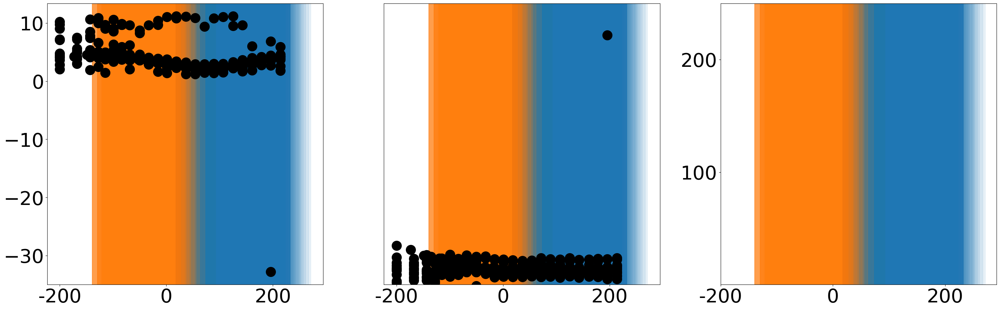

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1021  ACSF             463.639256          Neighbor                     NaN
1022  ACSF             445.104499          Neighbor                     NaN
1023  ACSF             427.161311              None                     NaN
1024  ACSF             409.206979          Neighbor                     NaN
1025  ACSF             391.744078              None                     NaN
1026  ACSF             373.280472              None                     NaN
1027  ACSF             355.671923              None                     NaN
1028  ACSF             337.218316              None                     NaN
1029  ACSF             319.701088              Home                     NaN
1030  ACSF             301.995361              Home                     NaN
1031  ACSF             284.175219              Home                     NaN
1032  ACSF             265.787082              Home                     NaN
1033  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6509  ACSF             463.639256          Neighbor                     NaN
6510  ACSF             445.104499          Neighbor                     NaN
6511  ACSF             427.161311              None                     NaN
6512  ACSF             409.206979          Neighbor                     NaN
6513  ACSF             391.744078              None                     NaN
6514  ACSF             373.280472              None                     NaN
6515  ACSF             355.671923              None                     NaN
6516  ACSF             337.218316              None                     NaN
6517  ACSF             319.701088              Home                     NaN
6518  ACSF             301.995361              Home                     NaN
6519  ACSF             284.175219              Home                     NaN
6520  ACSF             265.787082              Home                     NaN
6521  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6536  ACSF             463.639256          Neighbor                     NaN
6537  ACSF             445.104499          Neighbor                     NaN
6538  ACSF             427.161311              None                     NaN
6539  ACSF             409.206979          Neighbor                     NaN
6540  ACSF             391.744078              None                     NaN
6541  ACSF             373.280472              None                     NaN
6542  ACSF             355.671923              None                     NaN
6543  ACSF             337.218316              None                     NaN
6544  ACSF             319.701088              Home                     NaN
6545  ACSF             301.995361              Home                     NaN
6546  ACSF             284.175219              Home                     NaN
6547  ACSF             265.787082              Home                     NaN
6548  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6563  ACSF             463.639256          Neighbor                     NaN
6564  ACSF             445.104499          Neighbor                     NaN
6565  ACSF             427.161311              None                     NaN
6566  ACSF             409.206979          Neighbor                     NaN
6567  ACSF             391.744078              None                     NaN
6568  ACSF             373.280472              None                     NaN
6569  ACSF             355.671923              None                     NaN
6570  ACSF             337.218316              None                     NaN
6571  ACSF             319.701088              Home                     NaN
6572  ACSF             301.995361              Home                     NaN
6573  ACSF             284.175219              Home                     NaN
6574  ACSF             265.787082              Home                     NaN
6575  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6590  ACSF             463.639256          Neighbor                     NaN
6591  ACSF             445.104499          Neighbor                     NaN
6592  ACSF             427.161311              None                     NaN
6593  ACSF             409.206979          Neighbor                     NaN
6594  ACSF             391.744078              None                     NaN
6595  ACSF             373.280472              None                     NaN
6596  ACSF             355.671923              None                     NaN
6597  ACSF             337.218316              None                     NaN
6598  ACSF             319.701088              Home                     NaN
6599  ACSF             301.995361              Home                     NaN
6600  ACSF             284.175219              Home                     NaN
6601  ACSF             265.787082              Home                     NaN
6602  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6617  ACSF             463.639256          Neighbor                     NaN
6618  ACSF             445.104499          Neighbor                     NaN
6619  ACSF             427.161311              None                     NaN
6620  ACSF             409.206979          Neighbor                     NaN
6621  ACSF             391.744078              None                     NaN
6622  ACSF             373.280472              None                     NaN
6623  ACSF             355.671923              None                     NaN
6624  ACSF             337.218316              None                     NaN
6625  ACSF             319.701088              Home                     NaN
6626  ACSF             301.995361              Home                     NaN
6627  ACSF             284.175219              Home                     NaN
6628  ACSF             265.787082              Home                     NaN
6629  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6644  ACSF             463.639256          Neighbor                     NaN
6645  ACSF             445.104499          Neighbor                     NaN
6646  ACSF             427.161311              None                     NaN
6647  ACSF             409.206979          Neighbor                     NaN
6648  ACSF             391.744078              None                     NaN
6649  ACSF             373.280472              None                     NaN
6650  ACSF             355.671923              None                     NaN
6651  ACSF             337.218316              None                     NaN
6652  ACSF             319.701088              Home                     NaN
6653  ACSF             301.995361              Home                     NaN
6654  ACSF             284.175219              Home                     NaN
6655  ACSF             265.787082              Home                     NaN
6656  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6671  ACSF             463.639256          Neighbor                     NaN
6672  ACSF             445.104499          Neighbor                     NaN
6673  ACSF             427.161311              None                     NaN
6674  ACSF             409.206979          Neighbor                     NaN
6675  ACSF             391.744078              None                     NaN
6676  ACSF             373.280472              None                     NaN
6677  ACSF             355.671923              None                     NaN
6678  ACSF             337.218316              None                     NaN
6679  ACSF             319.701088              Home                     NaN
6680  ACSF             301.995361              Home                     NaN
6681  ACSF             284.175219              Home                     NaN
6682  ACSF             265.787082              Home                     NaN
6683  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6698  ACSF             463.639256          Neighbor                     NaN
6699  ACSF             445.104499          Neighbor                     NaN
6700  ACSF             427.161311              None                     NaN
6701  ACSF             409.206979          Neighbor                     NaN
6702  ACSF             391.744078              None                     NaN
6703  ACSF             373.280472              None                     NaN
6704  ACSF             355.671923              None                     NaN
6705  ACSF             337.218316              None                     NaN
6706  ACSF             319.701088              Home                     NaN
6707  ACSF             301.995361              Home                     NaN
6708  ACSF             284.175219              Home                     NaN
6709  ACSF             265.787082              Home                     NaN
6710  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6725  ACSF             463.639256          Neighbor                     NaN
6726  ACSF             445.104499          Neighbor                     NaN
6727  ACSF             427.161311              None                     NaN
6728  ACSF             409.206979          Neighbor                     NaN
6729  ACSF             391.744078              None                     NaN
6730  ACSF             373.280472              None                     NaN
6731  ACSF             355.671923              None                     NaN
6732  ACSF             337.218316              None                     NaN
6733  ACSF             319.701088              Home                     NaN
6734  ACSF             301.995361              Home                     NaN
6735  ACSF             284.175219              Home                     NaN
6736  ACSF             265.787082              Home                     NaN
6737  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6752  ACSF             463.639256          Neighbor                     NaN
6753  ACSF             445.104499          Neighbor                     NaN
6754  ACSF             427.161311              None                     NaN
6755  ACSF             409.206979          Neighbor                     NaN
6756  ACSF             391.744078              None                     NaN
6757  ACSF             373.280472              None                     NaN
6758  ACSF             355.671923              None                     NaN
6759  ACSF             337.218316              None                     NaN
6760  ACSF             319.701088              Home                     NaN
6761  ACSF             301.995361              Home                     NaN
6762  ACSF             284.175219              Home                     NaN
6763  ACSF             265.787082              Home                     NaN
6764  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6779  ACSF             463.639256          Neighbor                     NaN
6780  ACSF             445.104499          Neighbor                     NaN
6781  ACSF             427.161311              None                     NaN
6782  ACSF             409.206979          Neighbor                     NaN
6783  ACSF             391.744078              None                     NaN
6784  ACSF             373.280472              None                     NaN
6785  ACSF             355.671923              None                     NaN
6786  ACSF             337.218316              None                     NaN
6787  ACSF             319.701088              Home                     NaN
6788  ACSF             301.995361              Home                     NaN
6789  ACSF             284.175219              Home                     NaN
6790  ACSF             265.787082              Home                     NaN
6791  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6806  ACSF             463.639256          Neighbor                     NaN
6807  ACSF             445.104499          Neighbor                     NaN
6808  ACSF             427.161311              None                     NaN
6809  ACSF             409.206979          Neighbor                     NaN
6810  ACSF             391.744078              None                     NaN
6811  ACSF             373.280472              None                     NaN
6812  ACSF             355.671923              None                     NaN
6813  ACSF             337.218316              None                     NaN
6814  ACSF             319.701088              Home                     NaN
6815  ACSF             301.995361              Home                     NaN
6816  ACSF             284.175219              Home                     NaN
6817  ACSF             265.787082              Home                     NaN
6818  ACSF  

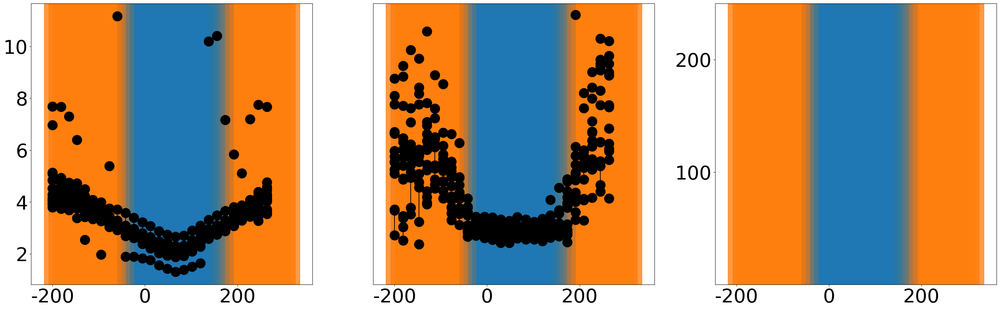

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
656   ACSF              82.596818              None                     NaN
657   ACSF              99.695187              None                     NaN
658   ACSF             116.058240              None                     NaN
659   ACSF             134.050582              None                     NaN
660   ACSF             152.141652              None                     NaN
661   ACSF             169.422663              None                     NaN
662   ACSF             187.680314              None                     NaN
663   ACSF             205.268233              None                     NaN
664   ACSF             223.393509              Home                     NaN
665   ACSF             240.866826              Home                     NaN
666   ACSF             259.053370              None                     NaN
667   ACSF             276.769517              Home                     NaN
668   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7170  ACSF             432.171673          Neighbor                     NaN
7171  ACSF             414.618068              None                     NaN
7172  ACSF             396.416133          Neighbor                     NaN
7173  ACSF             378.295168          Neighbor                     NaN
7174  ACSF             360.475960              None                     NaN
7175  ACSF             342.048424              None                     NaN
7176  ACSF             324.840883              None                     NaN
7177  ACSF             306.391817              None                     NaN
7178  ACSF             288.839260              Home                     NaN
7179  ACSF             270.916245              Home                     NaN
7180  ACSF             252.557922              Home                     NaN
7181  ACSF             235.357595              Home                     NaN
7182  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7195  ACSF             432.171673          Neighbor                     NaN
7196  ACSF             414.618068              None                     NaN
7197  ACSF             396.416133          Neighbor                     NaN
7198  ACSF             378.295168          Neighbor                     NaN
7199  ACSF             360.475960              None                     NaN
7200  ACSF             342.048424              None                     NaN
7201  ACSF             324.840883              None                     NaN
7202  ACSF             306.391817              None                     NaN
7203  ACSF             288.839260              Home                     NaN
7204  ACSF             270.916245              Home                     NaN
7205  ACSF             252.557922              Home                     NaN
7206  ACSF             235.357595              Home                     NaN
7207  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7220  ACSF             432.171673          Neighbor                     NaN
7221  ACSF             414.618068              None                     NaN
7222  ACSF             396.416133          Neighbor                     NaN
7223  ACSF             378.295168          Neighbor                     NaN
7224  ACSF             360.475960              None                     NaN
7225  ACSF             342.048424              None                     NaN
7226  ACSF             324.840883              None                     NaN
7227  ACSF             306.391817              None                     NaN
7228  ACSF             288.839260              Home                     NaN
7229  ACSF             270.916245              Home                     NaN
7230  ACSF             252.557922              Home                     NaN
7231  ACSF             235.357595              Home                     NaN
7232  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7245  ACSF             432.171673          Neighbor                     NaN
7246  ACSF             414.618068              None                     NaN
7247  ACSF             396.416133          Neighbor                     NaN
7248  ACSF             378.295168          Neighbor                     NaN
7249  ACSF             360.475960              None                     NaN
7250  ACSF             342.048424              None                     NaN
7251  ACSF             324.840883              None                     NaN
7252  ACSF             306.391817              None                     NaN
7253  ACSF             288.839260              Home                     NaN
7254  ACSF             270.916245              Home                     NaN
7255  ACSF             252.557922              Home                     NaN
7256  ACSF             235.357595              Home                     NaN
7257  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7270  ACSF             432.171673          Neighbor                     NaN
7271  ACSF             414.618068              None                     NaN
7272  ACSF             396.416133          Neighbor                     NaN
7273  ACSF             378.295168          Neighbor                     NaN
7274  ACSF             360.475960              None                     NaN
7275  ACSF             342.048424              None                     NaN
7276  ACSF             324.840883              None                     NaN
7277  ACSF             306.391817              None                     NaN
7278  ACSF             288.839260              Home                     NaN
7279  ACSF             270.916245              Home                     NaN
7280  ACSF             252.557922              Home                     NaN
7281  ACSF             235.357595              Home                     NaN
7282  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7295  ACSF             432.171673          Neighbor                     NaN
7296  ACSF             414.618068              None                     NaN
7297  ACSF             396.416133          Neighbor                     NaN
7298  ACSF             378.295168          Neighbor                     NaN
7299  ACSF             360.475960              None                     NaN
7300  ACSF             342.048424              None                     NaN
7301  ACSF             324.840883              None                     NaN
7302  ACSF             306.391817              None                     NaN
7303  ACSF             288.839260              Home                     NaN
7304  ACSF             270.916245              Home                     NaN
7305  ACSF             252.557922              Home                     NaN
7306  ACSF             235.357595              Home                     NaN
7307  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7320  ACSF             432.171673          Neighbor                     NaN
7321  ACSF             414.618068              None                     NaN
7322  ACSF             396.416133          Neighbor                     NaN
7323  ACSF             378.295168          Neighbor                     NaN
7324  ACSF             360.475960              None                     NaN
7325  ACSF             342.048424              None                     NaN
7326  ACSF             324.840883              None                     NaN
7327  ACSF             306.391817              None                     NaN
7328  ACSF             288.839260              Home                     NaN
7329  ACSF             270.916245              Home                     NaN
7330  ACSF             252.557922              Home                     NaN
7331  ACSF             235.357595              Home                     NaN
7332  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7345  ACSF             432.171673          Neighbor                     NaN
7346  ACSF             414.618068              None                     NaN
7347  ACSF             396.416133          Neighbor                     NaN
7348  ACSF             378.295168          Neighbor                     NaN
7349  ACSF             360.475960              None                     NaN
7350  ACSF             342.048424              None                     NaN
7351  ACSF             324.840883              None                     NaN
7352  ACSF             306.391817              None                     NaN
7353  ACSF             288.839260              Home                     NaN
7354  ACSF             270.916245              Home                     NaN
7355  ACSF             252.557922              Home                     NaN
7356  ACSF             235.357595              Home                     NaN
7357  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7370  ACSF             432.171673          Neighbor                     NaN
7371  ACSF             414.618068              None                     NaN
7372  ACSF             396.416133          Neighbor                     NaN
7373  ACSF             378.295168          Neighbor                     NaN
7374  ACSF             360.475960              None                     NaN
7375  ACSF             342.048424              None                     NaN
7376  ACSF             324.840883              None                     NaN
7377  ACSF             306.391817              None                     NaN
7378  ACSF             288.839260              Home                     NaN
7379  ACSF             270.916245              Home                     NaN
7380  ACSF             252.557922              Home                     NaN
7381  ACSF             235.357595              Home                     NaN
7382  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7395  ACSF             432.171673          Neighbor                     NaN
7396  ACSF             414.618068              None                     NaN
7397  ACSF             396.416133          Neighbor                     NaN
7398  ACSF             378.295168          Neighbor                     NaN
7399  ACSF             360.475960              None                     NaN
7400  ACSF             342.048424              None                     NaN
7401  ACSF             324.840883              None                     NaN
7402  ACSF             306.391817              None                     NaN
7403  ACSF             288.839260              Home                     NaN
7404  ACSF             270.916245              Home                     NaN
7405  ACSF             252.557922              Home                     NaN
7406  ACSF             235.357595              Home                     NaN
7407  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7420  ACSF             432.171673          Neighbor                     NaN
7421  ACSF             414.618068              None                     NaN
7422  ACSF             396.416133          Neighbor                     NaN
7423  ACSF             378.295168          Neighbor                     NaN
7424  ACSF             360.475960              None                     NaN
7425  ACSF             342.048424              None                     NaN
7426  ACSF             324.840883              None                     NaN
7427  ACSF             306.391817              None                     NaN
7428  ACSF             288.839260              Home                     NaN
7429  ACSF             270.916245              Home                     NaN
7430  ACSF             252.557922              Home                     NaN
7431  ACSF             235.357595              Home                     NaN
7432  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7445  ACSF             432.171673          Neighbor                     NaN
7446  ACSF             414.618068              None                     NaN
7447  ACSF             396.416133          Neighbor                     NaN
7448  ACSF             378.295168          Neighbor                     NaN
7449  ACSF             360.475960              None                     NaN
7450  ACSF             342.048424              None                     NaN
7451  ACSF             324.840883              None                     NaN
7452  ACSF             306.391817              None                     NaN
7453  ACSF             288.839260              Home                     NaN
7454  ACSF             270.916245              Home                     NaN
7455  ACSF             252.557922              Home                     NaN
7456  ACSF             235.357595              Home                     NaN
7457  ACSF  

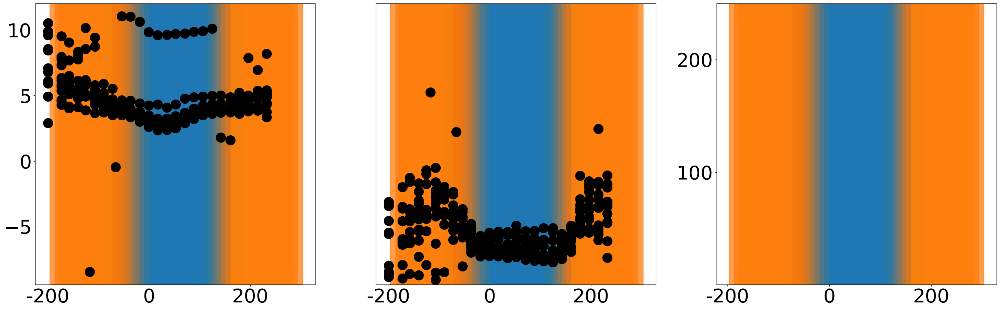

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
704  ACSF             504.420909              None                     NaN
705  ACSF             487.815852              None                     NaN
706  ACSF             467.897842              None                     NaN
707  ACSF             452.078702              None                     NaN
708  ACSF             433.349212              None                     NaN
..    ...                    ...               ...                     ...
811  ACSF             112.869169          Neighbor                     NaN
812  ACSF              97.156784          Neighbor                     NaN
813  ACSF              84.918280              None                     NaN
814  ACSF              71.190704              None                     NaN
815  ACSF              60.150030              None                     NaN

[112 rows x 4 columns]
     ROI       amp       snr  latency  halfwidth  Stim_Distance   X_Center  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7470  ACSF             470.471629              None                     NaN
7471  ACSF             451.350838              None                     NaN
7472  ACSF             432.611826              None                     NaN
7473  ACSF             416.755154              None                     NaN
7474  ACSF             397.218353              None                     NaN
7475  ACSF             379.863634              None                     NaN
7476  ACSF             359.942265              Home                     NaN
7477  ACSF             343.155800              Home                     NaN
7478  ACSF             326.378683              None                     NaN
7479  ACSF             305.700536              Home                     NaN
7480  ACSF             290.451337              None                     NaN
7481  ACSF             271.482665              Home                     NaN
7482  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7497  ACSF             470.471629              None                     NaN
7498  ACSF             451.350838              None                     NaN
7499  ACSF             432.611826              None                     NaN
7500  ACSF             416.755154              None                     NaN
7501  ACSF             397.218353              None                     NaN
7502  ACSF             379.863634              None                     NaN
7503  ACSF             359.942265              Home                     NaN
7504  ACSF             343.155800              Home                     NaN
7505  ACSF             326.378683              None                     NaN
7506  ACSF             305.700536              Home                     NaN
7507  ACSF             290.451337              None                     NaN
7508  ACSF             271.482665              Home                     NaN
7509  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7524  ACSF             470.471629              None                     NaN
7525  ACSF             451.350838              None                     NaN
7526  ACSF             432.611826              None                     NaN
7527  ACSF             416.755154              None                     NaN
7528  ACSF             397.218353              None                     NaN
7529  ACSF             379.863634              None                     NaN
7530  ACSF             359.942265              Home                     NaN
7531  ACSF             343.155800              Home                     NaN
7532  ACSF             326.378683              None                     NaN
7533  ACSF             305.700536              Home                     NaN
7534  ACSF             290.451337              None                     NaN
7535  ACSF             271.482665              Home                     NaN
7536  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7551  ACSF             470.471629              None                     NaN
7552  ACSF             451.350838              None                     NaN
7553  ACSF             432.611826              None                     NaN
7554  ACSF             416.755154              None                     NaN
7555  ACSF             397.218353              None                     NaN
7556  ACSF             379.863634              None                     NaN
7557  ACSF             359.942265              Home                     NaN
7558  ACSF             343.155800              Home                     NaN
7559  ACSF             326.378683              None                     NaN
7560  ACSF             305.700536              Home                     NaN
7561  ACSF             290.451337              None                     NaN
7562  ACSF             271.482665              Home                     NaN
7563  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7578  ACSF             470.471629              None                     NaN
7579  ACSF             451.350838              None                     NaN
7580  ACSF             432.611826              None                     NaN
7581  ACSF             416.755154              None                     NaN
7582  ACSF             397.218353              None                     NaN
7583  ACSF             379.863634              None                     NaN
7584  ACSF             359.942265              Home                     NaN
7585  ACSF             343.155800              Home                     NaN
7586  ACSF             326.378683              None                     NaN
7587  ACSF             305.700536              Home                     NaN
7588  ACSF             290.451337              None                     NaN
7589  ACSF             271.482665              Home                     NaN
7590  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7605  ACSF             470.471629              None                     NaN
7606  ACSF             451.350838              None                     NaN
7607  ACSF             432.611826              None                     NaN
7608  ACSF             416.755154              None                     NaN
7609  ACSF             397.218353              None                     NaN
7610  ACSF             379.863634              None                     NaN
7611  ACSF             359.942265              Home                     NaN
7612  ACSF             343.155800              Home                     NaN
7613  ACSF             326.378683              None                     NaN
7614  ACSF             305.700536              Home                     NaN
7615  ACSF             290.451337              None                     NaN
7616  ACSF             271.482665              Home                     NaN
7617  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7632  ACSF             470.471629              None                     NaN
7633  ACSF             451.350838              None                     NaN
7634  ACSF             432.611826              None                     NaN
7635  ACSF             416.755154              None                     NaN
7636  ACSF             397.218353              None                     NaN
7637  ACSF             379.863634              None                     NaN
7638  ACSF             359.942265              Home                     NaN
7639  ACSF             343.155800              Home                     NaN
7640  ACSF             326.378683              None                     NaN
7641  ACSF             305.700536              Home                     NaN
7642  ACSF             290.451337              None                     NaN
7643  ACSF             271.482665              Home                     NaN
7644  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7659  ACSF             470.471629              None                     NaN
7660  ACSF             451.350838              None                     NaN
7661  ACSF             432.611826              None                     NaN
7662  ACSF             416.755154              None                     NaN
7663  ACSF             397.218353              None                     NaN
7664  ACSF             379.863634              None                     NaN
7665  ACSF             359.942265              Home                     NaN
7666  ACSF             343.155800              Home                     NaN
7667  ACSF             326.378683              None                     NaN
7668  ACSF             305.700536              Home                     NaN
7669  ACSF             290.451337              None                     NaN
7670  ACSF             271.482665              Home                     NaN
7671  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7686  ACSF             470.471629              None                     NaN
7687  ACSF             451.350838              None                     NaN
7688  ACSF             432.611826              None                     NaN
7689  ACSF             416.755154              None                     NaN
7690  ACSF             397.218353              None                     NaN
7691  ACSF             379.863634              None                     NaN
7692  ACSF             359.942265              Home                     NaN
7693  ACSF             343.155800              Home                     NaN
7694  ACSF             326.378683              None                     NaN
7695  ACSF             305.700536              Home                     NaN
7696  ACSF             290.451337              None                     NaN
7697  ACSF             271.482665              Home                     NaN
7698  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7713  ACSF             470.471629              None                     NaN
7714  ACSF             451.350838              None                     NaN
7715  ACSF             432.611826              None                     NaN
7716  ACSF             416.755154              None                     NaN
7717  ACSF             397.218353              None                     NaN
7718  ACSF             379.863634              None                     NaN
7719  ACSF             359.942265              Home                     NaN
7720  ACSF             343.155800              Home                     NaN
7721  ACSF             326.378683              None                     NaN
7722  ACSF             305.700536              Home                     NaN
7723  ACSF             290.451337              None                     NaN
7724  ACSF             271.482665              Home                     NaN
7725  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7740  ACSF             470.471629              None                     NaN
7741  ACSF             451.350838              None                     NaN
7742  ACSF             432.611826              None                     NaN
7743  ACSF             416.755154              None                     NaN
7744  ACSF             397.218353              None                     NaN
7745  ACSF             379.863634              None                     NaN
7746  ACSF             359.942265              Home                     NaN
7747  ACSF             343.155800              Home                     NaN
7748  ACSF             326.378683              None                     NaN
7749  ACSF             305.700536              Home                     NaN
7750  ACSF             290.451337              None                     NaN
7751  ACSF             271.482665              Home                     NaN
7752  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7767  ACSF             470.471629              None                     NaN
7768  ACSF             451.350838              None                     NaN
7769  ACSF             432.611826              None                     NaN
7770  ACSF             416.755154              None                     NaN
7771  ACSF             397.218353              None                     NaN
7772  ACSF             379.863634              None                     NaN
7773  ACSF             359.942265              Home                     NaN
7774  ACSF             343.155800              Home                     NaN
7775  ACSF             326.378683              None                     NaN
7776  ACSF             305.700536              Home                     NaN
7777  ACSF             290.451337              None                     NaN
7778  ACSF             271.482665              Home                     NaN
7779  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7794  ACSF             470.471629              None                     NaN
7795  ACSF             451.350838              None                     NaN
7796  ACSF             432.611826              None                     NaN
7797  ACSF             416.755154              None                     NaN
7798  ACSF             397.218353              None                     NaN
7799  ACSF             379.863634              None                     NaN
7800  ACSF             359.942265              Home                     NaN
7801  ACSF             343.155800              Home                     NaN
7802  ACSF             326.378683              None                     NaN
7803  ACSF             305.700536              Home                     NaN
7804  ACSF             290.451337              None                     NaN
7805  ACSF             271.482665              Home                     NaN
7806  ACSF  

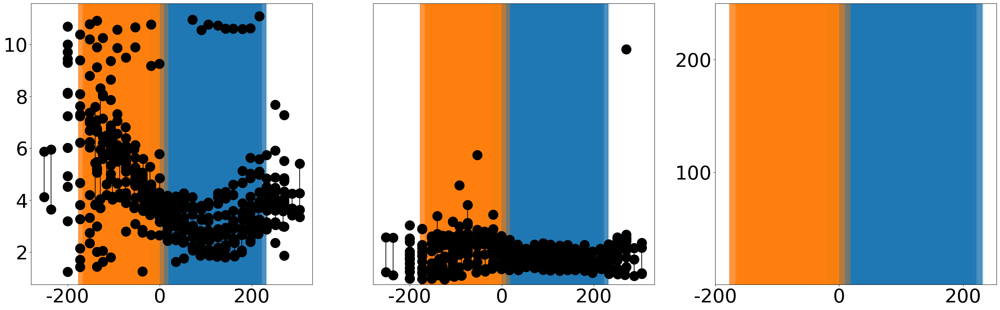

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
816   ACSF             410.364728              None                     NaN
817   ACSF             392.671520              None                     NaN
818   ACSF             374.950347              None                     NaN
819   ACSF             357.013292              None                     NaN
820   ACSF             339.593970              None                     NaN
821   ACSF             321.340120              None                     NaN
822   ACSF             303.502721              None                     NaN
823   ACSF             285.929972              Home                     NaN
824   ACSF             268.070311              Home                     NaN
825   ACSF             251.158275              Home                     NaN
826   ACSF             233.213158              None                     NaN
827   ACSF             215.736314              None                     NaN
828   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4214  ACSF             410.364728              None                     NaN
4215  ACSF             392.671520              None                     NaN
4216  ACSF             374.950347              None                     NaN
4217  ACSF             357.013292              None                     NaN
4218  ACSF             339.593970              None                     NaN
4219  ACSF             321.340120              None                     NaN
4220  ACSF             303.502721              None                     NaN
4221  ACSF             285.929972              Home                     NaN
4222  ACSF             268.070311              Home                     NaN
4223  ACSF             251.158275              Home                     NaN
4224  ACSF             233.213158              None                     NaN
4225  ACSF             215.736314              None                     NaN
4226  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4238  ACSF             410.364728              None                     NaN
4239  ACSF             392.671520              None                     NaN
4240  ACSF             374.950347              None                     NaN
4241  ACSF             357.013292              None                     NaN
4242  ACSF             339.593970              None                     NaN
4243  ACSF             321.340120              None                     NaN
4244  ACSF             303.502721              None                     NaN
4245  ACSF             285.929972              Home                     NaN
4246  ACSF             268.070311              Home                     NaN
4247  ACSF             251.158275              Home                     NaN
4248  ACSF             233.213158              None                     NaN
4249  ACSF             215.736314              None                     NaN
4250  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4262  ACSF             410.364728              None                     NaN
4263  ACSF             392.671520              None                     NaN
4264  ACSF             374.950347              None                     NaN
4265  ACSF             357.013292              None                     NaN
4266  ACSF             339.593970              None                     NaN
4267  ACSF             321.340120              None                     NaN
4268  ACSF             303.502721              None                     NaN
4269  ACSF             285.929972              Home                     NaN
4270  ACSF             268.070311              Home                     NaN
4271  ACSF             251.158275              Home                     NaN
4272  ACSF             233.213158              None                     NaN
4273  ACSF             215.736314              None                     NaN
4274  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4286  ACSF             410.364728              None                     NaN
4287  ACSF             392.671520              None                     NaN
4288  ACSF             374.950347              None                     NaN
4289  ACSF             357.013292              None                     NaN
4290  ACSF             339.593970              None                     NaN
4291  ACSF             321.340120              None                     NaN
4292  ACSF             303.502721              None                     NaN
4293  ACSF             285.929972              Home                     NaN
4294  ACSF             268.070311              Home                     NaN
4295  ACSF             251.158275              Home                     NaN
4296  ACSF             233.213158              None                     NaN
4297  ACSF             215.736314              None                     NaN
4298  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4310  ACSF             410.364728              None                     NaN
4311  ACSF             392.671520              None                     NaN
4312  ACSF             374.950347              None                     NaN
4313  ACSF             357.013292              None                     NaN
4314  ACSF             339.593970              None                     NaN
4315  ACSF             321.340120              None                     NaN
4316  ACSF             303.502721              None                     NaN
4317  ACSF             285.929972              Home                     NaN
4318  ACSF             268.070311              Home                     NaN
4319  ACSF             251.158275              Home                     NaN
4320  ACSF             233.213158              None                     NaN
4321  ACSF             215.736314              None                     NaN
4322  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4334  ACSF             410.364728              None                     NaN
4335  ACSF             392.671520              None                     NaN
4336  ACSF             374.950347              None                     NaN
4337  ACSF             357.013292              None                     NaN
4338  ACSF             339.593970              None                     NaN
4339  ACSF             321.340120              None                     NaN
4340  ACSF             303.502721              None                     NaN
4341  ACSF             285.929972              Home                     NaN
4342  ACSF             268.070311              Home                     NaN
4343  ACSF             251.158275              Home                     NaN
4344  ACSF             233.213158              None                     NaN
4345  ACSF             215.736314              None                     NaN
4346  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4358  ACSF             410.364728              None                     NaN
4359  ACSF             392.671520              None                     NaN
4360  ACSF             374.950347              None                     NaN
4361  ACSF             357.013292              None                     NaN
4362  ACSF             339.593970              None                     NaN
4363  ACSF             321.340120              None                     NaN
4364  ACSF             303.502721              None                     NaN
4365  ACSF             285.929972              Home                     NaN
4366  ACSF             268.070311              Home                     NaN
4367  ACSF             251.158275              Home                     NaN
4368  ACSF             233.213158              None                     NaN
4369  ACSF             215.736314              None                     NaN
4370  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4382  ACSF             410.364728              None                     NaN
4383  ACSF             392.671520              None                     NaN
4384  ACSF             374.950347              None                     NaN
4385  ACSF             357.013292              None                     NaN
4386  ACSF             339.593970              None                     NaN
4387  ACSF             321.340120              None                     NaN
4388  ACSF             303.502721              None                     NaN
4389  ACSF             285.929972              Home                     NaN
4390  ACSF             268.070311              Home                     NaN
4391  ACSF             251.158275              Home                     NaN
4392  ACSF             233.213158              None                     NaN
4393  ACSF             215.736314              None                     NaN
4394  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4406  ACSF             410.364728              None                     NaN
4407  ACSF             392.671520              None                     NaN
4408  ACSF             374.950347              None                     NaN
4409  ACSF             357.013292              None                     NaN
4410  ACSF             339.593970              None                     NaN
4411  ACSF             321.340120              None                     NaN
4412  ACSF             303.502721              None                     NaN
4413  ACSF             285.929972              Home                     NaN
4414  ACSF             268.070311              Home                     NaN
4415  ACSF             251.158275              Home                     NaN
4416  ACSF             233.213158              None                     NaN
4417  ACSF             215.736314              None                     NaN
4418  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4430  ACSF             410.364728              None                     NaN
4431  ACSF             392.671520              None                     NaN
4432  ACSF             374.950347              None                     NaN
4433  ACSF             357.013292              None                     NaN
4434  ACSF             339.593970              None                     NaN
4435  ACSF             321.340120              None                     NaN
4436  ACSF             303.502721              None                     NaN
4437  ACSF             285.929972              Home                     NaN
4438  ACSF             268.070311              Home                     NaN
4439  ACSF             251.158275              Home                     NaN
4440  ACSF             233.213158              None                     NaN
4441  ACSF             215.736314              None                     NaN
4442  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4454  ACSF             410.364728              None                     NaN
4455  ACSF             392.671520              None                     NaN
4456  ACSF             374.950347              None                     NaN
4457  ACSF             357.013292              None                     NaN
4458  ACSF             339.593970              None                     NaN
4459  ACSF             321.340120              None                     NaN
4460  ACSF             303.502721              None                     NaN
4461  ACSF             285.929972              Home                     NaN
4462  ACSF             268.070311              Home                     NaN
4463  ACSF             251.158275              Home                     NaN
4464  ACSF             233.213158              None                     NaN
4465  ACSF             215.736314              None                     NaN
4466  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4478  ACSF             410.364728              None                     NaN
4479  ACSF             392.671520              None                     NaN
4480  ACSF             374.950347              None                     NaN
4481  ACSF             357.013292              None                     NaN
4482  ACSF             339.593970              None                     NaN
4483  ACSF             321.340120              None                     NaN
4484  ACSF             303.502721              None                     NaN
4485  ACSF             285.929972              Home                     NaN
4486  ACSF             268.070311              Home                     NaN
4487  ACSF             251.158275              Home                     NaN
4488  ACSF             233.213158              None                     NaN
4489  ACSF             215.736314              None                     NaN
4490  ACSF  

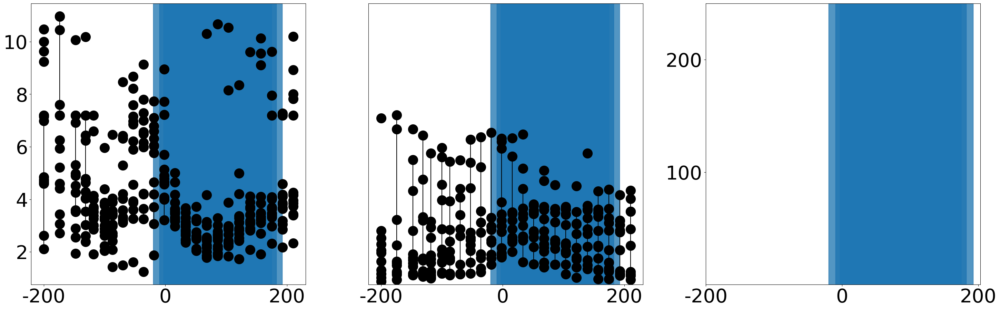

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
840   ACSF             392.159609              None                     NaN
841   ACSF             374.073829              None                     NaN
842   ACSF             356.070783              Home                     NaN
843   ACSF             338.169662              Home                     NaN
844   ACSF             320.458834              Home                     NaN
845   ACSF             302.813583              Home                     NaN
846   ACSF             284.917900              Home                     NaN
847   ACSF             267.014003              Home                     NaN
848   ACSF             249.221833              None                     NaN
849   ACSF             231.090743              None                     NaN
850   ACSF             213.238034              None                     NaN
851   ACSF             195.482445          Neighbor                     NaN
852   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4525  ACSF             392.159609              None                     NaN
4526  ACSF             374.073829              None                     NaN
4527  ACSF             356.070783              Home                     NaN
4528  ACSF             338.169662              Home                     NaN
4529  ACSF             320.458834              Home                     NaN
4530  ACSF             302.813583              Home                     NaN
4531  ACSF             284.917900              Home                     NaN
4532  ACSF             267.014003              Home                     NaN
4533  ACSF             249.221833              None                     NaN
4534  ACSF             231.090743              None                     NaN
4535  ACSF             213.238034              None                     NaN
4536  ACSF             195.482445          Neighbor                     NaN
4537  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4548  ACSF             392.159609              None                     NaN
4549  ACSF             374.073829              None                     NaN
4550  ACSF             356.070783              Home                     NaN
4551  ACSF             338.169662              Home                     NaN
4552  ACSF             320.458834              Home                     NaN
4553  ACSF             302.813583              Home                     NaN
4554  ACSF             284.917900              Home                     NaN
4555  ACSF             267.014003              Home                     NaN
4556  ACSF             249.221833              None                     NaN
4557  ACSF             231.090743              None                     NaN
4558  ACSF             213.238034              None                     NaN
4559  ACSF             195.482445          Neighbor                     NaN
4560  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4571  ACSF             392.159609              None                     NaN
4572  ACSF             374.073829              None                     NaN
4573  ACSF             356.070783              Home                     NaN
4574  ACSF             338.169662              Home                     NaN
4575  ACSF             320.458834              Home                     NaN
4576  ACSF             302.813583              Home                     NaN
4577  ACSF             284.917900              Home                     NaN
4578  ACSF             267.014003              Home                     NaN
4579  ACSF             249.221833              None                     NaN
4580  ACSF             231.090743              None                     NaN
4581  ACSF             213.238034              None                     NaN
4582  ACSF             195.482445          Neighbor                     NaN
4583  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4594  ACSF             392.159609              None                     NaN
4595  ACSF             374.073829              None                     NaN
4596  ACSF             356.070783              Home                     NaN
4597  ACSF             338.169662              Home                     NaN
4598  ACSF             320.458834              Home                     NaN
4599  ACSF             302.813583              Home                     NaN
4600  ACSF             284.917900              Home                     NaN
4601  ACSF             267.014003              Home                     NaN
4602  ACSF             249.221833              None                     NaN
4603  ACSF             231.090743              None                     NaN
4604  ACSF             213.238034              None                     NaN
4605  ACSF             195.482445          Neighbor                     NaN
4606  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4617  ACSF             392.159609              None                     NaN
4618  ACSF             374.073829              None                     NaN
4619  ACSF             356.070783              Home                     NaN
4620  ACSF             338.169662              Home                     NaN
4621  ACSF             320.458834              Home                     NaN
4622  ACSF             302.813583              Home                     NaN
4623  ACSF             284.917900              Home                     NaN
4624  ACSF             267.014003              Home                     NaN
4625  ACSF             249.221833              None                     NaN
4626  ACSF             231.090743              None                     NaN
4627  ACSF             213.238034              None                     NaN
4628  ACSF             195.482445          Neighbor                     NaN
4629  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4640  ACSF             392.159609              None                     NaN
4641  ACSF             374.073829              None                     NaN
4642  ACSF             356.070783              Home                     NaN
4643  ACSF             338.169662              Home                     NaN
4644  ACSF             320.458834              Home                     NaN
4645  ACSF             302.813583              Home                     NaN
4646  ACSF             284.917900              Home                     NaN
4647  ACSF             267.014003              Home                     NaN
4648  ACSF             249.221833              None                     NaN
4649  ACSF             231.090743              None                     NaN
4650  ACSF             213.238034              None                     NaN
4651  ACSF             195.482445          Neighbor                     NaN
4652  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4663  ACSF             392.159609              None                     NaN
4664  ACSF             374.073829              None                     NaN
4665  ACSF             356.070783              Home                     NaN
4666  ACSF             338.169662              Home                     NaN
4667  ACSF             320.458834              Home                     NaN
4668  ACSF             302.813583              Home                     NaN
4669  ACSF             284.917900              Home                     NaN
4670  ACSF             267.014003              Home                     NaN
4671  ACSF             249.221833              None                     NaN
4672  ACSF             231.090743              None                     NaN
4673  ACSF             213.238034              None                     NaN
4674  ACSF             195.482445          Neighbor                     NaN
4675  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4686  ACSF             392.159609              None                     NaN
4687  ACSF             374.073829              None                     NaN
4688  ACSF             356.070783              Home                     NaN
4689  ACSF             338.169662              Home                     NaN
4690  ACSF             320.458834              Home                     NaN
4691  ACSF             302.813583              Home                     NaN
4692  ACSF             284.917900              Home                     NaN
4693  ACSF             267.014003              Home                     NaN
4694  ACSF             249.221833              None                     NaN
4695  ACSF             231.090743              None                     NaN
4696  ACSF             213.238034              None                     NaN
4697  ACSF             195.482445          Neighbor                     NaN
4698  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4709  ACSF             392.159609              None                     NaN
4710  ACSF             374.073829              None                     NaN
4711  ACSF             356.070783              Home                     NaN
4712  ACSF             338.169662              Home                     NaN
4713  ACSF             320.458834              Home                     NaN
4714  ACSF             302.813583              Home                     NaN
4715  ACSF             284.917900              Home                     NaN
4716  ACSF             267.014003              Home                     NaN
4717  ACSF             249.221833              None                     NaN
4718  ACSF             231.090743              None                     NaN
4719  ACSF             213.238034              None                     NaN
4720  ACSF             195.482445          Neighbor                     NaN
4721  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4732  ACSF             392.159609              None                     NaN
4733  ACSF             374.073829              None                     NaN
4734  ACSF             356.070783              Home                     NaN
4735  ACSF             338.169662              Home                     NaN
4736  ACSF             320.458834              Home                     NaN
4737  ACSF             302.813583              Home                     NaN
4738  ACSF             284.917900              Home                     NaN
4739  ACSF             267.014003              Home                     NaN
4740  ACSF             249.221833              None                     NaN
4741  ACSF             231.090743              None                     NaN
4742  ACSF             213.238034              None                     NaN
4743  ACSF             195.482445          Neighbor                     NaN
4744  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4755  ACSF             392.159609              None                     NaN
4756  ACSF             374.073829              None                     NaN
4757  ACSF             356.070783              Home                     NaN
4758  ACSF             338.169662              Home                     NaN
4759  ACSF             320.458834              Home                     NaN
4760  ACSF             302.813583              Home                     NaN
4761  ACSF             284.917900              Home                     NaN
4762  ACSF             267.014003              Home                     NaN
4763  ACSF             249.221833              None                     NaN
4764  ACSF             231.090743              None                     NaN
4765  ACSF             213.238034              None                     NaN
4766  ACSF             195.482445          Neighbor                     NaN
4767  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4778  ACSF             392.159609              None                     NaN
4779  ACSF             374.073829              None                     NaN
4780  ACSF             356.070783              Home                     NaN
4781  ACSF             338.169662              Home                     NaN
4782  ACSF             320.458834              Home                     NaN
4783  ACSF             302.813583              Home                     NaN
4784  ACSF             284.917900              Home                     NaN
4785  ACSF             267.014003              Home                     NaN
4786  ACSF             249.221833              None                     NaN
4787  ACSF             231.090743              None                     NaN
4788  ACSF             213.238034              None                     NaN
4789  ACSF             195.482445          Neighbor                     NaN
4790  ACSF  

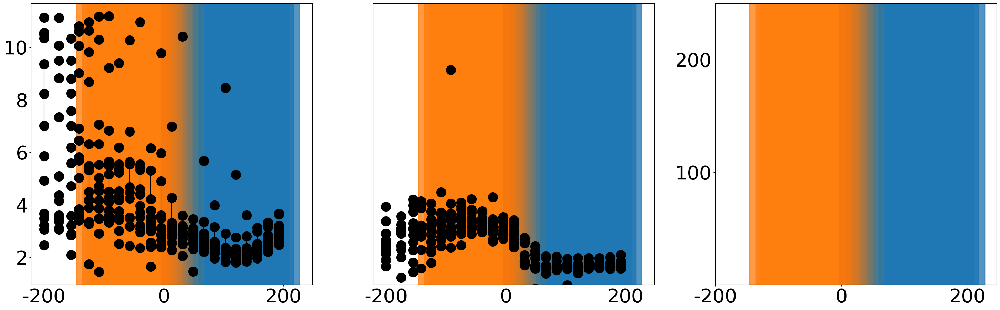

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
863   ACSF             462.354570              None                     NaN
864   ACSF             444.629896          Neighbor                     NaN
865   ACSF             426.739940          Neighbor                     NaN
866   ACSF             408.592944          Neighbor                     NaN
867   ACSF             390.728720          Neighbor                     NaN
868   ACSF             372.743499          Neighbor                     NaN
869   ACSF             354.842774              None                     NaN
870   ACSF             337.260437              Home                     NaN
871   ACSF             319.445397              Home                     NaN
872   ACSF             301.679715              Home                     NaN
873   ACSF             283.808887              Home                     NaN
874   ACSF             266.150551              Home                     NaN
875   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4828  ACSF             462.354570              None                     NaN
4829  ACSF             444.629896          Neighbor                     NaN
4830  ACSF             426.739940          Neighbor                     NaN
4831  ACSF             408.592944          Neighbor                     NaN
4832  ACSF             390.728720          Neighbor                     NaN
4833  ACSF             372.743499          Neighbor                     NaN
4834  ACSF             354.842774              None                     NaN
4835  ACSF             337.260437              Home                     NaN
4836  ACSF             319.445397              Home                     NaN
4837  ACSF             301.679715              Home                     NaN
4838  ACSF             283.808887              Home                     NaN
4839  ACSF             266.150551              Home                     NaN
4840  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4855  ACSF             462.354570              None                     NaN
4856  ACSF             444.629896          Neighbor                     NaN
4857  ACSF             426.739940          Neighbor                     NaN
4858  ACSF             408.592944          Neighbor                     NaN
4859  ACSF             390.728720          Neighbor                     NaN
4860  ACSF             372.743499          Neighbor                     NaN
4861  ACSF             354.842774              None                     NaN
4862  ACSF             337.260437              Home                     NaN
4863  ACSF             319.445397              Home                     NaN
4864  ACSF             301.679715              Home                     NaN
4865  ACSF             283.808887              Home                     NaN
4866  ACSF             266.150551              Home                     NaN
4867  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4882  ACSF             462.354570              None                     NaN
4883  ACSF             444.629896          Neighbor                     NaN
4884  ACSF             426.739940          Neighbor                     NaN
4885  ACSF             408.592944          Neighbor                     NaN
4886  ACSF             390.728720          Neighbor                     NaN
4887  ACSF             372.743499          Neighbor                     NaN
4888  ACSF             354.842774              None                     NaN
4889  ACSF             337.260437              Home                     NaN
4890  ACSF             319.445397              Home                     NaN
4891  ACSF             301.679715              Home                     NaN
4892  ACSF             283.808887              Home                     NaN
4893  ACSF             266.150551              Home                     NaN
4894  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4909  ACSF             462.354570              None                     NaN
4910  ACSF             444.629896          Neighbor                     NaN
4911  ACSF             426.739940          Neighbor                     NaN
4912  ACSF             408.592944          Neighbor                     NaN
4913  ACSF             390.728720          Neighbor                     NaN
4914  ACSF             372.743499          Neighbor                     NaN
4915  ACSF             354.842774              None                     NaN
4916  ACSF             337.260437              Home                     NaN
4917  ACSF             319.445397              Home                     NaN
4918  ACSF             301.679715              Home                     NaN
4919  ACSF             283.808887              Home                     NaN
4920  ACSF             266.150551              Home                     NaN
4921  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4936  ACSF             462.354570              None                     NaN
4937  ACSF             444.629896          Neighbor                     NaN
4938  ACSF             426.739940          Neighbor                     NaN
4939  ACSF             408.592944          Neighbor                     NaN
4940  ACSF             390.728720          Neighbor                     NaN
4941  ACSF             372.743499          Neighbor                     NaN
4942  ACSF             354.842774              None                     NaN
4943  ACSF             337.260437              Home                     NaN
4944  ACSF             319.445397              Home                     NaN
4945  ACSF             301.679715              Home                     NaN
4946  ACSF             283.808887              Home                     NaN
4947  ACSF             266.150551              Home                     NaN
4948  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4963  ACSF             462.354570              None                     NaN
4964  ACSF             444.629896          Neighbor                     NaN
4965  ACSF             426.739940          Neighbor                     NaN
4966  ACSF             408.592944          Neighbor                     NaN
4967  ACSF             390.728720          Neighbor                     NaN
4968  ACSF             372.743499          Neighbor                     NaN
4969  ACSF             354.842774              None                     NaN
4970  ACSF             337.260437              Home                     NaN
4971  ACSF             319.445397              Home                     NaN
4972  ACSF             301.679715              Home                     NaN
4973  ACSF             283.808887              Home                     NaN
4974  ACSF             266.150551              Home                     NaN
4975  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4990  ACSF             462.354570              None                     NaN
4991  ACSF             444.629896          Neighbor                     NaN
4992  ACSF             426.739940          Neighbor                     NaN
4993  ACSF             408.592944          Neighbor                     NaN
4994  ACSF             390.728720          Neighbor                     NaN
4995  ACSF             372.743499          Neighbor                     NaN
4996  ACSF             354.842774              None                     NaN
4997  ACSF             337.260437              Home                     NaN
4998  ACSF             319.445397              Home                     NaN
4999  ACSF             301.679715              Home                     NaN
5000  ACSF             283.808887              Home                     NaN
5001  ACSF             266.150551              Home                     NaN
5002  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5017  ACSF             462.354570              None                     NaN
5018  ACSF             444.629896          Neighbor                     NaN
5019  ACSF             426.739940          Neighbor                     NaN
5020  ACSF             408.592944          Neighbor                     NaN
5021  ACSF             390.728720          Neighbor                     NaN
5022  ACSF             372.743499          Neighbor                     NaN
5023  ACSF             354.842774              None                     NaN
5024  ACSF             337.260437              Home                     NaN
5025  ACSF             319.445397              Home                     NaN
5026  ACSF             301.679715              Home                     NaN
5027  ACSF             283.808887              Home                     NaN
5028  ACSF             266.150551              Home                     NaN
5029  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5044  ACSF             462.354570              None                     NaN
5045  ACSF             444.629896          Neighbor                     NaN
5046  ACSF             426.739940          Neighbor                     NaN
5047  ACSF             408.592944          Neighbor                     NaN
5048  ACSF             390.728720          Neighbor                     NaN
5049  ACSF             372.743499          Neighbor                     NaN
5050  ACSF             354.842774              None                     NaN
5051  ACSF             337.260437              Home                     NaN
5052  ACSF             319.445397              Home                     NaN
5053  ACSF             301.679715              Home                     NaN
5054  ACSF             283.808887              Home                     NaN
5055  ACSF             266.150551              Home                     NaN
5056  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5071  ACSF             462.354570              None                     NaN
5072  ACSF             444.629896          Neighbor                     NaN
5073  ACSF             426.739940          Neighbor                     NaN
5074  ACSF             408.592944          Neighbor                     NaN
5075  ACSF             390.728720          Neighbor                     NaN
5076  ACSF             372.743499          Neighbor                     NaN
5077  ACSF             354.842774              None                     NaN
5078  ACSF             337.260437              Home                     NaN
5079  ACSF             319.445397              Home                     NaN
5080  ACSF             301.679715              Home                     NaN
5081  ACSF             283.808887              Home                     NaN
5082  ACSF             266.150551              Home                     NaN
5083  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5098  ACSF             462.354570              None                     NaN
5099  ACSF             444.629896          Neighbor                     NaN
5100  ACSF             426.739940          Neighbor                     NaN
5101  ACSF             408.592944          Neighbor                     NaN
5102  ACSF             390.728720          Neighbor                     NaN
5103  ACSF             372.743499          Neighbor                     NaN
5104  ACSF             354.842774              None                     NaN
5105  ACSF             337.260437              Home                     NaN
5106  ACSF             319.445397              Home                     NaN
5107  ACSF             301.679715              Home                     NaN
5108  ACSF             283.808887              Home                     NaN
5109  ACSF             266.150551              Home                     NaN
5110  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5125  ACSF             462.354570              None                     NaN
5126  ACSF             444.629896          Neighbor                     NaN
5127  ACSF             426.739940          Neighbor                     NaN
5128  ACSF             408.592944          Neighbor                     NaN
5129  ACSF             390.728720          Neighbor                     NaN
5130  ACSF             372.743499          Neighbor                     NaN
5131  ACSF             354.842774              None                     NaN
5132  ACSF             337.260437              Home                     NaN
5133  ACSF             319.445397              Home                     NaN
5134  ACSF             301.679715              Home                     NaN
5135  ACSF             283.808887              Home                     NaN
5136  ACSF             266.150551              Home                     NaN
5137  ACSF  

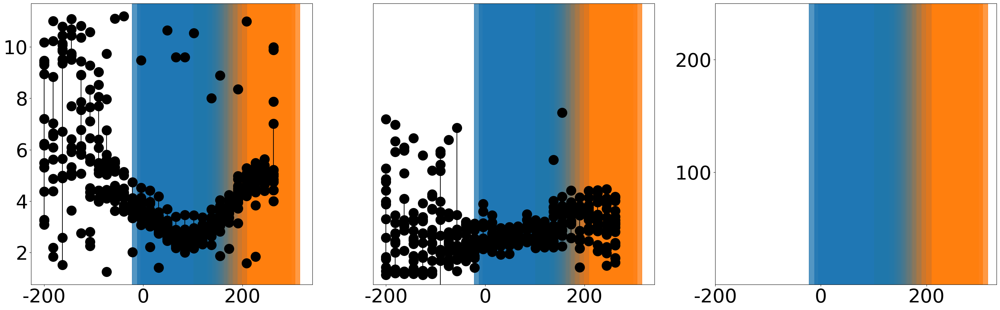

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

     drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
890  ACSF             470.905470          Neighbor                     NaN
891  ACSF             452.895157          Neighbor                     NaN
892  ACSF             435.130477          Neighbor                     NaN
893  ACSF             416.993454              None                     NaN
894  ACSF             398.882880              None                     NaN
895  ACSF             381.615721              Home                     NaN
896  ACSF             362.894631              Home                     NaN
897  ACSF             345.101196              None                     NaN
898  ACSF             327.305808              Home                     NaN
899  ACSF             309.805173              Home                     NaN
900  ACSF             292.855874              None                     NaN
901  ACSF             274.125294              None                     NaN
902  ACSF             256

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5152  ACSF             470.905470          Neighbor                     NaN
5153  ACSF             452.895157          Neighbor                     NaN
5154  ACSF             435.130477          Neighbor                     NaN
5155  ACSF             416.993454              None                     NaN
5156  ACSF             398.882880              None                     NaN
5157  ACSF             381.615721              Home                     NaN
5158  ACSF             362.894631              Home                     NaN
5159  ACSF             345.101196              None                     NaN
5160  ACSF             327.305808              Home                     NaN
5161  ACSF             309.805173              Home                     NaN
5162  ACSF             292.855874              None                     NaN
5163  ACSF             274.125294              None                     NaN
5164  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5179  ACSF             470.905470          Neighbor                     NaN
5180  ACSF             452.895157          Neighbor                     NaN
5181  ACSF             435.130477          Neighbor                     NaN
5182  ACSF             416.993454              None                     NaN
5183  ACSF             398.882880              None                     NaN
5184  ACSF             381.615721              Home                     NaN
5185  ACSF             362.894631              Home                     NaN
5186  ACSF             345.101196              None                     NaN
5187  ACSF             327.305808              Home                     NaN
5188  ACSF             309.805173              Home                     NaN
5189  ACSF             292.855874              None                     NaN
5190  ACSF             274.125294              None                     NaN
5191  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5206  ACSF             470.905470          Neighbor                     NaN
5207  ACSF             452.895157          Neighbor                     NaN
5208  ACSF             435.130477          Neighbor                     NaN
5209  ACSF             416.993454              None                     NaN
5210  ACSF             398.882880              None                     NaN
5211  ACSF             381.615721              Home                     NaN
5212  ACSF             362.894631              Home                     NaN
5213  ACSF             345.101196              None                     NaN
5214  ACSF             327.305808              Home                     NaN
5215  ACSF             309.805173              Home                     NaN
5216  ACSF             292.855874              None                     NaN
5217  ACSF             274.125294              None                     NaN
5218  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5233  ACSF             470.905470          Neighbor                     NaN
5234  ACSF             452.895157          Neighbor                     NaN
5235  ACSF             435.130477          Neighbor                     NaN
5236  ACSF             416.993454              None                     NaN
5237  ACSF             398.882880              None                     NaN
5238  ACSF             381.615721              Home                     NaN
5239  ACSF             362.894631              Home                     NaN
5240  ACSF             345.101196              None                     NaN
5241  ACSF             327.305808              Home                     NaN
5242  ACSF             309.805173              Home                     NaN
5243  ACSF             292.855874              None                     NaN
5244  ACSF             274.125294              None                     NaN
5245  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5260  ACSF             470.905470          Neighbor                     NaN
5261  ACSF             452.895157          Neighbor                     NaN
5262  ACSF             435.130477          Neighbor                     NaN
5263  ACSF             416.993454              None                     NaN
5264  ACSF             398.882880              None                     NaN
5265  ACSF             381.615721              Home                     NaN
5266  ACSF             362.894631              Home                     NaN
5267  ACSF             345.101196              None                     NaN
5268  ACSF             327.305808              Home                     NaN
5269  ACSF             309.805173              Home                     NaN
5270  ACSF             292.855874              None                     NaN
5271  ACSF             274.125294              None                     NaN
5272  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5287  ACSF             470.905470          Neighbor                     NaN
5288  ACSF             452.895157          Neighbor                     NaN
5289  ACSF             435.130477          Neighbor                     NaN
5290  ACSF             416.993454              None                     NaN
5291  ACSF             398.882880              None                     NaN
5292  ACSF             381.615721              Home                     NaN
5293  ACSF             362.894631              Home                     NaN
5294  ACSF             345.101196              None                     NaN
5295  ACSF             327.305808              Home                     NaN
5296  ACSF             309.805173              Home                     NaN
5297  ACSF             292.855874              None                     NaN
5298  ACSF             274.125294              None                     NaN
5299  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5314  ACSF             470.905470          Neighbor                     NaN
5315  ACSF             452.895157          Neighbor                     NaN
5316  ACSF             435.130477          Neighbor                     NaN
5317  ACSF             416.993454              None                     NaN
5318  ACSF             398.882880              None                     NaN
5319  ACSF             381.615721              Home                     NaN
5320  ACSF             362.894631              Home                     NaN
5321  ACSF             345.101196              None                     NaN
5322  ACSF             327.305808              Home                     NaN
5323  ACSF             309.805173              Home                     NaN
5324  ACSF             292.855874              None                     NaN
5325  ACSF             274.125294              None                     NaN
5326  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5341  ACSF             470.905470          Neighbor                     NaN
5342  ACSF             452.895157          Neighbor                     NaN
5343  ACSF             435.130477          Neighbor                     NaN
5344  ACSF             416.993454              None                     NaN
5345  ACSF             398.882880              None                     NaN
5346  ACSF             381.615721              Home                     NaN
5347  ACSF             362.894631              Home                     NaN
5348  ACSF             345.101196              None                     NaN
5349  ACSF             327.305808              Home                     NaN
5350  ACSF             309.805173              Home                     NaN
5351  ACSF             292.855874              None                     NaN
5352  ACSF             274.125294              None                     NaN
5353  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5368  ACSF             470.905470          Neighbor                     NaN
5369  ACSF             452.895157          Neighbor                     NaN
5370  ACSF             435.130477          Neighbor                     NaN
5371  ACSF             416.993454              None                     NaN
5372  ACSF             398.882880              None                     NaN
5373  ACSF             381.615721              Home                     NaN
5374  ACSF             362.894631              Home                     NaN
5375  ACSF             345.101196              None                     NaN
5376  ACSF             327.305808              Home                     NaN
5377  ACSF             309.805173              Home                     NaN
5378  ACSF             292.855874              None                     NaN
5379  ACSF             274.125294              None                     NaN
5380  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5395  ACSF             470.905470          Neighbor                     NaN
5396  ACSF             452.895157          Neighbor                     NaN
5397  ACSF             435.130477          Neighbor                     NaN
5398  ACSF             416.993454              None                     NaN
5399  ACSF             398.882880              None                     NaN
5400  ACSF             381.615721              Home                     NaN
5401  ACSF             362.894631              Home                     NaN
5402  ACSF             345.101196              None                     NaN
5403  ACSF             327.305808              Home                     NaN
5404  ACSF             309.805173              Home                     NaN
5405  ACSF             292.855874              None                     NaN
5406  ACSF             274.125294              None                     NaN
5407  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5422  ACSF             470.905470          Neighbor                     NaN
5423  ACSF             452.895157          Neighbor                     NaN
5424  ACSF             435.130477          Neighbor                     NaN
5425  ACSF             416.993454              None                     NaN
5426  ACSF             398.882880              None                     NaN
5427  ACSF             381.615721              Home                     NaN
5428  ACSF             362.894631              Home                     NaN
5429  ACSF             345.101196              None                     NaN
5430  ACSF             327.305808              Home                     NaN
5431  ACSF             309.805173              Home                     NaN
5432  ACSF             292.855874              None                     NaN
5433  ACSF             274.125294              None                     NaN
5434  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5449  ACSF             470.905470          Neighbor                     NaN
5450  ACSF             452.895157          Neighbor                     NaN
5451  ACSF             435.130477          Neighbor                     NaN
5452  ACSF             416.993454              None                     NaN
5453  ACSF             398.882880              None                     NaN
5454  ACSF             381.615721              Home                     NaN
5455  ACSF             362.894631              Home                     NaN
5456  ACSF             345.101196              None                     NaN
5457  ACSF             327.305808              Home                     NaN
5458  ACSF             309.805173              Home                     NaN
5459  ACSF             292.855874              None                     NaN
5460  ACSF             274.125294              None                     NaN
5461  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5476  ACSF             470.905470          Neighbor                     NaN
5477  ACSF             452.895157          Neighbor                     NaN
5478  ACSF             435.130477          Neighbor                     NaN
5479  ACSF             416.993454              None                     NaN
5480  ACSF             398.882880              None                     NaN
5481  ACSF             381.615721              Home                     NaN
5482  ACSF             362.894631              Home                     NaN
5483  ACSF             345.101196              None                     NaN
5484  ACSF             327.305808              Home                     NaN
5485  ACSF             309.805173              Home                     NaN
5486  ACSF             292.855874              None                     NaN
5487  ACSF             274.125294              None                     NaN
5488  ACSF  

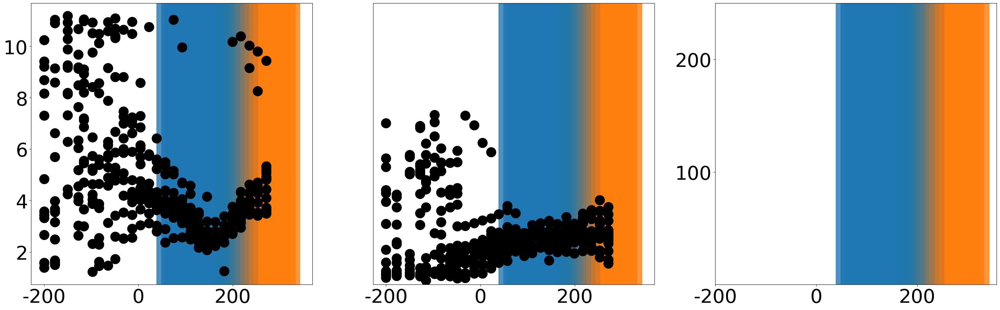

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
917   ACSF             453.013476              None                     NaN
918   ACSF             434.446096              None                     NaN
919   ACSF             417.171747              None                     NaN
920   ACSF             398.664068          Neighbor                     NaN
921   ACSF             380.777329          Neighbor                     NaN
922   ACSF             362.430964          Neighbor                     NaN
923   ACSF             344.901647          Neighbor                     NaN
924   ACSF             327.715838              None                     NaN
925   ACSF             309.207633              None                     NaN
926   ACSF             291.049284              Home                     NaN
927   ACSF             272.736394              Home                     NaN
928   ACSF             256.347359              Home                     NaN
929   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5529  ACSF             453.013476              None                     NaN
5530  ACSF             434.446096              None                     NaN
5531  ACSF             417.171747              None                     NaN
5532  ACSF             398.664068          Neighbor                     NaN
5533  ACSF             380.777329          Neighbor                     NaN
5534  ACSF             362.430964          Neighbor                     NaN
5535  ACSF             344.901647          Neighbor                     NaN
5536  ACSF             327.715838              None                     NaN
5537  ACSF             309.207633              None                     NaN
5538  ACSF             291.049284              Home                     NaN
5539  ACSF             272.736394              Home                     NaN
5540  ACSF             256.347359              Home                     NaN
5541  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5555  ACSF             453.013476              None                     NaN
5556  ACSF             434.446096              None                     NaN
5557  ACSF             417.171747              None                     NaN
5558  ACSF             398.664068          Neighbor                     NaN
5559  ACSF             380.777329          Neighbor                     NaN
5560  ACSF             362.430964          Neighbor                     NaN
5561  ACSF             344.901647          Neighbor                     NaN
5562  ACSF             327.715838              None                     NaN
5563  ACSF             309.207633              None                     NaN
5564  ACSF             291.049284              Home                     NaN
5565  ACSF             272.736394              Home                     NaN
5566  ACSF             256.347359              Home                     NaN
5567  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5581  ACSF             453.013476              None                     NaN
5582  ACSF             434.446096              None                     NaN
5583  ACSF             417.171747              None                     NaN
5584  ACSF             398.664068          Neighbor                     NaN
5585  ACSF             380.777329          Neighbor                     NaN
5586  ACSF             362.430964          Neighbor                     NaN
5587  ACSF             344.901647          Neighbor                     NaN
5588  ACSF             327.715838              None                     NaN
5589  ACSF             309.207633              None                     NaN
5590  ACSF             291.049284              Home                     NaN
5591  ACSF             272.736394              Home                     NaN
5592  ACSF             256.347359              Home                     NaN
5593  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5607  ACSF             453.013476              None                     NaN
5608  ACSF             434.446096              None                     NaN
5609  ACSF             417.171747              None                     NaN
5610  ACSF             398.664068          Neighbor                     NaN
5611  ACSF             380.777329          Neighbor                     NaN
5612  ACSF             362.430964          Neighbor                     NaN
5613  ACSF             344.901647          Neighbor                     NaN
5614  ACSF             327.715838              None                     NaN
5615  ACSF             309.207633              None                     NaN
5616  ACSF             291.049284              Home                     NaN
5617  ACSF             272.736394              Home                     NaN
5618  ACSF             256.347359              Home                     NaN
5619  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5633  ACSF             453.013476              None                     NaN
5634  ACSF             434.446096              None                     NaN
5635  ACSF             417.171747              None                     NaN
5636  ACSF             398.664068          Neighbor                     NaN
5637  ACSF             380.777329          Neighbor                     NaN
5638  ACSF             362.430964          Neighbor                     NaN
5639  ACSF             344.901647          Neighbor                     NaN
5640  ACSF             327.715838              None                     NaN
5641  ACSF             309.207633              None                     NaN
5642  ACSF             291.049284              Home                     NaN
5643  ACSF             272.736394              Home                     NaN
5644  ACSF             256.347359              Home                     NaN
5645  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5659  ACSF             453.013476              None                     NaN
5660  ACSF             434.446096              None                     NaN
5661  ACSF             417.171747              None                     NaN
5662  ACSF             398.664068          Neighbor                     NaN
5663  ACSF             380.777329          Neighbor                     NaN
5664  ACSF             362.430964          Neighbor                     NaN
5665  ACSF             344.901647          Neighbor                     NaN
5666  ACSF             327.715838              None                     NaN
5667  ACSF             309.207633              None                     NaN
5668  ACSF             291.049284              Home                     NaN
5669  ACSF             272.736394              Home                     NaN
5670  ACSF             256.347359              Home                     NaN
5671  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5685  ACSF             453.013476              None                     NaN
5686  ACSF             434.446096              None                     NaN
5687  ACSF             417.171747              None                     NaN
5688  ACSF             398.664068          Neighbor                     NaN
5689  ACSF             380.777329          Neighbor                     NaN
5690  ACSF             362.430964          Neighbor                     NaN
5691  ACSF             344.901647          Neighbor                     NaN
5692  ACSF             327.715838              None                     NaN
5693  ACSF             309.207633              None                     NaN
5694  ACSF             291.049284              Home                     NaN
5695  ACSF             272.736394              Home                     NaN
5696  ACSF             256.347359              Home                     NaN
5697  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5711  ACSF             453.013476              None                     NaN
5712  ACSF             434.446096              None                     NaN
5713  ACSF             417.171747              None                     NaN
5714  ACSF             398.664068          Neighbor                     NaN
5715  ACSF             380.777329          Neighbor                     NaN
5716  ACSF             362.430964          Neighbor                     NaN
5717  ACSF             344.901647          Neighbor                     NaN
5718  ACSF             327.715838              None                     NaN
5719  ACSF             309.207633              None                     NaN
5720  ACSF             291.049284              Home                     NaN
5721  ACSF             272.736394              Home                     NaN
5722  ACSF             256.347359              Home                     NaN
5723  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5737  ACSF             453.013476              None                     NaN
5738  ACSF             434.446096              None                     NaN
5739  ACSF             417.171747              None                     NaN
5740  ACSF             398.664068          Neighbor                     NaN
5741  ACSF             380.777329          Neighbor                     NaN
5742  ACSF             362.430964          Neighbor                     NaN
5743  ACSF             344.901647          Neighbor                     NaN
5744  ACSF             327.715838              None                     NaN
5745  ACSF             309.207633              None                     NaN
5746  ACSF             291.049284              Home                     NaN
5747  ACSF             272.736394              Home                     NaN
5748  ACSF             256.347359              Home                     NaN
5749  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5763  ACSF             453.013476              None                     NaN
5764  ACSF             434.446096              None                     NaN
5765  ACSF             417.171747              None                     NaN
5766  ACSF             398.664068          Neighbor                     NaN
5767  ACSF             380.777329          Neighbor                     NaN
5768  ACSF             362.430964          Neighbor                     NaN
5769  ACSF             344.901647          Neighbor                     NaN
5770  ACSF             327.715838              None                     NaN
5771  ACSF             309.207633              None                     NaN
5772  ACSF             291.049284              Home                     NaN
5773  ACSF             272.736394              Home                     NaN
5774  ACSF             256.347359              Home                     NaN
5775  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5789  ACSF             453.013476              None                     NaN
5790  ACSF             434.446096              None                     NaN
5791  ACSF             417.171747              None                     NaN
5792  ACSF             398.664068          Neighbor                     NaN
5793  ACSF             380.777329          Neighbor                     NaN
5794  ACSF             362.430964          Neighbor                     NaN
5795  ACSF             344.901647          Neighbor                     NaN
5796  ACSF             327.715838              None                     NaN
5797  ACSF             309.207633              None                     NaN
5798  ACSF             291.049284              Home                     NaN
5799  ACSF             272.736394              Home                     NaN
5800  ACSF             256.347359              Home                     NaN
5801  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5815  ACSF             453.013476              None                     NaN
5816  ACSF             434.446096              None                     NaN
5817  ACSF             417.171747              None                     NaN
5818  ACSF             398.664068          Neighbor                     NaN
5819  ACSF             380.777329          Neighbor                     NaN
5820  ACSF             362.430964          Neighbor                     NaN
5821  ACSF             344.901647          Neighbor                     NaN
5822  ACSF             327.715838              None                     NaN
5823  ACSF             309.207633              None                     NaN
5824  ACSF             291.049284              Home                     NaN
5825  ACSF             272.736394              Home                     NaN
5826  ACSF             256.347359              Home                     NaN
5827  ACSF  

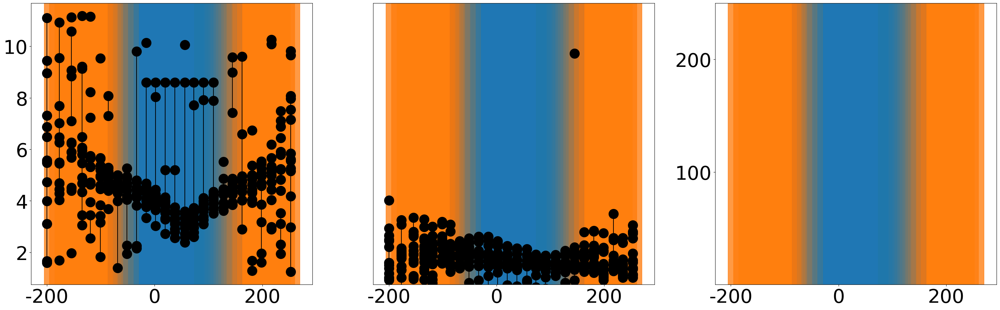

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
943   ACSF             458.705640              None                     NaN
944   ACSF             439.978643              None                     NaN
945   ACSF             421.373419              None                     NaN
946   ACSF             403.863390              None                     NaN
947   ACSF             385.292097              None                     NaN
948   ACSF             367.333170              None                     NaN
949   ACSF             349.580700              None                     NaN
950   ACSF             332.676313              None                     NaN
951   ACSF             314.885320              Home                     NaN
952   ACSF             296.185390              Home                     NaN
953   ACSF             278.730668              Home                     NaN
954   ACSF             259.966125              Home                     NaN
955   ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5867  ACSF             458.705640              None                     NaN
5868  ACSF             439.978643              None                     NaN
5869  ACSF             421.373419              None                     NaN
5870  ACSF             403.863390              None                     NaN
5871  ACSF             385.292097              None                     NaN
5872  ACSF             367.333170              None                     NaN
5873  ACSF             349.580700              None                     NaN
5874  ACSF             332.676313              None                     NaN
5875  ACSF             314.885320              Home                     NaN
5876  ACSF             296.185390              Home                     NaN
5877  ACSF             278.730668              Home                     NaN
5878  ACSF             259.966125              Home                     NaN
5879  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5893  ACSF             458.705640              None                     NaN
5894  ACSF             439.978643              None                     NaN
5895  ACSF             421.373419              None                     NaN
5896  ACSF             403.863390              None                     NaN
5897  ACSF             385.292097              None                     NaN
5898  ACSF             367.333170              None                     NaN
5899  ACSF             349.580700              None                     NaN
5900  ACSF             332.676313              None                     NaN
5901  ACSF             314.885320              Home                     NaN
5902  ACSF             296.185390              Home                     NaN
5903  ACSF             278.730668              Home                     NaN
5904  ACSF             259.966125              Home                     NaN
5905  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5919  ACSF             458.705640              None                     NaN
5920  ACSF             439.978643              None                     NaN
5921  ACSF             421.373419              None                     NaN
5922  ACSF             403.863390              None                     NaN
5923  ACSF             385.292097              None                     NaN
5924  ACSF             367.333170              None                     NaN
5925  ACSF             349.580700              None                     NaN
5926  ACSF             332.676313              None                     NaN
5927  ACSF             314.885320              Home                     NaN
5928  ACSF             296.185390              Home                     NaN
5929  ACSF             278.730668              Home                     NaN
5930  ACSF             259.966125              Home                     NaN
5931  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5945  ACSF             458.705640              None                     NaN
5946  ACSF             439.978643              None                     NaN
5947  ACSF             421.373419              None                     NaN
5948  ACSF             403.863390              None                     NaN
5949  ACSF             385.292097              None                     NaN
5950  ACSF             367.333170              None                     NaN
5951  ACSF             349.580700              None                     NaN
5952  ACSF             332.676313              None                     NaN
5953  ACSF             314.885320              Home                     NaN
5954  ACSF             296.185390              Home                     NaN
5955  ACSF             278.730668              Home                     NaN
5956  ACSF             259.966125              Home                     NaN
5957  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5971  ACSF             458.705640              None                     NaN
5972  ACSF             439.978643              None                     NaN
5973  ACSF             421.373419              None                     NaN
5974  ACSF             403.863390              None                     NaN
5975  ACSF             385.292097              None                     NaN
5976  ACSF             367.333170              None                     NaN
5977  ACSF             349.580700              None                     NaN
5978  ACSF             332.676313              None                     NaN
5979  ACSF             314.885320              Home                     NaN
5980  ACSF             296.185390              Home                     NaN
5981  ACSF             278.730668              Home                     NaN
5982  ACSF             259.966125              Home                     NaN
5983  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
5997  ACSF             458.705640              None                     NaN
5998  ACSF             439.978643              None                     NaN
5999  ACSF             421.373419              None                     NaN
6000  ACSF             403.863390              None                     NaN
6001  ACSF             385.292097              None                     NaN
6002  ACSF             367.333170              None                     NaN
6003  ACSF             349.580700              None                     NaN
6004  ACSF             332.676313              None                     NaN
6005  ACSF             314.885320              Home                     NaN
6006  ACSF             296.185390              Home                     NaN
6007  ACSF             278.730668              Home                     NaN
6008  ACSF             259.966125              Home                     NaN
6009  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6023  ACSF             458.705640              None                     NaN
6024  ACSF             439.978643              None                     NaN
6025  ACSF             421.373419              None                     NaN
6026  ACSF             403.863390              None                     NaN
6027  ACSF             385.292097              None                     NaN
6028  ACSF             367.333170              None                     NaN
6029  ACSF             349.580700              None                     NaN
6030  ACSF             332.676313              None                     NaN
6031  ACSF             314.885320              Home                     NaN
6032  ACSF             296.185390              Home                     NaN
6033  ACSF             278.730668              Home                     NaN
6034  ACSF             259.966125              Home                     NaN
6035  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6049  ACSF             458.705640              None                     NaN
6050  ACSF             439.978643              None                     NaN
6051  ACSF             421.373419              None                     NaN
6052  ACSF             403.863390              None                     NaN
6053  ACSF             385.292097              None                     NaN
6054  ACSF             367.333170              None                     NaN
6055  ACSF             349.580700              None                     NaN
6056  ACSF             332.676313              None                     NaN
6057  ACSF             314.885320              Home                     NaN
6058  ACSF             296.185390              Home                     NaN
6059  ACSF             278.730668              Home                     NaN
6060  ACSF             259.966125              Home                     NaN
6061  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6075  ACSF             458.705640              None                     NaN
6076  ACSF             439.978643              None                     NaN
6077  ACSF             421.373419              None                     NaN
6078  ACSF             403.863390              None                     NaN
6079  ACSF             385.292097              None                     NaN
6080  ACSF             367.333170              None                     NaN
6081  ACSF             349.580700              None                     NaN
6082  ACSF             332.676313              None                     NaN
6083  ACSF             314.885320              Home                     NaN
6084  ACSF             296.185390              Home                     NaN
6085  ACSF             278.730668              Home                     NaN
6086  ACSF             259.966125              Home                     NaN
6087  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6101  ACSF             458.705640              None                     NaN
6102  ACSF             439.978643              None                     NaN
6103  ACSF             421.373419              None                     NaN
6104  ACSF             403.863390              None                     NaN
6105  ACSF             385.292097              None                     NaN
6106  ACSF             367.333170              None                     NaN
6107  ACSF             349.580700              None                     NaN
6108  ACSF             332.676313              None                     NaN
6109  ACSF             314.885320              Home                     NaN
6110  ACSF             296.185390              Home                     NaN
6111  ACSF             278.730668              Home                     NaN
6112  ACSF             259.966125              Home                     NaN
6113  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6127  ACSF             458.705640              None                     NaN
6128  ACSF             439.978643              None                     NaN
6129  ACSF             421.373419              None                     NaN
6130  ACSF             403.863390              None                     NaN
6131  ACSF             385.292097              None                     NaN
6132  ACSF             367.333170              None                     NaN
6133  ACSF             349.580700              None                     NaN
6134  ACSF             332.676313              None                     NaN
6135  ACSF             314.885320              Home                     NaN
6136  ACSF             296.185390              Home                     NaN
6137  ACSF             278.730668              Home                     NaN
6138  ACSF             259.966125              Home                     NaN
6139  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
6153  ACSF             458.705640              None                     NaN
6154  ACSF             439.978643              None                     NaN
6155  ACSF             421.373419              None                     NaN
6156  ACSF             403.863390              None                     NaN
6157  ACSF             385.292097              None                     NaN
6158  ACSF             367.333170              None                     NaN
6159  ACSF             349.580700              None                     NaN
6160  ACSF             332.676313              None                     NaN
6161  ACSF             314.885320              Home                     NaN
6162  ACSF             296.185390              Home                     NaN
6163  ACSF             278.730668              Home                     NaN
6164  ACSF             259.966125              Home                     NaN
6165  ACSF  

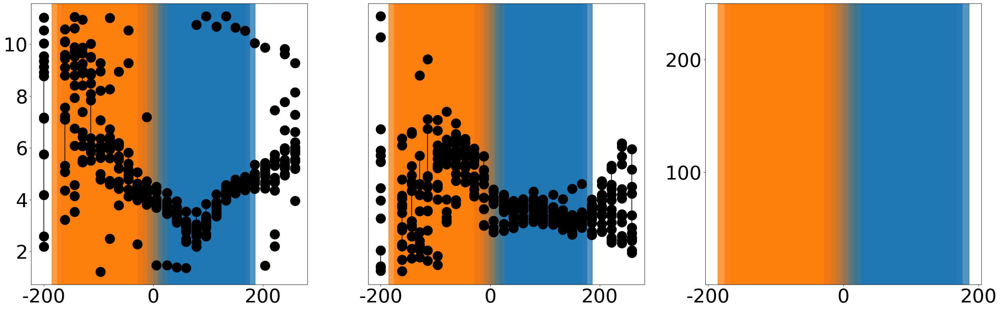

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1048  ACSF             439.063977              None                     NaN
1049  ACSF             421.438778              None                     NaN
1050  ACSF             403.856272              None                     NaN
1051  ACSF             385.687892              None                     NaN
1052  ACSF             367.183998          Neighbor                     NaN
1053  ACSF             350.351167              None                     NaN
1054  ACSF             332.121242          Neighbor                     NaN
1055  ACSF             313.693233          Neighbor                     NaN
1056  ACSF             296.069058          Neighbor                     NaN
1057  ACSF             277.878090              None                     NaN
1058  ACSF             260.127122              None                     NaN
1059  ACSF             242.362840              None                     NaN
1060  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7821  ACSF             439.063977              None                     NaN
7822  ACSF             421.438778              None                     NaN
7823  ACSF             403.856272              None                     NaN
7824  ACSF             385.687892              None                     NaN
7825  ACSF             367.183998          Neighbor                     NaN
7826  ACSF             350.351167              None                     NaN
7827  ACSF             332.121242          Neighbor                     NaN
7828  ACSF             313.693233          Neighbor                     NaN
7829  ACSF             296.069058          Neighbor                     NaN
7830  ACSF             277.878090              None                     NaN
7831  ACSF             260.127122              None                     NaN
7832  ACSF             242.362840              None                     NaN
7833  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7847  ACSF             439.063977              None                     NaN
7848  ACSF             421.438778              None                     NaN
7849  ACSF             403.856272              None                     NaN
7850  ACSF             385.687892              None                     NaN
7851  ACSF             367.183998          Neighbor                     NaN
7852  ACSF             350.351167              None                     NaN
7853  ACSF             332.121242          Neighbor                     NaN
7854  ACSF             313.693233          Neighbor                     NaN
7855  ACSF             296.069058          Neighbor                     NaN
7856  ACSF             277.878090              None                     NaN
7857  ACSF             260.127122              None                     NaN
7858  ACSF             242.362840              None                     NaN
7859  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7873  ACSF             439.063977              None                     NaN
7874  ACSF             421.438778              None                     NaN
7875  ACSF             403.856272              None                     NaN
7876  ACSF             385.687892              None                     NaN
7877  ACSF             367.183998          Neighbor                     NaN
7878  ACSF             350.351167              None                     NaN
7879  ACSF             332.121242          Neighbor                     NaN
7880  ACSF             313.693233          Neighbor                     NaN
7881  ACSF             296.069058          Neighbor                     NaN
7882  ACSF             277.878090              None                     NaN
7883  ACSF             260.127122              None                     NaN
7884  ACSF             242.362840              None                     NaN
7885  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7899  ACSF             439.063977              None                     NaN
7900  ACSF             421.438778              None                     NaN
7901  ACSF             403.856272              None                     NaN
7902  ACSF             385.687892              None                     NaN
7903  ACSF             367.183998          Neighbor                     NaN
7904  ACSF             350.351167              None                     NaN
7905  ACSF             332.121242          Neighbor                     NaN
7906  ACSF             313.693233          Neighbor                     NaN
7907  ACSF             296.069058          Neighbor                     NaN
7908  ACSF             277.878090              None                     NaN
7909  ACSF             260.127122              None                     NaN
7910  ACSF             242.362840              None                     NaN
7911  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7925  ACSF             439.063977              None                     NaN
7926  ACSF             421.438778              None                     NaN
7927  ACSF             403.856272              None                     NaN
7928  ACSF             385.687892              None                     NaN
7929  ACSF             367.183998          Neighbor                     NaN
7930  ACSF             350.351167              None                     NaN
7931  ACSF             332.121242          Neighbor                     NaN
7932  ACSF             313.693233          Neighbor                     NaN
7933  ACSF             296.069058          Neighbor                     NaN
7934  ACSF             277.878090              None                     NaN
7935  ACSF             260.127122              None                     NaN
7936  ACSF             242.362840              None                     NaN
7937  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7951  ACSF             439.063977              None                     NaN
7952  ACSF             421.438778              None                     NaN
7953  ACSF             403.856272              None                     NaN
7954  ACSF             385.687892              None                     NaN
7955  ACSF             367.183998          Neighbor                     NaN
7956  ACSF             350.351167              None                     NaN
7957  ACSF             332.121242          Neighbor                     NaN
7958  ACSF             313.693233          Neighbor                     NaN
7959  ACSF             296.069058          Neighbor                     NaN
7960  ACSF             277.878090              None                     NaN
7961  ACSF             260.127122              None                     NaN
7962  ACSF             242.362840              None                     NaN
7963  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
7977  ACSF             439.063977              None                     NaN
7978  ACSF             421.438778              None                     NaN
7979  ACSF             403.856272              None                     NaN
7980  ACSF             385.687892              None                     NaN
7981  ACSF             367.183998          Neighbor                     NaN
7982  ACSF             350.351167              None                     NaN
7983  ACSF             332.121242          Neighbor                     NaN
7984  ACSF             313.693233          Neighbor                     NaN
7985  ACSF             296.069058          Neighbor                     NaN
7986  ACSF             277.878090              None                     NaN
7987  ACSF             260.127122              None                     NaN
7988  ACSF             242.362840              None                     NaN
7989  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8003  ACSF             439.063977              None                     NaN
8004  ACSF             421.438778              None                     NaN
8005  ACSF             403.856272              None                     NaN
8006  ACSF             385.687892              None                     NaN
8007  ACSF             367.183998          Neighbor                     NaN
8008  ACSF             350.351167              None                     NaN
8009  ACSF             332.121242          Neighbor                     NaN
8010  ACSF             313.693233          Neighbor                     NaN
8011  ACSF             296.069058          Neighbor                     NaN
8012  ACSF             277.878090              None                     NaN
8013  ACSF             260.127122              None                     NaN
8014  ACSF             242.362840              None                     NaN
8015  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8029  ACSF             439.063977              None                     NaN
8030  ACSF             421.438778              None                     NaN
8031  ACSF             403.856272              None                     NaN
8032  ACSF             385.687892              None                     NaN
8033  ACSF             367.183998          Neighbor                     NaN
8034  ACSF             350.351167              None                     NaN
8035  ACSF             332.121242          Neighbor                     NaN
8036  ACSF             313.693233          Neighbor                     NaN
8037  ACSF             296.069058          Neighbor                     NaN
8038  ACSF             277.878090              None                     NaN
8039  ACSF             260.127122              None                     NaN
8040  ACSF             242.362840              None                     NaN
8041  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8055  ACSF             439.063977              None                     NaN
8056  ACSF             421.438778              None                     NaN
8057  ACSF             403.856272              None                     NaN
8058  ACSF             385.687892              None                     NaN
8059  ACSF             367.183998          Neighbor                     NaN
8060  ACSF             350.351167              None                     NaN
8061  ACSF             332.121242          Neighbor                     NaN
8062  ACSF             313.693233          Neighbor                     NaN
8063  ACSF             296.069058          Neighbor                     NaN
8064  ACSF             277.878090              None                     NaN
8065  ACSF             260.127122              None                     NaN
8066  ACSF             242.362840              None                     NaN
8067  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8081  ACSF             439.063977              None                     NaN
8082  ACSF             421.438778              None                     NaN
8083  ACSF             403.856272              None                     NaN
8084  ACSF             385.687892              None                     NaN
8085  ACSF             367.183998          Neighbor                     NaN
8086  ACSF             350.351167              None                     NaN
8087  ACSF             332.121242          Neighbor                     NaN
8088  ACSF             313.693233          Neighbor                     NaN
8089  ACSF             296.069058          Neighbor                     NaN
8090  ACSF             277.878090              None                     NaN
8091  ACSF             260.127122              None                     NaN
8092  ACSF             242.362840              None                     NaN
8093  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8107  ACSF             439.063977              None                     NaN
8108  ACSF             421.438778              None                     NaN
8109  ACSF             403.856272              None                     NaN
8110  ACSF             385.687892              None                     NaN
8111  ACSF             367.183998          Neighbor                     NaN
8112  ACSF             350.351167              None                     NaN
8113  ACSF             332.121242          Neighbor                     NaN
8114  ACSF             313.693233          Neighbor                     NaN
8115  ACSF             296.069058          Neighbor                     NaN
8116  ACSF             277.878090              None                     NaN
8117  ACSF             260.127122              None                     NaN
8118  ACSF             242.362840              None                     NaN
8119  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8133  ACSF             439.063977              None                     NaN
8134  ACSF             421.438778              None                     NaN
8135  ACSF             403.856272              None                     NaN
8136  ACSF             385.687892              None                     NaN
8137  ACSF             367.183998          Neighbor                     NaN
8138  ACSF             350.351167              None                     NaN
8139  ACSF             332.121242          Neighbor                     NaN
8140  ACSF             313.693233          Neighbor                     NaN
8141  ACSF             296.069058          Neighbor                     NaN
8142  ACSF             277.878090              None                     NaN
8143  ACSF             260.127122              None                     NaN
8144  ACSF             242.362840              None                     NaN
8145  ACSF  

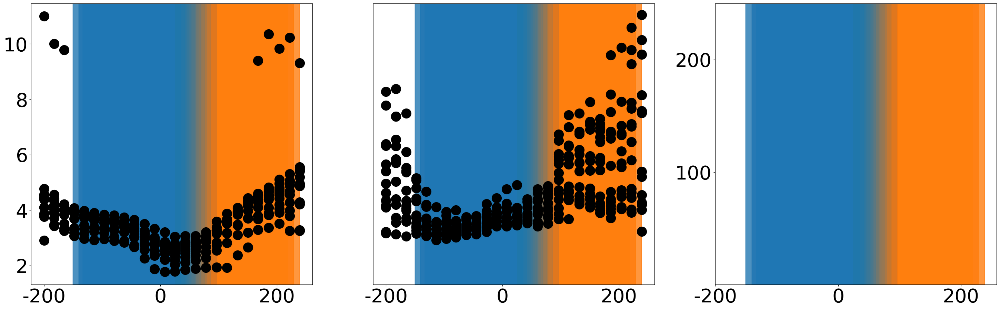

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1074  ACSF             395.166720              None                     NaN
1075  ACSF             377.544136              Home                     NaN
1076  ACSF             359.490349              Home                     NaN
1077  ACSF             341.972920              Home                     NaN
1078  ACSF             324.148394              Home                     NaN
1079  ACSF             306.212835              Home                     NaN
1080  ACSF             288.914406              Home                     NaN
1081  ACSF             271.477717              None                     NaN
1082  ACSF             254.473408              None                     NaN
1083  ACSF             236.387074              None                     NaN
1084  ACSF             218.790195              None                     NaN
1085  ACSF             201.409917              None                     NaN
1086  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8159  ACSF             395.166720              None                     NaN
8160  ACSF             377.544136              Home                     NaN
8161  ACSF             359.490349              Home                     NaN
8162  ACSF             341.972920              Home                     NaN
8163  ACSF             324.148394              Home                     NaN
8164  ACSF             306.212835              Home                     NaN
8165  ACSF             288.914406              Home                     NaN
8166  ACSF             271.477717              None                     NaN
8167  ACSF             254.473408              None                     NaN
8168  ACSF             236.387074              None                     NaN
8169  ACSF             218.790195              None                     NaN
8170  ACSF             201.409917              None                     NaN
8171  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8182  ACSF             395.166720              None                     NaN
8183  ACSF             377.544136              Home                     NaN
8184  ACSF             359.490349              Home                     NaN
8185  ACSF             341.972920              Home                     NaN
8186  ACSF             324.148394              Home                     NaN
8187  ACSF             306.212835              Home                     NaN
8188  ACSF             288.914406              Home                     NaN
8189  ACSF             271.477717              None                     NaN
8190  ACSF             254.473408              None                     NaN
8191  ACSF             236.387074              None                     NaN
8192  ACSF             218.790195              None                     NaN
8193  ACSF             201.409917              None                     NaN
8194  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8205  ACSF             395.166720              None                     NaN
8206  ACSF             377.544136              Home                     NaN
8207  ACSF             359.490349              Home                     NaN
8208  ACSF             341.972920              Home                     NaN
8209  ACSF             324.148394              Home                     NaN
8210  ACSF             306.212835              Home                     NaN
8211  ACSF             288.914406              Home                     NaN
8212  ACSF             271.477717              None                     NaN
8213  ACSF             254.473408              None                     NaN
8214  ACSF             236.387074              None                     NaN
8215  ACSF             218.790195              None                     NaN
8216  ACSF             201.409917              None                     NaN
8217  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8228  ACSF             395.166720              None                     NaN
8229  ACSF             377.544136              Home                     NaN
8230  ACSF             359.490349              Home                     NaN
8231  ACSF             341.972920              Home                     NaN
8232  ACSF             324.148394              Home                     NaN
8233  ACSF             306.212835              Home                     NaN
8234  ACSF             288.914406              Home                     NaN
8235  ACSF             271.477717              None                     NaN
8236  ACSF             254.473408              None                     NaN
8237  ACSF             236.387074              None                     NaN
8238  ACSF             218.790195              None                     NaN
8239  ACSF             201.409917              None                     NaN
8240  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8251  ACSF             395.166720              None                     NaN
8252  ACSF             377.544136              Home                     NaN
8253  ACSF             359.490349              Home                     NaN
8254  ACSF             341.972920              Home                     NaN
8255  ACSF             324.148394              Home                     NaN
8256  ACSF             306.212835              Home                     NaN
8257  ACSF             288.914406              Home                     NaN
8258  ACSF             271.477717              None                     NaN
8259  ACSF             254.473408              None                     NaN
8260  ACSF             236.387074              None                     NaN
8261  ACSF             218.790195              None                     NaN
8262  ACSF             201.409917              None                     NaN
8263  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8274  ACSF             395.166720              None                     NaN
8275  ACSF             377.544136              Home                     NaN
8276  ACSF             359.490349              Home                     NaN
8277  ACSF             341.972920              Home                     NaN
8278  ACSF             324.148394              Home                     NaN
8279  ACSF             306.212835              Home                     NaN
8280  ACSF             288.914406              Home                     NaN
8281  ACSF             271.477717              None                     NaN
8282  ACSF             254.473408              None                     NaN
8283  ACSF             236.387074              None                     NaN
8284  ACSF             218.790195              None                     NaN
8285  ACSF             201.409917              None                     NaN
8286  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8297  ACSF             395.166720              None                     NaN
8298  ACSF             377.544136              Home                     NaN
8299  ACSF             359.490349              Home                     NaN
8300  ACSF             341.972920              Home                     NaN
8301  ACSF             324.148394              Home                     NaN
8302  ACSF             306.212835              Home                     NaN
8303  ACSF             288.914406              Home                     NaN
8304  ACSF             271.477717              None                     NaN
8305  ACSF             254.473408              None                     NaN
8306  ACSF             236.387074              None                     NaN
8307  ACSF             218.790195              None                     NaN
8308  ACSF             201.409917              None                     NaN
8309  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8320  ACSF             395.166720              None                     NaN
8321  ACSF             377.544136              Home                     NaN
8322  ACSF             359.490349              Home                     NaN
8323  ACSF             341.972920              Home                     NaN
8324  ACSF             324.148394              Home                     NaN
8325  ACSF             306.212835              Home                     NaN
8326  ACSF             288.914406              Home                     NaN
8327  ACSF             271.477717              None                     NaN
8328  ACSF             254.473408              None                     NaN
8329  ACSF             236.387074              None                     NaN
8330  ACSF             218.790195              None                     NaN
8331  ACSF             201.409917              None                     NaN
8332  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8343  ACSF             395.166720              None                     NaN
8344  ACSF             377.544136              Home                     NaN
8345  ACSF             359.490349              Home                     NaN
8346  ACSF             341.972920              Home                     NaN
8347  ACSF             324.148394              Home                     NaN
8348  ACSF             306.212835              Home                     NaN
8349  ACSF             288.914406              Home                     NaN
8350  ACSF             271.477717              None                     NaN
8351  ACSF             254.473408              None                     NaN
8352  ACSF             236.387074              None                     NaN
8353  ACSF             218.790195              None                     NaN
8354  ACSF             201.409917              None                     NaN
8355  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8366  ACSF             395.166720              None                     NaN
8367  ACSF             377.544136              Home                     NaN
8368  ACSF             359.490349              Home                     NaN
8369  ACSF             341.972920              Home                     NaN
8370  ACSF             324.148394              Home                     NaN
8371  ACSF             306.212835              Home                     NaN
8372  ACSF             288.914406              Home                     NaN
8373  ACSF             271.477717              None                     NaN
8374  ACSF             254.473408              None                     NaN
8375  ACSF             236.387074              None                     NaN
8376  ACSF             218.790195              None                     NaN
8377  ACSF             201.409917              None                     NaN
8378  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8389  ACSF             395.166720              None                     NaN
8390  ACSF             377.544136              Home                     NaN
8391  ACSF             359.490349              Home                     NaN
8392  ACSF             341.972920              Home                     NaN
8393  ACSF             324.148394              Home                     NaN
8394  ACSF             306.212835              Home                     NaN
8395  ACSF             288.914406              Home                     NaN
8396  ACSF             271.477717              None                     NaN
8397  ACSF             254.473408              None                     NaN
8398  ACSF             236.387074              None                     NaN
8399  ACSF             218.790195              None                     NaN
8400  ACSF             201.409917              None                     NaN
8401  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8412  ACSF             395.166720              None                     NaN
8413  ACSF             377.544136              Home                     NaN
8414  ACSF             359.490349              Home                     NaN
8415  ACSF             341.972920              Home                     NaN
8416  ACSF             324.148394              Home                     NaN
8417  ACSF             306.212835              Home                     NaN
8418  ACSF             288.914406              Home                     NaN
8419  ACSF             271.477717              None                     NaN
8420  ACSF             254.473408              None                     NaN
8421  ACSF             236.387074              None                     NaN
8422  ACSF             218.790195              None                     NaN
8423  ACSF             201.409917              None                     NaN
8424  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8435  ACSF             395.166720              None                     NaN
8436  ACSF             377.544136              Home                     NaN
8437  ACSF             359.490349              Home                     NaN
8438  ACSF             341.972920              Home                     NaN
8439  ACSF             324.148394              Home                     NaN
8440  ACSF             306.212835              Home                     NaN
8441  ACSF             288.914406              Home                     NaN
8442  ACSF             271.477717              None                     NaN
8443  ACSF             254.473408              None                     NaN
8444  ACSF             236.387074              None                     NaN
8445  ACSF             218.790195              None                     NaN
8446  ACSF             201.409917              None                     NaN
8447  ACSF  

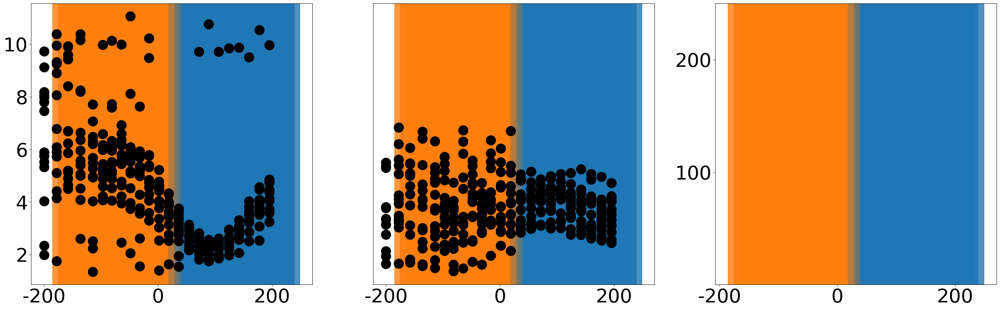

No ROI file found for  1/15/2025 1 1
      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1127  ACSF             430.427419              Home                     NaN
1128  ACSF             412.265019              Home                     NaN
1129  ACSF             394.123196              Home                     NaN
1130  ACSF             376.377365              None                     NaN
1131  ACSF             358.411293              Home                     NaN
1132  ACSF             340.577049              None                     NaN
1133  ACSF             322.949167              Home                     NaN
1134  ACSF             305.157789              Home                     NaN
1135  ACSF             287.466663              Home                     NaN
1136  ACSF             270.006998              Home                     NaN
1137  ACSF             251.710678              None                     NaN
1138  ACSF             234.281637              None

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8848  ACSF             430.427419              Home                     NaN
8849  ACSF             412.265019              Home                     NaN
8850  ACSF             394.123196              Home                     NaN
8851  ACSF             376.377365              None                     NaN
8852  ACSF             358.411293              Home                     NaN
8853  ACSF             340.577049              None                     NaN
8854  ACSF             322.949167              Home                     NaN
8855  ACSF             305.157789              Home                     NaN
8856  ACSF             287.466663              Home                     NaN
8857  ACSF             270.006998              Home                     NaN
8858  ACSF             251.710678              None                     NaN
8859  ACSF             234.281637              None                     NaN
8860  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8873  ACSF             430.427419              Home                     NaN
8874  ACSF             412.265019              Home                     NaN
8875  ACSF             394.123196              Home                     NaN
8876  ACSF             376.377365              None                     NaN
8877  ACSF             358.411293              Home                     NaN
8878  ACSF             340.577049              None                     NaN
8879  ACSF             322.949167              Home                     NaN
8880  ACSF             305.157789              Home                     NaN
8881  ACSF             287.466663              Home                     NaN
8882  ACSF             270.006998              Home                     NaN
8883  ACSF             251.710678              None                     NaN
8884  ACSF             234.281637              None                     NaN
8885  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8898  ACSF             430.427419              Home                     NaN
8899  ACSF             412.265019              Home                     NaN
8900  ACSF             394.123196              Home                     NaN
8901  ACSF             376.377365              None                     NaN
8902  ACSF             358.411293              Home                     NaN
8903  ACSF             340.577049              None                     NaN
8904  ACSF             322.949167              Home                     NaN
8905  ACSF             305.157789              Home                     NaN
8906  ACSF             287.466663              Home                     NaN
8907  ACSF             270.006998              Home                     NaN
8908  ACSF             251.710678              None                     NaN
8909  ACSF             234.281637              None                     NaN
8910  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8923  ACSF             430.427419              Home                     NaN
8924  ACSF             412.265019              Home                     NaN
8925  ACSF             394.123196              Home                     NaN
8926  ACSF             376.377365              None                     NaN
8927  ACSF             358.411293              Home                     NaN
8928  ACSF             340.577049              None                     NaN
8929  ACSF             322.949167              Home                     NaN
8930  ACSF             305.157789              Home                     NaN
8931  ACSF             287.466663              Home                     NaN
8932  ACSF             270.006998              Home                     NaN
8933  ACSF             251.710678              None                     NaN
8934  ACSF             234.281637              None                     NaN
8935  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8948  ACSF             430.427419              Home                     NaN
8949  ACSF             412.265019              Home                     NaN
8950  ACSF             394.123196              Home                     NaN
8951  ACSF             376.377365              None                     NaN
8952  ACSF             358.411293              Home                     NaN
8953  ACSF             340.577049              None                     NaN
8954  ACSF             322.949167              Home                     NaN
8955  ACSF             305.157789              Home                     NaN
8956  ACSF             287.466663              Home                     NaN
8957  ACSF             270.006998              Home                     NaN
8958  ACSF             251.710678              None                     NaN
8959  ACSF             234.281637              None                     NaN
8960  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8973  ACSF             430.427419              Home                     NaN
8974  ACSF             412.265019              Home                     NaN
8975  ACSF             394.123196              Home                     NaN
8976  ACSF             376.377365              None                     NaN
8977  ACSF             358.411293              Home                     NaN
8978  ACSF             340.577049              None                     NaN
8979  ACSF             322.949167              Home                     NaN
8980  ACSF             305.157789              Home                     NaN
8981  ACSF             287.466663              Home                     NaN
8982  ACSF             270.006998              Home                     NaN
8983  ACSF             251.710678              None                     NaN
8984  ACSF             234.281637              None                     NaN
8985  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
8998  ACSF             430.427419              Home                     NaN
8999  ACSF             412.265019              Home                     NaN
9000  ACSF             394.123196              Home                     NaN
9001  ACSF             376.377365              None                     NaN
9002  ACSF             358.411293              Home                     NaN
9003  ACSF             340.577049              None                     NaN
9004  ACSF             322.949167              Home                     NaN
9005  ACSF             305.157789              Home                     NaN
9006  ACSF             287.466663              Home                     NaN
9007  ACSF             270.006998              Home                     NaN
9008  ACSF             251.710678              None                     NaN
9009  ACSF             234.281637              None                     NaN
9010  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9023  ACSF             430.427419              Home                     NaN
9024  ACSF             412.265019              Home                     NaN
9025  ACSF             394.123196              Home                     NaN
9026  ACSF             376.377365              None                     NaN
9027  ACSF             358.411293              Home                     NaN
9028  ACSF             340.577049              None                     NaN
9029  ACSF             322.949167              Home                     NaN
9030  ACSF             305.157789              Home                     NaN
9031  ACSF             287.466663              Home                     NaN
9032  ACSF             270.006998              Home                     NaN
9033  ACSF             251.710678              None                     NaN
9034  ACSF             234.281637              None                     NaN
9035  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9048  ACSF             430.427419              Home                     NaN
9049  ACSF             412.265019              Home                     NaN
9050  ACSF             394.123196              Home                     NaN
9051  ACSF             376.377365              None                     NaN
9052  ACSF             358.411293              Home                     NaN
9053  ACSF             340.577049              None                     NaN
9054  ACSF             322.949167              Home                     NaN
9055  ACSF             305.157789              Home                     NaN
9056  ACSF             287.466663              Home                     NaN
9057  ACSF             270.006998              Home                     NaN
9058  ACSF             251.710678              None                     NaN
9059  ACSF             234.281637              None                     NaN
9060  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9073  ACSF             430.427419              Home                     NaN
9074  ACSF             412.265019              Home                     NaN
9075  ACSF             394.123196              Home                     NaN
9076  ACSF             376.377365              None                     NaN
9077  ACSF             358.411293              Home                     NaN
9078  ACSF             340.577049              None                     NaN
9079  ACSF             322.949167              Home                     NaN
9080  ACSF             305.157789              Home                     NaN
9081  ACSF             287.466663              Home                     NaN
9082  ACSF             270.006998              Home                     NaN
9083  ACSF             251.710678              None                     NaN
9084  ACSF             234.281637              None                     NaN
9085  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9098  ACSF             430.427419              Home                     NaN
9099  ACSF             412.265019              Home                     NaN
9100  ACSF             394.123196              Home                     NaN
9101  ACSF             376.377365              None                     NaN
9102  ACSF             358.411293              Home                     NaN
9103  ACSF             340.577049              None                     NaN
9104  ACSF             322.949167              Home                     NaN
9105  ACSF             305.157789              Home                     NaN
9106  ACSF             287.466663              Home                     NaN
9107  ACSF             270.006998              Home                     NaN
9108  ACSF             251.710678              None                     NaN
9109  ACSF             234.281637              None                     NaN
9110  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9123  ACSF             430.427419              Home                     NaN
9124  ACSF             412.265019              Home                     NaN
9125  ACSF             394.123196              Home                     NaN
9126  ACSF             376.377365              None                     NaN
9127  ACSF             358.411293              Home                     NaN
9128  ACSF             340.577049              None                     NaN
9129  ACSF             322.949167              Home                     NaN
9130  ACSF             305.157789              Home                     NaN
9131  ACSF             287.466663              Home                     NaN
9132  ACSF             270.006998              Home                     NaN
9133  ACSF             251.710678              None                     NaN
9134  ACSF             234.281637              None                     NaN
9135  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
9148  ACSF             430.427419              Home                     NaN
9149  ACSF             412.265019              Home                     NaN
9150  ACSF             394.123196              Home                     NaN
9151  ACSF             376.377365              None                     NaN
9152  ACSF             358.411293              Home                     NaN
9153  ACSF             340.577049              None                     NaN
9154  ACSF             322.949167              Home                     NaN
9155  ACSF             305.157789              Home                     NaN
9156  ACSF             287.466663              Home                     NaN
9157  ACSF             270.006998              Home                     NaN
9158  ACSF             251.710678              None                     NaN
9159  ACSF             234.281637              None                     NaN
9160  ACSF  

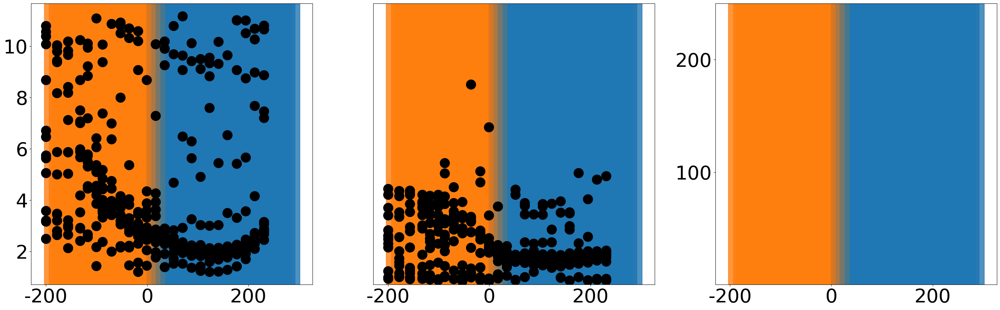

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1152  ACSF             461.671702              None                     NaN
1153  ACSF             443.248484              None                     NaN
1154  ACSF             425.250587              None                     NaN
1155  ACSF             408.235301          Neighbor                     NaN
1156  ACSF             389.803604          Neighbor                     NaN
1157  ACSF             372.467731          Neighbor                     NaN
1158  ACSF             353.964924              None                     NaN
1159  ACSF             335.648520          Neighbor                     NaN
1160  ACSF             317.971667          Neighbor                     NaN
1161  ACSF             299.902732              None                     NaN
1162  ACSF             281.946174              None                     NaN
1163  ACSF             264.007331              None                     NaN
1164  ACSF  

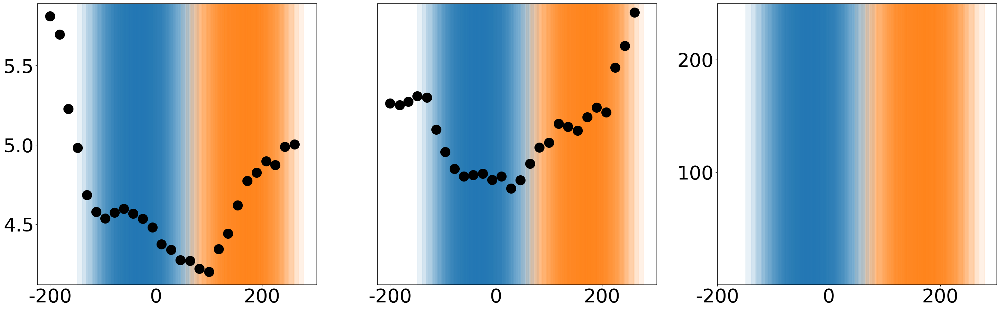

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1179  ACSF             395.851117              None                     NaN
1180  ACSF             377.853283              None                     NaN
1181  ACSF             359.721601          Neighbor                     NaN
1182  ACSF             341.820838          Neighbor                     NaN
1183  ACSF             323.922983          Neighbor                     NaN
1184  ACSF             305.923801          Neighbor                     NaN
1185  ACSF             287.924720          Neighbor                     NaN
1186  ACSF             269.925763              None                     NaN
1187  ACSF             251.812317              None                     NaN
1188  ACSF             233.812317              None                     NaN
1189  ACSF             215.812317              None                     NaN
1190  ACSF             198.096751              None                     NaN
1191  ACSF  

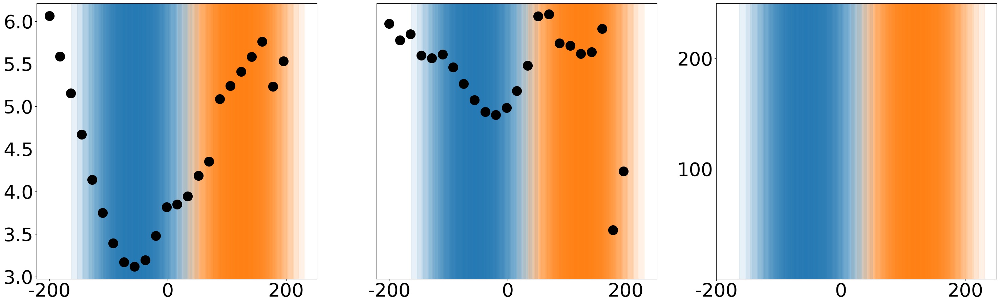

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1202  ACSF             468.596040              None                     NaN
1203  ACSF             450.706914          Neighbor                     NaN
1204  ACSF             433.053510          Neighbor                     NaN
1205  ACSF             415.217623          Neighbor                     NaN
1206  ACSF             396.882982              None                     NaN
1207  ACSF             378.960158          Neighbor                     NaN
1208  ACSF             361.082200          Neighbor                     NaN
1209  ACSF             343.210975              None                     NaN
1210  ACSF             325.067836              None                     NaN
1211  ACSF             306.773430              None                     NaN
1212  ACSF             289.236095              None                     NaN
1213  ACSF             271.672385              None                     NaN
1214  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1429  ACSF             468.596040              None                     NaN
1430  ACSF             450.706914          Neighbor                     NaN
1431  ACSF             433.053510          Neighbor                     NaN
1432  ACSF             415.217623          Neighbor                     NaN
1433  ACSF             396.882982              None                     NaN
1434  ACSF             378.960158          Neighbor                     NaN
1435  ACSF             361.082200          Neighbor                     NaN
1436  ACSF             343.210975              None                     NaN
1437  ACSF             325.067836              None                     NaN
1438  ACSF             306.773430              None                     NaN
1439  ACSF             289.236095              None                     NaN
1440  ACSF             271.672385              None                     NaN
1441  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1456  ACSF             468.596040              None                     NaN
1457  ACSF             450.706914          Neighbor                     NaN
1458  ACSF             433.053510          Neighbor                     NaN
1459  ACSF             415.217623          Neighbor                     NaN
1460  ACSF             396.882982              None                     NaN
1461  ACSF             378.960158          Neighbor                     NaN
1462  ACSF             361.082200          Neighbor                     NaN
1463  ACSF             343.210975              None                     NaN
1464  ACSF             325.067836              None                     NaN
1465  ACSF             306.773430              None                     NaN
1466  ACSF             289.236095              None                     NaN
1467  ACSF             271.672385              None                     NaN
1468  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1483  ACSF             468.596040              None                     NaN
1484  ACSF             450.706914          Neighbor                     NaN
1485  ACSF             433.053510          Neighbor                     NaN
1486  ACSF             415.217623          Neighbor                     NaN
1487  ACSF             396.882982              None                     NaN
1488  ACSF             378.960158          Neighbor                     NaN
1489  ACSF             361.082200          Neighbor                     NaN
1490  ACSF             343.210975              None                     NaN
1491  ACSF             325.067836              None                     NaN
1492  ACSF             306.773430              None                     NaN
1493  ACSF             289.236095              None                     NaN
1494  ACSF             271.672385              None                     NaN
1495  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1510  ACSF             468.596040              None                     NaN
1511  ACSF             450.706914          Neighbor                     NaN
1512  ACSF             433.053510          Neighbor                     NaN
1513  ACSF             415.217623          Neighbor                     NaN
1514  ACSF             396.882982              None                     NaN
1515  ACSF             378.960158          Neighbor                     NaN
1516  ACSF             361.082200          Neighbor                     NaN
1517  ACSF             343.210975              None                     NaN
1518  ACSF             325.067836              None                     NaN
1519  ACSF             306.773430              None                     NaN
1520  ACSF             289.236095              None                     NaN
1521  ACSF             271.672385              None                     NaN
1522  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1537  ACSF             468.596040              None                     NaN
1538  ACSF             450.706914          Neighbor                     NaN
1539  ACSF             433.053510          Neighbor                     NaN
1540  ACSF             415.217623          Neighbor                     NaN
1541  ACSF             396.882982              None                     NaN
1542  ACSF             378.960158          Neighbor                     NaN
1543  ACSF             361.082200          Neighbor                     NaN
1544  ACSF             343.210975              None                     NaN
1545  ACSF             325.067836              None                     NaN
1546  ACSF             306.773430              None                     NaN
1547  ACSF             289.236095              None                     NaN
1548  ACSF             271.672385              None                     NaN
1549  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1564  ACSF             468.596040              None                     NaN
1565  ACSF             450.706914          Neighbor                     NaN
1566  ACSF             433.053510          Neighbor                     NaN
1567  ACSF             415.217623          Neighbor                     NaN
1568  ACSF             396.882982              None                     NaN
1569  ACSF             378.960158          Neighbor                     NaN
1570  ACSF             361.082200          Neighbor                     NaN
1571  ACSF             343.210975              None                     NaN
1572  ACSF             325.067836              None                     NaN
1573  ACSF             306.773430              None                     NaN
1574  ACSF             289.236095              None                     NaN
1575  ACSF             271.672385              None                     NaN
1576  ACSF  

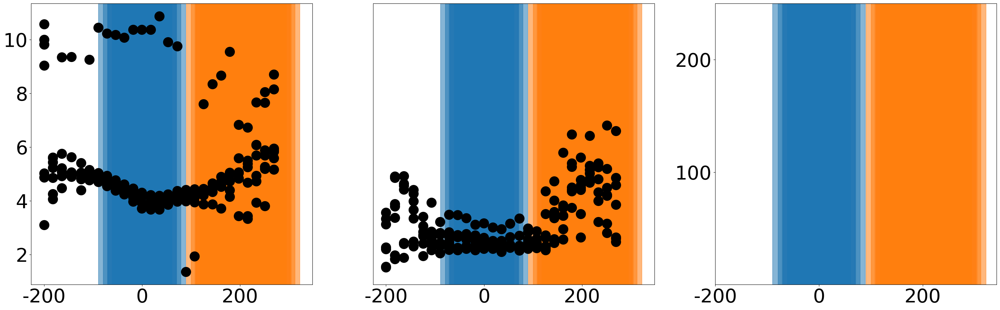

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1229  ACSF             493.782255              Home                     NaN
1230  ACSF             476.487451              Home                     NaN
1231  ACSF             457.983014              None                     NaN
1232  ACSF             438.863195              None                     NaN
1233  ACSF             422.523690              None                     NaN
1234  ACSF             403.629379              None                     NaN
1235  ACSF             385.984076              None                     NaN
1236  ACSF             368.031629              None                     NaN
1237  ACSF             349.743653          Neighbor                     NaN
1238  ACSF             333.107004          Neighbor                     NaN
1239  ACSF             314.287840          Neighbor                     NaN
1240  ACSF             297.428058          Neighbor                     NaN
1241  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1619  ACSF             493.782255              Home                     NaN
1620  ACSF             476.487451              Home                     NaN
1621  ACSF             457.983014              None                     NaN
1622  ACSF             438.863195              None                     NaN
1623  ACSF             422.523690              None                     NaN
1624  ACSF             403.629379              None                     NaN
1625  ACSF             385.984076              None                     NaN
1626  ACSF             368.031629              None                     NaN
1627  ACSF             349.743653          Neighbor                     NaN
1628  ACSF             333.107004          Neighbor                     NaN
1629  ACSF             314.287840          Neighbor                     NaN
1630  ACSF             297.428058          Neighbor                     NaN
1631  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1647  ACSF             493.782255              Home                     NaN
1648  ACSF             476.487451              Home                     NaN
1649  ACSF             457.983014              None                     NaN
1650  ACSF             438.863195              None                     NaN
1651  ACSF             422.523690              None                     NaN
1652  ACSF             403.629379              None                     NaN
1653  ACSF             385.984076              None                     NaN
1654  ACSF             368.031629              None                     NaN
1655  ACSF             349.743653          Neighbor                     NaN
1656  ACSF             333.107004          Neighbor                     NaN
1657  ACSF             314.287840          Neighbor                     NaN
1658  ACSF             297.428058          Neighbor                     NaN
1659  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1675  ACSF             493.782255              Home                     NaN
1676  ACSF             476.487451              Home                     NaN
1677  ACSF             457.983014              None                     NaN
1678  ACSF             438.863195              None                     NaN
1679  ACSF             422.523690              None                     NaN
1680  ACSF             403.629379              None                     NaN
1681  ACSF             385.984076              None                     NaN
1682  ACSF             368.031629              None                     NaN
1683  ACSF             349.743653          Neighbor                     NaN
1684  ACSF             333.107004          Neighbor                     NaN
1685  ACSF             314.287840          Neighbor                     NaN
1686  ACSF             297.428058          Neighbor                     NaN
1687  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1703  ACSF             493.782255              Home                     NaN
1704  ACSF             476.487451              Home                     NaN
1705  ACSF             457.983014              None                     NaN
1706  ACSF             438.863195              None                     NaN
1707  ACSF             422.523690              None                     NaN
1708  ACSF             403.629379              None                     NaN
1709  ACSF             385.984076              None                     NaN
1710  ACSF             368.031629              None                     NaN
1711  ACSF             349.743653          Neighbor                     NaN
1712  ACSF             333.107004          Neighbor                     NaN
1713  ACSF             314.287840          Neighbor                     NaN
1714  ACSF             297.428058          Neighbor                     NaN
1715  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1731  ACSF             493.782255              Home                     NaN
1732  ACSF             476.487451              Home                     NaN
1733  ACSF             457.983014              None                     NaN
1734  ACSF             438.863195              None                     NaN
1735  ACSF             422.523690              None                     NaN
1736  ACSF             403.629379              None                     NaN
1737  ACSF             385.984076              None                     NaN
1738  ACSF             368.031629              None                     NaN
1739  ACSF             349.743653          Neighbor                     NaN
1740  ACSF             333.107004          Neighbor                     NaN
1741  ACSF             314.287840          Neighbor                     NaN
1742  ACSF             297.428058          Neighbor                     NaN
1743  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1759  ACSF             493.782255              Home                     NaN
1760  ACSF             476.487451              Home                     NaN
1761  ACSF             457.983014              None                     NaN
1762  ACSF             438.863195              None                     NaN
1763  ACSF             422.523690              None                     NaN
1764  ACSF             403.629379              None                     NaN
1765  ACSF             385.984076              None                     NaN
1766  ACSF             368.031629              None                     NaN
1767  ACSF             349.743653          Neighbor                     NaN
1768  ACSF             333.107004          Neighbor                     NaN
1769  ACSF             314.287840          Neighbor                     NaN
1770  ACSF             297.428058          Neighbor                     NaN
1771  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1787  ACSF             493.782255              Home                     NaN
1788  ACSF             476.487451              Home                     NaN
1789  ACSF             457.983014              None                     NaN
1790  ACSF             438.863195              None                     NaN
1791  ACSF             422.523690              None                     NaN
1792  ACSF             403.629379              None                     NaN
1793  ACSF             385.984076              None                     NaN
1794  ACSF             368.031629              None                     NaN
1795  ACSF             349.743653          Neighbor                     NaN
1796  ACSF             333.107004          Neighbor                     NaN
1797  ACSF             314.287840          Neighbor                     NaN
1798  ACSF             297.428058          Neighbor                     NaN
1799  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1815  ACSF             493.782255              Home                     NaN
1816  ACSF             476.487451              Home                     NaN
1817  ACSF             457.983014              None                     NaN
1818  ACSF             438.863195              None                     NaN
1819  ACSF             422.523690              None                     NaN
1820  ACSF             403.629379              None                     NaN
1821  ACSF             385.984076              None                     NaN
1822  ACSF             368.031629              None                     NaN
1823  ACSF             349.743653          Neighbor                     NaN
1824  ACSF             333.107004          Neighbor                     NaN
1825  ACSF             314.287840          Neighbor                     NaN
1826  ACSF             297.428058          Neighbor                     NaN
1827  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1843  ACSF             493.782255              Home                     NaN
1844  ACSF             476.487451              Home                     NaN
1845  ACSF             457.983014              None                     NaN
1846  ACSF             438.863195              None                     NaN
1847  ACSF             422.523690              None                     NaN
1848  ACSF             403.629379              None                     NaN
1849  ACSF             385.984076              None                     NaN
1850  ACSF             368.031629              None                     NaN
1851  ACSF             349.743653          Neighbor                     NaN
1852  ACSF             333.107004          Neighbor                     NaN
1853  ACSF             314.287840          Neighbor                     NaN
1854  ACSF             297.428058          Neighbor                     NaN
1855  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1871  ACSF             493.782255              Home                     NaN
1872  ACSF             476.487451              Home                     NaN
1873  ACSF             457.983014              None                     NaN
1874  ACSF             438.863195              None                     NaN
1875  ACSF             422.523690              None                     NaN
1876  ACSF             403.629379              None                     NaN
1877  ACSF             385.984076              None                     NaN
1878  ACSF             368.031629              None                     NaN
1879  ACSF             349.743653          Neighbor                     NaN
1880  ACSF             333.107004          Neighbor                     NaN
1881  ACSF             314.287840          Neighbor                     NaN
1882  ACSF             297.428058          Neighbor                     NaN
1883  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1899  ACSF             493.782255              Home                     NaN
1900  ACSF             476.487451              Home                     NaN
1901  ACSF             457.983014              None                     NaN
1902  ACSF             438.863195              None                     NaN
1903  ACSF             422.523690              None                     NaN
1904  ACSF             403.629379              None                     NaN
1905  ACSF             385.984076              None                     NaN
1906  ACSF             368.031629              None                     NaN
1907  ACSF             349.743653          Neighbor                     NaN
1908  ACSF             333.107004          Neighbor                     NaN
1909  ACSF             314.287840          Neighbor                     NaN
1910  ACSF             297.428058          Neighbor                     NaN
1911  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1927  ACSF             493.782255              Home                     NaN
1928  ACSF             476.487451              Home                     NaN
1929  ACSF             457.983014              None                     NaN
1930  ACSF             438.863195              None                     NaN
1931  ACSF             422.523690              None                     NaN
1932  ACSF             403.629379              None                     NaN
1933  ACSF             385.984076              None                     NaN
1934  ACSF             368.031629              None                     NaN
1935  ACSF             349.743653          Neighbor                     NaN
1936  ACSF             333.107004          Neighbor                     NaN
1937  ACSF             314.287840          Neighbor                     NaN
1938  ACSF             297.428058          Neighbor                     NaN
1939  ACSF  

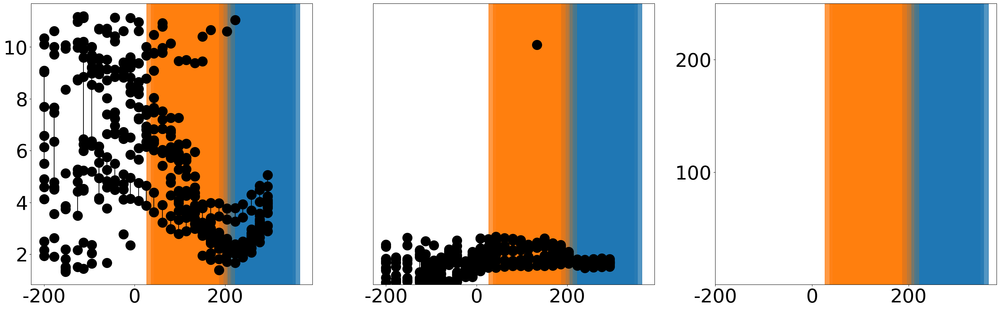

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1257  ACSF             387.382053              None                     NaN
1258  ACSF             371.152186              None                     NaN
1259  ACSF             352.941101              None                     NaN
1260  ACSF             336.338052              None                     NaN
1261  ACSF             318.285534              None                     NaN
1262  ACSF             298.996404              None                     NaN
1263  ACSF             280.386207          Neighbor                     NaN
1264  ACSF             264.036840          Neighbor                     NaN
1265  ACSF             246.484718          Neighbor                     NaN
1266  ACSF             230.114310          Neighbor                     NaN
1267  ACSF             212.612103              None                     NaN
1268  ACSF             196.161528              None                     NaN
1269  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1979  ACSF             387.382053              None                     NaN
1980  ACSF             371.152186              None                     NaN
1981  ACSF             352.941101              None                     NaN
1982  ACSF             336.338052              None                     NaN
1983  ACSF             318.285534              None                     NaN
1984  ACSF             298.996404              None                     NaN
1985  ACSF             280.386207          Neighbor                     NaN
1986  ACSF             264.036840          Neighbor                     NaN
1987  ACSF             246.484718          Neighbor                     NaN
1988  ACSF             230.114310          Neighbor                     NaN
1989  ACSF             212.612103              None                     NaN
1990  ACSF             196.161528              None                     NaN
1991  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2003  ACSF             387.382053              None                     NaN
2004  ACSF             371.152186              None                     NaN
2005  ACSF             352.941101              None                     NaN
2006  ACSF             336.338052              None                     NaN
2007  ACSF             318.285534              None                     NaN
2008  ACSF             298.996404              None                     NaN
2009  ACSF             280.386207          Neighbor                     NaN
2010  ACSF             264.036840          Neighbor                     NaN
2011  ACSF             246.484718          Neighbor                     NaN
2012  ACSF             230.114310          Neighbor                     NaN
2013  ACSF             212.612103              None                     NaN
2014  ACSF             196.161528              None                     NaN
2015  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2027  ACSF             387.382053              None                     NaN
2028  ACSF             371.152186              None                     NaN
2029  ACSF             352.941101              None                     NaN
2030  ACSF             336.338052              None                     NaN
2031  ACSF             318.285534              None                     NaN
2032  ACSF             298.996404              None                     NaN
2033  ACSF             280.386207          Neighbor                     NaN
2034  ACSF             264.036840          Neighbor                     NaN
2035  ACSF             246.484718          Neighbor                     NaN
2036  ACSF             230.114310          Neighbor                     NaN
2037  ACSF             212.612103              None                     NaN
2038  ACSF             196.161528              None                     NaN
2039  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2051  ACSF             387.382053              None                     NaN
2052  ACSF             371.152186              None                     NaN
2053  ACSF             352.941101              None                     NaN
2054  ACSF             336.338052              None                     NaN
2055  ACSF             318.285534              None                     NaN
2056  ACSF             298.996404              None                     NaN
2057  ACSF             280.386207          Neighbor                     NaN
2058  ACSF             264.036840          Neighbor                     NaN
2059  ACSF             246.484718          Neighbor                     NaN
2060  ACSF             230.114310          Neighbor                     NaN
2061  ACSF             212.612103              None                     NaN
2062  ACSF             196.161528              None                     NaN
2063  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2075  ACSF             387.382053              None                     NaN
2076  ACSF             371.152186              None                     NaN
2077  ACSF             352.941101              None                     NaN
2078  ACSF             336.338052              None                     NaN
2079  ACSF             318.285534              None                     NaN
2080  ACSF             298.996404              None                     NaN
2081  ACSF             280.386207          Neighbor                     NaN
2082  ACSF             264.036840          Neighbor                     NaN
2083  ACSF             246.484718          Neighbor                     NaN
2084  ACSF             230.114310          Neighbor                     NaN
2085  ACSF             212.612103              None                     NaN
2086  ACSF             196.161528              None                     NaN
2087  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2099  ACSF             387.382053              None                     NaN
2100  ACSF             371.152186              None                     NaN
2101  ACSF             352.941101              None                     NaN
2102  ACSF             336.338052              None                     NaN
2103  ACSF             318.285534              None                     NaN
2104  ACSF             298.996404              None                     NaN
2105  ACSF             280.386207          Neighbor                     NaN
2106  ACSF             264.036840          Neighbor                     NaN
2107  ACSF             246.484718          Neighbor                     NaN
2108  ACSF             230.114310          Neighbor                     NaN
2109  ACSF             212.612103              None                     NaN
2110  ACSF             196.161528              None                     NaN
2111  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2123  ACSF             387.382053              None                     NaN
2124  ACSF             371.152186              None                     NaN
2125  ACSF             352.941101              None                     NaN
2126  ACSF             336.338052              None                     NaN
2127  ACSF             318.285534              None                     NaN
2128  ACSF             298.996404              None                     NaN
2129  ACSF             280.386207          Neighbor                     NaN
2130  ACSF             264.036840          Neighbor                     NaN
2131  ACSF             246.484718          Neighbor                     NaN
2132  ACSF             230.114310          Neighbor                     NaN
2133  ACSF             212.612103              None                     NaN
2134  ACSF             196.161528              None                     NaN
2135  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2147  ACSF             387.382053              None                     NaN
2148  ACSF             371.152186              None                     NaN
2149  ACSF             352.941101              None                     NaN
2150  ACSF             336.338052              None                     NaN
2151  ACSF             318.285534              None                     NaN
2152  ACSF             298.996404              None                     NaN
2153  ACSF             280.386207          Neighbor                     NaN
2154  ACSF             264.036840          Neighbor                     NaN
2155  ACSF             246.484718          Neighbor                     NaN
2156  ACSF             230.114310          Neighbor                     NaN
2157  ACSF             212.612103              None                     NaN
2158  ACSF             196.161528              None                     NaN
2159  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2171  ACSF             387.382053              None                     NaN
2172  ACSF             371.152186              None                     NaN
2173  ACSF             352.941101              None                     NaN
2174  ACSF             336.338052              None                     NaN
2175  ACSF             318.285534              None                     NaN
2176  ACSF             298.996404              None                     NaN
2177  ACSF             280.386207          Neighbor                     NaN
2178  ACSF             264.036840          Neighbor                     NaN
2179  ACSF             246.484718          Neighbor                     NaN
2180  ACSF             230.114310          Neighbor                     NaN
2181  ACSF             212.612103              None                     NaN
2182  ACSF             196.161528              None                     NaN
2183  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2195  ACSF             387.382053              None                     NaN
2196  ACSF             371.152186              None                     NaN
2197  ACSF             352.941101              None                     NaN
2198  ACSF             336.338052              None                     NaN
2199  ACSF             318.285534              None                     NaN
2200  ACSF             298.996404              None                     NaN
2201  ACSF             280.386207          Neighbor                     NaN
2202  ACSF             264.036840          Neighbor                     NaN
2203  ACSF             246.484718          Neighbor                     NaN
2204  ACSF             230.114310          Neighbor                     NaN
2205  ACSF             212.612103              None                     NaN
2206  ACSF             196.161528              None                     NaN
2207  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2219  ACSF             387.382053              None                     NaN
2220  ACSF             371.152186              None                     NaN
2221  ACSF             352.941101              None                     NaN
2222  ACSF             336.338052              None                     NaN
2223  ACSF             318.285534              None                     NaN
2224  ACSF             298.996404              None                     NaN
2225  ACSF             280.386207          Neighbor                     NaN
2226  ACSF             264.036840          Neighbor                     NaN
2227  ACSF             246.484718          Neighbor                     NaN
2228  ACSF             230.114310          Neighbor                     NaN
2229  ACSF             212.612103              None                     NaN
2230  ACSF             196.161528              None                     NaN
2231  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2243  ACSF             387.382053              None                     NaN
2244  ACSF             371.152186              None                     NaN
2245  ACSF             352.941101              None                     NaN
2246  ACSF             336.338052              None                     NaN
2247  ACSF             318.285534              None                     NaN
2248  ACSF             298.996404              None                     NaN
2249  ACSF             280.386207          Neighbor                     NaN
2250  ACSF             264.036840          Neighbor                     NaN
2251  ACSF             246.484718          Neighbor                     NaN
2252  ACSF             230.114310          Neighbor                     NaN
2253  ACSF             212.612103              None                     NaN
2254  ACSF             196.161528              None                     NaN
2255  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2267  ACSF             387.382053              None                     NaN
2268  ACSF             371.152186              None                     NaN
2269  ACSF             352.941101              None                     NaN
2270  ACSF             336.338052              None                     NaN
2271  ACSF             318.285534              None                     NaN
2272  ACSF             298.996404              None                     NaN
2273  ACSF             280.386207          Neighbor                     NaN
2274  ACSF             264.036840          Neighbor                     NaN
2275  ACSF             246.484718          Neighbor                     NaN
2276  ACSF             230.114310          Neighbor                     NaN
2277  ACSF             212.612103              None                     NaN
2278  ACSF             196.161528              None                     NaN
2279  ACSF  

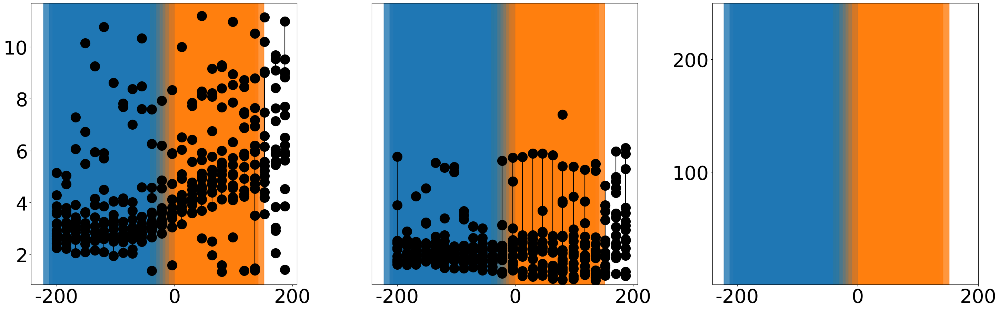

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1281  ACSF             433.249520              None                     NaN
1282  ACSF             415.797043              None                     NaN
1283  ACSF             397.399086              None                     NaN
1284  ACSF             380.160917              None                     NaN
1285  ACSF             361.871486              None                     NaN
1286  ACSF             343.759360              None                     NaN
1287  ACSF             326.306398              Home                     NaN
1288  ACSF             308.469001              None                     NaN
1289  ACSF             290.246736              Home                     NaN
1290  ACSF             273.527979              Home                     NaN
1291  ACSF             255.242446              Home                     NaN
1292  ACSF             236.590021              None                     NaN
1293  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2316  ACSF             433.249520              None                     NaN
2317  ACSF             415.797043              None                     NaN
2318  ACSF             397.399086              None                     NaN
2319  ACSF             380.160917              None                     NaN
2320  ACSF             361.871486              None                     NaN
2321  ACSF             343.759360              None                     NaN
2322  ACSF             326.306398              Home                     NaN
2323  ACSF             308.469001              None                     NaN
2324  ACSF             290.246736              Home                     NaN
2325  ACSF             273.527979              Home                     NaN
2326  ACSF             255.242446              Home                     NaN
2327  ACSF             236.590021              None                     NaN
2328  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2341  ACSF             433.249520              None                     NaN
2342  ACSF             415.797043              None                     NaN
2343  ACSF             397.399086              None                     NaN
2344  ACSF             380.160917              None                     NaN
2345  ACSF             361.871486              None                     NaN
2346  ACSF             343.759360              None                     NaN
2347  ACSF             326.306398              Home                     NaN
2348  ACSF             308.469001              None                     NaN
2349  ACSF             290.246736              Home                     NaN
2350  ACSF             273.527979              Home                     NaN
2351  ACSF             255.242446              Home                     NaN
2352  ACSF             236.590021              None                     NaN
2353  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2366  ACSF             433.249520              None                     NaN
2367  ACSF             415.797043              None                     NaN
2368  ACSF             397.399086              None                     NaN
2369  ACSF             380.160917              None                     NaN
2370  ACSF             361.871486              None                     NaN
2371  ACSF             343.759360              None                     NaN
2372  ACSF             326.306398              Home                     NaN
2373  ACSF             308.469001              None                     NaN
2374  ACSF             290.246736              Home                     NaN
2375  ACSF             273.527979              Home                     NaN
2376  ACSF             255.242446              Home                     NaN
2377  ACSF             236.590021              None                     NaN
2378  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2391  ACSF             433.249520              None                     NaN
2392  ACSF             415.797043              None                     NaN
2393  ACSF             397.399086              None                     NaN
2394  ACSF             380.160917              None                     NaN
2395  ACSF             361.871486              None                     NaN
2396  ACSF             343.759360              None                     NaN
2397  ACSF             326.306398              Home                     NaN
2398  ACSF             308.469001              None                     NaN
2399  ACSF             290.246736              Home                     NaN
2400  ACSF             273.527979              Home                     NaN
2401  ACSF             255.242446              Home                     NaN
2402  ACSF             236.590021              None                     NaN
2403  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2416  ACSF             433.249520              None                     NaN
2417  ACSF             415.797043              None                     NaN
2418  ACSF             397.399086              None                     NaN
2419  ACSF             380.160917              None                     NaN
2420  ACSF             361.871486              None                     NaN
2421  ACSF             343.759360              None                     NaN
2422  ACSF             326.306398              Home                     NaN
2423  ACSF             308.469001              None                     NaN
2424  ACSF             290.246736              Home                     NaN
2425  ACSF             273.527979              Home                     NaN
2426  ACSF             255.242446              Home                     NaN
2427  ACSF             236.590021              None                     NaN
2428  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2441  ACSF             433.249520              None                     NaN
2442  ACSF             415.797043              None                     NaN
2443  ACSF             397.399086              None                     NaN
2444  ACSF             380.160917              None                     NaN
2445  ACSF             361.871486              None                     NaN
2446  ACSF             343.759360              None                     NaN
2447  ACSF             326.306398              Home                     NaN
2448  ACSF             308.469001              None                     NaN
2449  ACSF             290.246736              Home                     NaN
2450  ACSF             273.527979              Home                     NaN
2451  ACSF             255.242446              Home                     NaN
2452  ACSF             236.590021              None                     NaN
2453  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2466  ACSF             433.249520              None                     NaN
2467  ACSF             415.797043              None                     NaN
2468  ACSF             397.399086              None                     NaN
2469  ACSF             380.160917              None                     NaN
2470  ACSF             361.871486              None                     NaN
2471  ACSF             343.759360              None                     NaN
2472  ACSF             326.306398              Home                     NaN
2473  ACSF             308.469001              None                     NaN
2474  ACSF             290.246736              Home                     NaN
2475  ACSF             273.527979              Home                     NaN
2476  ACSF             255.242446              Home                     NaN
2477  ACSF             236.590021              None                     NaN
2478  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2491  ACSF             433.249520              None                     NaN
2492  ACSF             415.797043              None                     NaN
2493  ACSF             397.399086              None                     NaN
2494  ACSF             380.160917              None                     NaN
2495  ACSF             361.871486              None                     NaN
2496  ACSF             343.759360              None                     NaN
2497  ACSF             326.306398              Home                     NaN
2498  ACSF             308.469001              None                     NaN
2499  ACSF             290.246736              Home                     NaN
2500  ACSF             273.527979              Home                     NaN
2501  ACSF             255.242446              Home                     NaN
2502  ACSF             236.590021              None                     NaN
2503  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2516  ACSF             433.249520              None                     NaN
2517  ACSF             415.797043              None                     NaN
2518  ACSF             397.399086              None                     NaN
2519  ACSF             380.160917              None                     NaN
2520  ACSF             361.871486              None                     NaN
2521  ACSF             343.759360              None                     NaN
2522  ACSF             326.306398              Home                     NaN
2523  ACSF             308.469001              None                     NaN
2524  ACSF             290.246736              Home                     NaN
2525  ACSF             273.527979              Home                     NaN
2526  ACSF             255.242446              Home                     NaN
2527  ACSF             236.590021              None                     NaN
2528  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2541  ACSF             433.249520              None                     NaN
2542  ACSF             415.797043              None                     NaN
2543  ACSF             397.399086              None                     NaN
2544  ACSF             380.160917              None                     NaN
2545  ACSF             361.871486              None                     NaN
2546  ACSF             343.759360              None                     NaN
2547  ACSF             326.306398              Home                     NaN
2548  ACSF             308.469001              None                     NaN
2549  ACSF             290.246736              Home                     NaN
2550  ACSF             273.527979              Home                     NaN
2551  ACSF             255.242446              Home                     NaN
2552  ACSF             236.590021              None                     NaN
2553  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2566  ACSF             433.249520              None                     NaN
2567  ACSF             415.797043              None                     NaN
2568  ACSF             397.399086              None                     NaN
2569  ACSF             380.160917              None                     NaN
2570  ACSF             361.871486              None                     NaN
2571  ACSF             343.759360              None                     NaN
2572  ACSF             326.306398              Home                     NaN
2573  ACSF             308.469001              None                     NaN
2574  ACSF             290.246736              Home                     NaN
2575  ACSF             273.527979              Home                     NaN
2576  ACSF             255.242446              Home                     NaN
2577  ACSF             236.590021              None                     NaN
2578  ACSF  

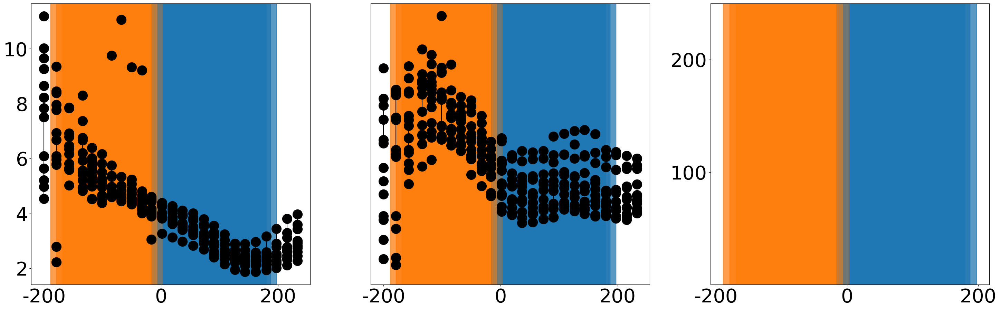

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1306  ACSF                  414.0          Neighbor                     NaN
1307  ACSF                  396.0          Neighbor                     NaN
1308  ACSF                  378.0              None                     NaN
1309  ACSF                  360.0          Neighbor                     NaN
1310  ACSF                  342.0              None                     NaN
1311  ACSF                  324.0              None                     NaN
1312  ACSF                  306.0              None                     NaN
1313  ACSF                  288.0              None                     NaN
1314  ACSF                  270.0              None                     NaN
1315  ACSF                  252.0              Home                     NaN
1316  ACSF                  234.0              Home                     NaN
1317  ACSF                  216.0              Home                     NaN
1318  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2591  ACSF                  414.0          Neighbor                     NaN
2592  ACSF                  396.0          Neighbor                     NaN
2593  ACSF                  378.0              None                     NaN
2594  ACSF                  360.0          Neighbor                     NaN
2595  ACSF                  342.0              None                     NaN
2596  ACSF                  324.0              None                     NaN
2597  ACSF                  306.0              None                     NaN
2598  ACSF                  288.0              None                     NaN
2599  ACSF                  270.0              None                     NaN
2600  ACSF                  252.0              Home                     NaN
2601  ACSF                  234.0              Home                     NaN
2602  ACSF                  216.0              Home                     NaN
2603  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2615  ACSF                  414.0          Neighbor                     NaN
2616  ACSF                  396.0          Neighbor                     NaN
2617  ACSF                  378.0              None                     NaN
2618  ACSF                  360.0          Neighbor                     NaN
2619  ACSF                  342.0              None                     NaN
2620  ACSF                  324.0              None                     NaN
2621  ACSF                  306.0              None                     NaN
2622  ACSF                  288.0              None                     NaN
2623  ACSF                  270.0              None                     NaN
2624  ACSF                  252.0              Home                     NaN
2625  ACSF                  234.0              Home                     NaN
2626  ACSF                  216.0              Home                     NaN
2627  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2639  ACSF                  414.0          Neighbor                     NaN
2640  ACSF                  396.0          Neighbor                     NaN
2641  ACSF                  378.0              None                     NaN
2642  ACSF                  360.0          Neighbor                     NaN
2643  ACSF                  342.0              None                     NaN
2644  ACSF                  324.0              None                     NaN
2645  ACSF                  306.0              None                     NaN
2646  ACSF                  288.0              None                     NaN
2647  ACSF                  270.0              None                     NaN
2648  ACSF                  252.0              Home                     NaN
2649  ACSF                  234.0              Home                     NaN
2650  ACSF                  216.0              Home                     NaN
2651  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2663  ACSF                  414.0          Neighbor                     NaN
2664  ACSF                  396.0          Neighbor                     NaN
2665  ACSF                  378.0              None                     NaN
2666  ACSF                  360.0          Neighbor                     NaN
2667  ACSF                  342.0              None                     NaN
2668  ACSF                  324.0              None                     NaN
2669  ACSF                  306.0              None                     NaN
2670  ACSF                  288.0              None                     NaN
2671  ACSF                  270.0              None                     NaN
2672  ACSF                  252.0              Home                     NaN
2673  ACSF                  234.0              Home                     NaN
2674  ACSF                  216.0              Home                     NaN
2675  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2687  ACSF                  414.0          Neighbor                     NaN
2688  ACSF                  396.0          Neighbor                     NaN
2689  ACSF                  378.0              None                     NaN
2690  ACSF                  360.0          Neighbor                     NaN
2691  ACSF                  342.0              None                     NaN
2692  ACSF                  324.0              None                     NaN
2693  ACSF                  306.0              None                     NaN
2694  ACSF                  288.0              None                     NaN
2695  ACSF                  270.0              None                     NaN
2696  ACSF                  252.0              Home                     NaN
2697  ACSF                  234.0              Home                     NaN
2698  ACSF                  216.0              Home                     NaN
2699  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2711  ACSF                  414.0          Neighbor                     NaN
2712  ACSF                  396.0          Neighbor                     NaN
2713  ACSF                  378.0              None                     NaN
2714  ACSF                  360.0          Neighbor                     NaN
2715  ACSF                  342.0              None                     NaN
2716  ACSF                  324.0              None                     NaN
2717  ACSF                  306.0              None                     NaN
2718  ACSF                  288.0              None                     NaN
2719  ACSF                  270.0              None                     NaN
2720  ACSF                  252.0              Home                     NaN
2721  ACSF                  234.0              Home                     NaN
2722  ACSF                  216.0              Home                     NaN
2723  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2735  ACSF                  414.0          Neighbor                     NaN
2736  ACSF                  396.0          Neighbor                     NaN
2737  ACSF                  378.0              None                     NaN
2738  ACSF                  360.0          Neighbor                     NaN
2739  ACSF                  342.0              None                     NaN
2740  ACSF                  324.0              None                     NaN
2741  ACSF                  306.0              None                     NaN
2742  ACSF                  288.0              None                     NaN
2743  ACSF                  270.0              None                     NaN
2744  ACSF                  252.0              Home                     NaN
2745  ACSF                  234.0              Home                     NaN
2746  ACSF                  216.0              Home                     NaN
2747  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2759  ACSF                  414.0          Neighbor                     NaN
2760  ACSF                  396.0          Neighbor                     NaN
2761  ACSF                  378.0              None                     NaN
2762  ACSF                  360.0          Neighbor                     NaN
2763  ACSF                  342.0              None                     NaN
2764  ACSF                  324.0              None                     NaN
2765  ACSF                  306.0              None                     NaN
2766  ACSF                  288.0              None                     NaN
2767  ACSF                  270.0              None                     NaN
2768  ACSF                  252.0              Home                     NaN
2769  ACSF                  234.0              Home                     NaN
2770  ACSF                  216.0              Home                     NaN
2771  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2783  ACSF                  414.0          Neighbor                     NaN
2784  ACSF                  396.0          Neighbor                     NaN
2785  ACSF                  378.0              None                     NaN
2786  ACSF                  360.0          Neighbor                     NaN
2787  ACSF                  342.0              None                     NaN
2788  ACSF                  324.0              None                     NaN
2789  ACSF                  306.0              None                     NaN
2790  ACSF                  288.0              None                     NaN
2791  ACSF                  270.0              None                     NaN
2792  ACSF                  252.0              Home                     NaN
2793  ACSF                  234.0              Home                     NaN
2794  ACSF                  216.0              Home                     NaN
2795  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2807  ACSF                  414.0          Neighbor                     NaN
2808  ACSF                  396.0          Neighbor                     NaN
2809  ACSF                  378.0              None                     NaN
2810  ACSF                  360.0          Neighbor                     NaN
2811  ACSF                  342.0              None                     NaN
2812  ACSF                  324.0              None                     NaN
2813  ACSF                  306.0              None                     NaN
2814  ACSF                  288.0              None                     NaN
2815  ACSF                  270.0              None                     NaN
2816  ACSF                  252.0              Home                     NaN
2817  ACSF                  234.0              Home                     NaN
2818  ACSF                  216.0              Home                     NaN
2819  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2831  ACSF                  414.0          Neighbor                     NaN
2832  ACSF                  396.0          Neighbor                     NaN
2833  ACSF                  378.0              None                     NaN
2834  ACSF                  360.0          Neighbor                     NaN
2835  ACSF                  342.0              None                     NaN
2836  ACSF                  324.0              None                     NaN
2837  ACSF                  306.0              None                     NaN
2838  ACSF                  288.0              None                     NaN
2839  ACSF                  270.0              None                     NaN
2840  ACSF                  252.0              Home                     NaN
2841  ACSF                  234.0              Home                     NaN
2842  ACSF                  216.0              Home                     NaN
2843  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2855  ACSF                  414.0          Neighbor                     NaN
2856  ACSF                  396.0          Neighbor                     NaN
2857  ACSF                  378.0              None                     NaN
2858  ACSF                  360.0          Neighbor                     NaN
2859  ACSF                  342.0              None                     NaN
2860  ACSF                  324.0              None                     NaN
2861  ACSF                  306.0              None                     NaN
2862  ACSF                  288.0              None                     NaN
2863  ACSF                  270.0              None                     NaN
2864  ACSF                  252.0              Home                     NaN
2865  ACSF                  234.0              Home                     NaN
2866  ACSF                  216.0              Home                     NaN
2867  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2879  ACSF                  414.0          Neighbor                     NaN
2880  ACSF                  396.0          Neighbor                     NaN
2881  ACSF                  378.0              None                     NaN
2882  ACSF                  360.0          Neighbor                     NaN
2883  ACSF                  342.0              None                     NaN
2884  ACSF                  324.0              None                     NaN
2885  ACSF                  306.0              None                     NaN
2886  ACSF                  288.0              None                     NaN
2887  ACSF                  270.0              None                     NaN
2888  ACSF                  252.0              Home                     NaN
2889  ACSF                  234.0              Home                     NaN
2890  ACSF                  216.0              Home                     NaN
2891  ACSF  

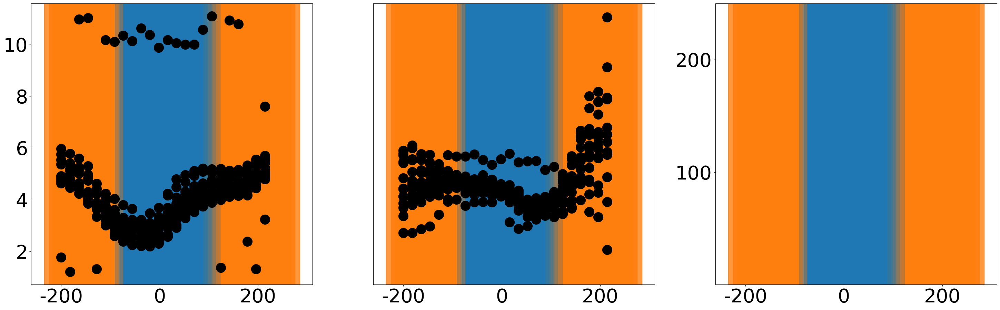

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1330  ACSF             486.997599          Neighbor                     NaN
1331  ACSF             468.861909          Neighbor                     NaN
1332  ACSF             450.829873          Neighbor                     NaN
1333  ACSF             432.332419          Neighbor                     NaN
1334  ACSF             414.944720              None                     NaN
1335  ACSF             397.237427              None                     NaN
1336  ACSF             378.602046              None                     NaN
1337  ACSF             360.653381              None                     NaN
1338  ACSF             343.150926              None                     NaN
1339  ACSF             325.302046              None                     NaN
1340  ACSF             306.814939              Home                     NaN
1341  ACSF             288.889321              Home                     NaN
1342  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2903  ACSF             486.997599          Neighbor                     NaN
2904  ACSF             468.861909          Neighbor                     NaN
2905  ACSF             450.829873          Neighbor                     NaN
2906  ACSF             432.332419          Neighbor                     NaN
2907  ACSF             414.944720              None                     NaN
2908  ACSF             397.237427              None                     NaN
2909  ACSF             378.602046              None                     NaN
2910  ACSF             360.653381              None                     NaN
2911  ACSF             343.150926              None                     NaN
2912  ACSF             325.302046              None                     NaN
2913  ACSF             306.814939              Home                     NaN
2914  ACSF             288.889321              Home                     NaN
2915  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2931  ACSF             486.997599          Neighbor                     NaN
2932  ACSF             468.861909          Neighbor                     NaN
2933  ACSF             450.829873          Neighbor                     NaN
2934  ACSF             432.332419          Neighbor                     NaN
2935  ACSF             414.944720              None                     NaN
2936  ACSF             397.237427              None                     NaN
2937  ACSF             378.602046              None                     NaN
2938  ACSF             360.653381              None                     NaN
2939  ACSF             343.150926              None                     NaN
2940  ACSF             325.302046              None                     NaN
2941  ACSF             306.814939              Home                     NaN
2942  ACSF             288.889321              Home                     NaN
2943  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2959  ACSF             486.997599          Neighbor                     NaN
2960  ACSF             468.861909          Neighbor                     NaN
2961  ACSF             450.829873          Neighbor                     NaN
2962  ACSF             432.332419          Neighbor                     NaN
2963  ACSF             414.944720              None                     NaN
2964  ACSF             397.237427              None                     NaN
2965  ACSF             378.602046              None                     NaN
2966  ACSF             360.653381              None                     NaN
2967  ACSF             343.150926              None                     NaN
2968  ACSF             325.302046              None                     NaN
2969  ACSF             306.814939              Home                     NaN
2970  ACSF             288.889321              Home                     NaN
2971  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
2987  ACSF             486.997599          Neighbor                     NaN
2988  ACSF             468.861909          Neighbor                     NaN
2989  ACSF             450.829873          Neighbor                     NaN
2990  ACSF             432.332419          Neighbor                     NaN
2991  ACSF             414.944720              None                     NaN
2992  ACSF             397.237427              None                     NaN
2993  ACSF             378.602046              None                     NaN
2994  ACSF             360.653381              None                     NaN
2995  ACSF             343.150926              None                     NaN
2996  ACSF             325.302046              None                     NaN
2997  ACSF             306.814939              Home                     NaN
2998  ACSF             288.889321              Home                     NaN
2999  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3015  ACSF             486.997599          Neighbor                     NaN
3016  ACSF             468.861909          Neighbor                     NaN
3017  ACSF             450.829873          Neighbor                     NaN
3018  ACSF             432.332419          Neighbor                     NaN
3019  ACSF             414.944720              None                     NaN
3020  ACSF             397.237427              None                     NaN
3021  ACSF             378.602046              None                     NaN
3022  ACSF             360.653381              None                     NaN
3023  ACSF             343.150926              None                     NaN
3024  ACSF             325.302046              None                     NaN
3025  ACSF             306.814939              Home                     NaN
3026  ACSF             288.889321              Home                     NaN
3027  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3043  ACSF             486.997599          Neighbor                     NaN
3044  ACSF             468.861909          Neighbor                     NaN
3045  ACSF             450.829873          Neighbor                     NaN
3046  ACSF             432.332419          Neighbor                     NaN
3047  ACSF             414.944720              None                     NaN
3048  ACSF             397.237427              None                     NaN
3049  ACSF             378.602046              None                     NaN
3050  ACSF             360.653381              None                     NaN
3051  ACSF             343.150926              None                     NaN
3052  ACSF             325.302046              None                     NaN
3053  ACSF             306.814939              Home                     NaN
3054  ACSF             288.889321              Home                     NaN
3055  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3071  ACSF             486.997599          Neighbor                     NaN
3072  ACSF             468.861909          Neighbor                     NaN
3073  ACSF             450.829873          Neighbor                     NaN
3074  ACSF             432.332419          Neighbor                     NaN
3075  ACSF             414.944720              None                     NaN
3076  ACSF             397.237427              None                     NaN
3077  ACSF             378.602046              None                     NaN
3078  ACSF             360.653381              None                     NaN
3079  ACSF             343.150926              None                     NaN
3080  ACSF             325.302046              None                     NaN
3081  ACSF             306.814939              Home                     NaN
3082  ACSF             288.889321              Home                     NaN
3083  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3099  ACSF             486.997599          Neighbor                     NaN
3100  ACSF             468.861909          Neighbor                     NaN
3101  ACSF             450.829873          Neighbor                     NaN
3102  ACSF             432.332419          Neighbor                     NaN
3103  ACSF             414.944720              None                     NaN
3104  ACSF             397.237427              None                     NaN
3105  ACSF             378.602046              None                     NaN
3106  ACSF             360.653381              None                     NaN
3107  ACSF             343.150926              None                     NaN
3108  ACSF             325.302046              None                     NaN
3109  ACSF             306.814939              Home                     NaN
3110  ACSF             288.889321              Home                     NaN
3111  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3127  ACSF             486.997599          Neighbor                     NaN
3128  ACSF             468.861909          Neighbor                     NaN
3129  ACSF             450.829873          Neighbor                     NaN
3130  ACSF             432.332419          Neighbor                     NaN
3131  ACSF             414.944720              None                     NaN
3132  ACSF             397.237427              None                     NaN
3133  ACSF             378.602046              None                     NaN
3134  ACSF             360.653381              None                     NaN
3135  ACSF             343.150926              None                     NaN
3136  ACSF             325.302046              None                     NaN
3137  ACSF             306.814939              Home                     NaN
3138  ACSF             288.889321              Home                     NaN
3139  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3155  ACSF             486.997599          Neighbor                     NaN
3156  ACSF             468.861909          Neighbor                     NaN
3157  ACSF             450.829873          Neighbor                     NaN
3158  ACSF             432.332419          Neighbor                     NaN
3159  ACSF             414.944720              None                     NaN
3160  ACSF             397.237427              None                     NaN
3161  ACSF             378.602046              None                     NaN
3162  ACSF             360.653381              None                     NaN
3163  ACSF             343.150926              None                     NaN
3164  ACSF             325.302046              None                     NaN
3165  ACSF             306.814939              Home                     NaN
3166  ACSF             288.889321              Home                     NaN
3167  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3183  ACSF             486.997599          Neighbor                     NaN
3184  ACSF             468.861909          Neighbor                     NaN
3185  ACSF             450.829873          Neighbor                     NaN
3186  ACSF             432.332419          Neighbor                     NaN
3187  ACSF             414.944720              None                     NaN
3188  ACSF             397.237427              None                     NaN
3189  ACSF             378.602046              None                     NaN
3190  ACSF             360.653381              None                     NaN
3191  ACSF             343.150926              None                     NaN
3192  ACSF             325.302046              None                     NaN
3193  ACSF             306.814939              Home                     NaN
3194  ACSF             288.889321              Home                     NaN
3195  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3211  ACSF             486.997599          Neighbor                     NaN
3212  ACSF             468.861909          Neighbor                     NaN
3213  ACSF             450.829873          Neighbor                     NaN
3214  ACSF             432.332419          Neighbor                     NaN
3215  ACSF             414.944720              None                     NaN
3216  ACSF             397.237427              None                     NaN
3217  ACSF             378.602046              None                     NaN
3218  ACSF             360.653381              None                     NaN
3219  ACSF             343.150926              None                     NaN
3220  ACSF             325.302046              None                     NaN
3221  ACSF             306.814939              Home                     NaN
3222  ACSF             288.889321              Home                     NaN
3223  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3239  ACSF             486.997599          Neighbor                     NaN
3240  ACSF             468.861909          Neighbor                     NaN
3241  ACSF             450.829873          Neighbor                     NaN
3242  ACSF             432.332419          Neighbor                     NaN
3243  ACSF             414.944720              None                     NaN
3244  ACSF             397.237427              None                     NaN
3245  ACSF             378.602046              None                     NaN
3246  ACSF             360.653381              None                     NaN
3247  ACSF             343.150926              None                     NaN
3248  ACSF             325.302046              None                     NaN
3249  ACSF             306.814939              Home                     NaN
3250  ACSF             288.889321              Home                     NaN
3251  ACSF  

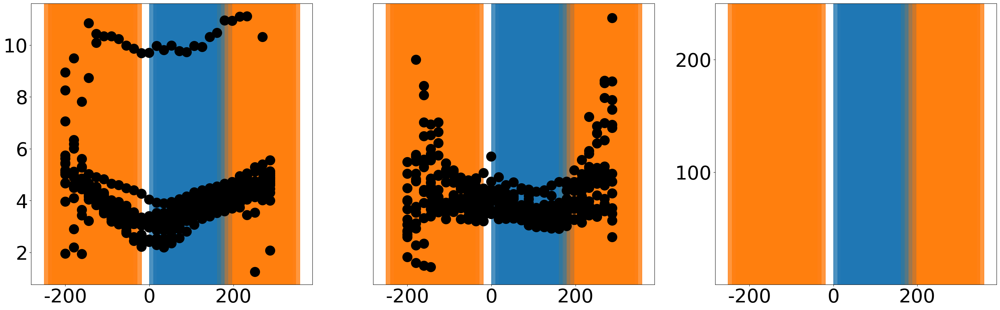

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1358  ACSF             388.429997          Neighbor                     NaN
1359  ACSF             370.472671          Neighbor                     NaN
1360  ACSF             352.449621              None                     NaN
1361  ACSF             334.753325              None                     NaN
1362  ACSF             317.097860              None                     NaN
1363  ACSF             298.981643              None                     NaN
1364  ACSF             281.461479              Home                     NaN
1365  ACSF             262.854027              Home                     NaN
1366  ACSF             245.105732              Home                     NaN
1367  ACSF             227.390775              Home                     NaN
1368  ACSF             209.261613              Home                     NaN
1369  ACSF             191.945581              None                     NaN
1370  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3267  ACSF             388.429997          Neighbor                     NaN
3268  ACSF             370.472671          Neighbor                     NaN
3269  ACSF             352.449621              None                     NaN
3270  ACSF             334.753325              None                     NaN
3271  ACSF             317.097860              None                     NaN
3272  ACSF             298.981643              None                     NaN
3273  ACSF             281.461479              Home                     NaN
3274  ACSF             262.854027              Home                     NaN
3275  ACSF             245.105732              Home                     NaN
3276  ACSF             227.390775              Home                     NaN
3277  ACSF             209.261613              Home                     NaN
3278  ACSF             191.945581              None                     NaN
3279  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3290  ACSF             388.429997          Neighbor                     NaN
3291  ACSF             370.472671          Neighbor                     NaN
3292  ACSF             352.449621              None                     NaN
3293  ACSF             334.753325              None                     NaN
3294  ACSF             317.097860              None                     NaN
3295  ACSF             298.981643              None                     NaN
3296  ACSF             281.461479              Home                     NaN
3297  ACSF             262.854027              Home                     NaN
3298  ACSF             245.105732              Home                     NaN
3299  ACSF             227.390775              Home                     NaN
3300  ACSF             209.261613              Home                     NaN
3301  ACSF             191.945581              None                     NaN
3302  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3313  ACSF             388.429997          Neighbor                     NaN
3314  ACSF             370.472671          Neighbor                     NaN
3315  ACSF             352.449621              None                     NaN
3316  ACSF             334.753325              None                     NaN
3317  ACSF             317.097860              None                     NaN
3318  ACSF             298.981643              None                     NaN
3319  ACSF             281.461479              Home                     NaN
3320  ACSF             262.854027              Home                     NaN
3321  ACSF             245.105732              Home                     NaN
3322  ACSF             227.390775              Home                     NaN
3323  ACSF             209.261613              Home                     NaN
3324  ACSF             191.945581              None                     NaN
3325  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3336  ACSF             388.429997          Neighbor                     NaN
3337  ACSF             370.472671          Neighbor                     NaN
3338  ACSF             352.449621              None                     NaN
3339  ACSF             334.753325              None                     NaN
3340  ACSF             317.097860              None                     NaN
3341  ACSF             298.981643              None                     NaN
3342  ACSF             281.461479              Home                     NaN
3343  ACSF             262.854027              Home                     NaN
3344  ACSF             245.105732              Home                     NaN
3345  ACSF             227.390775              Home                     NaN
3346  ACSF             209.261613              Home                     NaN
3347  ACSF             191.945581              None                     NaN
3348  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3359  ACSF             388.429997          Neighbor                     NaN
3360  ACSF             370.472671          Neighbor                     NaN
3361  ACSF             352.449621              None                     NaN
3362  ACSF             334.753325              None                     NaN
3363  ACSF             317.097860              None                     NaN
3364  ACSF             298.981643              None                     NaN
3365  ACSF             281.461479              Home                     NaN
3366  ACSF             262.854027              Home                     NaN
3367  ACSF             245.105732              Home                     NaN
3368  ACSF             227.390775              Home                     NaN
3369  ACSF             209.261613              Home                     NaN
3370  ACSF             191.945581              None                     NaN
3371  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3382  ACSF             388.429997          Neighbor                     NaN
3383  ACSF             370.472671          Neighbor                     NaN
3384  ACSF             352.449621              None                     NaN
3385  ACSF             334.753325              None                     NaN
3386  ACSF             317.097860              None                     NaN
3387  ACSF             298.981643              None                     NaN
3388  ACSF             281.461479              Home                     NaN
3389  ACSF             262.854027              Home                     NaN
3390  ACSF             245.105732              Home                     NaN
3391  ACSF             227.390775              Home                     NaN
3392  ACSF             209.261613              Home                     NaN
3393  ACSF             191.945581              None                     NaN
3394  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3405  ACSF             388.429997          Neighbor                     NaN
3406  ACSF             370.472671          Neighbor                     NaN
3407  ACSF             352.449621              None                     NaN
3408  ACSF             334.753325              None                     NaN
3409  ACSF             317.097860              None                     NaN
3410  ACSF             298.981643              None                     NaN
3411  ACSF             281.461479              Home                     NaN
3412  ACSF             262.854027              Home                     NaN
3413  ACSF             245.105732              Home                     NaN
3414  ACSF             227.390775              Home                     NaN
3415  ACSF             209.261613              Home                     NaN
3416  ACSF             191.945581              None                     NaN
3417  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3428  ACSF             388.429997          Neighbor                     NaN
3429  ACSF             370.472671          Neighbor                     NaN
3430  ACSF             352.449621              None                     NaN
3431  ACSF             334.753325              None                     NaN
3432  ACSF             317.097860              None                     NaN
3433  ACSF             298.981643              None                     NaN
3434  ACSF             281.461479              Home                     NaN
3435  ACSF             262.854027              Home                     NaN
3436  ACSF             245.105732              Home                     NaN
3437  ACSF             227.390775              Home                     NaN
3438  ACSF             209.261613              Home                     NaN
3439  ACSF             191.945581              None                     NaN
3440  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3451  ACSF             388.429997          Neighbor                     NaN
3452  ACSF             370.472671          Neighbor                     NaN
3453  ACSF             352.449621              None                     NaN
3454  ACSF             334.753325              None                     NaN
3455  ACSF             317.097860              None                     NaN
3456  ACSF             298.981643              None                     NaN
3457  ACSF             281.461479              Home                     NaN
3458  ACSF             262.854027              Home                     NaN
3459  ACSF             245.105732              Home                     NaN
3460  ACSF             227.390775              Home                     NaN
3461  ACSF             209.261613              Home                     NaN
3462  ACSF             191.945581              None                     NaN
3463  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3474  ACSF             388.429997          Neighbor                     NaN
3475  ACSF             370.472671          Neighbor                     NaN
3476  ACSF             352.449621              None                     NaN
3477  ACSF             334.753325              None                     NaN
3478  ACSF             317.097860              None                     NaN
3479  ACSF             298.981643              None                     NaN
3480  ACSF             281.461479              Home                     NaN
3481  ACSF             262.854027              Home                     NaN
3482  ACSF             245.105732              Home                     NaN
3483  ACSF             227.390775              Home                     NaN
3484  ACSF             209.261613              Home                     NaN
3485  ACSF             191.945581              None                     NaN
3486  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3497  ACSF             388.429997          Neighbor                     NaN
3498  ACSF             370.472671          Neighbor                     NaN
3499  ACSF             352.449621              None                     NaN
3500  ACSF             334.753325              None                     NaN
3501  ACSF             317.097860              None                     NaN
3502  ACSF             298.981643              None                     NaN
3503  ACSF             281.461479              Home                     NaN
3504  ACSF             262.854027              Home                     NaN
3505  ACSF             245.105732              Home                     NaN
3506  ACSF             227.390775              Home                     NaN
3507  ACSF             209.261613              Home                     NaN
3508  ACSF             191.945581              None                     NaN
3509  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3520  ACSF             388.429997          Neighbor                     NaN
3521  ACSF             370.472671          Neighbor                     NaN
3522  ACSF             352.449621              None                     NaN
3523  ACSF             334.753325              None                     NaN
3524  ACSF             317.097860              None                     NaN
3525  ACSF             298.981643              None                     NaN
3526  ACSF             281.461479              Home                     NaN
3527  ACSF             262.854027              Home                     NaN
3528  ACSF             245.105732              Home                     NaN
3529  ACSF             227.390775              Home                     NaN
3530  ACSF             209.261613              Home                     NaN
3531  ACSF             191.945581              None                     NaN
3532  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3543  ACSF             388.429997          Neighbor                     NaN
3544  ACSF             370.472671          Neighbor                     NaN
3545  ACSF             352.449621              None                     NaN
3546  ACSF             334.753325              None                     NaN
3547  ACSF             317.097860              None                     NaN
3548  ACSF             298.981643              None                     NaN
3549  ACSF             281.461479              Home                     NaN
3550  ACSF             262.854027              Home                     NaN
3551  ACSF             245.105732              Home                     NaN
3552  ACSF             227.390775              Home                     NaN
3553  ACSF             209.261613              Home                     NaN
3554  ACSF             191.945581              None                     NaN
3555  ACSF  

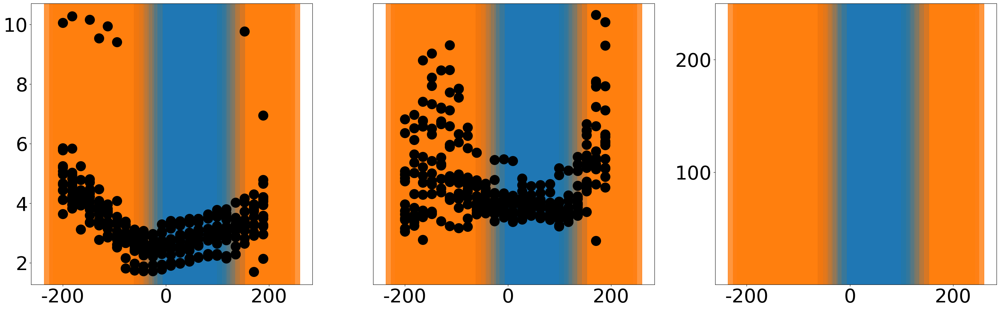

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1381  ACSF             370.751421          Neighbor                     NaN
1382  ACSF             353.165226          Neighbor                     NaN
1383  ACSF             335.685803              None                     NaN
1384  ACSF             317.378919              None                     NaN
1385  ACSF             299.715551              None                     NaN
1386  ACSF             282.124456              None                     NaN
1387  ACSF             264.198045              None                     NaN
1388  ACSF             246.746623              None                     NaN
1389  ACSF             229.046366              Home                     NaN
1390  ACSF             211.068456              Home                     NaN
1391  ACSF             193.744544              Home                     NaN
1392  ACSF             176.165163              None                     NaN
1393  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3566  ACSF             370.751421          Neighbor                     NaN
3567  ACSF             353.165226          Neighbor                     NaN
3568  ACSF             335.685803              None                     NaN
3569  ACSF             317.378919              None                     NaN
3570  ACSF             299.715551              None                     NaN
3571  ACSF             282.124456              None                     NaN
3572  ACSF             264.198045              None                     NaN
3573  ACSF             246.746623              None                     NaN
3574  ACSF             229.046366              Home                     NaN
3575  ACSF             211.068456              Home                     NaN
3576  ACSF             193.744544              Home                     NaN
3577  ACSF             176.165163              None                     NaN
3578  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3588  ACSF             370.751421          Neighbor                     NaN
3589  ACSF             353.165226          Neighbor                     NaN
3590  ACSF             335.685803              None                     NaN
3591  ACSF             317.378919              None                     NaN
3592  ACSF             299.715551              None                     NaN
3593  ACSF             282.124456              None                     NaN
3594  ACSF             264.198045              None                     NaN
3595  ACSF             246.746623              None                     NaN
3596  ACSF             229.046366              Home                     NaN
3597  ACSF             211.068456              Home                     NaN
3598  ACSF             193.744544              Home                     NaN
3599  ACSF             176.165163              None                     NaN
3600  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3610  ACSF             370.751421          Neighbor                     NaN
3611  ACSF             353.165226          Neighbor                     NaN
3612  ACSF             335.685803              None                     NaN
3613  ACSF             317.378919              None                     NaN
3614  ACSF             299.715551              None                     NaN
3615  ACSF             282.124456              None                     NaN
3616  ACSF             264.198045              None                     NaN
3617  ACSF             246.746623              None                     NaN
3618  ACSF             229.046366              Home                     NaN
3619  ACSF             211.068456              Home                     NaN
3620  ACSF             193.744544              Home                     NaN
3621  ACSF             176.165163              None                     NaN
3622  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3632  ACSF             370.751421          Neighbor                     NaN
3633  ACSF             353.165226          Neighbor                     NaN
3634  ACSF             335.685803              None                     NaN
3635  ACSF             317.378919              None                     NaN
3636  ACSF             299.715551              None                     NaN
3637  ACSF             282.124456              None                     NaN
3638  ACSF             264.198045              None                     NaN
3639  ACSF             246.746623              None                     NaN
3640  ACSF             229.046366              Home                     NaN
3641  ACSF             211.068456              Home                     NaN
3642  ACSF             193.744544              Home                     NaN
3643  ACSF             176.165163              None                     NaN
3644  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3654  ACSF             370.751421          Neighbor                     NaN
3655  ACSF             353.165226          Neighbor                     NaN
3656  ACSF             335.685803              None                     NaN
3657  ACSF             317.378919              None                     NaN
3658  ACSF             299.715551              None                     NaN
3659  ACSF             282.124456              None                     NaN
3660  ACSF             264.198045              None                     NaN
3661  ACSF             246.746623              None                     NaN
3662  ACSF             229.046366              Home                     NaN
3663  ACSF             211.068456              Home                     NaN
3664  ACSF             193.744544              Home                     NaN
3665  ACSF             176.165163              None                     NaN
3666  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3676  ACSF             370.751421          Neighbor                     NaN
3677  ACSF             353.165226          Neighbor                     NaN
3678  ACSF             335.685803              None                     NaN
3679  ACSF             317.378919              None                     NaN
3680  ACSF             299.715551              None                     NaN
3681  ACSF             282.124456              None                     NaN
3682  ACSF             264.198045              None                     NaN
3683  ACSF             246.746623              None                     NaN
3684  ACSF             229.046366              Home                     NaN
3685  ACSF             211.068456              Home                     NaN
3686  ACSF             193.744544              Home                     NaN
3687  ACSF             176.165163              None                     NaN
3688  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3698  ACSF             370.751421          Neighbor                     NaN
3699  ACSF             353.165226          Neighbor                     NaN
3700  ACSF             335.685803              None                     NaN
3701  ACSF             317.378919              None                     NaN
3702  ACSF             299.715551              None                     NaN
3703  ACSF             282.124456              None                     NaN
3704  ACSF             264.198045              None                     NaN
3705  ACSF             246.746623              None                     NaN
3706  ACSF             229.046366              Home                     NaN
3707  ACSF             211.068456              Home                     NaN
3708  ACSF             193.744544              Home                     NaN
3709  ACSF             176.165163              None                     NaN
3710  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3720  ACSF             370.751421          Neighbor                     NaN
3721  ACSF             353.165226          Neighbor                     NaN
3722  ACSF             335.685803              None                     NaN
3723  ACSF             317.378919              None                     NaN
3724  ACSF             299.715551              None                     NaN
3725  ACSF             282.124456              None                     NaN
3726  ACSF             264.198045              None                     NaN
3727  ACSF             246.746623              None                     NaN
3728  ACSF             229.046366              Home                     NaN
3729  ACSF             211.068456              Home                     NaN
3730  ACSF             193.744544              Home                     NaN
3731  ACSF             176.165163              None                     NaN
3732  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3742  ACSF             370.751421          Neighbor                     NaN
3743  ACSF             353.165226          Neighbor                     NaN
3744  ACSF             335.685803              None                     NaN
3745  ACSF             317.378919              None                     NaN
3746  ACSF             299.715551              None                     NaN
3747  ACSF             282.124456              None                     NaN
3748  ACSF             264.198045              None                     NaN
3749  ACSF             246.746623              None                     NaN
3750  ACSF             229.046366              Home                     NaN
3751  ACSF             211.068456              Home                     NaN
3752  ACSF             193.744544              Home                     NaN
3753  ACSF             176.165163              None                     NaN
3754  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3764  ACSF             370.751421          Neighbor                     NaN
3765  ACSF             353.165226          Neighbor                     NaN
3766  ACSF             335.685803              None                     NaN
3767  ACSF             317.378919              None                     NaN
3768  ACSF             299.715551              None                     NaN
3769  ACSF             282.124456              None                     NaN
3770  ACSF             264.198045              None                     NaN
3771  ACSF             246.746623              None                     NaN
3772  ACSF             229.046366              Home                     NaN
3773  ACSF             211.068456              Home                     NaN
3774  ACSF             193.744544              Home                     NaN
3775  ACSF             176.165163              None                     NaN
3776  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3786  ACSF             370.751421          Neighbor                     NaN
3787  ACSF             353.165226          Neighbor                     NaN
3788  ACSF             335.685803              None                     NaN
3789  ACSF             317.378919              None                     NaN
3790  ACSF             299.715551              None                     NaN
3791  ACSF             282.124456              None                     NaN
3792  ACSF             264.198045              None                     NaN
3793  ACSF             246.746623              None                     NaN
3794  ACSF             229.046366              Home                     NaN
3795  ACSF             211.068456              Home                     NaN
3796  ACSF             193.744544              Home                     NaN
3797  ACSF             176.165163              None                     NaN
3798  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3808  ACSF             370.751421          Neighbor                     NaN
3809  ACSF             353.165226          Neighbor                     NaN
3810  ACSF             335.685803              None                     NaN
3811  ACSF             317.378919              None                     NaN
3812  ACSF             299.715551              None                     NaN
3813  ACSF             282.124456              None                     NaN
3814  ACSF             264.198045              None                     NaN
3815  ACSF             246.746623              None                     NaN
3816  ACSF             229.046366              Home                     NaN
3817  ACSF             211.068456              Home                     NaN
3818  ACSF             193.744544              Home                     NaN
3819  ACSF             176.165163              None                     NaN
3820  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3830  ACSF             370.751421          Neighbor                     NaN
3831  ACSF             353.165226          Neighbor                     NaN
3832  ACSF             335.685803              None                     NaN
3833  ACSF             317.378919              None                     NaN
3834  ACSF             299.715551              None                     NaN
3835  ACSF             282.124456              None                     NaN
3836  ACSF             264.198045              None                     NaN
3837  ACSF             246.746623              None                     NaN
3838  ACSF             229.046366              Home                     NaN
3839  ACSF             211.068456              Home                     NaN
3840  ACSF             193.744544              Home                     NaN
3841  ACSF             176.165163              None                     NaN
3842  ACSF  

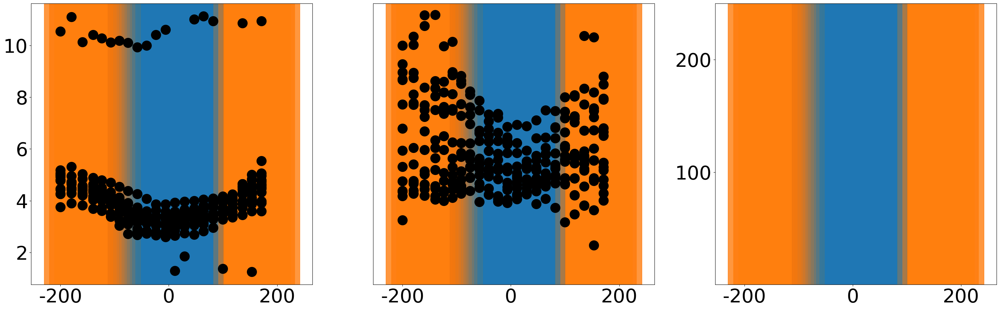

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1403  ACSF             444.364715              None                     NaN
1404  ACSF             426.380112              None                     NaN
1405  ACSF             408.396866              None                     NaN
1406  ACSF             390.288355              None                     NaN
1407  ACSF             372.302297          Neighbor                     NaN
1408  ACSF             354.317654          Neighbor                     NaN
1409  ACSF             336.334655          Neighbor                     NaN
1410  ACSF             318.353577          Neighbor                     NaN
1411  ACSF             300.374766          Neighbor                     NaN
1412  ACSF             282.255204          Neighbor                     NaN
1413  ACSF             264.272587              None                     NaN
1414  ACSF             246.292509              None                     NaN
1415  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3852  ACSF             444.364715              None                     NaN
3853  ACSF             426.380112              None                     NaN
3854  ACSF             408.396866              None                     NaN
3855  ACSF             390.288355              None                     NaN
3856  ACSF             372.302297          Neighbor                     NaN
3857  ACSF             354.317654          Neighbor                     NaN
3858  ACSF             336.334655          Neighbor                     NaN
3859  ACSF             318.353577          Neighbor                     NaN
3860  ACSF             300.374766          Neighbor                     NaN
3861  ACSF             282.255204          Neighbor                     NaN
3862  ACSF             264.272587              None                     NaN
3863  ACSF             246.292509              None                     NaN
3864  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3878  ACSF             444.364715              None                     NaN
3879  ACSF             426.380112              None                     NaN
3880  ACSF             408.396866              None                     NaN
3881  ACSF             390.288355              None                     NaN
3882  ACSF             372.302297          Neighbor                     NaN
3883  ACSF             354.317654          Neighbor                     NaN
3884  ACSF             336.334655          Neighbor                     NaN
3885  ACSF             318.353577          Neighbor                     NaN
3886  ACSF             300.374766          Neighbor                     NaN
3887  ACSF             282.255204          Neighbor                     NaN
3888  ACSF             264.272587              None                     NaN
3889  ACSF             246.292509              None                     NaN
3890  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3904  ACSF             444.364715              None                     NaN
3905  ACSF             426.380112              None                     NaN
3906  ACSF             408.396866              None                     NaN
3907  ACSF             390.288355              None                     NaN
3908  ACSF             372.302297          Neighbor                     NaN
3909  ACSF             354.317654          Neighbor                     NaN
3910  ACSF             336.334655          Neighbor                     NaN
3911  ACSF             318.353577          Neighbor                     NaN
3912  ACSF             300.374766          Neighbor                     NaN
3913  ACSF             282.255204          Neighbor                     NaN
3914  ACSF             264.272587              None                     NaN
3915  ACSF             246.292509              None                     NaN
3916  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3930  ACSF             444.364715              None                     NaN
3931  ACSF             426.380112              None                     NaN
3932  ACSF             408.396866              None                     NaN
3933  ACSF             390.288355              None                     NaN
3934  ACSF             372.302297          Neighbor                     NaN
3935  ACSF             354.317654          Neighbor                     NaN
3936  ACSF             336.334655          Neighbor                     NaN
3937  ACSF             318.353577          Neighbor                     NaN
3938  ACSF             300.374766          Neighbor                     NaN
3939  ACSF             282.255204          Neighbor                     NaN
3940  ACSF             264.272587              None                     NaN
3941  ACSF             246.292509              None                     NaN
3942  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3956  ACSF             444.364715              None                     NaN
3957  ACSF             426.380112              None                     NaN
3958  ACSF             408.396866              None                     NaN
3959  ACSF             390.288355              None                     NaN
3960  ACSF             372.302297          Neighbor                     NaN
3961  ACSF             354.317654          Neighbor                     NaN
3962  ACSF             336.334655          Neighbor                     NaN
3963  ACSF             318.353577          Neighbor                     NaN
3964  ACSF             300.374766          Neighbor                     NaN
3965  ACSF             282.255204          Neighbor                     NaN
3966  ACSF             264.272587              None                     NaN
3967  ACSF             246.292509              None                     NaN
3968  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
3982  ACSF             444.364715              None                     NaN
3983  ACSF             426.380112              None                     NaN
3984  ACSF             408.396866              None                     NaN
3985  ACSF             390.288355              None                     NaN
3986  ACSF             372.302297          Neighbor                     NaN
3987  ACSF             354.317654          Neighbor                     NaN
3988  ACSF             336.334655          Neighbor                     NaN
3989  ACSF             318.353577          Neighbor                     NaN
3990  ACSF             300.374766          Neighbor                     NaN
3991  ACSF             282.255204          Neighbor                     NaN
3992  ACSF             264.272587              None                     NaN
3993  ACSF             246.292509              None                     NaN
3994  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4008  ACSF             444.364715              None                     NaN
4009  ACSF             426.380112              None                     NaN
4010  ACSF             408.396866              None                     NaN
4011  ACSF             390.288355              None                     NaN
4012  ACSF             372.302297          Neighbor                     NaN
4013  ACSF             354.317654          Neighbor                     NaN
4014  ACSF             336.334655          Neighbor                     NaN
4015  ACSF             318.353577          Neighbor                     NaN
4016  ACSF             300.374766          Neighbor                     NaN
4017  ACSF             282.255204          Neighbor                     NaN
4018  ACSF             264.272587              None                     NaN
4019  ACSF             246.292509              None                     NaN
4020  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4034  ACSF             444.364715              None                     NaN
4035  ACSF             426.380112              None                     NaN
4036  ACSF             408.396866              None                     NaN
4037  ACSF             390.288355              None                     NaN
4038  ACSF             372.302297          Neighbor                     NaN
4039  ACSF             354.317654          Neighbor                     NaN
4040  ACSF             336.334655          Neighbor                     NaN
4041  ACSF             318.353577          Neighbor                     NaN
4042  ACSF             300.374766          Neighbor                     NaN
4043  ACSF             282.255204          Neighbor                     NaN
4044  ACSF             264.272587              None                     NaN
4045  ACSF             246.292509              None                     NaN
4046  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4060  ACSF             444.364715              None                     NaN
4061  ACSF             426.380112              None                     NaN
4062  ACSF             408.396866              None                     NaN
4063  ACSF             390.288355              None                     NaN
4064  ACSF             372.302297          Neighbor                     NaN
4065  ACSF             354.317654          Neighbor                     NaN
4066  ACSF             336.334655          Neighbor                     NaN
4067  ACSF             318.353577          Neighbor                     NaN
4068  ACSF             300.374766          Neighbor                     NaN
4069  ACSF             282.255204          Neighbor                     NaN
4070  ACSF             264.272587              None                     NaN
4071  ACSF             246.292509              None                     NaN
4072  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4086  ACSF             444.364715              None                     NaN
4087  ACSF             426.380112              None                     NaN
4088  ACSF             408.396866              None                     NaN
4089  ACSF             390.288355              None                     NaN
4090  ACSF             372.302297          Neighbor                     NaN
4091  ACSF             354.317654          Neighbor                     NaN
4092  ACSF             336.334655          Neighbor                     NaN
4093  ACSF             318.353577          Neighbor                     NaN
4094  ACSF             300.374766          Neighbor                     NaN
4095  ACSF             282.255204          Neighbor                     NaN
4096  ACSF             264.272587              None                     NaN
4097  ACSF             246.292509              None                     NaN
4098  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4112  ACSF             444.364715              None                     NaN
4113  ACSF             426.380112              None                     NaN
4114  ACSF             408.396866              None                     NaN
4115  ACSF             390.288355              None                     NaN
4116  ACSF             372.302297          Neighbor                     NaN
4117  ACSF             354.317654          Neighbor                     NaN
4118  ACSF             336.334655          Neighbor                     NaN
4119  ACSF             318.353577          Neighbor                     NaN
4120  ACSF             300.374766          Neighbor                     NaN
4121  ACSF             282.255204          Neighbor                     NaN
4122  ACSF             264.272587              None                     NaN
4123  ACSF             246.292509              None                     NaN
4124  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4138  ACSF             444.364715              None                     NaN
4139  ACSF             426.380112              None                     NaN
4140  ACSF             408.396866              None                     NaN
4141  ACSF             390.288355              None                     NaN
4142  ACSF             372.302297          Neighbor                     NaN
4143  ACSF             354.317654          Neighbor                     NaN
4144  ACSF             336.334655          Neighbor                     NaN
4145  ACSF             318.353577          Neighbor                     NaN
4146  ACSF             300.374766          Neighbor                     NaN
4147  ACSF             282.255204          Neighbor                     NaN
4148  ACSF             264.272587              None                     NaN
4149  ACSF             246.292509              None                     NaN
4150  ACSF  

C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\3326069504.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
4164  ACSF             444.364715              None                     NaN
4165  ACSF             426.380112              None                     NaN
4166  ACSF             408.396866              None                     NaN
4167  ACSF             390.288355              None                     NaN
4168  ACSF             372.302297          Neighbor                     NaN
4169  ACSF             354.317654          Neighbor                     NaN
4170  ACSF             336.334655          Neighbor                     NaN
4171  ACSF             318.353577          Neighbor                     NaN
4172  ACSF             300.374766          Neighbor                     NaN
4173  ACSF             282.255204          Neighbor                     NaN
4174  ACSF             264.272587              None                     NaN
4175  ACSF             246.292509              None                     NaN
4176  ACSF  

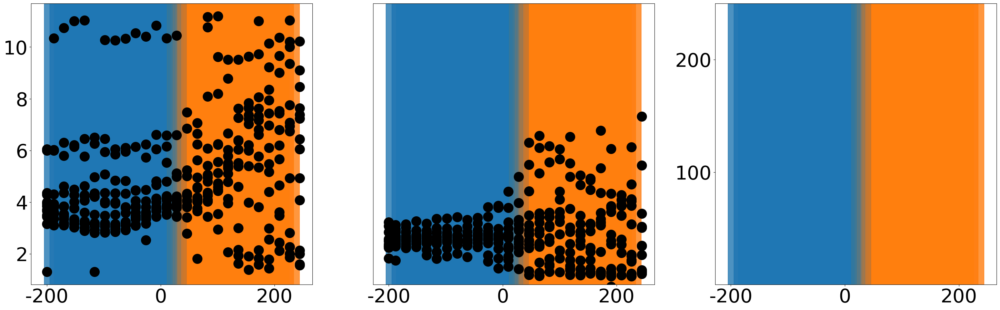

In [12]:
def identify_overlap_barrel(barrel_rois, roi):
    """ return a list of bools of whether roi overlaps w the barrel in barrel_rois
        0 - home barrel, 1 or 2 - neighbor barrel """
    overlap_ctr = OverlapCounterROI([], [])
    is_overlap = [overlap_ctr.do_rois_overlap(barrel, roi) for barrel in barrel_rois]
    return is_overlap

# set matplotlib font size
plt.rcParams.update({'font.size': 40})

# for each Slice/Location/Recording, plot the latency of each ladder ROI
num_legends = 1
for date in ladder_df['Date'].unique():
    date_df = ladder_df[ladder_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]

        # see if we have an ROI file for this slice/recording
        # look up ROI file from crossing_data
        barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == slic_df['Recording'].values[0]) ]
        if barrel_df_sub.empty:
            # then try to look it up in ppr_df_for_roi_lookup
            barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == slic_df['Recording'].values[0]) ]
            if barrel_df_sub.empty:
                print('No ROI file found for ', date, slic, slic_df['Recording'].values[0])
                continue
        handles = []
        fig, ax = plt.subplots(1, 3, figsize=(30, 10))

        for rec in slic_df['Recording'].unique():
            rec_df = slic_df[slic_df['Recording'] == rec]

            # look up ROI file from crossing_data
            barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == rec) ]
            if barrel_df_sub.empty:
                # then try to look it up in ppr_df_for_roi_lookup
                barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == rec) ]
                if barrel_df_sub.empty:
                    print('No ROI file found for ', date, slic, rec)
                    continue

            roi_file = barrel_df_sub['ROI file'].values[0]
            drug = barrel_df_sub['drug'].values[0]
            stim_layer = barrel_df_sub['Layer'].values[0]

            # save roi_file, drug, and stim_layer in ladder_df in new columns
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'ROI file'] = roi_file
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'drug'] = drug
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'Layer'] = stim_layer

            # read in the ROI file
            rois = ROIFileReader(roi_file).get_roi_list()

            # get the center of the home barrel
            home_barrel_center = LaminarROI(rois[0], input_diode_numbers=True).get_center()

            # convert from diode to pixel
            rois = [LaminarROI(roi, input_diode_numbers=True).get_points()
                        for roi in rois]

            # first roi is home barrel, rest are neighboring barrels
            home_barrel = rois[0]
            neighbor_barrels = rois[1:]

            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[rec_df['ROI'] == roi]
                # get the center of the ROI
                x_center = roi_df['X_Center'].values[0]
                y_center = roi_df['Y_Center'].values[0]

                is_overlap = identify_overlap_barrel(rois, [[int(x_center), int(y_center)]])

                # also calculate distance from home barrel along barrel axis
                ln = Line(home_barrel_center, [x_center, y_center])
                dist = ln.get_length()

                resides_in_barrel = None
                if is_overlap[0]:
                    resides_in_barrel = 'Home'
                elif is_overlap[1] or (len(is_overlap) > 2 and is_overlap[2]):
                    resides_in_barrel = 'Neighbor'

                # store in ladder_df
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'resides_in_barrel'] = resides_in_barrel

            # now calculate which ROI is the closest to the home barrel
            arg_min = rec_df['Dist_from_home_barrel'].argmin()
            # get the ROI of the closest ROI
            closest_roi = rec_df.iloc[arg_min]
            closest_x = closest_roi['X_Center']
            closest_y = closest_roi['Y_Center']

            # also, which ROI is closest to the stim (min Stim_Distance)
            arg_min_stim = rec_df['Stim_Distance'].argmin()
            closest_stim_roi = rec_df.iloc[arg_min_stim]
            
            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[(rec_df['ROI'] == roi)]
                dist_to_closest_roi = Line([closest_x, closest_y], 
                                            [roi_df['X_Center'].values[0],
                                                roi_df['Y_Center'].values[0]]).get_length()

                # denote negative distances as those to one side of the closest ROI
                if roi_df['ROI'].values[0] > closest_roi['ROI']:
                    dist_to_closest_roi *= -1

                ladder_df.loc[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist_to_closest_roi * 6.0  # px -> um
                
                # refresh data before plotting
                roi_df = ladder_df[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi)]

                color = 'black' if drug == 'ACSF' else 'tab:green'
                region_color = None
                if roi_df['resides_in_barrel'].values[0] == 'Home':
                    region_color = 'tab:blue'
                if np.abs(roi - closest_stim_roi['ROI']) < 2:
                    region_color = 'tab:blue'
                elif roi_df['resides_in_barrel'].values[0] == 'Neighbor':
                    region_color = 'tab:orange'
                
                for sub_ax in ax:
                    # shade a vertical region of each plot around this ROI
                    if region_color is not None:
                        for radius in range(1, 76, 10):
                            sub_ax.axvspan(roi_df['Dist_from_home_barrel'].values[0] - radius, 
                                        roi_df['Dist_from_home_barrel'].values[0] + radius, 
                                        color=region_color, alpha=(0.06 if stim_layer == 'L2/3' else 0.1))
                    # draw a black dotted vertical line at the closest_stim_roi
                    if roi == closest_stim_roi['ROI'] and drug != 'ACSF':
                        #sub_ax.axvline(x=roi_df['Dist_from_home_barrel'].values[0], color='black', linestyle='--',
                        #            linewidth=4)

                        # and a black star next to the line at 50% the middle of the y-axis scale
                        middle_y = (sub_ax.get_ylim()[0] + sub_ax.get_ylim()[1]) / 2
                        if sub_ax == ax[2]:
                            middle_y = 0

                        #sub_ax.plot(roi_df['Dist_from_home_barrel'].values[0], middle_y, 
                        #            color='black', marker='*', markersize=20)
                
                if drug == 'ACSF':  # exclude NBQX data from the plot now
                    # plot the latency vs distance from home barrel
                    #if 10 > roi_df['latency'].values[0] > 1:
                    # remove latency values > 10 ms
                    if stim_layer == 'L2/3':
                        roi_df = roi_df[roi_df['latency'] < 5]

                    # stim time is 1.2 ms before the closest multiple of 10 (e.g. measured 48.8)
                    # only apply latency correction to values > 10 ms
                    for lat in roi_df['latency']:
                        if lat > 10:
                            roi_df['latency'] = (roi_df['latency'] % 10) + 1.2

                    ax[0].plot(roi_df['Dist_from_home_barrel'], roi_df['latency'], 
                            label=str(resides_in_barrel),
                            color=color, marker='o', markersize=20,
                            markeredgecolor='black')

                    # Now also plot the amplitude vs distance from home barrel
                    #ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['amp'] / 10, 
                    #            label=drug,
                    #            color=color, marker='o', markersize=20,
                    #            markeredgecolor='black')

                    # now also plot the half-width vs distance from home barrel
                    ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['halfwidth'], 
                                label=drug,
                                color=color, marker='o', markersize=20,
                                markeredgecolor='black')
            
            # now we also want to calculate the velocity of the ladder
            # for each pair of ROIs i and i+1, calculate the velocity as the distance between the two ROIs
            # divided by the difference in latency between the two ROIs
            # this will give the velocity in um/ms
            for i in range(1, len(rec_df)):
                roi1 = rec_df.iloc[i-1]
                roi2 = rec_df.iloc[i]
                dist = roi2['Dist_from_home_barrel'] - roi1['Dist_from_home_barrel']
                position = (roi2['Dist_from_home_barrel'] + roi1['Dist_from_home_barrel']) / 2
                latency_diff = roi2['latency'] - roi1['latency']
                velocity = dist / latency_diff
                if 5000 > velocity > -1000:
                    if drug == 'ACSF':
                        ax[2].plot(position, np.abs(velocity), color=color, linestyle='-', marker='o', markersize=20,
                    markeredgecolor='black')
                    # track this in the df as the velocity of roi i-1
                    ladder_df.loc[(ladder_df['Date'] == date) &
                                    (ladder_df['Slice'] == slic) &
                                    (ladder_df['Recording'] == rec) &
                                    (ladder_df['ROI'] == roi1['ROI']), 'instantaneous_velocity'] = velocity
            
            if drug == 'ACSF':
                subset_df_ = ladder_df[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec)]
                print(subset_df_[['drug', 'Dist_from_home_barrel', 'resides_in_barrel', 'instantaneous_velocity']])
                if len(subset_df_) > 40:
                    print(subset_df_)


        #for sub_ax in ax:
            #sub_ax.set_xlabel('Distance along L4 (um)')
        #ax[0].set_ylabel('Latency (ms)')
        #ax[1].set_ylabel('Δf/f (%)')
        #ax[2].set_ylabel('Half-Width (ms)')
        #ax[3].set_ylabel('Velocity (um/ms)')
        ax[1].set_ylim(0, ax[1].get_ylim()[1])
        
        for i in range(3):
            ax[i].set_xticks([0, 200, 400])
            ax[i].set_xticklabels([-200, 0, 200])
        #ax[0].set_yticks([])
        ax[1].set_yticks([])
        ax[2].set_ylim(0, 250)
        ax[2].set_yticks([100, 200])
        #ax[0].set_title()
        handles = ax[0].get_legend_handles_labels()
        handles = [handles[0][0], handles[0][-1]]
        if num_legends > 0:
            #ax[0].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
            num_legends -= 1
        plt.tight_layout()
        plt.savefig(output_fig_dir + 'Ladder_velocity_plot_' \
                + date.replace('/', '-') + '_' + str(slic) + '_' + stim_layer.replace("/", "") + '_' + str(rec) + '_latency.png')
        print('Date: ' + date + '   Slice: ' + str(slic) + '   Stim: ' + stim_layer )
        plt.show()
        

(2, 3)


C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  roi_df['latency'] = (roi_df['latency'] % 10) + 1.2
C:\Users\jjudge3\AppData\Local\Temp\ipykernel_7300\1905392563.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

      drug  Dist_from_home_barrel resides_in_barrel  instantaneous_velocity
1179  ACSF             395.851117              None               59.992779
1180  ACSF             377.853283              None              -34.210721
1181  ACSF             359.721601          Neighbor               99.448681
1182  ACSF             341.820838          Neighbor              102.273456
1183  ACSF             323.922983          Neighbor              109.085955
1184  ACSF             305.923801          Neighbor              116.123099
1185  ACSF             287.924720          Neighbor               24.455106
1186  ACSF             269.925763              None              109.117144
1187  ACSF             251.812317              None               73.770492
1188  ACSF             233.812317              None              189.473684
1189  ACSF             215.812317              None              610.881590
1190  ACSF             198.096751              None               53.227564
1191  ACSF  

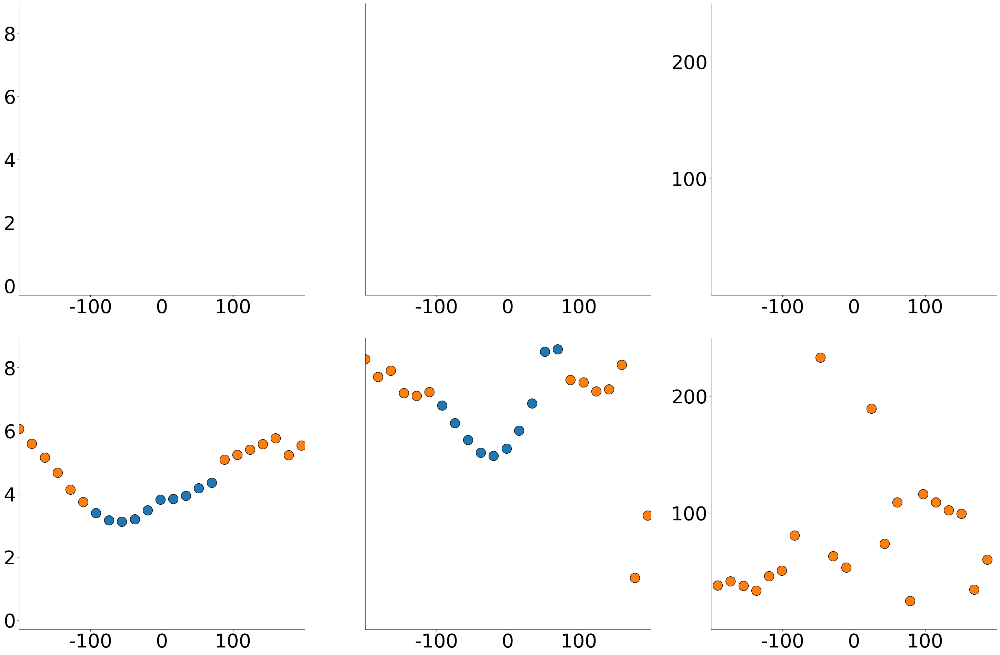

In [13]:
def identify_overlap_barrel(barrel_rois, roi):
    """ return a list of bools of whether roi overlaps w the barrel in barrel_rois
        0 - home barrel, 1 or 2 - neighbor barrel """
    overlap_ctr = OverlapCounterROI([], [])
    is_overlap = [overlap_ctr.do_rois_overlap(barrel, roi) for barrel in barrel_rois]
    return is_overlap

# set matplotlib font size
plt.rcParams.update({'font.size': 40})

# for each Slice/Location/Recording, plot the latency of each ladder ROI
num_legends = 1
for date in ladder_df['Date'].unique():
    date_df = ladder_df[ladder_df['Date'] == date]
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]

        if not (date == '1/22/2025' and slic == 3): #(date == '7/1/2024' and slic == 3): #:(date == '1/15/2025' and slic == 1): # 
            continue

        # see if we have an ROI file for this slice/recording
        # look up ROI file from crossing_data
        barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == slic_df['Recording'].values[0]) ]
        if barrel_df_sub.empty:
            # then try to look it up in ppr_df_for_roi_lookup
            barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == slic_df['Recording'].values[0]) ]
            if barrel_df_sub.empty:
                print('No ROI file found for ', date, slic, slic_df['Recording'].values[0])
                continue
        handles = []
        fig, ax = plt.subplots(2, 3, figsize=(30, 20))
        print(ax.shape)

        for rec in slic_df['Recording'].unique():
            rec_df = slic_df[slic_df['Recording'] == rec]

            # look up ROI file from crossing_data
            barrel_df_sub = crossing_data[(crossing_data['Date'] == date) &
                                    (crossing_data['Slice'] == slic) &
                                    (crossing_data['Recording'] == rec) ]
            if barrel_df_sub.empty:
                # then try to look it up in ppr_df_for_roi_lookup
                barrel_df_sub = ppr_df_for_roi_lookup[(ppr_df_for_roi_lookup['Date'] == date) &
                                    (ppr_df_for_roi_lookup['Slice'] == slic) &
                                    (ppr_df_for_roi_lookup['Recording'] == rec) ]
                if barrel_df_sub.empty:
                    print('No ROI file found for ', date, slic, rec)
                    continue

            roi_file = barrel_df_sub['ROI file'].values[0]
            drug = barrel_df_sub['drug'].values[0]
            stim_layer = barrel_df_sub['Layer'].values[0]

            # save roi_file, drug, and stim_layer in ladder_df in new columns
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'ROI file'] = roi_file
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'drug'] = drug
            ladder_df.loc[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec), 'Layer'] = stim_layer

            # read in the ROI file
            rois = ROIFileReader(roi_file).get_roi_list()

            # get the center of the home barrel
            home_barrel_center = LaminarROI(rois[0], input_diode_numbers=True).get_center()

            # convert from diode to pixel
            rois = [LaminarROI(roi, input_diode_numbers=True).get_points()
                        for roi in rois]

            # first roi is home barrel, rest are neighboring barrels
            home_barrel = rois[0]
            neighbor_barrels = rois[1:]

            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[rec_df['ROI'] == roi]
                # get the center of the ROI
                x_center = roi_df['X_Center'].values[0]
                y_center = roi_df['Y_Center'].values[0]

                is_overlap = identify_overlap_barrel(rois, [[int(x_center), int(y_center)]])

                # also calculate distance from home barrel along barrel axis
                ln = Line(home_barrel_center, [x_center, y_center])
                dist = ln.get_length()

                resides_in_barrel = None
                if is_overlap[0]:
                    resides_in_barrel = 'Home'
                elif is_overlap[1] or (len(is_overlap) > 2 and is_overlap[2]):
                    resides_in_barrel = 'Neighbor'

                # store in ladder_df
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist
                ladder_df.loc[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['ROI'] == roi), 'resides_in_barrel'] = resides_in_barrel

            # now calculate which ROI is the closest to the home barrel
            arg_min = rec_df['Dist_from_home_barrel'].argmin()
            # get the ROI of the closest ROI
            closest_roi = rec_df.iloc[arg_min]
            closest_x = closest_roi['X_Center']
            closest_y = closest_roi['Y_Center']

            # also, which ROI is closest to the stim (min Stim_Distance)
            arg_min_stim = rec_df['Stim_Distance'].argmin()
            closest_stim_roi = rec_df.iloc[arg_min_stim]
            
            for roi in rec_df['ROI'].unique():
                roi_df = rec_df[(rec_df['ROI'] == roi)]
                dist_to_closest_roi = Line([closest_x, closest_y], 
                                            [roi_df['X_Center'].values[0],
                                                roi_df['Y_Center'].values[0]]).get_length()

                # denote negative distances as those to one side of the closest ROI
                if roi_df['ROI'].values[0] > closest_roi['ROI']:
                    dist_to_closest_roi *= -1

                ladder_df.loc[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi), 'Dist_from_home_barrel'] = dist_to_closest_roi * 6.0  # px -> um
                
                # refresh data before plotting
                roi_df = ladder_df[(ladder_df['Date'] == date) &
                                (ladder_df['Slice'] == slic) &
                                (ladder_df['Recording'] == rec) &
                                (ladder_df['ROI'] == roi)]

                
                region_color = None
                i_resides_in_barrel = None

                if roi_df['resides_in_barrel'].values[0] == 'Home' or (np.abs(roi_df['Dist_from_home_barrel'].values[0] - 200) < 100):
                    region_color = 'tab:blue'
                    i_resides_in_barrel = 0
                if np.abs(roi - closest_stim_roi['ROI']) < 2:
                    region_color = 'tab:blue'
                    i_resides_in_barrel = 0
                elif roi_df['resides_in_barrel'].values[0] == 'Neighbor':
                    region_color = 'tab:orange'
                    i_resides_in_barrel = 1
                color = 'tab:orange' if i_resides_in_barrel == 1 else 'tab:blue' if i_resides_in_barrel == 0 else 'tab:orange'
                i_resides_in_barrel = 1
                
                for sub_ax in ax[0]:  # only first row, i.e. home
                    # shade a vertical region of each plot around this ROI
                    if region_color is not None:
                        for radius in range(1, 76, 10):
                            pass #sub_ax.axvspan(roi_df['Dist_from_home_barrel'].values[0] - radius, 
                            #            roi_df['Dist_from_home_barrel'].values[0] + radius, 
                            #            color=region_color, alpha=(0.06 if stim_layer == 'L2/3' else 0.1))
                    # draw a black dotted vertical line at the closest_stim_roi
                    if roi == closest_stim_roi['ROI'] and drug != 'ACSF':
                        #sub_ax.axvline(x=roi_df['Dist_from_home_barrel'].values[0], color='black', linestyle='--',
                        #            linewidth=4)

                        # and a black star next to the line at 50% the middle of the y-axis scale
                        middle_y = (sub_ax.get_ylim()[0] + sub_ax.get_ylim()[1]) / 2
                        if sub_ax == ax[0][2]:
                            middle_y = 0

                        #sub_ax.plot(roi_df['Dist_from_home_barrel'].values[0], middle_y, 
                        #            color='black', marker='*', markersize=20)
                
                if drug == 'ACSF' and i_resides_in_barrel is not None:  # exclude NBQX data from the plot now
                    # plot the latency vs distance from home barrel
                    #if 10 > roi_df['latency'].values[0] > 1:
                    # remove latency values > 10 ms
                    if stim_layer == 'L2/3':
                        roi_df = roi_df[roi_df['latency'] < 5]

                    # stim time is 1.2 ms before the closest multiple of 10 (e.g. measured 48.8)
                    # only apply latency correction to values > 10 ms
                    for lat in roi_df['latency']:
                        if lat > 10:
                            roi_df['latency'] = (roi_df['latency'] % 10) + 1.2

                    ax[i_resides_in_barrel][0].plot(roi_df['Dist_from_home_barrel'], roi_df['latency'], 
                            label=str(resides_in_barrel),
                            color=color, marker='o', markersize=20,
                            markeredgecolor='black')

                    # Now also plot the amplitude vs distance from home barrel
                    #ax[1].plot(roi_df['Dist_from_home_barrel'], roi_df['amp'] / 10, 
                    #            label=drug,
                    #            color=color, marker='o', markersize=20,
                    #            markeredgecolor='black')

                    # now also plot the half-width vs distance from home barrel
                    ax[i_resides_in_barrel][1].plot(roi_df['Dist_from_home_barrel'], roi_df['halfwidth'], 
                                label=drug,
                                color=color, marker='o', markersize=20,
                                markeredgecolor='black')
            
            # now we also want to calculate the velocity of the ladder
            # for each pair of ROIs i and i+1, calculate the velocity as the distance between the two ROIs
            # divided by the difference in latency between the two ROIs
            # this will give the velocity in um/ms
            for i in range(1, len(rec_df)):
                roi1 = rec_df.iloc[i-1]
                roi2 = rec_df.iloc[i]
                dist = roi2['Dist_from_home_barrel'] - roi1['Dist_from_home_barrel']
                position = (roi2['Dist_from_home_barrel'] + roi1['Dist_from_home_barrel']) / 2
                latency_diff = roi2['latency'] - roi1['latency']
                velocity = dist / latency_diff
                if 5000 > velocity > -1000 and i_resides_in_barrel is not None:
                    if drug == 'ACSF':
                        ax[i_resides_in_barrel][2].plot(position, np.abs(velocity), color=color, linestyle='-', marker='o', markersize=20,
                    markeredgecolor='black')
                    # track this in the df as the velocity of roi i-1
                    ladder_df.loc[(ladder_df['Date'] == date) &
                                    (ladder_df['Slice'] == slic) &
                                    (ladder_df['Recording'] == rec) &
                                    (ladder_df['ROI'] == roi1['ROI']), 'instantaneous_velocity'] = velocity
            
            if drug == 'ACSF':
                subset_df_ = ladder_df[(ladder_df['Date'] == date) &
                            (ladder_df['Slice'] == slic) &
                            (ladder_df['Recording'] == rec)]
                print(subset_df_[['drug', 'Dist_from_home_barrel', 'resides_in_barrel', 'instantaneous_velocity']])
                if len(subset_df_) > 40:
                    print(subset_df_)


        #for sub_ax in ax:
            #sub_ax.set_xlabel('Distance along L4 (um)')
        #ax[0].set_ylabel('Latency (ms)')
        #ax[1].set_ylabel('Δf/f (%)')
        #ax[2].set_ylabel('Half-Width (ms)')
        #ax[3].set_ylabel('Velocity (um/ms)')
        for i_resides_in_barrel in range(2):
            ax[i_resides_in_barrel][1].set_ylim(0, ax[i_resides_in_barrel][1].get_ylim()[1])

            for i in range(3):
                ax[i_resides_in_barrel][i].set_xticks([100, 200, 300])
                ax[i_resides_in_barrel][i].set_xticklabels([-100, 0, 100])
                ax[i_resides_in_barrel][i].set_xlim(0, 400)
            #ax[0].set_yticks([])
            ax[i_resides_in_barrel][1].set_yticks([])
            ax[i_resides_in_barrel][2].set_ylim(0, 250)
            ax[i_resides_in_barrel][2].set_yticks([100, 200])

            # ax[0][0] and ax[1][0] should have the same ylim
            ax00_ylim = ax[0][0].get_ylim()
            ax10_ylim = ax[1][0].get_ylim()
            ax[1][0].set_ylim(min(ax00_ylim[0], ax10_ylim[0]) - 0.15, 1.2 * max(ax00_ylim[1], ax10_ylim[1]))
            ax[0][0].set_ylim(min(ax00_ylim[0], ax10_ylim[0]) - 0.15, 1.2 * max(ax00_ylim[1], ax10_ylim[1]))

        # remove spines
        for sub_ax in ax:
            for a in sub_ax:
                a.spines['top'].set_visible(False)
                a.spines['right'].set_visible(False)
        #ax[0].set_title()
        #handles = ax[0].get_legend_handles_labels()
        #handles = [handles[0][0], handles[0][-1]]
        #if num_legends > 0:
            #ax[0].legend(handles=handles, labels=['ACSF', '+NBQX'], loc='upper left')
        #    num_legends -= 1
        plt.tight_layout()
        plt.savefig(output_fig_dir + 'Sep_Ladder_velocity_plot_' \
                + date.replace('/', '-') + '_' + str(slic) + '_' + stim_layer.replace("/", "") + '_' + str(rec) + '_latency.png')
        print('Date: ' + date + '   Slice: ' + str(slic) + '   Stim: ' + stim_layer )
        plt.show()
        

In [14]:
print(ladder_df.columns)
ladder_df

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file'],
      dtype='object')


,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,trace,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN,NaN,NaN,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN,NaN,NaN,350.406813,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN,NaN,NaN,332.813666,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN,NaN,NaN,315.415427,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,ACSF,L2/3,NaN,NaN,NaN,297.374375,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,NaN,ACSF,L4,Sagittal,120.0,True,82.732005,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,NaN,ACSF,L4,Sagittal,120.0,True,67.432150,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,NaN,ACSF,L4,Sagittal,120.0,True,43.451046,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,NaN,ACSF,L4,Sagittal,120.0,True,21.879303,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...


In [15]:

# remove any row in ladder_df_2 or from ladder_df that has the same date/slice/recording/ROI as ladder_df
ladder_df_nbqx = ladder_df.copy()
for row in ladder_df_nbqx.iterrows():
    date = row[1]['Date']
    slic = row[1]['Slice']
    rec = row[1]['Recording']
    #print(f"Checking {date} {slic} {rec} {roi} in ladder_df_2")
    if len(ladder_df_2[(ladder_df_2['Date'] == date) & 
                            (ladder_df_2['Slice'] == slic) & 
                            (ladder_df_2['Recording'] == rec)]) > 0:
        ladder_df_nbqx.drop(row[0], inplace=True)
        print(f"Removing {date} {slic} {rec} from ladder_df_nbqx")

# drop any rows that are marked as 'Is_Pulse_2' in ladder_df_nbqx
if 'Is_Pulse_2' in ladder_df_nbqx.columns:
    # remove any rows that are marked as 'Is_Pulse_2'
    ladder_df_nbqx = ladder_df_nbqx[ladder_df_nbqx['Is_Pulse_2'] != True]

Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_df_nbqx
Removing 1/2/2025 1 1 from ladder_

In [16]:
# load all_animals_age_sex.csv from C:\Users\jjudge3\Desktop\Data\crossing_PPR\
age_sex_csv = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/all_animals_age_sex.csv'
age_sex_df = pd.read_csv(age_sex_csv)

# add age and sex as columns to ladder_df_nbqx, matching on Date
# Merge Age and Sex from age_sex_df into ladder_df_nbqx using the Date column
ladder_df_nbqx = ladder_df_nbqx.merge(
    age_sex_df[['Date', 'Age', 'Sex']],
    on='Date',
    how='left',
    suffixes=('', '_from_age_sex')
)
ladder_df_nbqx

# abs value on instantaneous_velocity
ladder_df_nbqx['instantaneous_velocity'] = ladder_df_nbqx['instantaneous_velocity'].abs()

# write the ladder_df_nbqx to a CSV file called export_summary_final_velocity_ladders.csv
ladder_df_nbqx.to_csv('C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_final_velocity_ladders.csv', index=False)
ladder_df_nbqx

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,Age,Sex
0,1,0.408552,19.71280,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,L2/3,NaN,NaN,NaN,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,92.0,F
1,2,0.462050,27.53930,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,L2/3,NaN,NaN,NaN,350.406813,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,92.0,F
2,3,0.441868,28.27000,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,L2/3,NaN,NaN,NaN,332.813666,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,92.0,F
3,4,0.466602,22.11340,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,L2/3,NaN,NaN,NaN,315.415427,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,92.0,F
4,5,0.526346,26.86690,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,L2/3,NaN,NaN,NaN,297.374375,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,92.0,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
811,23,0.891664,6.89549,4.2499,4.98453,270.732340,64.188679,10.188679,2_rois_output__ladder_,12/20/2024,...,L4,NaN,NaN,NaN,112.869169,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,39.0,M
812,24,0.890471,8.54388,4.0276,5.25165,285.236744,65.875000,7.729167,2_rois_output__ladder_,12/20/2024,...,L4,NaN,NaN,NaN,97.156784,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,39.0,M
813,25,0.819354,6.14769,4.6185,6.57728,299.879976,68.851351,6.040541,2_rois_output__ladder_,12/20/2024,...,L4,NaN,NaN,NaN,84.918280,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,39.0,M
814,26,0.807898,3.57018,3.7011,10.02130,313.955411,71.740741,4.351852,2_rois_output__ladder_,12/20/2024,...,L4,NaN,NaN,NaN,71.190704,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,39.0,M


L2/3 Neighbor 3.636 +/- 0.093 um/ms
L4 Neighbor 4.065 +/- 0.300 um/ms
L2/3 Neighbor 3.401 +/- 0.154 um/ms
L4 Neighbor 2.982 +/- 0.093 um/ms
Date        Slice
10/23/2024  1        3.718967
12/20/2024  1        5.396700
6/26/2024   1        3.817340
7/1/2024    3        3.498514
            4        3.591557
7/15/2024   2        2.984840
Name: latency, dtype: float64 Date        Slice
10/23/2024  1        3.718967
12/20/2024  1        5.396700
6/26/2024   1        3.817340
7/1/2024    3        3.498514
            4        3.591557
7/15/2024   2        2.984840
Name: latency, dtype: float64
0.0 1.0 male and female test: latency layer: L2/3
Date        Slice
10/29/2024  1        2.024900
12/11/2024  2        2.815625
            3        3.800850
12/18/2024  2        3.185000
12/20/2024  2        5.079692
12/9/2024   2        2.803520
7/17/2024   3        2.943267
Name: latency, dtype: float64 Date        Slice
10/29/2024  1        2.024900
12/11/2024  2        2.815625
            3     

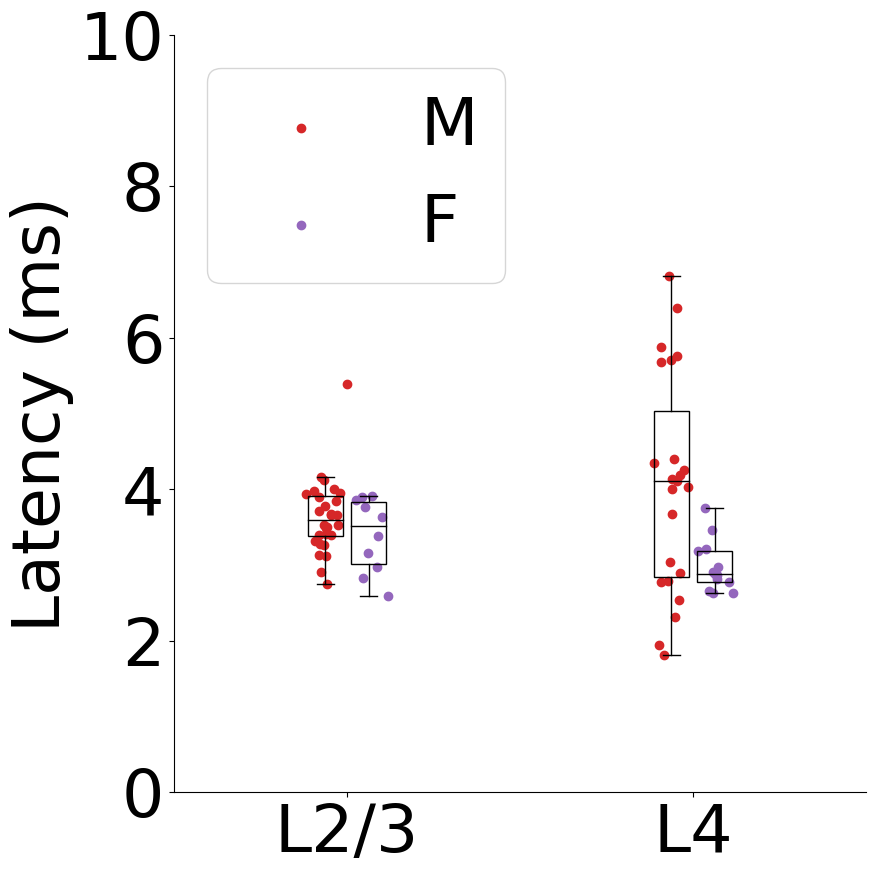

L2/3 Neighbor 3.614 +/- 0.348 um/ms
L4 Neighbor 3.496 +/- 0.725 um/ms
L2/3 Neighbor 1.901 +/- 0.470 um/ms
L4 Neighbor 3.688 +/- 0.737 um/ms
Date        Slice
10/23/2024  1        0.297847
12/20/2024  1        3.366220
6/26/2024   1        0.491232
7/1/2024    3        4.618447
            4        4.485337
7/15/2024   2        3.312360
Name: amp, dtype: float64 Date        Slice
10/23/2024  1        0.297847
12/20/2024  1        3.366220
6/26/2024   1        0.491232
7/1/2024    3        4.618447
            4        4.485337
7/15/2024   2        3.312360
Name: amp, dtype: float64
0.0 1.0 male and female test: amp layer: L2/3
Date        Slice
10/29/2024  1        11.271067
12/11/2024  2         0.798567
            3         4.314008
12/18/2024  2         1.790246
12/20/2024  2         2.180017
12/9/2024   2         2.946464
7/17/2024   3         8.090730
Name: amp, dtype: float64 Date        Slice
10/29/2024  1        11.271067
12/11/2024  2         0.798567
            3         4.3

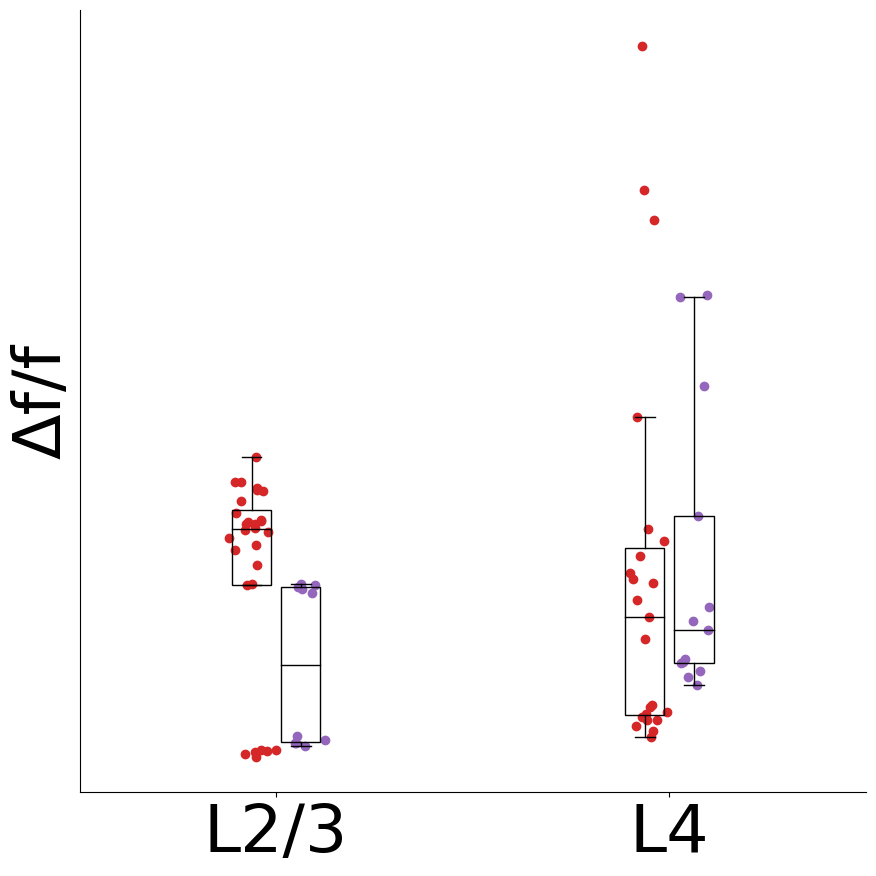

L2/3 Neighbor 10.53 +/- 0.580 um/ms
L4 Neighbor 15.29 +/- 1.965 um/ms
L2/3 Neighbor 11.88 +/- 0.793 um/ms
L4 Neighbor 15.40 +/- 1.827 um/ms
Date        Slice
10/23/2024  1        10.527975
12/20/2024  1        20.409400
6/26/2024   1        12.539660
7/1/2024    3         8.366849
            4        13.470743
7/15/2024   2        11.236660
Name: halfwidth, dtype: float64 Date        Slice
10/23/2024  1        10.527975
12/20/2024  1        20.409400
6/26/2024   1        12.539660
7/1/2024    3         8.366849
            4        13.470743
7/15/2024   2        11.236660
Name: halfwidth, dtype: float64
0.0 1.0 male and female test: halfwidth layer: L2/3
Date        Slice
10/29/2024  1         7.928047
12/11/2024  2        12.429553
            3        15.971825
12/18/2024  2        16.724320
12/20/2024  2        17.870466
12/9/2024   2        19.566000
7/17/2024   3         6.289943
Name: halfwidth, dtype: float64 Date        Slice
10/29/2024  1         7.928047
12/11/2024  2       

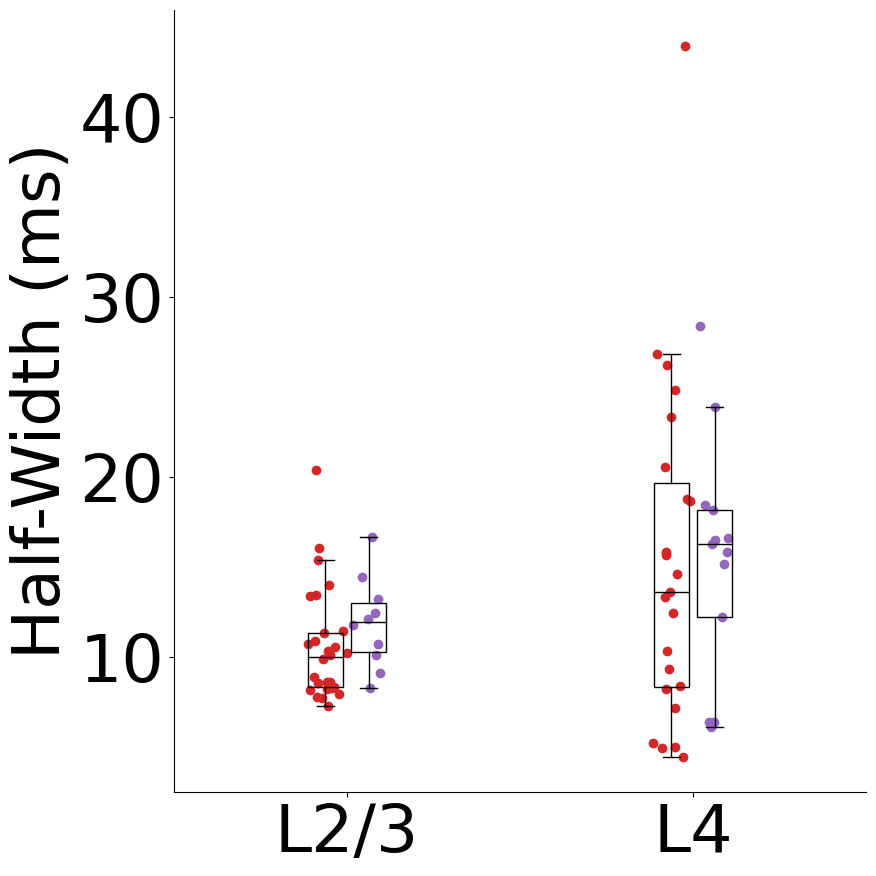

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scala

L2/3 Neighbor nan +/- nan um/ms
L4 Neighbor nan +/- nan um/ms
L2/3 Neighbor nan +/- nan um/ms
L4 Neighbor nan +/- nan um/ms
Date        Slice
10/23/2024  1       NaN
12/20/2024  1       NaN
6/26/2024   1       NaN
7/1/2024    3       NaN
            4       NaN
7/15/2024   2       NaN
Name: instantaneous_velocity, dtype: float64 Date        Slice
10/23/2024  1       NaN
12/20/2024  1       NaN
6/26/2024   1       NaN
7/1/2024    3       NaN
            4       NaN
7/15/2024   2       NaN
Name: instantaneous_velocity, dtype: float64
nan nan male and female test: instantaneous_velocity layer: L2/3
Date        Slice
10/29/2024  1       NaN
12/11/2024  2       NaN
            3       NaN
12/18/2024  2       NaN
12/20/2024  2       NaN
12/9/2024   2       NaN
7/17/2024   3       NaN
Name: instantaneous_velocity, dtype: float64 Date        Slice
10/29/2024  1       NaN
12/11/2024  2       NaN
            3       NaN
12/18/2024  2       NaN
12/20/2024  2       NaN
12/9/2024   2       NaN
7/17

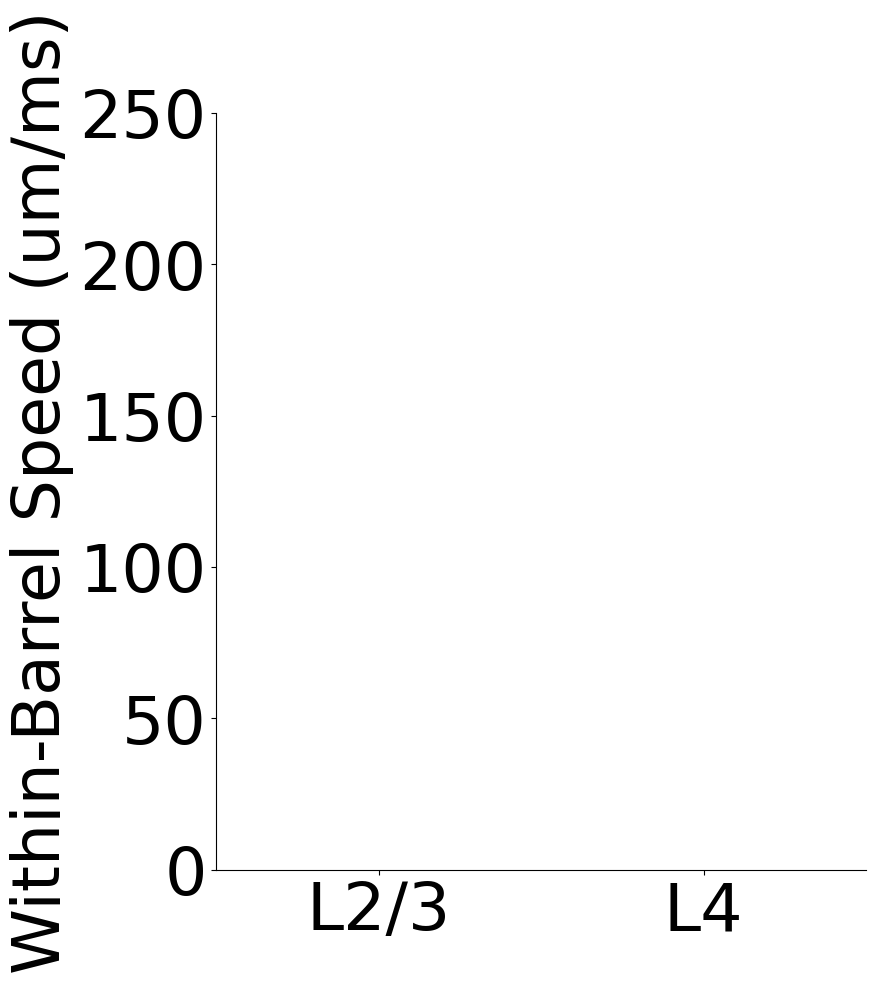

In [17]:
# 1-d scatter plot of the average speed
# broken down by sex

# matplotlib font size larger
plt.rcParams.update({'font.size': 48})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Within-Barrel Speed (um/ms)']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']
    for i_sex, sex in enumerate(['M', 'F']):

        speeds = []
        positions = []
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['Sex'] == sex) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
                if metric == 'instantaneous_velocity':
                    # remove outliers
                    speed = [s for s in speed if s < 300]
                
                speeds.append(speed)
                positions.append(i + i_sex/8 - 1/16)
                # print the mean +/- sem of the speed
                print(layer, region, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
        ax.boxplot(speeds, positions=positions, 
                        showfliers=False, patch_artist=True,
                        boxprops=dict(facecolor=(0,0,0,0)),
                        widths=0.1,
                        medianprops=dict(color='black'))
        

    # scatter plot of the average speed
    for i, layer in enumerate(layers):
        for j, sex in enumerate(['M', 'F']):
            edgecolors= None
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['Sex'] == sex) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(region_df))
                ax.scatter(x_jitter, 
                                np.abs(region_df[metric]), 
                                label=sex, 
                                color='tab:red' if sex == 'M' else 'tab:purple',
                                edgecolors=edgecolors)
                
                if metric == 'instantaneous_velocity':
                    ax.set_ylim(0, 250)
                elif metric == 'latency':
                    ax.set_ylim(0, 10)
                elif metric == 'amp':
                    # ax.set_ylim(0, 10.5)
                    ax.set_yticks([])
                elif metric == 'halfwidth':
                    pass # ax.set_ylim(0, 2.5)
                ax.set_xlim(-.5, 1.5)
                ax.set_xticks([0, 1])
                ax.set_xticklabels(layers)

    for layer_sig in ['L2/3', 'L4']:
        # is there a significant difference between M and F for L2/3 and L4? 
        male = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) & 
                                (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]
        female = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) &
                                (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]

        # average for each date/slice
        male = male.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        female = female.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()

        print(male, female)

        t_stat, p_val = ttest_ind(male, female, equal_var=False)
        print(t_stat, p_val, "male and female test:", metric, "layer:", layer_sig)

        # get t-test for adjusted p-value
        if p_val < 0.05:
            print('Significant difference between ACSF and NBQX for ' + metric + ' in ' + layer_sig)
            # place in terms of fraction of the y-axis
            x_loc = 0 if layer_sig == 'L2/3' else 1
            ax.text(x_loc, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            layer_sig_shift = 1/10 
            
            layer_sig_yshift = 0.02 if layer_sig == 'L4' else 0.0
            y_height = (0.7 - layer_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([x_loc - layer_sig_shift, x_loc + layer_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([x_loc - layer_sig_shift, x_loc - layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([x_loc + layer_sig_shift, x_loc + layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/sex_' + metric + '.png')
    plt.show()
        

L2/3 Neighbor 3.574 +/- 0.080 um/ms
L4 Neighbor 3.674 +/- 0.212 um/ms
Linear regression for L2/3 Neighbor: slope=-0.03, intercept=5.67, p-value=0.230
Linear regression for L4 Neighbor: slope=-0.02, intercept=4.49, p-value=0.478


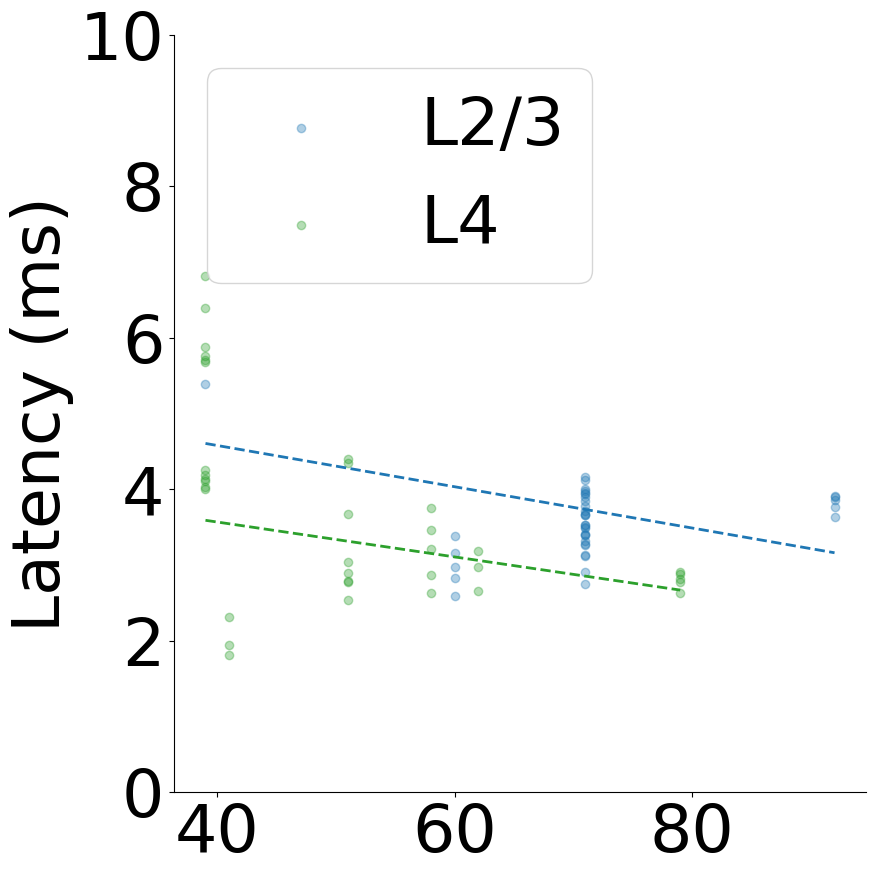

L2/3 Neighbor 3.163 +/- 0.307 um/ms
L4 Neighbor 3.566 +/- 0.528 um/ms
Linear regression for L2/3 Neighbor: slope=-0.05, intercept=6.03, p-value=0.382
Linear regression for L4 Neighbor: slope=-0.06, intercept=7.53, p-value=0.668


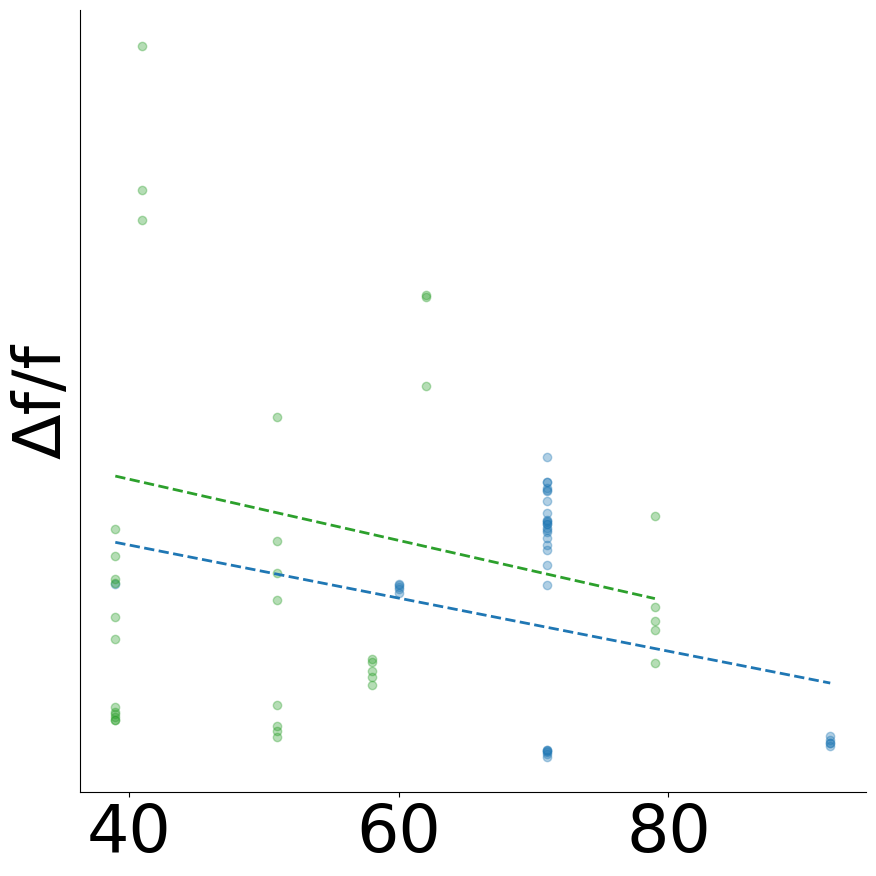

L2/3 Neighbor 10.89 +/- 0.480 um/ms
L4 Neighbor 15.33 +/- 1.401 um/ms
Linear regression for L2/3 Neighbor: slope=-0.15, intercept=23.17, p-value=0.164
Linear regression for L4 Neighbor: slope=0.10, intercept=8.53, p-value=0.573


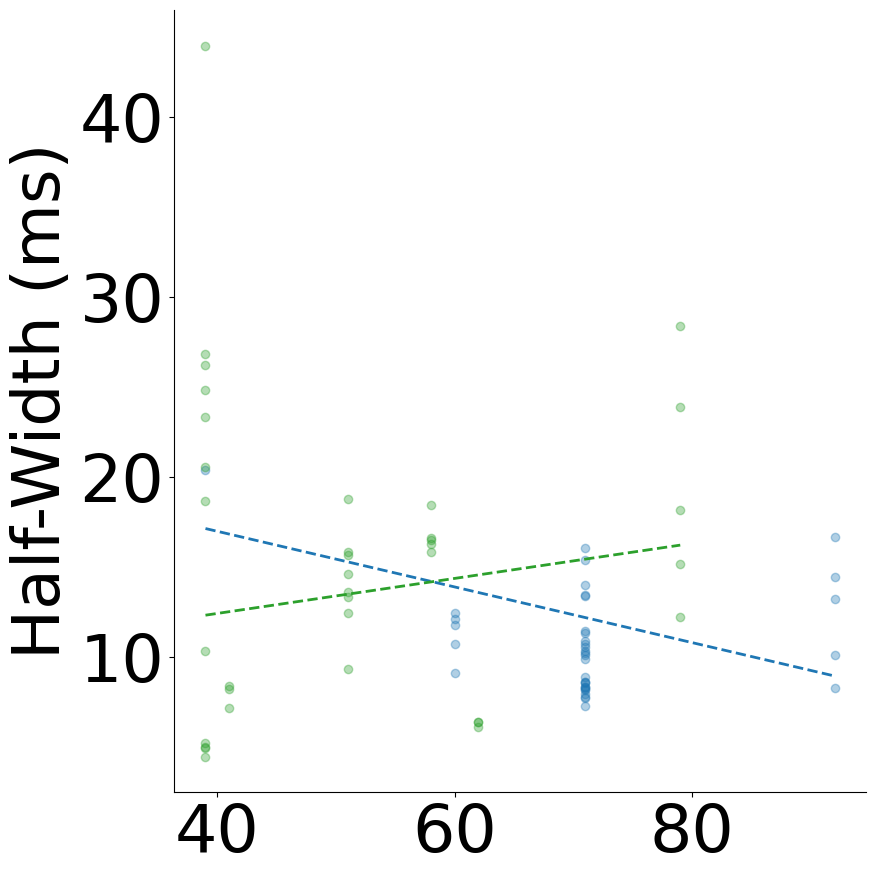

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scala

L2/3 Neighbor nan +/- nan um/ms
L4 Neighbor nan +/- nan um/ms
Linear regression for Neighbor: slope=nan, intercept=nan, p-value=nan


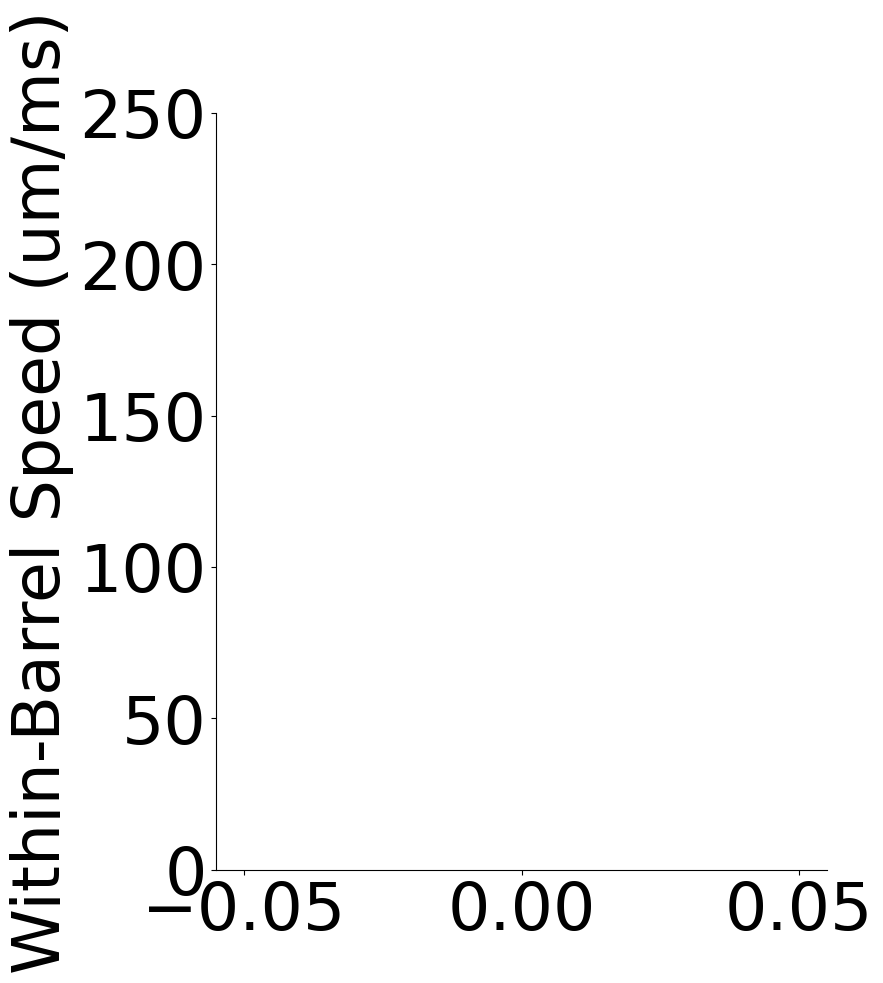

In [18]:
# 2-d scatter plot of the average speed
# versus age

# matplotlib font size larger
plt.rcParams.update({'font.size': 48})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Within-Barrel Speed (um/ms)']):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']

    for i, layer in enumerate(layers):
        for i_reg, region in enumerate(['Neighbor']):
            region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                    (ladder_df_nbqx['drug'] == 'ACSF') &
                                    (ladder_df_nbqx['resides_in_barrel'] == region)]

            edgecolors= None
            ax.scatter(np.abs(region_df['Age']), 
                                np.abs(region_df[metric]), 
                                label=layer, 
                                color='tab:blue' if layer == 'L2/3' else 'tab:green',
                                edgecolors=edgecolors,
                                alpha=0.35,)

            speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
            if metric == 'instantaneous_velocity':
                # remove outliers
                speed = [s for s in speed if s < 300]
            
            # print the mean +/- sem of the speed
            print(layer, region, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
    if metric == 'instantaneous_velocity':
        ax.set_ylim(0, 250)
    elif metric == 'latency':
        ax.set_ylim(0, 10)
    elif metric == 'amp':
        # ax.set_ylim(0, 10.5)
        ax.set_yticks([])
    elif metric == 'halfwidth':
        pass # ax.set_ylim(0, 2.5)


    # linear regression lines by layer
    if metric != 'instantaneous_velocity':
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == 'ACSF') &
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                # average for each date/slice
                region_df = region_df.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
                if len(region_df) > 0:
                    # fit a linear regression line
                    slope, intercept, r_value, p_value, std_err = linregress(region_df['Age'], region_df[metric])
                    x_vals = np.linspace(region_df['Age'].min(), region_df['Age'].max(), 100)
                    y_vals = slope * x_vals + intercept
                    ax.plot(x_vals, y_vals, color='tab:blue' if layer == 'L2/3' else 'tab:green', linestyle='--', linewidth=2)
                    print(f"Linear regression for {layer} {region}: slope={slope:.2f}, intercept={intercept:.2f}, p-value={p_value:.3f}")
    else:
        for i_reg, region in enumerate(['Neighbor']):
            region_df = ladder_df_nbqx[#(ladder_df_nbqx['Layer'] == layer) & 
                                    (ladder_df_nbqx['drug'] == 'ACSF') &
                                    (ladder_df_nbqx['resides_in_barrel'] == region)]
            # average for each date/slice
            region_df = region_df.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
            if len(region_df) > 0:
                # fit a linear regression line
                slope, intercept, r_value, p_value, std_err = linregress(region_df['Age'], region_df[metric])
                x_vals = np.linspace(region_df['Age'].min(), region_df['Age'].max(), 100)
                y_vals = slope * x_vals + intercept
                ax.plot(x_vals, y_vals, color='tab:blue' if layer == 'L2/3' else 'tab:green', linestyle='--', linewidth=2)
                print(f"Linear regression for {region}: slope={slope:.2f}, intercept={intercept:.2f}, p-value={p_value:.3f}")

    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/age_' + metric + '.png')
    plt.show()
        

c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:221: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:253: RuntimeWarning: invalid value encountered in double_scala

L2/3 Neighbor ACSF nan +/- nan um/ms
Sample size: 0
L4 Neighbor ACSF nan +/- nan um/ms
Sample size: 0
L2/3 Neighbor NBQX nan +/- nan um/ms
Sample size: 0
L4 Neighbor NBQX nan +/- nan um/ms
Sample size: 0
nan nan Neighbor L2/3 and L4 test: instantaneous_velocity drug: ACSF sample size: 0 0
nan nan Neighbor L2/3 and L4 test: instantaneous_velocity drug: NBQX sample size: 0 0
nan nan ACSF and NBQX test: instantaneous_velocity layer: L2/3
nan nan ACSF and NBQX test: instantaneous_velocity layer: L4


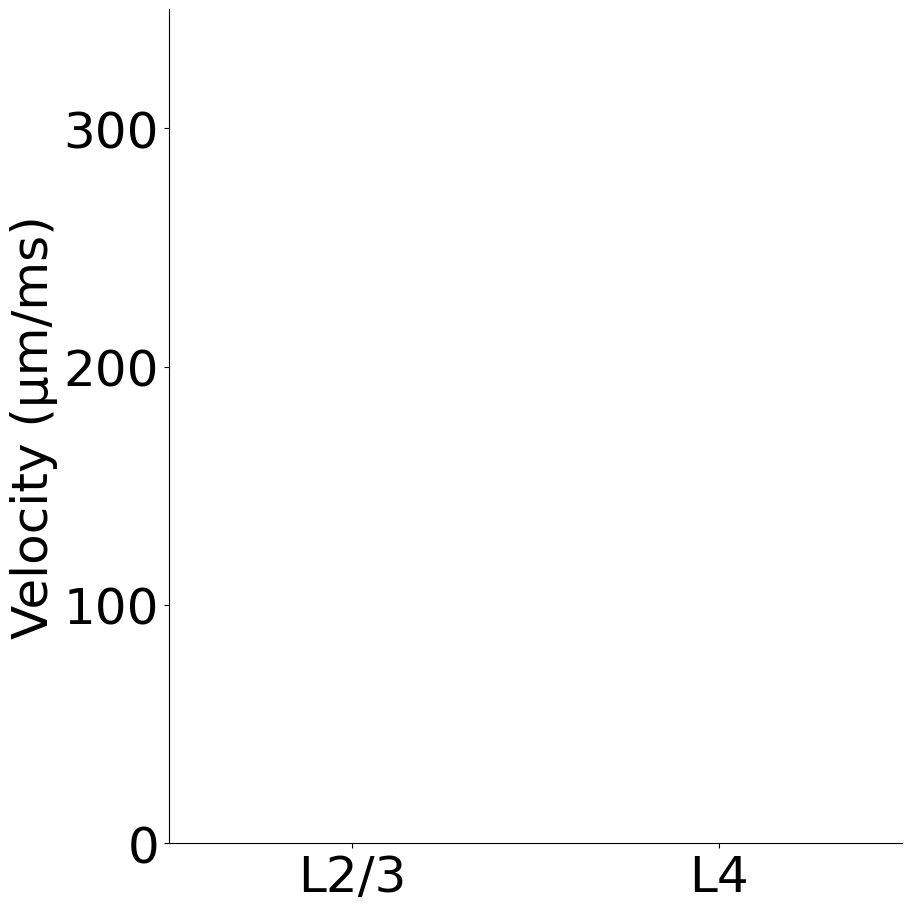

In [19]:
# make a 1-d scatter plot of the average speed
# broken down by home vs neighbor barrel and L2/3 vs L4


# matplotlib font size larger
plt.rcParams.update({'font.size': 36})

for metric, label in zip(['latency', 'amp', 'halfwidth', 'instantaneous_velocity'], 
                            ['Latency (ms)', 'Δf/f', 'Half-Width (ms)', 'Velocity (μm/ms)']):
    if metric != 'instantaneous_velocity':
        continue
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    layers = ['L2/3', 'L4']
    drug = ['ACSF', 'NBQX']
    # boxplots of the average speed
    for j, d in enumerate(drug):
        speeds = []
        positions = []
        for i, layer in enumerate(layers):
            for i_reg, region in enumerate(['Neighbor']):
                region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                speed = [s for s in list(np.abs(region_df[metric])) if not np.isnan(s)]
                if metric == 'instantaneous_velocity':
                    # remove outliers
                    speed = [s for s in speed if 60 < s < 600]
                
                speeds.append(speed)
                positions.append(i + j/8 - 1/16)
                # print the mean +/- sem of the speed
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(speed))
                ax.scatter(x_jitter, 
                                np.abs(speed), 
                                label=d, 
                                color='tab:orange',
                                edgecolors="black" if d == 'NBQX' else None)
                print(layer, region, d, str(np.mean(speed))[:5], "+/-", str(sem(speed))[:5], "um/ms")
                print("Sample size:", len(speed))
        ax.boxplot(speeds, positions=positions, 
                        showfliers=False, patch_artist=True,
                        boxprops=dict(facecolor=(0,0,0,0)),
                        widths=0.1,
                        medianprops=dict(color='black'))
        
        

    # scatter plot of the average speed
    for i, layer in enumerate(layers):
        for j, d in enumerate(drug):
            edgecolors= "black" if d == 'NBQX' else None
            for i_reg, region in enumerate(['Neighbor']):
                '''region_df = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer) & 
                                        (ladder_df_nbqx['drug'] == d) & 
                                        (ladder_df_nbqx['resides_in_barrel'] == region)]
                x_jitter = np.random.normal(i + j/8 - 1/16, 0.025, len(region_df))
                ax.scatter(x_jitter, 
                                np.abs(region_df[metric]), 
                                label=d, 
                                color='tab:blue' if region == 'Home' else 'tab:orange',
                                edgecolors=edgecolors)'''
                
                if metric == 'instantaneous_velocity':
                    ax.set_ylim(0, 400)
                elif metric == 'latency':
                    ax.set_ylim(0, 10)
                elif metric == 'amp':
                    # ax.set_ylim(0, 10.5)
                    ax.set_yticks([])
                elif metric == 'halfwidth':
                    pass # ax.set_ylim(0, 2.5)
                ax.set_xlim(-.5, 1.5)
                ax.set_xticks([0, 1])
                ax.set_xticklabels(layers)

    for drug_sig in ['ACSF', 'NBQX']:
        
        # is there a significant difference between neighbor L2/3 and neighbor L4? For ACSF
        neighbor_L23 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L2/3') & 
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor')&
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]
        neighbor_L4 = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == 'L4') &
                                    (ladder_df_nbqx['resides_in_barrel'] == 'Neighbor') &
                                    (ladder_df_nbqx['drug'] == drug_sig)][metric]

        # average for each date/slice
        neighbor_L23 = neighbor_L23.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        neighbor_L4 = neighbor_L4.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        # get rid of nans
        neighbor_L23 = [s for s in list(np.abs(neighbor_L23)) if not np.isnan(s)]
        neighbor_L4 = [s for s in list(np.abs(neighbor_L4)) if not np.isnan(s)]

        t_stat, p_val = ttest_ind(neighbor_L23, neighbor_L4, equal_var=False)
        print(t_stat, p_val, "Neighbor L2/3 and L4 test:", metric, "drug:", drug_sig, "sample size:", len(neighbor_L23), len(neighbor_L4))
        if p_val < 0.05:  #  x 20 for pseudo-multiple testing correction
            print('Significant difference between L2/3 and L4 for ' + metric + ' in ' + drug_sig)
            # place in terms of fraction of the y-axis
            ax.text(0.5, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            drug_sig_shift = 1/16 if drug_sig == 'NBQX' else -1/16
            drug_sig_yshift = 0.02 if drug_sig == 'NBQX' else 0.0
            y_height = (0.7 - drug_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([drug_sig_shift, 1+drug_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([drug_sig_shift, drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([1+drug_sig_shift, 1+drug_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

            #ax.text(0.5, 730, 'p < 0.05', ha='center')
            # draw a line between the two boxes
            #ax.plot([0, 1], [700, 700], color='black')
            # vertical segments at the ends of the bar to make it a bracket
            #ax.plot([0, 0], [700, 650], color='black')
            #ax.plot([1, 1], [700, 650], color='black')
            #ax.plot([-.1, .1], [650, 650], color='black')
            #ax.plot([1-.1, 1+.1], [650, 650], color='black')
    for layer_sig in ['L2/3', 'L4']:
        # is there a significant difference between ACSF and NBQX for L2/3 and L4? 
        acsf = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) & 
                                (ladder_df_nbqx['resides_in_barrel'] == 'Home') &
                                (ladder_df_nbqx['drug'] == 'ACSF')][metric]
        nbqx = ladder_df_nbqx[(ladder_df_nbqx['Layer'] == layer_sig) &
                                (ladder_df_nbqx['resides_in_barrel'] == 'Home') &
                                (ladder_df_nbqx['drug'] == 'NBQX')][metric]

        # average for each date/slice
        acsf = acsf.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()
        nbqx = nbqx.groupby([ladder_df_nbqx['Date'], ladder_df_nbqx['Slice']]).mean()

        t_stat, p_val = ttest_ind(acsf, nbqx, equal_var=False)
        print(t_stat, p_val, "ACSF and NBQX test:", metric, "layer:", layer_sig)

        # get t-test for adjusted p-value
        if p_val < 0.05:
            print('Significant difference between ACSF and NBQX for ' + metric + ' in ' + layer_sig)
            # place in terms of fraction of the y-axis
            x_loc = 0 if layer_sig == 'L2/3' else 1
            ax.text(x_loc, 0.73 * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0], 'p < 0.05', ha='center')
            # draw a line between the two boxes. shift it right a bit if drug_sig == 'NBQX', left if drug_sig == 'ACSF'
            layer_sig_shift = 1/10 
            
            layer_sig_yshift = 0.02 if layer_sig == 'L4' else 0.0
            y_height = (0.7 - layer_sig_yshift) * (ax.get_ylim()[1] - ax.get_ylim()[0]) + ax.get_ylim()[0]
            ax.plot([x_loc - layer_sig_shift, x_loc + layer_sig_shift], [y_height, y_height], color='black') 
            
            # vertical segments at the ends of the bar to make it a bracket
            brack_cap = 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0])
            ax.plot([x_loc - layer_sig_shift, x_loc - layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')
            ax.plot([x_loc + layer_sig_shift, x_loc + layer_sig_shift], [y_height-brack_cap, y_height+brack_cap], color='black')

            


    # for velocity, set y ticks to [0, 100, 200, 300]
    if metric == 'instantaneous_velocity':
        ax.set_yticks([0, 100, 200, 300])
        ax.set_ylim(0, 350)
    ax.set_ylabel(label)
    # set spines to be invisible
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # legend in top left, but with only the first two labels
    handles = ax.get_legend_handles_labels()
    if metric == 'latency':
        ax.legend(handles=handles[0][:2], labels=handles[1][:2], loc='upper left')
    # tight layout
    plt.tight_layout()
    plt.savefig(output_fig_dir + '/' + metric + '.png')
    plt.show()

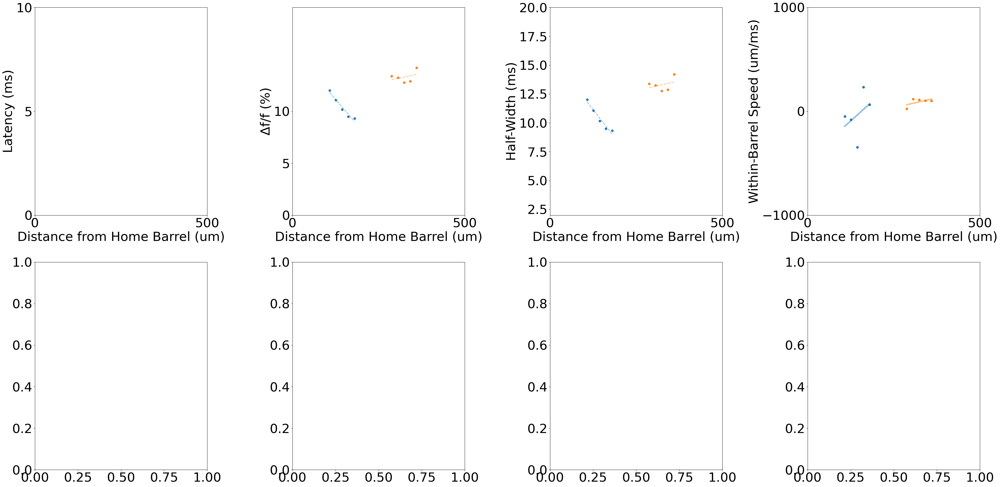

In [20]:
# show correlation of latency, halfwidth, amp, and velocity with distance from home barrel
# plot each metric vs distance from home barrel, each date/slice/recording in a different color
# with the NBQX data in markeredgecolor='black'
# fit and plot a linear regression line for each date/slice/recording

fig, ax = plt.subplots(2, 4, figsize=(40, 20))
layers = ['L2/3', 'L4']
drug = ['ACSF', 'NBQX']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        for i_reg, region in enumerate(['Home', 'Neighbor']):
            for date in ladder_df['Date'].unique():
                for slic in ladder_df['Slice'].unique():
                    for rec in ladder_df['Recording'].unique():

                        region_df = ladder_df[(ladder_df['Layer'] == layer) & 
                                                (ladder_df['drug'] == d) & 
                                                (ladder_df['resides_in_barrel'] == region) &
                                                (ladder_df['Date'] == date) &
                                                (ladder_df['Slice'] == slic) &
                                                (ladder_df['Recording'] == rec)]
                        # get rid of nans
                        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
                        region_df = region_df[region_df['latency'].notna()]
                        region_df = region_df[region_df['amp'].notna()]
                        region_df = region_df[region_df['halfwidth'].notna()]
                        region_df = region_df[region_df['instantaneous_velocity'].notna()]

                        if region_df.empty:
                            continue

                        # fit a linear regression line to the data
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['latency'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        
                        # plot the data and the line
                        color = 'tab:blue' if region == 'Home' else 'tab:orange'
                        edgecolors= "black" if d == 'NBQX' else None
                        
                        ax[j][0].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['latency'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                        
                        ax[j][0].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)

                        # now do the same for amp
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['amp'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept

                        ax[j][1].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['amp'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][1].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # now do the same for halfwidth
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['halfwidth'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][2].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['halfwidth'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')

                        ax[j][2].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        
                        # now do the same for velocity
                        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                                    region_df['instantaneous_velocity'])
                        x = np.linspace(region_df['Dist_from_home_barrel'].min(),
                                        region_df['Dist_from_home_barrel'].max(), 100)
                        y = slope * x + intercept
                        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                                        region_df['instantaneous_velocity'], 
                                        label=d, 
                                        color=color,
                                        edgecolors=edgecolors,
                                        marker='o')
                                        
                        #ax[j][3].plot(x, y, color=color, linestyle='--', linewidth=2, alpha=0.5)
                        # print the slope and r^2 value for each metric
                        '''print(layer, region, d, 'Latency', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Amp', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Halfwidth', str(slope)[:5], str(r_value**2)[:5])
                        print(layer, region, d, 'Velocity', str(slope)[:5], str(r_value**2)[:5])
                        # print the p-value for each metric
                        print(layer, region, d, 'Latency', str(p_value)[:5])
                        print(layer, region, d, 'Amp', str(p_value)[:5])
                        print(layer, region, d, 'Halfwidth', str(p_value)[:5])
                        print(layer, region, d, 'Velocity', str(p_value)[:5])
                        # print the std_err for each metric
                        print(layer, region, d, 'Latency', str(std_err)[:5])
                        print(layer, region, d, 'Amp', str(std_err)[:5])
                        print(layer, region, d, 'Halfwidth', str(std_err)[:5])
                        print(layer, region, d, 'Velocity', str(std_err)[:5])
                        # print the number of points for each metric
                        print(layer, region, d, 'Latency', len(region_df['latency']))
                        print(layer, region, d, 'Amp', len(region_df['amp']))
                        print(layer, region, d, 'Halfwidth', len(region_df['halfwidth']))
                        print(layer, region, d, 'Velocity', len(region_df['instantaneous_velocity']))
                        # print the mean and std of each metric
                        print(layer, region, d, 'Latency', str(np.mean(region_df['latency']))[:5], str(np.std(region_df['latency']))[:5])
                        print(layer, region, d, 'Amp', str(np.mean(region_df['amp']))[:5], str(np.std(region_df['amp']))[:5])
                        print(layer, region, d, 'Halfwidth', str(np.mean(region_df['halfwidth']))[:5], str(np.std(region_df['halfwidth']))[:5])
                        print(layer, region, d, 'Velocity', str(np.mean(region_df['instantaneous_velocity']))[:5], str(np.std(region_df['instantaneous_velocity']))[:5])
                        '''
                        # save plot to file
                        #ax[0].set_title('Latency vs Distance from Home Barrel')
                        #ax[1].set_title('Amp vs Distance from Home Barrel')
                        #ax[2].set_title('Halfwidth vs Distance from Home Barrel')
                        #ax[3].set_title('Velocity vs Distance from Home Barrel')
                        ax[j][0].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][1].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][2].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][3].set_xlabel('Distance from Home Barrel (um)')
                        ax[j][0].set_ylabel('Latency (ms)')
                        ax[j][1].set_ylabel('Δf/f (%)')
                        ax[j][2].set_ylabel('Half-Width (ms)')
                        ax[j][3].set_ylabel('Within-Barrel Speed (um/ms)')
                        ax[j][0].set_ylim(0, 8)
                        ax[j][1].set_ylim(0, 20)
                        ax[j][2].set_ylim(2, 20)
                        ax[j][3].set_ylim(-1000, 1000)
                        ax[j][0].set_xlim(0, 500)
                        ax[j][1].set_xlim(0, 500)
                        ax[j][2].set_xlim(0, 500)
                        ax[j][3].set_xlim(0, 500)
                        ax[j][0].set_xticks([0, 500])
                        ax[j][1].set_xticks([0, 500])
                        ax[j][2].set_xticks([0, 500])
                        ax[j][3].set_xticks([0, 500])
                        ax[j][0].set_xticklabels([ 0, 500])
                        ax[j][1].set_xticklabels([ 0, 500])   
                        ax[j][2].set_xticklabels([ 0, 500])
                        ax[j][3].set_xticklabels([ 0, 500])
                        ax[j][0].set_yticks([0, 5, 10])
                        ax[j][1].set_yticks([0, 5, 10])
                        ax[j][3].set_yticks([-1000, 0, 1000])
                        ax[j][0].set_yticklabels([0, 5, 10])

# Is there overall correlation between velocity and distance from home barrel?
# fit a single linear regression line to all data points (drug, region-specific)
for i_reg, region in enumerate(['Home', 'Neighbor']):
    for j, d in enumerate(drug):
        region_df = ladder_df[(ladder_df['drug'] == d) & 
                                (ladder_df['resides_in_barrel'] == region)]
        # get rid of nans
        region_df = region_df[region_df['Dist_from_home_barrel'].notna()]
        region_df = region_df[region_df['latency'].notna()]
        region_df = region_df[region_df['amp'].notna()]
        region_df = region_df[region_df['halfwidth'].notna()]
        region_df = region_df[region_df['instantaneous_velocity'].notna()]

        if region_df.empty:
            continue

        # fit a linear regression line to the data
        slope, intercept, r_value, p_value, std_err = linregress(region_df['Dist_from_home_barrel'], 
                                                                    region_df['instantaneous_velocity'])
        x = np.linspace(region_df['Dist_from_home_barrel'].min(), 
                        region_df['Dist_from_home_barrel'].max(), 100)
        y = slope * x + intercept
        
        # plot the data and the line
        color = 'tab:blue' if region == 'Home' else 'tab:orange'
        edgecolors= "black" if d == 'NBQX' else None
        
        ax[j][3].scatter(region_df['Dist_from_home_barrel'], 
                        region_df['instantaneous_velocity'], 
                        label=d, 
                        color=color,
                        edgecolors=edgecolors,
                        marker='o')
        
        ax[j][3].plot(x, y, color=color, linewidth=4, alpha=0.5)


plt.tight_layout()          
plt.savefig(output_fig_dir + '/' + layer + '_' + region + '_' + d + '_latency_vs_distance.png')
plt.show()


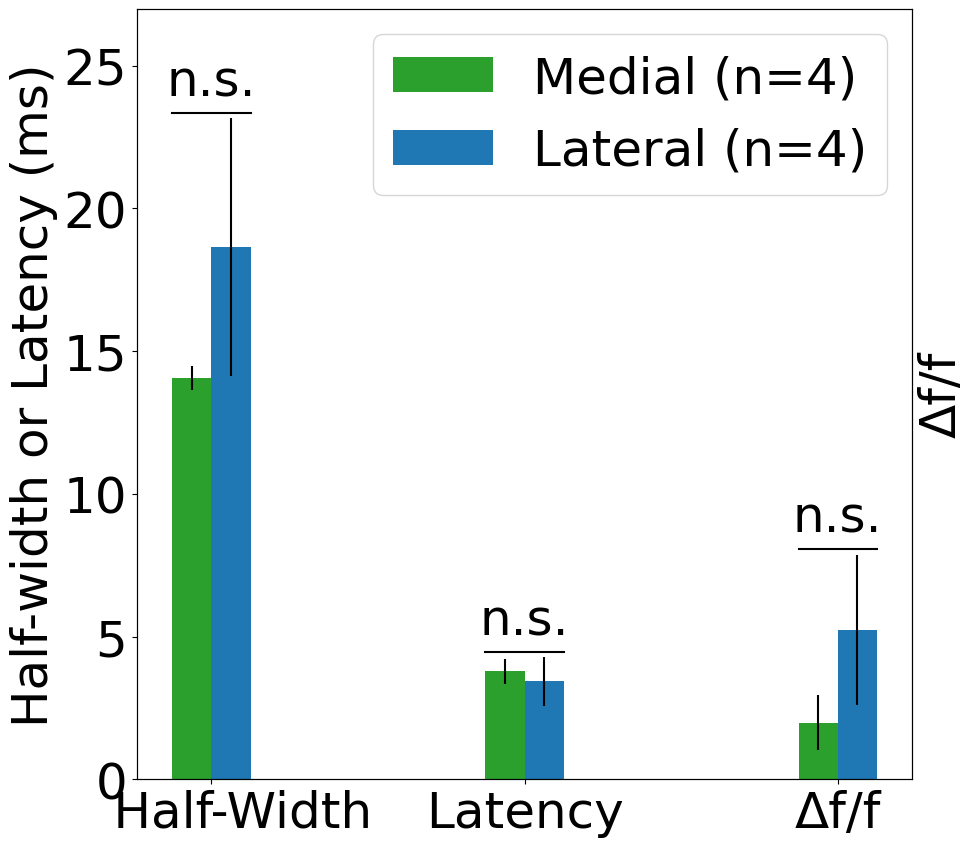

In [21]:
# using the 'Medial/Lateral' column in file export_summar_hw_latency_amp.csv, compare medial and lateral neighbor barrels
# for each layer and drug
# read in hw/lat/amp data
hw_lat_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/' + 'export_summary_hw_latency_amp.csv'
hw_lat_df = pd.read_csv(hw_lat_data)
hw_lat_df['latency'] -= 48.6

# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_df = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                (hw_lat_df['drug'] == 'ACSF') & 
                                (hw_lat_df['ROI'] > 1) & 
                                (hw_lat_df['Medial/Lateral'] == direction)]
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_df[metric]), 
                        yerr=sem(direction_df[metric]), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=4)', 'Lateral (n=4)'], loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med = hw_lat_df[(hw_lat_df['Layer'] == 'L4') & 
                                        (hw_lat_df['drug'] == 'ACSF') & 
                                        (hw_lat_df['ROI'] > 1) & 
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()

In [22]:
# for each row in ladder_df, populate drug, layer, and Medial/Lateral columns by looking it up in hw_lat_df
for i, row in ladder_df.iterrows():
    date = row['Date']
    slic = row['Slice']
    rec = row['Recording']
    loc = row['Location']
    ladder_roi = row['ROI']
    x_center = row['X_Center']
    y_center = row['Y_Center']

    # to know which barrel roi this is in, find the closest roi in the hw_lat_df

    hw_lat_rows = hw_lat_df[(hw_lat_df['Date'] == date) &
                            (hw_lat_df['Slice'] == slic) &
                            (hw_lat_df['Location'] == loc) &
                            (hw_lat_df['Recording'] == rec)]
            
    
    if hw_lat_rows.empty:
        print('No data found for ', date, slic, rec, loc)
        continue

    # go through the matched rows, pull x_center and y_center, and calculate the distance to the ladder roi
    min_dist = np.Inf
    min_dist_row = None
    for j, hw_lat_row in hw_lat_rows.iterrows():
        dist = np.sqrt((x_center - hw_lat_row['X_Center'])**2 + (y_center - hw_lat_row['Y_Center'])**2)
        if dist < min_dist:
            min_dist = dist
            min_dist_row = hw_lat_row
    if min_dist_row is None:
        print('No data found for ', date, slic, rec, loc)
        continue
    # populate the drug, layer, and Medial/Lateral columns in ladder_df from the min_dist_row
    ladder_df.loc[i, 'drug'] = min_dist_row['drug']
    ladder_df.loc[i, 'Layer'] = min_dist_row['Layer']
    ladder_df.loc[i, 'Medial/Lateral'] = min_dist_row['Medial/Lateral']

print(ladder_df['Medial/Lateral'])

ladder_df

No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 1 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6/26/2024 1 4 1
No data found for  6

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,...,drug,Layer,Coronal/Sagittal,IPI,Is_Pulse_2,Dist_from_home_barrel,resides_in_barrel,instantaneous_velocity,ROI file,Medial/Lateral
0,1,0.408552,19.7128,3.9030,16.65070,272.917570,34.263889,10.236111,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,NaN,368.804275,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
1,2,0.462050,27.5393,3.9159,14.44350,256.320112,36.851351,12.054054,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,NaN,350.406813,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
2,3,0.441868,28.2700,3.8743,13.63680,239.774894,38.767123,14.273973,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,NaN,332.813666,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
3,4,0.466602,22.1134,3.8636,13.22210,223.293529,40.816901,16.338028,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,NaN,315.415427,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
4,5,0.526346,26.8669,3.7651,10.10290,206.891276,43.818182,17.766234,1_roi_output__ladder_,6/26/2024,...,ACSF,L2/3,NaN,NaN,NaN,297.374375,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9168,21,0.392233,NaN,178.7470,5.93887,309.974193,35.278481,8.721519,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,82.732005,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9169,22,0.710792,NaN,177.4870,3.35339,339.835254,33.571429,6.311688,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,67.432150,Neighbor,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9170,23,1.011800,NaN,178.4610,28.19760,344.308002,29.714286,5.190476,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,43.451046,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN
9171,24,1.046040,NaN,178.1750,2.39320,365.754016,26.437500,3.708333,3_rois_output__ladder_ pulse1,1/15/2025,...,ACSF,L4,Sagittal,120.0,True,21.879303,None,NaN,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,NaN


c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_asarray.py:102: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
c:\Users\jjudge3\AppData\Local\anaconda3\envs\TSM-to-ZDA\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dty

[] 
 []
p = nan


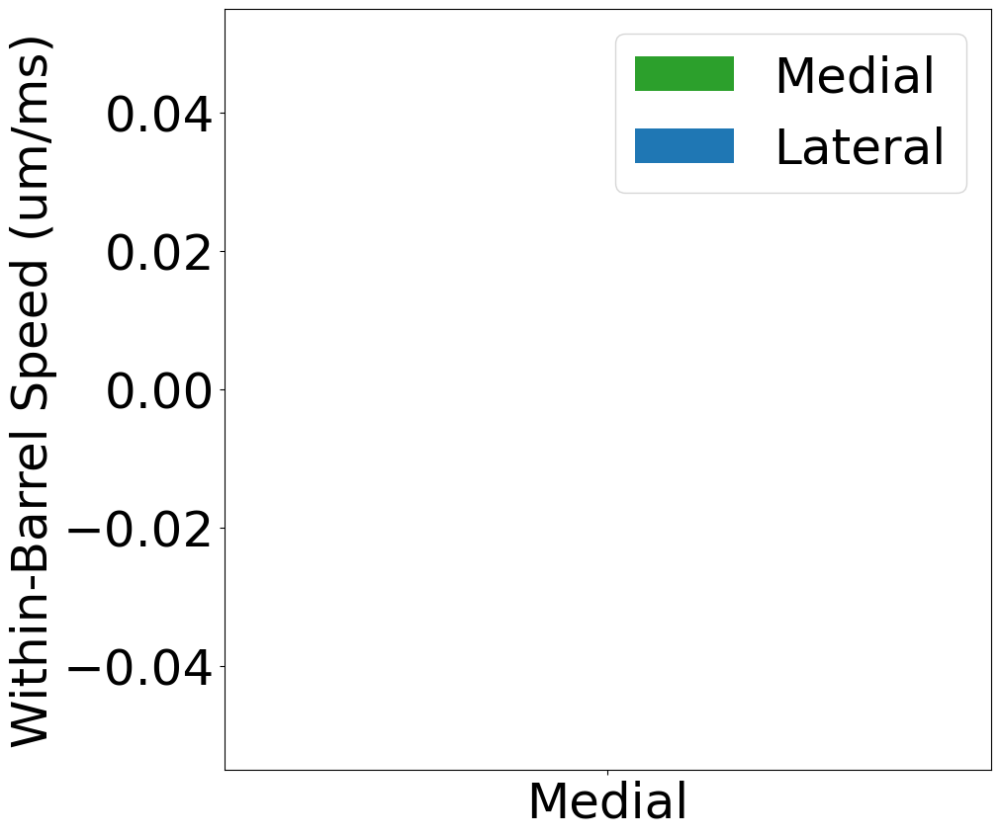

In [23]:
# compare medial vs lateral: speed



fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot speeds for ladder_df, split into L2/3 and L4, and only for neighbor barrels (ROI > 1) in ACSF
directions = ['Medial', 'Lateral']
handles = []

for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    direction_df = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == direction)]
    # plot the data
    l1 = ax.bar(i, 
                    np.mean(np.abs(direction_df["instantaneous_velocity"])), 
                    yerr=sem(np.abs(direction_df["instantaneous_velocity"])), 
                    width=.125,
                    color=color, label=direction)
    handles.append(l1)

# legend: Lateral in blue, Medial in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial', 'Lateral'], loc='upper right')

ax.set_ylabel('Within-Barrel Speed (um/ms)')
ax.set_xticks([0, 1])
ax.set_xticklabels(['Medial', 'Lateral'])

# significance testing Medial vs Lateral
med = ladder_df[(ladder_df['Layer'] == 'L4') & 
                                #(ladder_df['drug'] == 'ACSF') & 
                                (ladder_df['ROI'] > 1) & 
                                (ladder_df['Medial/Lateral'] == 'Medial')]["instantaneous_velocity"]

lat = ladder_df[(ladder_df['Layer'] == 'L4') &
                                #(ladder_df['drug'] == 'ACSF') &
                                (ladder_df['ROI'] > 1) &
                                (ladder_df['Medial/Lateral'] == 'Lateral')]["instantaneous_velocity"]

# filter out nans from med and lat
med = [s for s in list(np.abs(med)) if not np.isnan(s)]
lat = [s for s in list(np.abs(lat)) if not np.isnan(s)]

print(list(med), "\n", list(lat))

t_stat, p_val = ttest_ind(med, lat, alternative='greater', equal_var=False)
print("p =", p_val)

# errorbars
ax.errorbar(0, np.mean(med), yerr=sem(med), fmt='', color='black')
ax.errorbar(1, np.mean(lat), yerr=sem(lat), fmt='', color='black')


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/velocity_medial_lateral.png')
plt.show()


In [24]:
# now let's repeat the same analysis for L2/3 readout
# read in the supragranular data
supra_dir = "C:/Users/jjudge3/Desktop/Data/crossing_PPR/export_summary_supragranular.csv"
supra_df = pd.read_csv(supra_dir)
supra_df['latency'] -= 48.6

# reformat Dat to match the format of the hw/lat/amp data
supra_df['Date'] = supra_df['Date'].apply(lambda x: x.replace('-', '/'))
# convert from m/d/yy to m/d/yyyy
supra_df['Date'] = supra_df['Date'].apply(lambda x: x[:-2] + '20' + x[-2:])

# merge with crossing_data to get the 'Medial/Lateral', 'Layer', and 'drug' columns. 
# append _supra to column names in the supra_df
hw_lat_df_metadata = hw_lat_df[['Date', 'Slice', 'Recording', 'Location', 'Layer', 'drug', 'Medial/Lateral']]
supra_df = supra_df.merge(hw_lat_df_metadata, on=['Date', 'Slice', 'Location', 'Recording'])

supra_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Layer,drug,Medial/Lateral
0,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
1,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
2,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
3,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
4,1,0.911748,19.74610,1.8831,8.93258,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123,2,4.646450,21.31610,3.9587,18.61850,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,Lateral
124,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN
125,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,Lateral
126,2,2.450560,8.86932,3.3752,11.95010,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN


In [25]:
# remove duplicate rows from supra_df
supra_df = supra_df.drop_duplicates(subset=['Date', 'Slice', 'Recording', 'Location', 'ROI', 'drug', 'Layer' ])
supra_df

,ROI,amp,snr,latency,halfwidth,Stim_Distance,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,Layer,drug,Medial/Lateral
0,1,0.457087,32.53260,1.7484,10.68250,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
2,2,0.274570,10.66380,2.3245,11.36730,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
4,1,0.911748,19.74610,1.8831,8.93258,81.608823,38.209677,49.080645,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
6,2,0.484146,7.40288,3.4801,8.44907,165.517371,21.765217,36.182609,1_roi_supragranular,6/26/2024,1,1,4,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,NBQX,NaN
8,1,3.270350,33.91330,0.9119,11.40020,80.498447,62.298578,24.469194,3_rois_supragranular,7/1/2024,3,2,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/Ann...,L2/3,ACSF,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,2,2.384470,14.94280,5.0873,7.64868,181.394597,19.813559,11.943503,1_rois_supragranular,12/20/2024,1,3,2,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L2/3,NBQX,NaN
120,1,9.195530,33.09190,3.1583,11.94090,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,NaN
122,2,4.646450,21.31610,3.9587,18.61850,205.406913,76.285714,40.857143,2_rois_supragranular,12/20/2024,2,1,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,ACSF,NaN
124,1,4.884740,22.38250,3.6901,7.39750,158.858428,67.032258,59.658065,2_rois_supragranular,12/20/2024,2,3,1,C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23...,L4,NBQX,NaN


x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ±

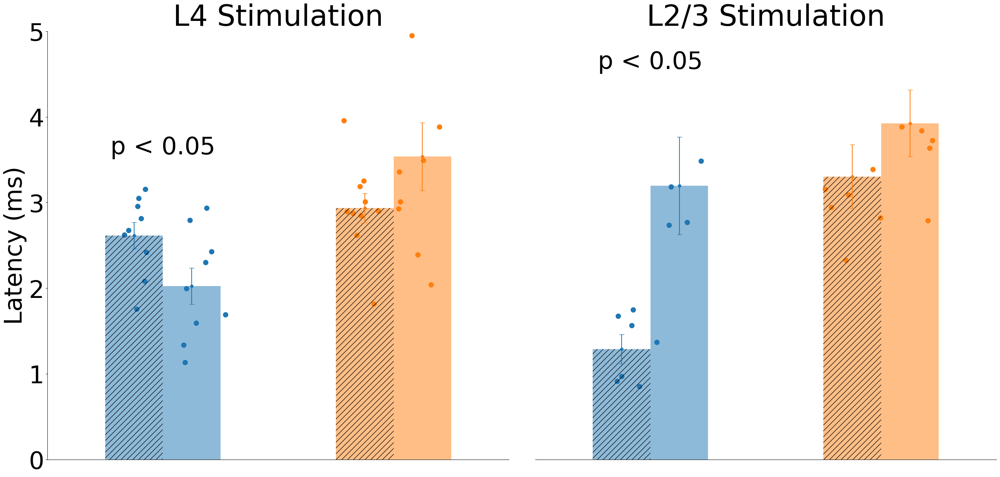


ANOVA results for latency in L4 stim:
             sum_sq    df       F    PR(>F)
C(group)  10.804100   3.0  6.2817  0.001715
Residual  18.919258  33.0     NaN       NaN

ANOVA results for latency in L2/3 stim:
             sum_sq    df         F    PR(>F)
C(group)  23.549762   3.0  7.876188  0.001043
Residual  20.929963  21.0       NaN       NaN


In [26]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

anova_groups = {'L4 stim': [], 'L2/3 stim': []}

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['latency'] #,'halfwidth',  'amp']
metric_labels = ['Latency (ms)', ] #'Half-Width (ms)', 'Δf/f']
handles = ['', '', '', '']
more_handles = []
for i, layer in enumerate(layers):

    # label the subplot with the layer ("L4 Stimulation" or "L2/3 Stimulation")
    ax[i].set_title(layer + ' Stimulation')
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        for k, home in enumerate(home_neighbor):
            region_dfs = []
            for m, region in enumerate(regions):
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if region == 'Supragranular' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                x_location_bar = 1/16 * m - 1/32 + k/4 - 1/8
                print("x_location_bar =", x_location_bar)
                for l, metric in enumerate(metrics):
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric]), 
                                    yerr=sem(region_df[metric]), 
                                    width=.125 / 2,
                                    color=color, label='L4' if region == 'Granular' else 'Supragranular', hatch=hatch, alpha=0.5)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric]),
                                yerr=sem(region_df[metric]),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric]))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric],
                                    color=color, s=100, marker='o')
                    ax[i].set_xticks([-1/8, 1/8 ])
                    ax[i].set_xticklabels(['Home', 'Neighbor'])
                    ax[i].set_xticks([])
                    ax[0].set_ylabel('Latency (ms)' )
                    ax[i].set_xlim(-0.25, 0.25 + 0.5 * (len(metrics)-1))

                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)-1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)
                    ax[i].spines['right'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)
                    ax[1].set_yticks([])

                    if d == 'ACSF':
                        if region == 'Supragranular':
                            handles[0] = h
                        else:
                            handles[1] = h
                    if region == 'Supragranular':
                        if d == 'ACSF':
                            handles[2] = h
                        else:
                            handles[3] = h
                    more_handles.append(h)

            # significance testing: home vs neighbor barrel
            for l, metric in enumerate(metrics):
                t_stat, p_val = ttest_ind(region_dfs[0][metric], region_dfs[1][metric])
                if not (metric == 'latency' and d == 'ACSF'):
                    continue
                if layer == 'L4':
                    anova_groups['L4 stim'].append(region_dfs[0][metric])
                    anova_groups['L4 stim'].append(region_dfs[1][metric])
                else:
                    anova_groups['L2/3 stim'].append(region_dfs[0][metric])
                    anova_groups['L2/3 stim'].append(region_dfs[1][metric])
                print("\nresults for " +home+ " " + metric + " in " + layer + " stim with " + d + ", L2/3 vs L4:")
                print("T=", t_stat, "p=", p_val)
                print("sample size for Supragranular barrel: ", len(region_dfs[0][metric]))
                print("sample size for Granular barrel: ", len(region_dfs[1][metric]))
                print("mean +/- sem for Supragranular barrel: ",
                        round(region_dfs[0][metric].mean(), 2), "±", 
                        round(sem(region_dfs[0][metric]), 2))
                print("mean +/- sem for Granular barrel: ",
                        round(region_dfs[1][metric].mean(), 2), "±", 
                        round(sem(region_dfs[1][metric]), 2))
                height = max(region_dfs[0][metric].mean() + sem(region_dfs[0][metric]), 
                                region_dfs[1][metric].mean() + sem(region_dfs[1][metric])) + 0.2
                if p_val < 0.05 and d != 'NBQX':
                    ax[i].text( k/4 - 1/8, height + .6, 'p < 0.05', ha='center', fontsize=50)
                

# legend in top left, but with only the first two labels
#ax[0].legend(handles=handles[:2] + [more_handles[5], handles[1]], labels=['L2/3 ROI', 'L4 ROI', 'Home', 'Neighbor'] + drug, loc='upper left', ncol=2)
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()

# anova over all four groups of L2/3 stim and over all four groups of L4 stim, for latency 
print("\nANOVA results for latency in L4 stim:")
# use anova_lm
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L4 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L4 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)
print("\nANOVA results for latency in L2/3 stim:")
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L2/3 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L2/3 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

x_location_bar = -0.15625
x_location_bar = 0.09375

results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = -0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = 0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ± 

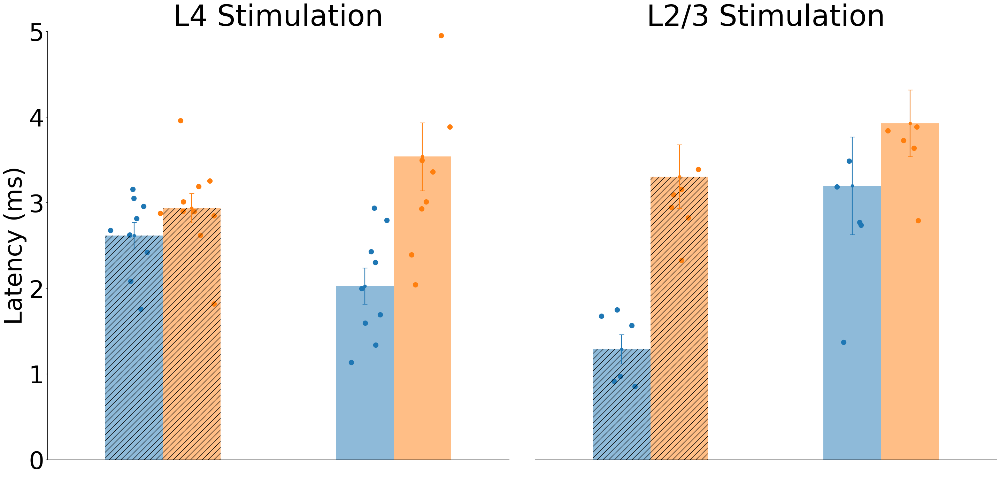


ANOVA results for latency in L4 stim:
             sum_sq    df       F    PR(>F)
C(group)  10.804100   3.0  6.2817  0.001715
Residual  18.919258  33.0     NaN       NaN

ANOVA results for latency in L2/3 stim:
             sum_sq    df         F    PR(>F)
C(group)  23.549762   3.0  7.876188  0.001043
Residual  20.929963  21.0       NaN       NaN


In [27]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

anova_groups = {'L4 stim': [], 'L2/3 stim': []}

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['latency'] #,'halfwidth',  'amp']
metric_labels = ['Latency (ms)', ] #'Half-Width (ms)', 'Δf/f']
handles = ['', '', '', '']
more_handles = []
for i, layer in enumerate(layers):

    # label the subplot with the layer ("L4 Stimulation" or "L2/3 Stimulation")
    ax[i].set_title(layer + ' Stimulation')
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        for m, home in enumerate(home_neighbor):
            region_dfs = []
            for k, region in enumerate(regions):
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if region == 'Supragranular' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                x_location_bar = 1/16 * m - 1/32 + k/4 - 1/8
                print("x_location_bar =", x_location_bar)
                for l, metric in enumerate(metrics):
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric]), 
                                    yerr=sem(region_df[metric]), 
                                    width=.125 / 2,
                                    color=color, label='L4' if region == 'Granular' else 'Supragranular', hatch=hatch, alpha=0.5)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric]),
                                yerr=sem(region_df[metric]),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric]))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric],
                                    color=color, s=100, marker='o')
                    ax[i].set_xticks([-1/8, 1/8 ])
                    ax[i].set_xticklabels(['Home', 'Neighbor'])
                    ax[i].set_xticks([])
                    ax[0].set_ylabel('Latency (ms)' )
                    ax[i].set_xlim(-0.25, 0.25 + 0.5 * (len(metrics)-1))

                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)-1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)
                    ax[i].spines['right'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)
                    ax[1].set_yticks([])

                    if d == 'ACSF':
                        if region == 'Supragranular':
                            handles[0] = h
                        else:
                            handles[1] = h
                    if region == 'Supragranular':
                        if d == 'ACSF':
                            handles[2] = h
                        else:
                            handles[3] = h
                    more_handles.append(h)

            # significance testing: home vs neighbor barrel
            for l, metric in enumerate(metrics):
                t_stat, p_val = ttest_ind(region_dfs[0][metric], region_dfs[1][metric])
                if not (metric == 'latency' and d == 'ACSF'):
                    continue
                if layer == 'L4':
                    anova_groups['L4 stim'].append(region_dfs[0][metric])
                    anova_groups['L4 stim'].append(region_dfs[1][metric])
                else:
                    anova_groups['L2/3 stim'].append(region_dfs[0][metric])
                    anova_groups['L2/3 stim'].append(region_dfs[1][metric])
                print("\nresults for " +home+ " " + metric + " in " + layer + " stim with " + d + ", L2/3 vs L4:")
                print("T=", t_stat, "p=", p_val)
                print("sample size for Supragranular barrel: ", len(region_dfs[0][metric]))
                print("sample size for Granular barrel: ", len(region_dfs[1][metric]))
                print("mean +/- sem for Supragranular barrel: ",
                        round(region_dfs[0][metric].mean(), 2), "±", 
                        round(sem(region_dfs[0][metric]), 2))
                print("mean +/- sem for Granular barrel: ",
                        round(region_dfs[1][metric].mean(), 2), "±", 
                        round(sem(region_dfs[1][metric]), 2))
                height = max(region_dfs[0][metric].mean() + sem(region_dfs[0][metric]), 
                                region_dfs[1][metric].mean() + sem(region_dfs[1][metric])) + 0.2
                #if p_val < 0.05 and d != 'NBQX':
                #    ax[i].text( k/4 - 1/8, height + .6, 'p < 0.05', ha='center', fontsize=50)
                

# legend in top left, but with only the first two labels
#ax[0].legend(handles=handles[:2] + [more_handles[5], handles[1]], labels=['L2/3 ROI', 'L4 ROI', 'Home', 'Neighbor'] + drug, loc='upper left', ncol=2)
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()

# anova over all four groups of L2/3 stim and over all four groups of L4 stim, for latency 
print("\nANOVA results for latency in L4 stim:")
# use anova_lm
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L4 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L4 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)
print("\nANOVA results for latency in L2/3 stim:")
model = ols('value ~ C(group)', data=pd.DataFrame({
    'value': np.concatenate(anova_groups['L2/3 stim']),
    'group': np.repeat(['Supragranular Home', 'Granular Home', 'Supragranular Neighbor', 'Granular Neighbor'], 
                        [len(anova_groups['L2/3 stim'][i]) for i in range(4)])
})).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)


results for halfwidth with L4 stim, home versus neighbor (L4 ROIs):
T = -2.663174093401087 p = 0.012235732857539141
sample size for home barrel:  8
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  8.8 ± 0.74
mean +/- sem for neighbor barrel:  15.22 ± 2.29

results for amp with L4 stim, home versus neighbor (L4 ROIs):
T = 1.662928500704462 p = 0.06137886052224368
sample size for home barrel:  9
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  9.34 ± 2.78
mean +/- sem for neighbor barrel:  4.17 ± 1.38

results for halfwidth with L2/3 stim, home versus neighbor (L4 ROIs):
T = -1.9991353959426477 p = 0.04219503115568603
sample size for home barrel:  6
sample size for neighbor barrel:  6
mean +/- sem for home barrel:  8.07 ± 1.43
mean +/- sem for neighbor barrel:  14.59 ± 2.93

results for amp with L2/3 stim, home versus neighbor (L4 ROIs):
T = 0.4727222722461211 p = 0.32503288628359384
sample size for home barrel:  6
sample size for neighbor barrel:  6


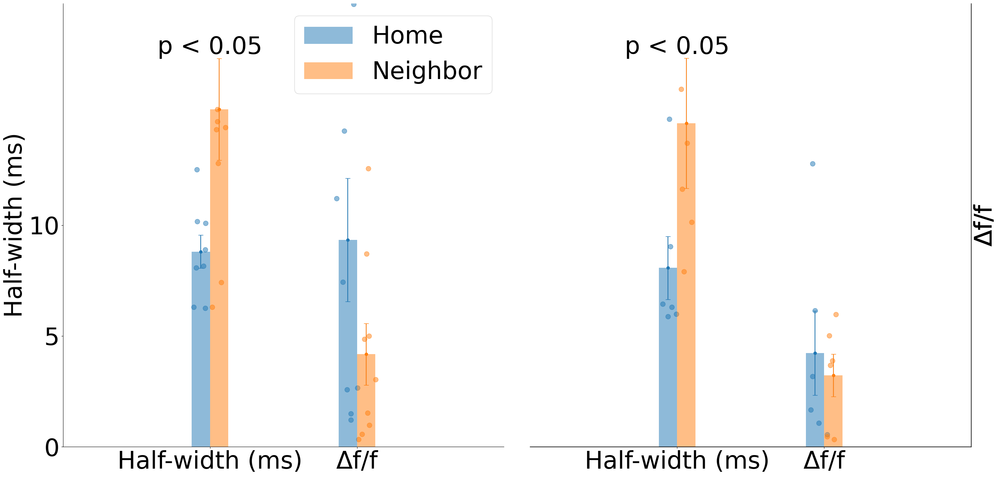

In [28]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = ['halfwidth',  'amp']
metric_labels = ['Half-width (ms)', 'Δf/f']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        region_dfs = []
        for k, home in enumerate(home_neighbor):
            
            for m, region in enumerate(regions):
                if region == 'Supragranular':
                    continue
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if d == 'NBQX' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                for l, metric in enumerate(metrics):
                    x_location_bar = l/2 + j/4 + k/16 - 1/32
                    #print("x_location_bar =", x_location_bar)
                    h = ax[i].bar(x_location_bar, 
                                    np.mean(region_df[metric].dropna()), 
                                    yerr=sem(region_df[metric].dropna()), 
                                    width=.125 / 2,
                                    color=color, label=home.capitalize(), hatch=hatch, alpha=0.5)
                    handles.append(h)

                    # add error bars
                    ax[i].errorbar(x_location_bar,
                                np.mean(region_df[metric].dropna()),
                                yerr=sem(region_df[metric].dropna()),
                                fmt='o', color=color, capsize=5)
                    # add jitter to x-axis for scatter plot
                    x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric].dropna()))
                    # plot the data
                    ax[i].scatter(x_jitter, region_df[metric].dropna(),
                                    color=color, alpha=0.5, s=100, marker='o')
                    ax[i].set_xticks([0, 0.5])
                    ax[i].set_xticklabels(metric_labels)
                    ax[0].set_ylabel('Half-width (ms)' )
                    ax[i].set_xlim(-0.5, 0.5 + 0.5 * (len(metrics)-1))
                    # label other side as Δf/f
                    ax2 = ax[1].twinx()
                    ax2.set_ylabel('Δf/f')
                    ax2.set_yticks([])
                    ax2.spines['left'].set_visible(False)
                    ax2.spines['top'].set_visible(False)
                    ax[1].set_yticks([])
                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[i].set_ylim(0, 5 + 5 * (len(metrics)+1))

                    # turn off spines
                    ax[i].spines['top'].set_visible(False)

        # significance testing: home vs neighbor barrel
        for l, metric in enumerate(metrics):
            # exclude nans from the data
            alt = 'greater' if metric == 'amp' else 'less'
            t_stat, p_val = ttest_ind(region_dfs[0][metric].dropna(), region_dfs[1][metric].dropna(), equal_var=False, alternative=alt)
            if not (d == 'ACSF'):
                continue
            print("\nresults for " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
            print('T =', t_stat, 'p =', p_val)
            print("sample size for home barrel: ", len(region_dfs[0][metric].dropna()))
            print("sample size for neighbor barrel: ", len(region_dfs[1][metric].dropna()))
            #print(region_dfs[0][metric], region_dfs[1][metric])
            print("mean +/- sem for home barrel: ",
                    round(region_dfs[0][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[0][metric].dropna()), 2))
            print("mean +/- sem for neighbor barrel: ",
                    round(region_dfs[1][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[1][metric].dropna()), 2))
            height = max(region_dfs[0][metric].dropna().mean() + sem(region_dfs[0][metric].dropna()), 
                            region_dfs[1][metric].dropna().mean() + sem(region_dfs[1][metric].dropna())) + 0.2
            if p_val < 0.05 and d != 'NBQX':
                ax[i].text(0 if metric == 'halfwidth' else 0.5, height, 'p < 0.05', ha='center', fontsize=50)
                
# spines: turn off top and right spines for both axes
ax[0].spines['right'].set_visible(False)
ax[1].spines['left'].set_visible(False)
ax[1].spines['top'].set_visible(False)
ax[0].set_yticks([0, 5, 10])


# legend in top left, but with only the first two labels
ax[0].legend(handles=[handles[0], handles[-1]], labels=['Home', 'Neighbor'] + drug, loc='upper right')
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()



results for 1-samp t-test amp with L4 stim, home versus neighbor (L4 ROIs):
T = -3.6750964981741787 p = 0.0031316364242624474
sample size for home barrel:  9
mean +/- sem for home barrel:  0.52 ± 0.13

results for amp with L4 stim, home versus neighbor (L4 ROIs):
T = 1.662928500704462 p = 0.06137886052224368
sample size for home barrel:  9
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  9.34 ± 2.78
mean +/- sem for neighbor barrel:  4.17 ± 1.38

results for halfwidth with L4 stim, home versus neighbor (L4 ROIs):
T = -2.663174093401087 p = 0.012235732857539141
sample size for home barrel:  8
sample size for neighbor barrel:  9
mean +/- sem for home barrel:  8.8 ± 0.74
mean +/- sem for neighbor barrel:  15.22 ± 2.29

results for 1-samp t-test amp with L2/3 stim, home versus neighbor (L4 ROIs):
T = -0.09360115981189322 p = 0.46453050269475454
sample size for home barrel:  6
mean +/- sem for home barrel:  0.97 ± 0.28

results for amp with L2/3 stim, home versus neighbor

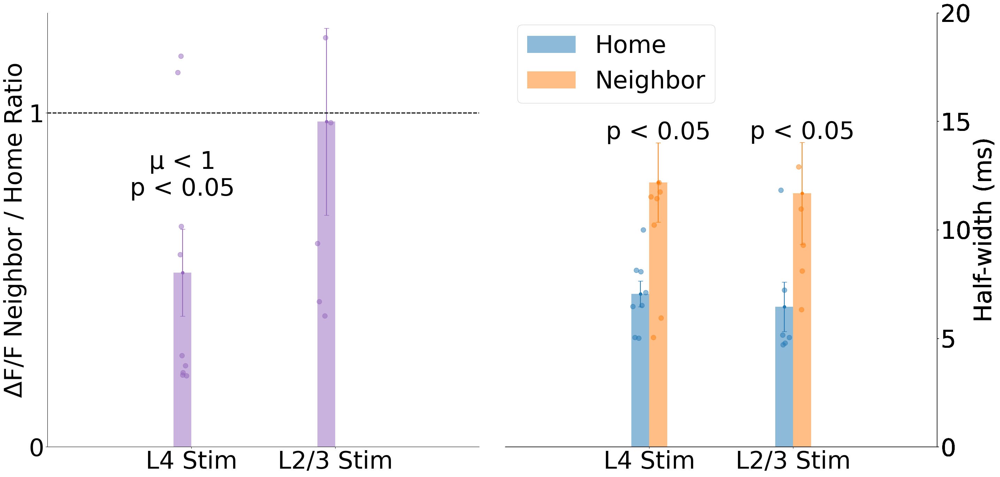

In [29]:
# compare the supra data (supra_df) to the L4 data (hw_lat_df):
#       for ACSF and NBQX, and for L2/3 and L4 stim, and for home versus neighbor
# leave out Medial/Lateral comparison for now
# do latency, half-width, amplitude, comparing supra to L4, for all four of the following plots:
#  - plot 1 home barrel in L4 stim: ACSF vs NBQX
#  - plot 2 neighbor barrel in L4 stim: ACSF vs NBQX
#  - plot 3 home barrel in L2/3 stim: ACSF vs NBQX
#  - plot 4 neighbor barrel in L2/3 stim: ACSF vs NBQX
plt.rcParams.update({'font.size': 50})
fig, ax = plt.subplots(1, 2, figsize=(30, 15))

# plot 1 home barrel in L4 stim: ACSF vs NBQX
layers = ['L4', 'L2/3']
drug = ['ACSF', 'NBQX']
home_neighbor = ['home', 'neighbor']
regions = ['Supragranular', 'Granular']
metrics = [ 'amp', 'halfwidth', ]
metric_labels = ['L4 Stim', 'L2/3 Stim']
handles = []
for i, layer in enumerate(layers):
    for j, d in enumerate(drug):
        if d == 'NBQX':
            continue
        region_dfs = []
        for k, home in enumerate(home_neighbor):
            
            for m, region in enumerate(regions):
                if region == 'Supragranular':
                    continue
                df = supra_df if region == 'Supragranular' else hw_lat_df
                hatch = '//' if d == 'NBQX' else None
                color = 'tab:blue' if home == 'home' else 'tab:orange'
                
                region_df = df[(df['Layer'] == layer) & 
                                    (df['drug'] == d)]
                if home == 'home':
                    region_df = region_df[region_df['ROI'] == 1]
                else:
                    region_df = region_df[region_df['ROI'] > 1]
                region_dfs.append(region_df)

                for l, metric in enumerate(metrics):
                    x_location_bar = i/2 + j/4 + k/16 - 1/32
                    if metric == 'amp':
                        if home == 'home':
                            # use only one bar/scatter, which is neighbor / home
                            home_neighbor_df = df[(df['Layer'] == layer) & (df['drug'] == d)]
                            home_df = home_neighbor_df[home_neighbor_df['ROI'] == 1]
                            neighbor_df = home_neighbor_df[home_neighbor_df['ROI'] > 1]
                            # element-wise division
                            home_ratio =  (np.array(neighbor_df[metric]) / np.array(home_df[metric]))#.dropna() 
                            h = ax[l].bar(x_location_bar, 
                                            np.mean(home_ratio), 
                                            yerr=sem(home_ratio), 
                                            width=.125 / 2,
                                            color='tab:purple', label=home.capitalize(), hatch=hatch, alpha=0.5)
                            handles.append(h)

                            # add error bars
                            ax[l].errorbar(x_location_bar,
                                        np.mean(home_ratio),
                                        yerr=sem(home_ratio),
                                        fmt='o', color='tab:purple', capsize=5)
                            # add jitter to x-axis for scatter plot
                            x_jitter = np.random.normal(x_location_bar, 0.015, len(home_ratio))
                            # plot the data
                            ax[l].scatter(x_jitter, home_ratio,
                                            color='tab:purple', alpha=0.5, s=100, marker='o')
                            
                            # t-test: is the ratio significantly less than 1?
                            t_stat, p_val = ttest_1samp(home_ratio, 1, alternative='less')
                            print("\nresults for 1-samp t-test " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
                            print('T =', t_stat, 'p =', p_val)
                            print("sample size for home barrel: ", len(home_ratio))
                            print("mean +/- sem for home barrel: ",
                                    round(np.mean(home_ratio), 2), "±", 
                                    round(sem(home_ratio), 2))
                            if p_val < 0.05 and d != 'NBQX':
                                ax[l].text(x_location_bar, 
                                            np.mean(home_ratio) + sem(home_ratio) + 0.1, # mu symbol: 
                                            'μ < 1\np < 0.05', ha='center', fontsize=50)
                    else:
                        
                        #print("x_location_bar =", x_location_bar)
                        h = ax[l].bar(x_location_bar, 
                                        np.mean(region_df[metric].dropna()), 
                                        yerr=sem(region_df[metric].dropna()), 
                                        width=.125 / 2,
                                        color=color, label=home.capitalize(), hatch=hatch, alpha=0.5)
                        handles.append(h)

                        # add error bars
                        ax[l].errorbar(x_location_bar,
                                    np.mean(region_df[metric].dropna()),
                                    yerr=sem(region_df[metric].dropna()),
                                    fmt='o', color=color, capsize=5)
                        # add jitter to x-axis for scatter plot
                        x_jitter = np.random.normal(x_location_bar, 0.015, len(region_df[metric].dropna()))
                        # plot the data
                        ax[l].scatter(x_jitter, region_df[metric].dropna(),
                                        color=color, alpha=0.5, s=100, marker='o')
                    ax[l].set_xticks([0, 0.5])
                    ax[l].set_xticklabels(metric_labels)
                    ax[0].set_ylabel('ΔF/F Neighbor / Home Ratio' )
                    ax[l].set_xlim(-0.5, 0.5 + 0.5 * (len(metrics)-1))
                    # label other side as Δf/f
                    ax2 = ax[1].twinx()
                    ax2.set_ylabel('Half-width (ms)')
                    ax2.set_yticks([0,  5, 10, 15, 20])
                    ax2.spines['left'].set_visible(False)
                    ax2.spines['top'].set_visible(False)
                    ax[1].set_yticks([])
                    #ax[i][k].set_title(home + ' barrel' + ' with ' + layer + ' stim')
                    ax[1].set_ylim(0, 25)
                    ax[0].set_ylim(0, 1.3)

                    # horizontal line at 1 for amp ratio
                    ax[0].axhline(y=1, color='black', linestyle='--', linewidth=2)
                

                    # turn off spines
                    ax[l].spines['top'].set_visible(False)

        # significance testing: home vs neighbor barrel
        for l, metric in enumerate(metrics):
            # exclude nans from the data
            alt = 'greater' if metric == 'amp' else 'less'
            t_stat, p_val = ttest_ind(region_dfs[0][metric].dropna(), region_dfs[1][metric].dropna(), equal_var=False, alternative=alt)
            if not (d == 'ACSF'):
                continue
            print("\nresults for " + metric + " with " + layer + " stim, home versus neighbor (L4 ROIs):")
            print('T =', t_stat, 'p =', p_val)
            print("sample size for home barrel: ", len(region_dfs[0][metric].dropna()))
            print("sample size for neighbor barrel: ", len(region_dfs[1][metric].dropna()))
            #print(region_dfs[0][metric], region_dfs[1][metric])
            print("mean +/- sem for home barrel: ",
                    round(region_dfs[0][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[0][metric].dropna()), 2))
            print("mean +/- sem for neighbor barrel: ",
                    round(region_dfs[1][metric].dropna().mean(), 2), "±", 
                    round(sem(region_dfs[1][metric].dropna()), 2))
            height = max(region_dfs[0][metric].dropna().mean() + sem(region_dfs[0][metric].dropna()), 
                            region_dfs[1][metric].dropna().mean() + sem(region_dfs[1][metric].dropna())) + 0.2
            if p_val < 0.05 and d != 'NBQX':
                ax[l].text((x_location_bar if metric == 'halfwidth' else 0.5) , height, 'p < 0.05', ha='center', fontsize=50)
                
# spines: turn off top and right spines for both axes
ax[1].spines['left'].set_visible(False)
ax[0].spines['right'].set_visible(False)
ax[0].spines['top'].set_visible(False)
ax[0].set_yticks([0, 1])


# legend in top left, but with only the first two labels
ax[1].legend(handles=[handles[1], handles[-1]], labels=['Home', 'Neighbor'] + drug, loc='upper left')
plt.tight_layout()
plt.savefig(output_fig_dir + 'supra_vs_L4' + '_'.join(metrics) + '.png')
plt.show()


In [110]:
# compare:
# sample size for home barrel:  9
# mean +/- sem for home barrel:  0.52 ± 0.13

# to

# sample size for home barrel:  6
# mean +/- sem for home barrel:  0.97 ± 0.28

t_stat, p_val = ttest_ind_from_stats(mean1=0.52, std1=0.13*9**0.5, nobs1=9, mean2=0.97, std2=0.28*6**0.5, nobs2=6, equal_var=False, alternative='less')
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

t-statistic:  -1.4576929838814079
p-value:  0.0936171475556377


In [111]:
'''Results
results for home latency in L4 stim with ACSF, L2/3 vs L4:
T= 2.2584157744370668 p= 0.038239502971290563
sample size for Supragranular barrel:  9
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.61 ± 0.15
mean +/- sem for Granular barrel:  2.02 ± 0.21
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L4 stim with ACSF, L2/3 vs L4:
T= -1.4418794736653746 p= 0.16750568213143743
sample size for Supragranular barrel:  10
sample size for Granular barrel:  9
mean +/- sem for Supragranular barrel:  2.94 ± 0.17
mean +/- sem for Granular barrel:  3.54 ± 0.4
x_location_bar = -0.15625
x_location_bar = -0.09375

results for home latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -3.2102530263962668 p= 0.009328041035193255
sample size for Supragranular barrel:  6
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  1.29 ± 0.17
mean +/- sem for Granular barrel:  3.2 ± 0.57
x_location_bar = 0.09375
x_location_bar = 0.15625

results for neighbor latency in L2/3 stim with ACSF, L2/3 vs L4:
T= -1.1541998608953248 p= 0.27287831002932605
sample size for Supragranular barrel:  7
sample size for Granular barrel:  6
mean +/- sem for Supragranular barrel:  3.3 ± 0.37
mean +/- sem for Granular barrel:  3.93 ± 0.39
'''


print("compare granular ROIs within L2/3 stimulation")
home_L23_mean = 3.2
home_L23_std = 0.57 * np.sqrt(6)
neighbor_L23_mean = 3.93
neighbor_L23_std = 0.39 * np.sqrt(6)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L23_mean, std1=home_L23_std, nobs1=6,
                                        mean2=neighbor_L23_mean, std2=neighbor_L23_std, nobs2=6,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare granular ROIs within L4 stimulation")
home_L4_mean = 2.02
home_L4_std = 0.21 * np.sqrt(9)
neighbor_L4_mean = 3.54
neighbor_L4_std = 0.4 * np.sqrt(9)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L4_mean, std1=home_L4_std, nobs1=9,
                                        mean2=neighbor_L4_mean, std2=neighbor_L4_std, nobs2=9,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare supragranular ROIs within L2/3 stimulation")
home_L23_mean = 1.29
home_L23_std = 0.17 * np.sqrt(6)
neighbor_L23_mean = 3.3
neighbor_L23_std = 0.37 * np.sqrt(7)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L23_mean, std1=home_L23_std, nobs1=6,
                                        mean2=neighbor_L23_mean, std2=neighbor_L23_std, nobs2=6,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

print("compare supragranular ROIs within L4 stimulation")
home_L4_mean = 2.61
home_L4_std = 0.15 * np.sqrt(9)
neighbor_L4_mean = 2.94
neighbor_L4_std = 0.17 * np.sqrt(9)
t_stat, p_val = ttest_ind_from_stats(mean1=home_L4_mean, std1=home_L4_std, nobs1=9,
                                        mean2=neighbor_L4_mean, std2=neighbor_L4_std, nobs2=9,
                                        equal_var=False)
print("t-statistic: ", t_stat)
print("p-value: ", p_val)

compare granular ROIs within L2/3 stimulation
t-statistic:  -1.0569724573901356
p-value:  0.31855210909089915
compare granular ROIs within L4 stimulation
t-statistic:  -3.3645120307841854
p-value:  0.005567405364663692
compare supragranular ROIs within L2/3 stimulation
t-statistic:  -4.628135064868921
p-value:  0.0026401295617171344
compare supragranular ROIs within L4 stimulation
t-statistic:  -1.4555676015910624
p-value:  0.16514797532105127


Skipping date 6/26/2024
Skipping date 7/1/2024
Skipping date 7/15/2024
Skipping date 7/17/2024
Skipping date 11/6/2024
Skipping date 12/9/2024
Skipping date 12/11/2024
Skipping date 10/23/2024
Skipping date 10/29/2024
Skipping date 12/18/2024
Saved figure to P:/John/crossing-paper/input/12-20-2024_1_3_1.png


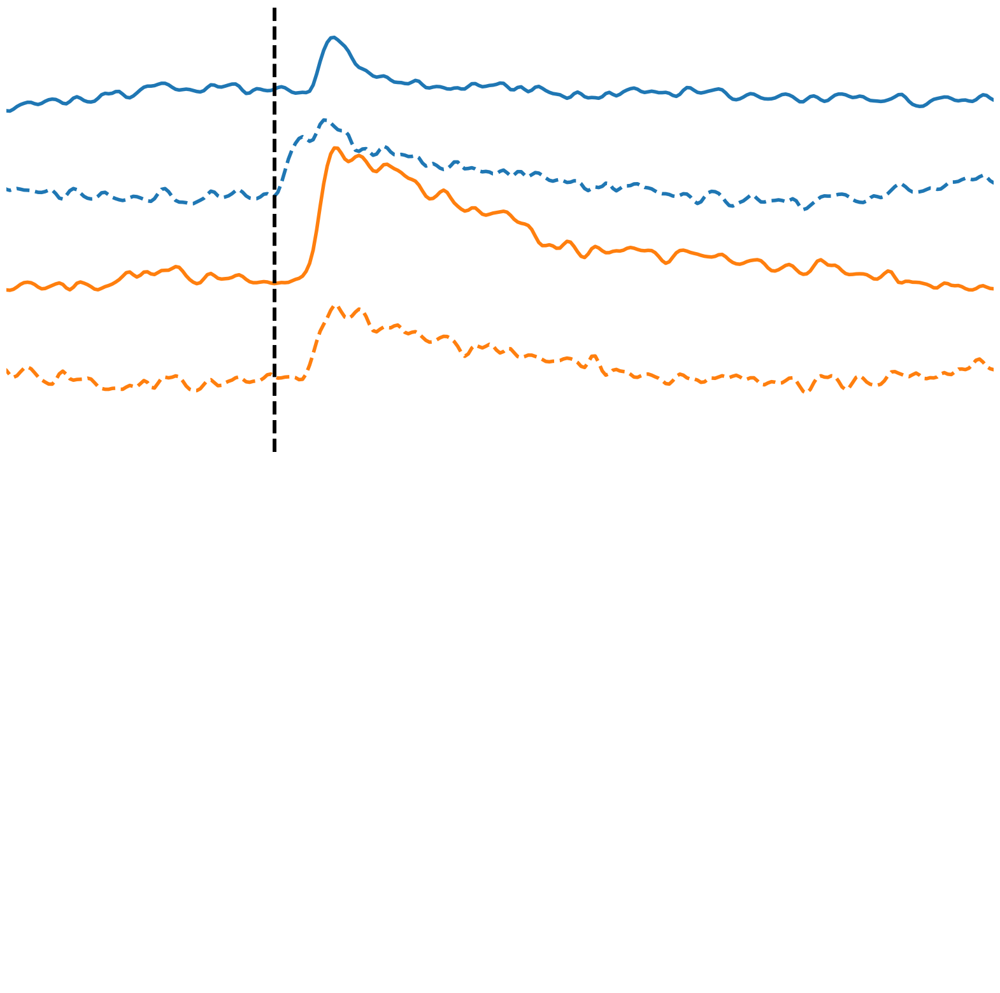

Saved figure to P:/John/crossing-paper/input/12-20-2024_1_3_2.png


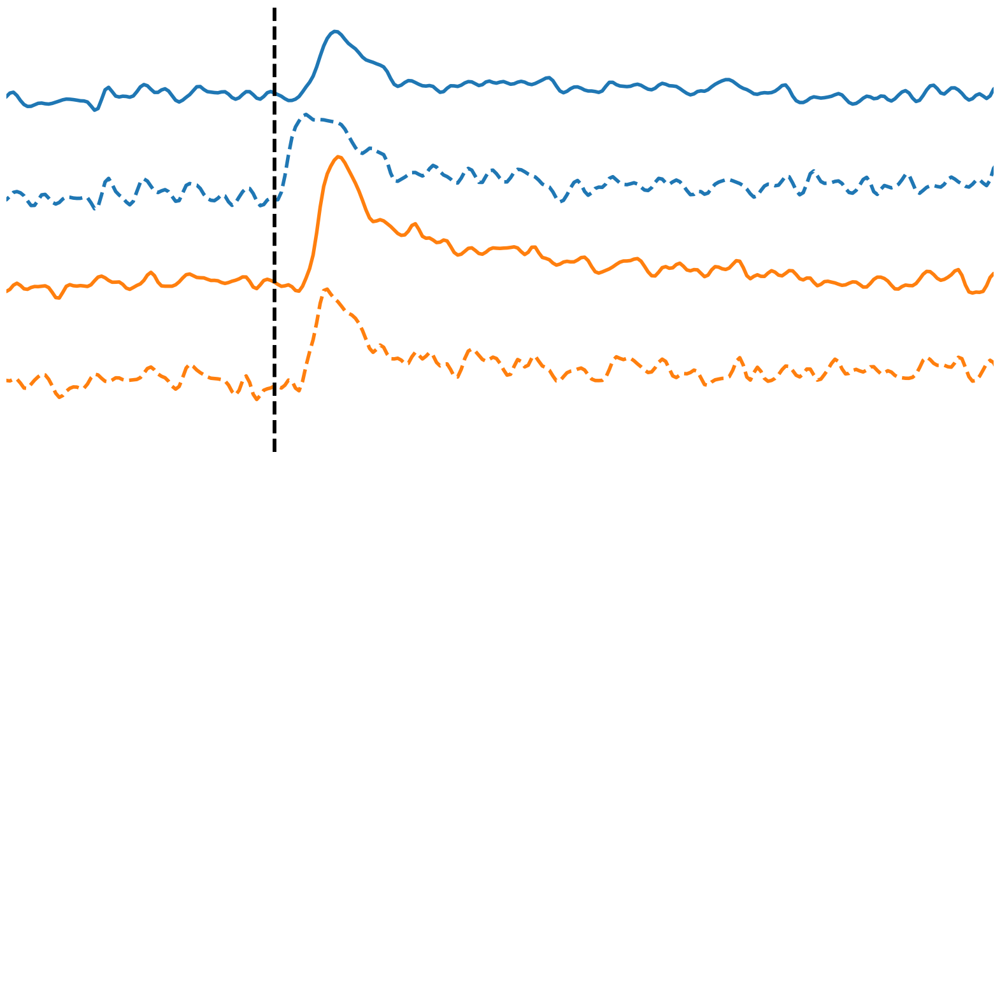

Saved figure to P:/John/crossing-paper/input/12-20-2024_2_1_1.png


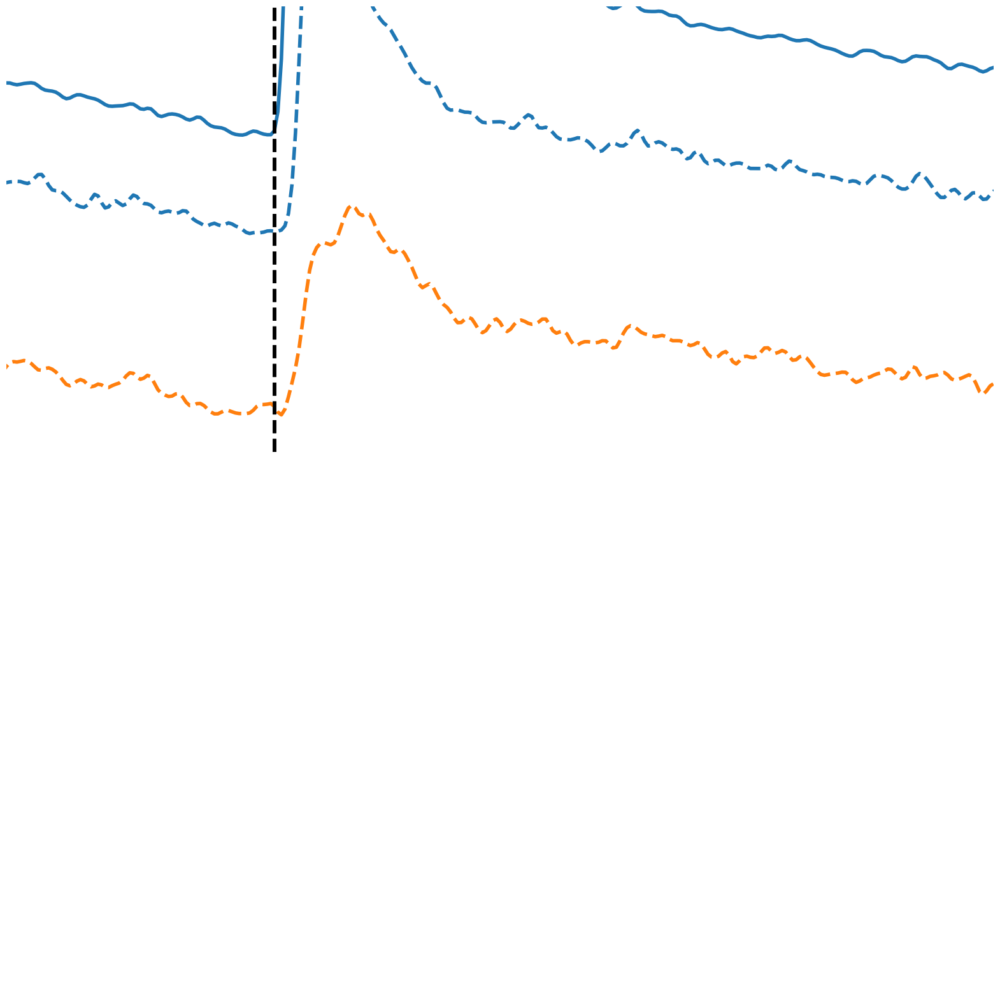

Saved figure to P:/John/crossing-paper/input/12-20-2024_2_3_1.png


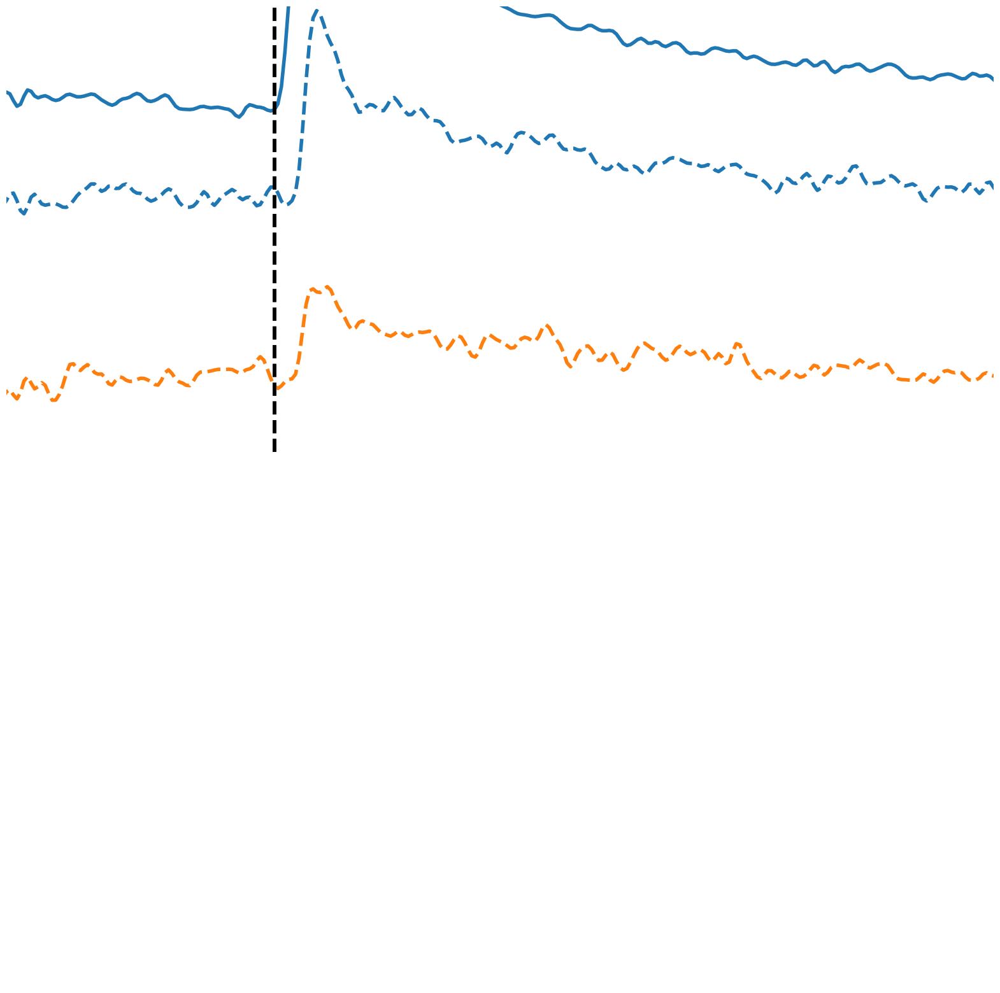

In [112]:
# compare supragranular traces to granular (L4) traces.
# for each layer and drug, compare supragranular to granular for home and neighbor barrels, plotting them in the same plot.
# matplotlib font size 20 rcParams['font.size'] = 20
plt.rcParams['font.size'] = 30

for date in supra_df['Date'].unique():
    date_df = supra_df[supra_df['Date'] == date]
    if not date == '12/20/2024': # C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/L4_NBQX_2/12-18-24/selected_zda
        print('Skipping date ' + date)
        continue
    for slic in date_df['Slice'].unique():
        slic_df = date_df[date_df['Slice'] == slic]
        for loc in slic_df['Location'].unique():
            loc_df = slic_df[slic_df['Location'] == loc]
            for rec in loc_df['Recording'].unique():
                rec_df = loc_df[loc_df['Recording'] == rec]

                # get the layer and drug
                layer = rec_df['Layer'].values[0]
                drug = rec_df['drug'].values[0]

                # get the trace file
                supra_trace = rec_df['trace']
                # read in the trace
                supra_trace = read_dat_trace_file(supra_trace.values[0])

                # get the granular trace
                granular_df = hw_lat_df[(hw_lat_df['Date'] == date) &
                                        (hw_lat_df['Slice'] == slic) &
                                        (hw_lat_df['Location'] == loc) &
                                        (hw_lat_df['Recording'] == rec)]
                if granular_df.empty:
                    continue
                granular_trace_file = granular_df['trace']
                if 'amp_array' in granular_trace_file.values[0]:
                    granular_trace_file.values[0] = granular_trace_file.values[0].replace('amp_array', 'trace')
                try:
                    granular_trace = read_dat_trace_file(granular_trace_file.values[0])
                except FileNotFoundError:

                    print('File not found for ' + granular_trace.values[0])
                    continue

                # plot the traces
                fig, ax = plt.subplots(2, 1, figsize=(20, 20))
                cols = supra_trace.columns
                if len(granular_trace.columns) < len(cols):
                    cols = granular_trace.columns

                spacing = 2.5 # for 12/20
                #spacing = 1 # for 12/18
                for i, roi in enumerate(granular_trace.columns):
                    if roi == 'Pt' or roi == 'ROI2':
                        continue
                    t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    i_plot = 0 if roi == "ROI1" else 1
                    color = 'tab:blue' if roi == "ROI1" else 'tab:orange'
                    dashed = '-'
                    ax[0].plot(t, granular_trace[roi] - i_plot * spacing * 2, color=color, linestyle=dashed, linewidth=4)
                    #base += granular_trace[roi].max() + 0.1
                for i, roi in enumerate(supra_trace.columns):
                    if roi == 'Pt':
                        continue
                    try:
                        t = np.arange(0, len(granular_trace[roi]) * 0.5, 0.5)
                    except KeyError:
                        print('KeyError for ' + roi + ' in ' + date + ' ' + str(slic) + ' ' + str(loc) + ' ' + str(rec))
                        print("available keys: ", granular_trace.columns, 'for filename' + granular_trace_file.values[0])
                        continue
                    i_plot = 0 if roi == "ROI1" else 1
                    color = 'tab:blue' if roi == "ROI1" else 'tab:orange'
                    dashed = '--'
                    ax[0].plot(np.arange(0, len(supra_trace[roi]) * 0.5, 0.5), supra_trace[roi] - spacing - i_plot * spacing * 2, color=color, linewidth=4, linestyle=dashed)
                    #base += supra_trace[roi].max() + 0.1
                        
                    #ax[0].legend(loc='upper right', labels=['L4 ROI', 'L2/3 ROI'])
                    # label date, slice, loc, rec, layer, drug
                    #ax[0].set_title('Date: ' + date + '   Layer: ' + layer + '   Drug: ' + drug)
                    #ax[0].set_ylabel('Δf/f')
                    #ax[1].set_ylabel('Δf/f')
                    ax[0].set_xticks([])
                    ax[1].set_xticks([])
                    ax[0].set_yticks([])
                    ax[1].set_yticks([])
                    ax[0].set_xlim(10, 150)
                    ax[1].set_xlim(10, 150)
                    ax[0].set_ylim(-9.5, 2.5)  # for 12/20/24
                    #ax[0].set_ylim(-5.5, 3.5) # for 12/18/24
                    ax[1].set_ylim(-1.5, 3.5)
                    #ax[1].set_xlabel('Time (ms)')

                    # label stim time
                    ax[0].axvline(x=48, color='black', linestyle='--', linewidth=4)

                    # turn off the spines
                    ax[0].spines['top'].set_visible(False)
                    ax[0].spines['right'].set_visible(False)
                    ax[1].spines['top'].set_visible(False)
                    ax[1].spines['right'].set_visible(False)
                    ax[0].spines['bottom'].set_visible(False)
                    ax[0].spines['left'].set_visible(False)
                    ax[1].spines['bottom'].set_visible(False)
                    ax[1].spines['left'].set_visible(False)

                plt.savefig(output_fig_dir + date.replace('/', '-') + '_' + str(slic) + '_' + str(loc) + '_' + str(rec) + '.png')
                print('Saved figure to ' + output_fig_dir + date.replace('/', '-') + '_' + str(slic) + '_' + str(loc) + '_' + str(rec) + '.png')
                plt.show()


Mean latency for Home Granular: 2.8255819999999994 ± 0.057007197904202354
Mean latency for Neighbor Granular: 3.6199569999999976 ± 0.07024953217077054
Mean latency for Home Supragranular: 2.939088999999998 ± 0.03336644476343737
Mean latency for Neighbor Supragranular: 2.9629091836734687 ± 0.06154516330474846


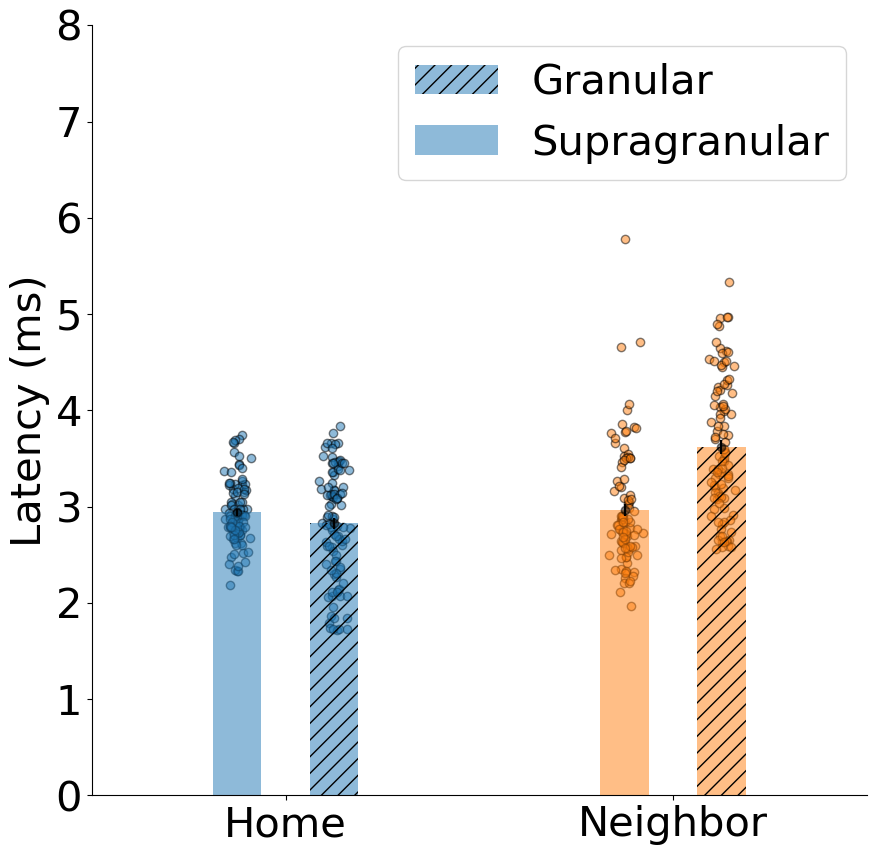

In [113]:
# use C:\Users\jjudge3\Desktop\Data\crossing_PPR\L23_vs_L4_NBQX\L4_NBQX_2\12-18-24\selected_zda\rand_rois02_01_02/export_summary.csv
# to plot latency distributions for each layer/barrel (4 total)
# read in the data
latencies_rand_12_18_24 = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/L4_NBQX_2/12-18-24/selected_zda/rand_rois02_01_02/export_summary.csv'
latencies_rand_12_18_24_df = pd.read_csv(latencies_rand_12_18_24)
latencies_rand_12_18_24_df['latency'] -= 48.6
latencies_rand_12_18_24_df = latencies_rand_12_18_24_df[latencies_rand_12_18_24_df['latency'] > 0]

types_rois = latencies_rand_12_18_24_df['ROI_Set'].unique()
roi_type_map = {
    '2_rois_output__rand_0': ['Home', 'Granular'], 
    '2_rois_output__rand_1': ['Neighbor', 'Granular'],
    '2_rois_supragranular_output__rand_0': ['Home', 'Supragranular'],
    '2_rois_supragranular_output__rand_1': ['Neighbor', 'Supragranular']
}
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
handles = []
for i, roi_type in enumerate(types_rois):
    barrel, layer = roi_type_map[roi_type]
    # get the data for the barrel and layer
    roi_df = latencies_rand_12_18_24_df[latencies_rand_12_18_24_df['ROI_Set'] == roi_type]
    # get the mean and std of the latency
    mean_latency = np.mean(roi_df['latency'])
    sem_latency = sem(roi_df['latency'])
    # plot the data as 4 bars, with error bars and scatter points for each layer/barrel
    color = 'tab:blue' if barrel == 'Home' else 'tab:orange'
    hatch = '//' if layer == 'Granular' else None

    x_loc = 0 if barrel == 'Home' else 1
    x_loc += 0.125 if layer == 'Granular' else -0.125

    l1 = ax.bar(x_loc, mean_latency, yerr=sem_latency, width=.125, color=color, hatch=hatch, alpha=0.5)
    ax.errorbar(x_loc, mean_latency, yerr=sem_latency, fmt='o', color='black', alpha=0.5)
    x_jitter = np.random.normal(0, 0.015, size=len(roi_df['latency']))
    ax.scatter(x_loc + x_jitter, roi_df['latency'], color=color, alpha=0.5, edgecolors='black')
    handles.append(l1)

    print('Mean latency for ' + barrel + ' ' + layer + ': ' + str(mean_latency) + ' ± ' + str(sem_latency))

ax.legend(handles=[handles[0], handles[2]], labels=['Granular', 'Supragranular'], loc='upper right')
ax.set_ylim(0, 8)
ax.set_xlim(-0.5, 1.5)
ax.set_xticks([0, 1])

# remove spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Latency (ms)')
plt.savefig(output_fig_dir + 'latency_distributions_rand_rois.png')
plt.show()

In [114]:
# load PPR data and take just the first-pulse rows for IPI = 100 to use as more single-pulse data (medial/lateral)
ppr_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/export_summary_backup_coronal.csv'
ppr_coronal_df = pd.read_csv(ppr_data)
ppr_coronal_df['latency'] -= 78.78  # measured via PhotoZ for IPI == 100 pulse 1
# load PPR catalog
ppr_catalog = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR/ppr_catalog_backup-coronal-only.csv'
ppr_catalog_df = pd.read_csv(ppr_catalog)

# only keep zda_file, IPI, and is_single_pulse_control columns
ppr_catalog_df = ppr_catalog_df[['zda_file', 'IPI', 'is_single_pulse_control']]

# parse slice, location, and recording numbers from zda_file and store in new columns
ppr_catalog_df['zda_id'] = ppr_catalog_df['zda_file'].apply(lambda x: x.split('/')[-1].split('.')[0])
ppr_catalog_df['Slice'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[0]))
ppr_catalog_df['Location'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[1]))
ppr_catalog_df['Recording'] = ppr_catalog_df['zda_id'].apply(lambda x: int(x.split('_')[2]))

# parse date from zda_file column. It is in format "/mm-dd-yy/", use pattern matching to extract date (regex)
# Function to extract date using regex
def extract_date(filename):
    match = re.search(r'(\d{2}-\d{2}-\d{2})', filename)
    if match:
        # remove zero padding from day and month
        m,d,y = match.group(0).split('-')
        d = str(int(d))
        m = str(int(m))
        return f"{m}/{d}/20{y}"
    return None

ppr_catalog_df['Date'] = ppr_catalog_df['zda_file'].apply(extract_date)

# merge the two dataframes, using date, slice, location, and recording as keys
ppr_coronal_df = ppr_coronal_df.merge(ppr_catalog_df, on=['Date', 'Slice', 'Location', 'Recording'])

# drop the zda_file column
ppr_coronal_df.drop('zda_file', axis=1, inplace=True)

# only keep the first pulse for IPI = 100 and single pulse controls only
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['is_single_pulse_control'] == 1]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['IPI'] == 100]

# keep only with substring 'pulse1' in the 'ROI_Set' column
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['ROI_Set'].str.contains('pulse1')]

# filter out columns with Home in Medial/Lateral
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Medial/Lateral'] != 'Home']

# remove rows with negative halfwidth or latency
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['halfwidth'] > 0]
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['latency'] > 0]

# add Layer column and fill with 'L4'
ppr_coronal_df['Layer'] = 'L4'
ppr_coronal_df['drug'] = 'ACSF'

# to avoid double counts, remove rows from Date == ['12/18/2024' '12/20/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/18/2024']
ppr_coronal_df = ppr_coronal_df[ppr_coronal_df['Date'] != '12/20/2024']

ppr_coronal_df



,ROI,amp,latency,halfwidth,X_Center,Y_Center,ROI_Set,Date,Slice,Location,Recording,trace,trace_non_polyfit,amp_array,Medial/Lateral,IPI,is_single_pulse_control,zda_id,Layer,drug
91,2,2.432550,5.5113,18.3610,53.121780,52.351288,2_rois pulse1,1/2/2025,2,2,5,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,02_02_05,L4,ACSF
187,2,1.856520,3.6446,16.8169,53.754098,48.061475,1_rois pulse1,1/7/2025,1,2,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,01_02_11,L4,ACSF
311,2,1.800210,3.2945,11.9526,60.164021,62.899471,2_rois pulse1,1/7/2025,2,5,26,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,02_05_26,L4,ACSF
385,2,1.992990,3.9166,26.4890,30.245370,50.333333,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,03_02_13,L4,ACSF
386,3,1.526330,4.5569,29.9288,70.971264,22.959770,3_rois-3-barrels pulse1,1/7/2025,3,2,13,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,03_02_13,L4,ACSF
515,2,2.797810,4.1902,15.5445,52.301075,60.688172,4_rois pulse1,1/7/2025,4,2,16,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Lateral,100,1,04_02_16,L4,ACSF
1030,2,0.749263,2.8437,16.8471,45.560403,52.040268,1_rois pulse1,12/23/2024,1,3,11,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,C:/Users/jjudge3/Desktop/Data/crossing_PPR/PPR...,Medial,100,1,01_03_11,L4,ACSF


Medial: 7
Lateral: 8


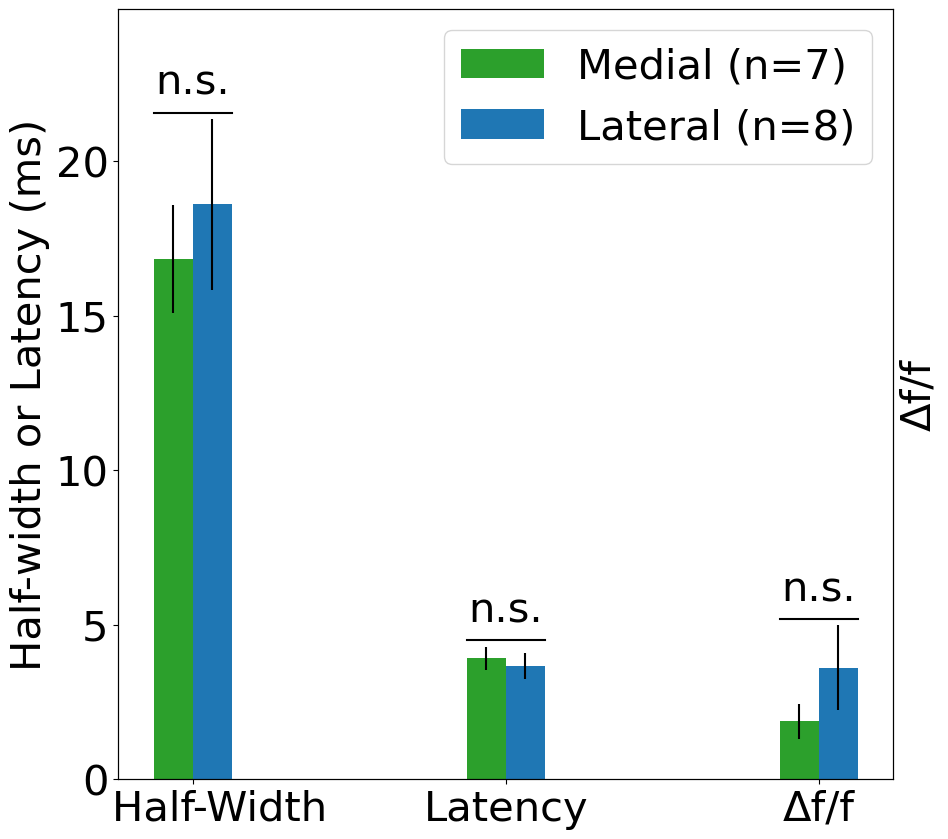

In [115]:


# plot the data that has 'Medial/Lateral' column populated. Restrict to L4 and ACSF and neighbor barrels (ROI > 1)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot only for L4, not for L2/3. Compare latency, half-width, and amplitude for medial vs lateral neighbor barrels
directions = ['Medial', 'Lateral']
handles = []

sample_sizes = {dir: [] for dir in directions}
for i, direction in enumerate(directions):
    color = 'tab:blue' if direction == 'Lateral' else 'tab:green'
    for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
        # get the data for the direction
        direction_list = []
        for df in [hw_lat_df, ppr_coronal_df]:
            direction_df = df[(df['Layer'] == 'L4') & 
                                    (df['drug'] == 'ACSF') & 
                                    (df['ROI'] > 1) & 
                                    (df['Medial/Lateral'] == direction)]
            direction_list += list(direction_df[metric])
        direction_list = np.array(direction_list)
        # plot the data
        l1 = ax.bar(j + i / 8 - 1/16, 
                        np.mean(direction_list), 
                        yerr=sem(direction_list), 
                        width=.125,
                        color=color, label=direction)
        handles.append(l1)

        if j == 0:
            # print sample size for each direction
            print(direction + ':', len(direction_list))
            sample_sizes[direction].append(len(direction_list))

# legend: Medial in black, Lateral in green
ax.legend(handles=[handles[0], handles[-1]], labels=['Medial (n=' + str(sum((sample_sizes['Medial']))) + ")", 
                                                     'Lateral (n=' + str(sum((sample_sizes['Lateral']))) + ")"], 
                                            loc='upper right')

ax.set_ylabel('Half-width or Latency (ms)')
# right-side y-axis label
ax2 = ax.twinx()
ax2.set_ylabel('Δf/f')
ax2.set_yticks([])

ax.set_xticks([0, 1, 2])
ax.set_xticklabels(['    Half-Width', 'Latency', 'Δf/f'])

# significance testing Medial vs Lateral
for j, metric in enumerate(['halfwidth', 'latency', 'amp']):
    med1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') & 
                                        (ppr_coronal_df['drug'] == 'ACSF') & 
                                        (ppr_coronal_df['ROI'] > 1) & 
                                        (ppr_coronal_df['Medial/Lateral'] == 'Medial')][metric]
    lat1 = ppr_coronal_df[(ppr_coronal_df['Layer'] == 'L4') &
                                        (ppr_coronal_df['drug'] == 'ACSF') &
                                        (ppr_coronal_df['ROI'] > 1) &
                                        (ppr_coronal_df['Medial/Lateral'] == 'Lateral')][metric]
    med2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Medial')][metric]
    lat2 = hw_lat_df[(hw_lat_df['Layer'] == 'L4') &
                                        (hw_lat_df['drug'] == 'ACSF') &
                                        (hw_lat_df['ROI'] > 1) &
                                        (hw_lat_df['Medial/Lateral'] == 'Lateral')][metric]
    med = list(med1) + list(med2)
    lat = list(lat1) + list(lat2)
    t_stat, p_val = ttest_ind(med, lat, equal_var=False)
    # draw bar between the two boxes # ax.get_ylim()[1] * 0.8
    med = np.array(med)
    lat = np.array(lat)
    height = max(med.mean() + sem(med), lat.mean() + sem(lat)) + 0.2

    ax.plot([j - 1/8, j + 1/8], [height, height], color='black')
    if p_val < 0.05:
        ax.text(j, height + .6, 'p < 0.05', ha='center')

        
    else:
        ax.text(j, height + .6, 'n.s.', ha='center')

# raise the y-axis limit by 10% to make room for the significance testing
ax.set_ylim(0, ax.get_ylim()[1] * 1.1)


plt.savefig('C:/Users/jjudge3/Desktop/Data/crossing_PPR/L23_vs_L4_NBQX/hw_lat_amp_medial_lateral.png')
plt.show()


t-test between home and neighbor: t = 0.7660142938426769, p = 0.45276422671002037
home: 132.02288046840863, 9.821862000736079
neighbor: 123.2438108460004, 5.9058410694381385


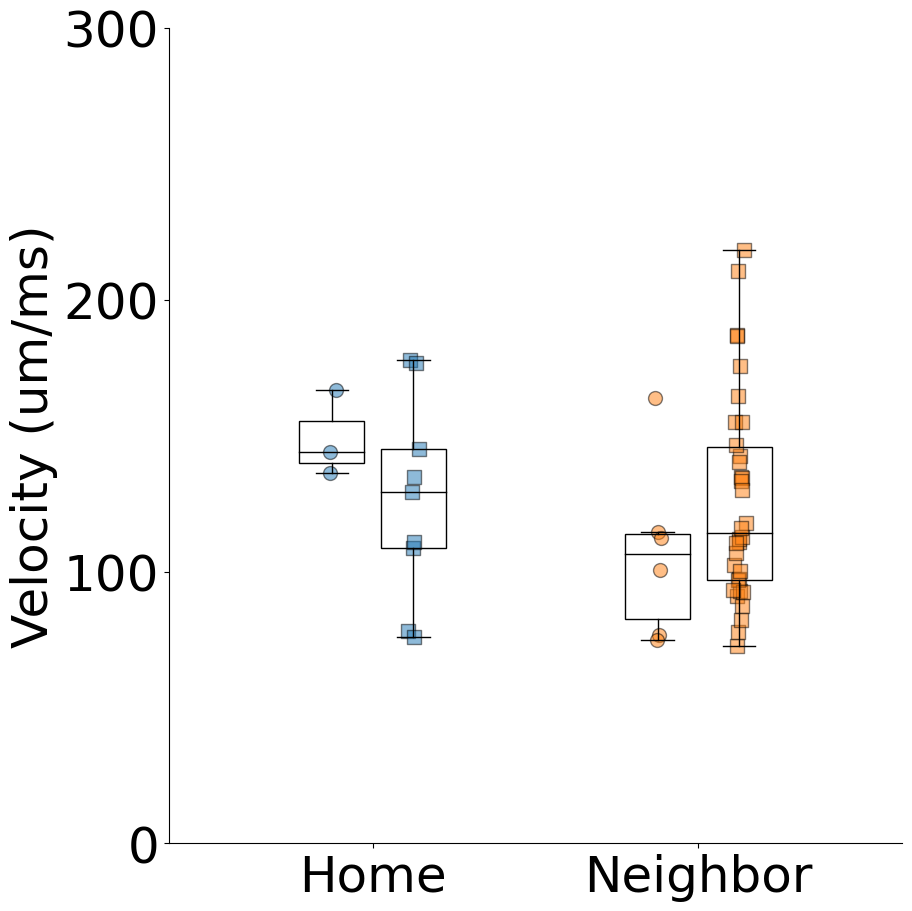

In [116]:
# using C:\Users\jjudge3\Desktop\Data\crossing_PPR\ladder_velocity_regimes.csv,
# plot the velocity distribution for each regime, taking instantaneous velocity from the ladder_df
ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
    # get the corresponding subset in ladder_df, for drug == 'ACSF'
    ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                            (ladder_df['Slice'] == slic) & 
                            (ladder_df['Location'] == loc) & 
                            (ladder_df['Recording'] == rec) & 
                            (ladder_df['drug'] == 'ACSF')]

    # exclude if Stim_Distance < 50 um
    ladder_row = ladder_row[ladder_row['Stim_Distance'] > 100]
    
    if ladder_row.empty:
        continue

    # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
    # get the instantaneous velocity for this range

    start = row['velocity_regime_start']
    end = row['velocity_regime_end']

    regime_type = row['velocity_regime_type']

    # get the instantaneous velocity for this range
    regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                            (ladder_row['Dist_from_home_barrel'] <= end)]

    #print(regime_df['instantaneous_velocity'])

    if regime_df.empty:
        continue
    layer = regime_df['Layer'].values[0]
    #print(layer)

    if regime_type not in regime_velocities:
        regime_velocities[regime_type] = {}
    if layer not in regime_velocities[regime_type]:
        regime_velocities[regime_type][layer] = []
    
    # filter outliers > 700 um/ms and -700 um/ms
    regime_df = regime_df[(regime_df['instantaneous_velocity'] < 1000) & (regime_df['instantaneous_velocity'] > -1000)]
    # filter outliers < 60 um/ms
    regime_df = regime_df[(regime_df['instantaneous_velocity'] > 60) | (regime_df['instantaneous_velocity'] < -60)]
    #if regime_type == 'septal':
    #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
    avg_vel = np.mean(np.abs(regime_df['instantaneous_velocity']))

    # outliers 
    if (avg_vel < 250 and avg_vel > 60):
        regime_velocities[regime_type][layer].append(avg_vel)
    

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for j, layer in enumerate(['L2/3', 'L4']):
    regimes = []
    for i, regime_type in enumerate(['home', 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][layer]
        # boxplot for each regime. transparent box, black outline, no outliers
        ax.boxplot(velocities, positions=[i + j * 0.25 - 0.125], widths=0.2, patch_artist=True, 
                    boxprops=dict(facecolor='none', color='black'), 
                    showfliers=False, medianprops=dict(color='black'))

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if layer == 'L2/3' else 's'), label=layer)
        regimes.append(regime_type)

# significance testing between regimes
for i_ in range(len(regimes)):
    for j_ in range(i_ + 1, len(regimes)):
        regime1 = regime_velocities[regimes[i_]]['L2/3'] + regime_velocities[regimes[i_]]['L4']
        regime2 = regime_velocities[regimes[j_]]['L2/3'] + regime_velocities[regimes[j_]]['L4']
        t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
        print(f"t-test between {regimes[i_]} and {regimes[j_]}: t = {t_stat}, p = {p_val}")
        # print mean and sem for each regime
        print(f"{regimes[i_]}: {np.mean(regime1)}, {sem(regime1)}")
        print(f"{regimes[j_]}: {np.mean(regime2)}, {sem(regime2)}")
        if 'home' in [regimes[i_], regimes[j_]] and 'septal' in [regimes[i_], regimes[j_]]:
            continue  # don't show significance testing between home and septal
        if p_val < 0.05:
            ax.text((i_ + j_) / 2, max(max(regime1), max(regime2)) + 12, 'p < 0.05', ha='center')

            # draw line between the two boxes
            ax.plot([i_, j_], [max(max(regime1), max(regime2)) + 10.5, max(max(regime1), max(regime2)) + 10.5], color='black')
        
ax.set_xticks(range(len(regimes)))
ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Velocity (um/ms)')

ax.set_ylim(0, 300)
ax.set_yticks([0, 100, 200, 300])

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[3]]
#ax.legend(handles=handles, labels=['L2/3', 'L4'], loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_velocity_regimes.png')


No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  10/23/2024 1 2 3
No data found for pulse 2  10/23/2024 1 2 3
No data f

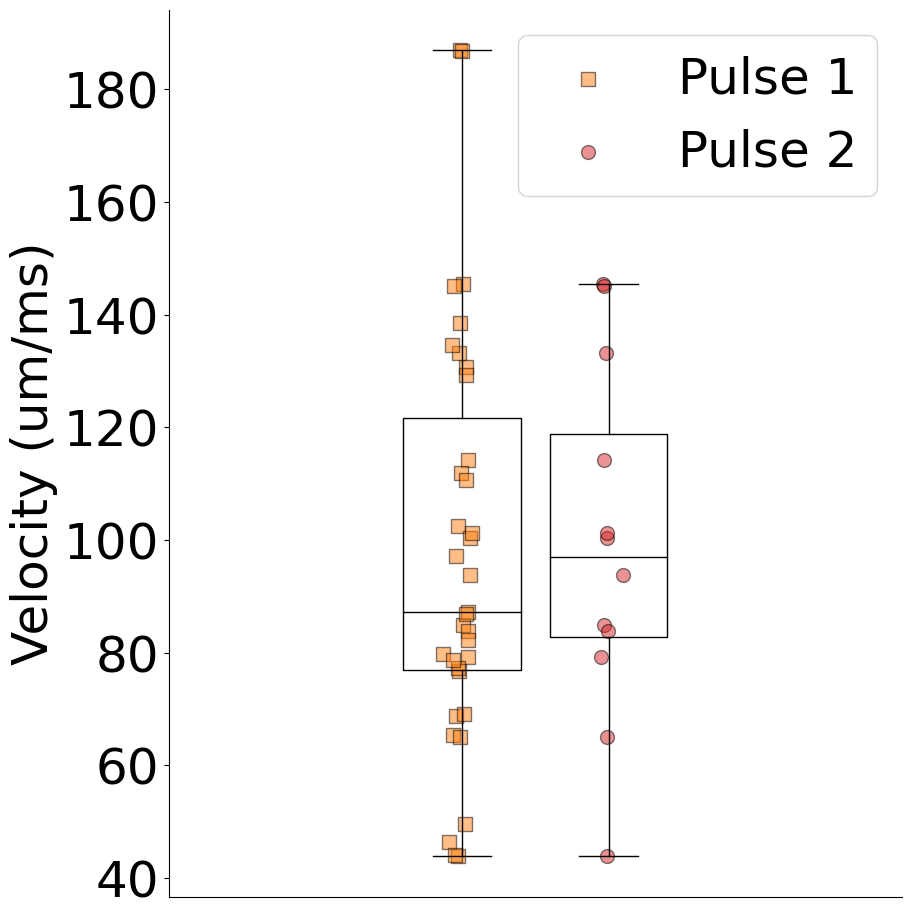

In [117]:
# compare pulse 2 half-widths and velocities (Is_Pulse_2 == True) to pulse 1 (all other)
# all in ladder_df
# piggybacking off the ladder velocity regimes created for the first pulse

# for all values of Is_Pulse_2 that are not True (such as nan), set to False
ladder_df['Is_Pulse_2'] = ladder_df['Is_Pulse_2'].fillna(False)

ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    for pulse in [True, False]:
        
        date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
        # get the corresponding subset in ladder_df, for drug == 'ACSF'
        ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Location'] == loc) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['drug'] == 'ACSF') &
                                (ladder_df['Layer'] == 'L4') &
                                (ladder_df['Is_Pulse_2'] == pulse)]

        # exclude if Stim_Distance < 50 um
        ladder_row = ladder_row[ladder_row['Stim_Distance'] > 50]
        
        if ladder_row.empty:
            if pulse:
                print('No data found for pulse 2 ', date, slic, loc, rec)
            continue

        # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
        # get the instantaneous velocity for this range

        start = row['velocity_regime_start']
        end = row['velocity_regime_end']

        regime_type = row['velocity_regime_type']

        # get the instantaneous velocity for this range
        regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                                (ladder_row['Dist_from_home_barrel'] <= end)]

        #print(regime_df['instantaneous_velocity'])

        if regime_df.empty:
            continue

        if regime_type not in regime_velocities:
            regime_velocities[regime_type] = {}
        if pulse not in regime_velocities[regime_type]:
            regime_velocities[regime_type][pulse] = []
        
        # filter outliers > 700 um/ms and -700 um/ms
        #regime_df = regime_df[(regime_df['instantaneous_velocity'] < 700) & (regime_df['instantaneous_velocity'] > -700)]
        #if regime_type == 'septal':
        #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
        avg_vel = np.mean(np.abs(regime_df['instantaneous_velocity']))

        # outliers
        if avg_vel < 300 and avg_vel > 40:
            regime_velocities[regime_type][pulse].append(avg_vel)
    
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

for j, pulse_number in enumerate(['Pulse 1', 'Pulse 2']):
    pulse = (pulse_number == 'Pulse 2')

    regimes = []
    for i, regime_type in enumerate([ 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][pulse]
        # boxplot for each regime. transparent box, black outline, no outliers
        ax.boxplot(velocities, positions=[i + j * 0.25 - 0.125], widths=0.2, patch_artist=True, 
                    boxprops=dict(facecolor='none', color='black'), 
                    showfliers=False, medianprops=dict(color='black'))

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:red' if pulse else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if pulse else 's'), label=pulse_number)
        regimes.append(regime_type)

# significance testing between pulse 1 and pulse 2
for reg in ['neighbor']:
    regime1 = regime_velocities[reg][True]
    regime2 = regime_velocities[reg][False]
    t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
    print("mean pulse 1:", np.mean(regime1), "±", sem(regime1))
    print("mean pulse 2:", np.mean(regime2), "±", sem(regime2))
    print(f"t-test between  pulse 2 and  pulse 1: t = {t_stat}, p = {p_val}")

    if p_val < 0.05:
        ax.text((i_ + j_) / 2, max(max(regime1), max(regime2)) + 12, 'p < 0.05', ha='center')

        # draw line between the two boxes
        ax.plot([i_, j_], [max(max(regime1), max(regime2)) + 10.5, max(max(regime1), max(regime2)) + 10.5], color='black')
        
#ax.set_xticks(range(len(regimes)))
#ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Velocity (um/ms)')
ax.set_xticks([])
#ax.set_ylim(0, 300)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[1]]
labels = [ax.get_children()[0].get_label(), ax.get_children()[1].get_label()]
ax.legend(handles=handles, labels=labels, loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_velocity_regimes_pulse2.png')


In [118]:
print(ladder_df.columns)

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file', 'Medial/Lateral'],
      dtype='object')


No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  6/26/2024 1 1 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 3 2 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/1/2024 4 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/15/2024 2 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  7/17/2024 3 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/9/2024 1 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 2 1 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  12/11/2024 3 2 1
No data found for pulse 2  10/23/2024 1 2 3
No data found for pulse 2  10/23/2024 1 2 3
No data f

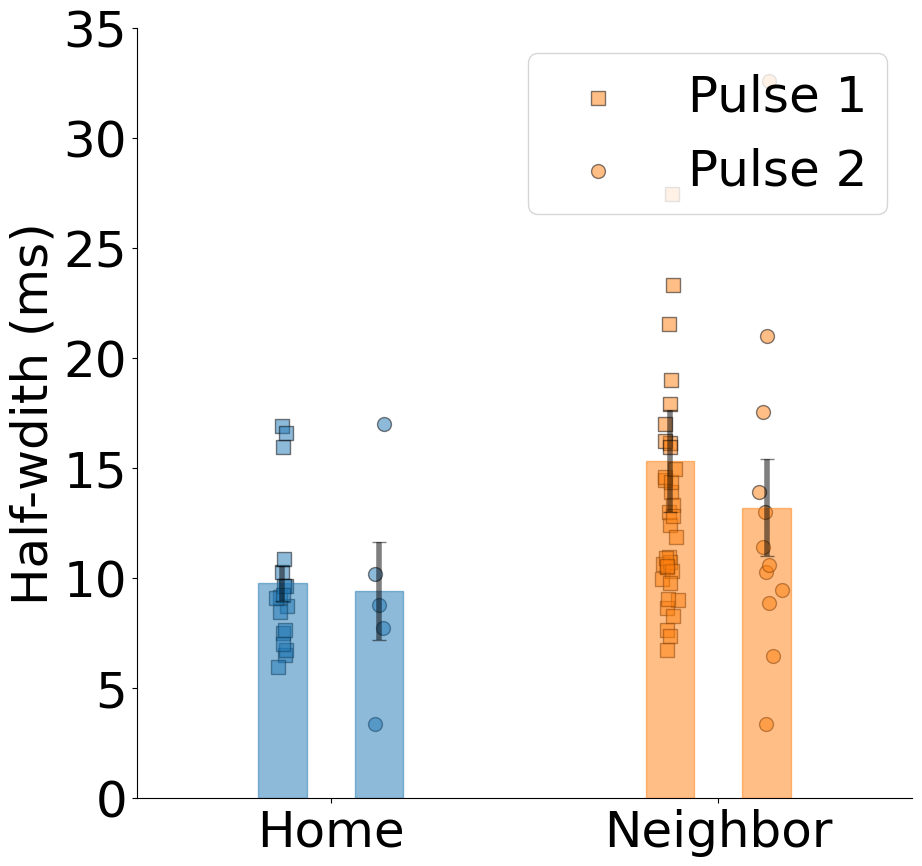

In [119]:
# plot pulse 1 halfwidth versus pulse 2 halfwidth

# set fontsize
plt.rcParams.update({'font.size': 36})

regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    for pulse in [True, False]:
        
        date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
        # get the corresponding subset in ladder_df, for drug == 'ACSF'
        ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                                (ladder_df['Slice'] == slic) & 
                                (ladder_df['Location'] == loc) & 
                                (ladder_df['Recording'] == rec) & 
                                (ladder_df['drug'] == 'ACSF') &
                                (ladder_df['Layer'] == 'L4') &
                                (ladder_df['Is_Pulse_2'] == pulse)]

        # exclude if Stim_Distance < 50 um
        ladder_row = ladder_row[ladder_row['Stim_Distance'] > 50]
        
        if ladder_row.empty:
            if pulse:
                print('No data found for pulse 2 ', date, slic, loc, rec)
            continue

        # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
        # get the instantaneous velocity for this range

        start = row['velocity_regime_start']
        end = row['velocity_regime_end']

        regime_type = row['velocity_regime_type']

        # get the instantaneous velocity for this range
        regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                                (ladder_row['Dist_from_home_barrel'] <= end)]

        #print(regime_df['instantaneous_velocity'])

        if regime_df.empty:
            continue

        if regime_type not in regime_velocities:
            regime_velocities[regime_type] = {}
        if pulse not in regime_velocities[regime_type]:
            regime_velocities[regime_type][pulse] = []
        
        # filter outliers > 700 um/ms and -700 um/ms
        #regime_df = regime_df[(regime_df['instantaneous_velocity'] < 700) & (regime_df['instantaneous_velocity'] > -700)]
        #if regime_type == 'septal':
        #    print(regime_df[['instantaneous_velocity', 'Date', 'Dist_from_home_barrel']])
        avg_vel = np.mean(np.abs(regime_df['halfwidth']))

        # outliers
        if avg_vel > 0:
            regime_velocities[regime_type][pulse].append(avg_vel)
    
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
print(regime_velocities)
for j, pulse_number in enumerate(['Pulse 1', 'Pulse 2']):
    pulse = (pulse_number == 'Pulse 2')

    regimes = []
    for i, regime_type in enumerate(['home', 'neighbor']): #, 'septal']):
        velocities = regime_velocities[regime_type][pulse]
        # boxplot for each regime. transparent box, black outline, no outliers
        # bar plot with error bars. caps on error bars, and color the error bars the same as the bar color
        ax.bar(i + j * 0.25 - 0.125, 
                np.mean(velocities), 
                width=.125,
                color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                edgecolor=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'), alpha=0.5)
        ax.errorbar(i + j * 0.25 - 0.125,
                    np.mean(velocities), 
                    yerr=sem(velocities), 
                    color='black', #('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'), 
                    capsize=5, elinewidth=4, alpha=0.5)

        x_jitter = np.random.normal(0, 0.01, len(velocities))
        
        ax.scatter(x_jitter + i + j * 0.25 - 0.125, velocities,
                     alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                     edgecolors='black', s=100, marker=('o' if pulse else 's'), label=pulse_number)
        regimes.append(regime_type)

# significance testing between pulse 1 and pulse 2
for reg in ['home', 'neighbor']:
    regime1 = regime_velocities[reg][True]
    regime2 = regime_velocities[reg][False]
    t_stat, p_val = ttest_ind(regime1, regime2, equal_var=False)
    pulse = 'Pulse 2' if pulse else 'Pulse 1'
    print(f"t-test {reg} between Pulse 1 and Pulse2 for {pulse}: t = {t_stat}, p = {p_val}")
    
    if p_val < 0.05:
        height = 30
        i_, j_ = 0, 1
        #ax.text((i_ + j_) / 2, height + 2, 'p < 0.05', ha='center')
        #ax.plot([i_, j_], [height, height], color='black')
        
ax.set_xticks(range(len(regimes)))
ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Half-wdith (ms)')

ax.set_xlim(-0.5, 1.5)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
#handles = ax.get_children()
handles =ax.get_children()
handles = [handles[3], handles[7]]  # only first two bars
ax.legend(handles=handles, labels=['Pulse 1', 'Pulse 2'], loc='upper right')
ax.set_ylim(0, 35)

plt.savefig('P:/John/crossing-paper/input/ladder_halfwidth_regimes_pulse2.png')
plt.show()


In [120]:
ladder_df.columns

Index(['ROI', 'amp', 'snr', 'latency', 'halfwidth', 'Stim_Distance',
       'X_Center', 'Y_Center', 'ROI_Set', 'Date', 'Slice', 'Location',
       'Recording', 'trace', 'drug', 'Layer', 'Coronal/Sagittal', 'IPI',
       'Is_Pulse_2', 'Dist_from_home_barrel', 'resides_in_barrel',
       'instantaneous_velocity', 'ROI file', 'Medial/Lateral'],
      dtype='object')

In [121]:
import statsmodels.formula.api as smf
# mixed effects model with distance from home barrel as a fixed effect
# and Date, Slice, Location, Recording as random effects
# Dependent variable: halfwidth
# Independent variable: Dist_from_home_barrel

data = ladder_df[(ladder_df['Is_Pulse_2'] == True) &
                    (ladder_df['Layer'] == 'L4') & 
                    (ladder_df['drug'] == 'ACSF') & 
                    (ladder_df['Stim_Distance'] > 200) & 
                    #(ladder_df['Dist_from_home_barrel'] > 0) &
                    (ladder_df['halfwidth'] > 0) 
                    ]
#data.loc['Dist_from_home_barrel'] = np.abs(data['Dist_from_home_barrel']).astype(float)
data['Date_Slice'] = data['Date'] + '_' + data['Slice'].astype(str)
print(len(data))
model = smf.mixedlm('halfwidth ~ Stim_Distance',
                    data=data,
                    groups=data['Date_Slice'])
results = model.fit()

# Print the results
print(results.summary())

2203
         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: halfwidth 
No. Observations: 2203    Method:             REML      
No. Groups:       26      Scale:              55.7678   
Min. group size:  9       Log-Likelihood:     -7596.7076
Max. group size:  172     Converged:          Yes       
Mean group size:  84.7                                  
--------------------------------------------------------
              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept     18.236    1.194 15.270 0.000 15.895 20.576
Stim_Distance -0.020    0.003 -5.820 0.000 -0.027 -0.013
Group Var     14.214    0.581                           



C:\Users\jjudge3\AppData\Local\Temp\ipykernel_13668\720100097.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Date_Slice'] = data['Date'] + '_' + data['Slice'].astype(str)


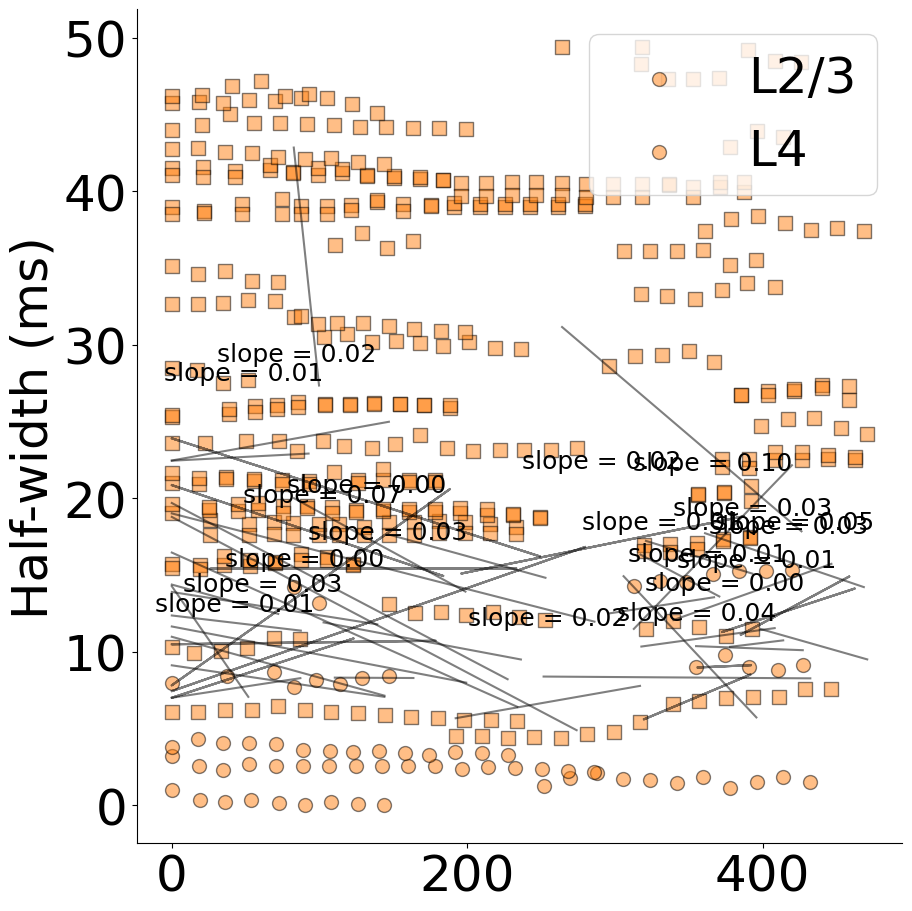

In [122]:
# using C:\Users\jjudge3\Desktop\Data\crossing_PPR\ladder_velocity_regimes.csv,
# plot halfwidth versus distance from home barrel for neighbor regime
ladder_regimes_data = 'C:/Users/jjudge3/Desktop/Data/crossing_PPR/ladder_velocity_regimes.csv'
ladder_regimes_df = pd.read_csv(ladder_regimes_data)
# ladder regimes has columns: Date, Slice, Location, Recording, velocity_regime_start, velocity_regime_end, velocity_regime_type

# set fontsize
plt.rcParams.update({'font.size': 36})
baseline = 0
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
regime_velocities = {}
for i, row in ladder_regimes_df.iterrows():
    date, slic, loc, rec = row['Date'], row['Slice'], row['Location'], row['Recording']
    # get the corresponding subset in ladder_df, for drug == 'ACSF'
    ladder_row = ladder_df[(ladder_df['Date'] == date) & 
                            (ladder_df['Slice'] == slic) & 
                            (ladder_df['Location'] == loc) & 
                            (ladder_df['Recording'] == rec) & 
                            (ladder_df['drug'] == 'ACSF')]

    # exclude if Stim_Distance < 50 um
    ladder_row = ladder_row[ladder_row['Stim_Distance'] > 100]
    
    if ladder_row.empty:
        continue

    # the range [velocity_regime_start, velocity_regime_end] corresponds to the Dist_from_home_barrel
    # get the instantaneous velocity for this range

    start = row['velocity_regime_start']
    end = row['velocity_regime_end']

    regime_type = row['velocity_regime_type']
    if regime_type != 'neighbor':
        continue

    # get the instantaneous velocity for this range
    regime_df = ladder_row[(ladder_row['Dist_from_home_barrel'] >= start) & 
                            (ladder_row['Dist_from_home_barrel'] <= end)]

    #print(regime_df['instantaneous_velocity'])

    if regime_df.empty:
        continue
    layer = regime_df['Layer'].values[0]
    #print(layer)

    if regime_type not in regime_velocities:
        regime_velocities[regime_type] = {}
    if layer not in regime_velocities[regime_type]:
        regime_velocities[regime_type][layer] = []
    
    regime_df = regime_df[(regime_df['halfwidth'] > 0)]
    #if regime_type == 'septal':
    hw = np.abs(regime_df['halfwidth'])
    dist = np.abs(regime_df['Dist_from_home_barrel'])

    # linear fit to the data
    coeffs = np.polyfit(dist, hw, 1)
    y_fit = np.polyval(coeffs, dist)
    ax.plot(dist, y_fit, color='black', alpha=0.5)

    # label the slope if it is significant
    slope = coeffs[0]
    if slope > 0:
        ax.text(np.mean(dist), np.mean(hw) + 5, f'slope = {slope:.2f}', ha='center', fontsize=18)

    # normalize the halfwidths to 0-1
    hw = (hw - np.min(hw)) / (np.max(hw) - np.min(hw))
    # outliers
    #if avg_vel < 300 and avg_vel > 40:
    regime_velocities[regime_type][layer].append([hw, dist])
    ax.scatter(dist, hw + baseline, alpha=0.5, color=('tab:blue' if regime_type == 'home' else 'tab:orange' if regime_type == 'neighbor' else 'tab:green'),
                edgecolors='black', s=100, marker=('o' if layer == 'L2/3' else 's'), label=layer)
    baseline += 1.1
    


        
#ax.set_xticks(range(len(regimes)))
#ax.set_xticklabels(['Home', 'Neighbor'])
ax.set_ylabel('Half-width (ms)')

#ax.set_ylim(0, 30)

# turn off spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# legend: only first 2 handles
handles = [ax.get_children()[0], ax.get_children()[3]]
ax.legend(handles=handles, labels=['L2/3', 'L4'], loc='upper right')
plt.tight_layout()
plt.savefig('P:/John/crossing-paper/input/ladder_halfwidth_neighbor_regimes.png')


## 